In [1]:
import numpy as np
import os
import pandas as pd
import math
import pickle
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib import gridspec
import seaborn as sns
sns.set_style("ticks")
hfont = {'fontname':'Myriad Pro'}

import sys
sys.path.append(os.path.join(os.getcwd(), "functions"))
import helper_functions as hfn
import AIC_functions as aicfn
import plotting_functions as plotfn

In [2]:
 # load models from lmfit package
from lmfit import Model
from lmfit.models import PowerLawModel
from lmfit.models import LognormalModel
from lmfit.models import ExponentialModel
from lmfit.models import LinearModel
from lmfit.models import QuadraticModel

In [3]:
def growth(x, i_max, ks):
    # x = starter number
    # we fit y = input number
    return i_max * x / (ks + x)

def hill(x, i_max, ks,n):
    return i_max / (1 + (ks/x)**n)

# create lmfit models

In [4]:
# create lmfit models for fits
model_pl = PowerLawModel()
model_exp = Model(aicfn.expfunc)
model_ln = LognormalModel()
model_lm = LinearModel()
model_quad = QuadraticModel()
gmodel = Model(growth)
hmodel = Model(hill)

# Plotting functions

In [5]:
def plot_nls_cond(df, savepath):
    f = plt.figure(figsize = (10,10))
    for condition in df['condition'].unique():
        thisdf = df[df['condition'] == condition]
        plt.plot(thisdf.starter, thisdf.input, 'o', label = condition)
    xlabel = 'starters'
    ylabel = 'inputs'
    plt.xlim(0, df.starter.max() + 0.1*df.starter.max())
    plt.ylim(0, df.input.max() + 0.1*df.input.max())
    plt.xlabel(xlabel, fontsize = 14)
    plt.ylabel(ylabel, fontsize = 14)
    # plt.legend(fontsize=12, loc='center left', bbox_to_anchor=(1, 0.87))

    plt.savefig(os.path.join(savepath, 'all_data_conditions.png'))
    
def plot_nls(df, savepath):
    f = plt.figure(figsize = (7,7))

    plt.scatter(df.starter, df.input, s=80, facecolors='none', edgecolors='k')
    xlabel = '#starters'
    ylabel = '#inputs'
    plt.xlim(0, df.starter.max() + 0.1*df.starter.max())
    plt.ylim(0, df.input.max() + 0.1*df.input.max())
    plt.xlabel(xlabel, fontsize = 18)
    plt.ylabel(ylabel, fontsize = 18)

    plt.savefig(os.path.join(savepath, 'all_data.png'))

In [6]:
def plot_ls_cond(df, savepath):
    f = plt.figure(figsize = (10,10))
    for condition in df['condition'].unique():
        thisdf = df[df['condition'] == condition]
        plt.plot(thisdf.starter, thisdf.input, 'o', label = condition)
    xlabel = r'$\mathrm{Log}_{10}(starters)$'
    ylabel = r'$\mathrm{Log}_{10}(inputs)$'
    plt.xlim(0, df.starter.max() + 0.25)
    plt.ylim(0, df.input.max() + 0.25)
    plt.xlabel(xlabel, fontsize = 14)
    plt.ylabel(ylabel, fontsize = 14)
    plt.legend(fontsize=12, loc='center left', bbox_to_anchor=(1, 0.87))

    plt.savefig(os.path.join(savepath, 'all_data_conditions.png'))
    
def plot_ls(df, savepath):
    f = plt.figure(figsize = (7,7))
    plt.scatter(df.starter, df.input, s=80, facecolors='none', edgecolors='k')
    xlabel = r'$\mathrm{Log}_{10}(starters)$'
    ylabel = r'$\mathrm{Log}_{10}(inputs)$'
    plt.xlim(0, df.starter.max() + 0.25)
    plt.ylim(0, df.input.max() + 0.25)
    plt.xlabel(xlabel, fontsize = 18)
    plt.ylabel(ylabel, fontsize = 18)

    plt.savefig(os.path.join(savepath, 'all_data.png'))

In [7]:
colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
sns.set_palette = sns.xkcd_palette(colors)

In [8]:
def plot_models_ls(df, res_lm, res_quad, res_pl, res_exp, savepath):
    f = plt.figure(figsize = (7,7))

    ax = f.add_subplot(111)
    ax.tick_params(labelsize=12)

    plt.scatter(df['starter'].values, df['input'].values, label='data', color = 'k', alpha = 0.5)
    list_fits_ln = [res_lm.best_fit, res_quad.best_fit, res_pl.best_fit, res_exp.best_fit]
    fit_type = ['linear', 'quadratic', 'power-law', 'exponential']

    for i, fit in enumerate(list_fits_ln):
        plt.plot(df['starter'].values, fit, color=sns.xkcd_palette(colors)[i], label = fit_type[i])
    plt.legend(fontsize=12, loc='center left', bbox_to_anchor=(1, 0.87))
    plotfn.format_scientnot()
    plt.locator_params(axis='x', nbins=7)
    plt.ylim((0, ymax_lin))
    plt.xlabel('starters', fontsize = 15)
    plt.ylabel('inputs', fontsize = 15)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    plt.savefig(os.path.join(savepath, 'all_models_linscale.png'))
    plt.savefig(os.path.join(savepath, 'all_models_linscale.eps'), format = 'eps')

def plot_models_nls(df, res_lm, res_quad, savepath):
    f_log = plt.figure(figsize = (7,7))

    ax = f_log.add_subplot(111)
    ax.tick_params(labelsize=12)

    plt.scatter(df['starter'].values, df['input'].values, label='data', color = 'k', alpha = 0.5)
    list_fits_log = [res_lm.best_fit, res_quad.best_fit]
    fit_type = ['linear', 'quadratic']

    for i, fit in enumerate(list_fits_log):
        plt.plot(df['starter'].values, fit, color=sns.xkcd_palette(colors)[i], label = fit_type[i])
    plt.legend(fontsize=12, loc='center left', bbox_to_anchor=(1, 0.87))

    plt.locator_params(axis='x', nbins=7)
    plt.ylim((0, ymax_log))
    plt.xlabel(r'$\mathrm{Log}_{10}(starters)$', fontsize = 15)
    plt.ylabel(r'$\mathrm{Log}_{10}(starters)$', fontsize = 15)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    plt.savefig(os.path.join(savepath, 'all_models_logscale.png'))
    plt.savefig(os.path.join(savepath, 'all_models_logscale.eps'), format = 'eps')

# define data and save paths

In [9]:
path = os.getcwd()

alldatapath = os.path.join(path, 'data/external_data')

modelpath = os.path.join(path, 'model_selection_external')
hfn.dir_check(modelpath)

In [10]:
datasets = next(os.walk(alldatapath))[1]

Analyzing dataset :  data_Kim_2015


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 12
    # variables        = 2
    chi-square         = 8454745.89
    reduced chi-square = 845474.589
    Akaike info crit   = 165.583982
    Bayesian info crit = 166.553795
    R-squared          = 0.16049043
[[Variables]]
    slope:      9.36560195 +/- 6.77366864 (72.32%) (init = 9.365602)
    intercept:  861.896356 +/- 466.215917 (54.09%) (init = 861.8964)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.822


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 58
    # data points      = 12
    # variables        = 2
    chi-square         = 7123640.41
    reduced chi-square = 712364.041
    Akaike info crit   = 163.528274
    Bayesian info crit = 164.498087
    R-squared          = 0.29266186
[[Variables]]
    amplitude:  305.894777 +/- 326.160881 (106.63%) (init = 1)
    exponent:   0.39516351 +/- 0.25190486 (63.75%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.988
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 12
    # variables        = 2
    chi-square         = 8999865.70
    reduced chi-square = 899986.570
    Akaike info crit   = 166.333763
    Bayesian info crit = 167.303576
    R-squared          = 0.10636305
[[Variables]]
    a:  1094.91334 +/- 394.207497 (36.00%) (init = 1000)
    b: -24

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 12
    # variables        = 3
    chi-square         = 4039080.20
    reduced chi-square = 448786.689
    Akaike info crit   = 158.719451
    Bayesian info crit = 160.174171
    R-squared          = 0.59894165
[[Variables]]
    a: -0.31714068 +/- 0.10110528 (31.88%) (init = -0.3171407)
    b:  57.4891120 +/- 16.1161067 (28.03%) (init = 57.48911)
    c: -358.717581 +/- 516.528317 (143.99%) (init = -358.7176)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.883
    C(a, c) = 0.753
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 66
    # data points      = 12
    # variables        = 2
    chi-square         = 6058743.80
    reduced chi-square = 605874.380
    Akaike info crit   = 161.585277
    Bayesian info crit = 162.555090
    R-squared          = 0.398

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 94
    # data points      = 12
    # variables        = 3
    chi-square         = 3308439.51
    reduced chi-square = 367604.389
    Akaike info crit   = 156.324966
    Bayesian info crit = 157.779686
    R-squared          = 0.67149023
[[Variables]]
    i_max:  1925.50000 +/- 222.613926 (11.56%) (init = 3105)
    ks:     24.7985951 +/- 3434644.99 (13850159.53%) (init = 59)
    n:      39.2326577 +/- 1.6600e+08 (423122938.67%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(ks, n)     = -1.000
    C(i_max, ks) = 0.270
    C(i_max, n)  = -0.270


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family ['Myriad Pro'] not found. Falling back to DejaVu Sans.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 12
    # variables        = 2
    chi-square         = 0.66254147
    reduced chi-square = 0.06625415
    Akaike info crit   = -30.7589453
    Bayesian info crit = -29.7891320
    R-squared          = 0.63356188
[[Variables]]
    slope:      0.88264103 +/- 0.21227064 (24.05%) (init = 0.882641)
    intercept:  1.56432572 +/- 0.35433029 (22.65%) (init = 1.564326)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.978
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 12
    # variables        = 3
    chi-square         = 0.51743148
    reduced chi-square = 0.05749239
    Akaike info crit   = -31.7254179
    Bayesian info crit = -30.2706980
    R-squared          = 0.71381925
[[Variables]]
    a: -0.80219477 +/- 0.50493602 (62.94%) (init = -0.8

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 47
    # data points      = 12
    # variables        = 2
    chi-square         = 7123640.41
    reduced chi-square = 712364.041
    Akaike info crit   = 163.528274
    Bayesian info crit = 164.498087
    R-squared          = 0.29266186
[[Variables]]
    amplitude:  305.845162 +/- 326.251798 (106.67%) (init = 36.67125)
    exponent:   0.39520229 +/- 0.25189304 (63.74%) (init = 0.882641)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.988
Analyzing dataset :  data_Gehrlach


/var/folders/n7/dvksxsf55hxbzrrfm5gv88cwmxqfb7/T/ipykernel_34509/1415228006.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize = (10,10))
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 18
    # variables        = 2
    chi-square         = 2.6612e+09
    reduced chi-square = 1.6632e+08
    Akaike info crit   = 342.609977
    Bayesian info crit = 344.390720
    R-squared          = 0.11062795
[[Variables]]
    slope:      1.32737557 +/- 0.94089928 (70.88%) (init = 1.327376)
    intercept:  15757.7946 +/- 4078.79155 (25.88%) (init = 15757.79)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.667
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 71
    # data points      = 18
    # variables        = 2
    chi-square         = 2.4794e+09
    reduced chi-square = 1.5496e+08
    Akaike info crit   = 341.336100
    Bayesian info crit = 343.116843
    R-squared          = 0.17139405
[[Variables]]
    amplitude:  1573.48115 +/- 2139.58341 (135.98%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 18
    # variables        = 2
    chi-square         = 2.7086e+09
    reduced chi-square = 1.6929e+08
    Akaike info crit   = 342.927863
    Bayesian info crit = 344.708607
    R-squared          = 0.09478180
[[Variables]]
    a:  16972.7200 +/- 3480.75061 (20.51%) (init = 1000)
    b: -21748.7988 +/- 14432.0412 (66.36%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.664
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 18
    # variables        = 3
    chi-square         = 2.3872e+09
    reduced chi-square = 1.5914e+08
    Akaike info crit   = 342.653932
    Bayesian info crit = 345.325047
    R-squared          = 0.20220913
[[Variables]]
    a: -3.3159e-04 +/- 2.5270e-04 (76.21%) (init = -0.0003315897)
    b:  6.71962524 +/- 4.21

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 16
    # data points      = 18
    # variables        = 2
    chi-square         = 2.3404e+09
    reduced chi-square = 1.4628e+08
    Akaike info crit   = 340.297968
    Bayesian info crit = 342.078711
    R-squared          = 0.21783109
[[Variables]]
    i_max:  39304.1969 +/- 14885.7464 (37.87%) (init = 47019)
    ks:     2091.05667 +/- 1775.54057 (84.91%) (init = 1584)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.930
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 83
    # data points      = 18
    # variables        = 3
    chi-square         = 2.2638e+09
    reduced chi-square = 1.5092e+08
    Akaike info crit   = 341.699063
    Bayesian info crit = 344.370178
    R-squared          = 0.24342760
[[Variables]]
    i_max:  32550.7538 +/- 11437.9505 (35.14%) (init = 47019)
    ks:     1601.40655 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 18
    # variables        = 2
    chi-square         = 1.22511684
    reduced chi-square = 0.07656980
    Akaike info crit   = -44.3720398
    Bayesian info crit = -42.5912962
    R-squared          = 0.17864500
[[Variables]]
    slope:      0.42946651 +/- 0.23021803 (53.61%) (init = 0.4294665)
    intercept:  2.76743116 +/- 0.77056380 (27.84%) (init = 2.767431)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.996
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 18
    # variables        = 3
    chi-square         = 1.20799343
    reduced chi-square = 0.08053290
    Akaike info crit   = -42.6253998
    Bayesian info crit = -39.9542845
    R-squared          = 0.19012505
[[Variables]]
    a: -0.25464396 +/- 0.55223634 (216.87%) (init = -0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 18
    # variables        = 2
    chi-square         = 2.4794e+09
    reduced chi-square = 1.5496e+08
    Akaike info crit   = 341.336100
    Bayesian info crit = 343.116843
    R-squared          = 0.17139405
[[Variables]]
    amplitude:  1573.44891 +/- 2139.89617 (136.00%) (init = 585.3709)
    exponent:   0.32585089 +/- 0.16784713 (51.51%) (init = 0.4294665)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.994
Analyzing dataset :  data_Graham_projection


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 13
    # variables        = 2
    chi-square         = 1.4935e+09
    reduced chi-square = 1.3577e+08
    Akaike info crit   = 245.272328
    Bayesian info crit = 246.402227
    R-squared          = 0.62601285
[[Variables]]
    slope:      770.300018 +/- 179.514810 (23.30%) (init = 770.3)
    intercept:  10774.0841 +/- 5733.89182 (53.22%) (init = 10774.08)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.826
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 81
    # data points      = 13
    # variables        = 2
    chi-square         = 1.4603e+09
    reduced chi-square = 1.3276e+08
    Akaike info crit   = 244.980516
    Bayesian info crit = 246.110414
    R-squared          = 0.63431426
[[Variables]]
    amplitude:  5190.75372 +/- 3254.88314 (62.71%) (init = 1)


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 13
    # variables        = 2
    chi-square         = 3.9933e+09
    reduced chi-square = 3.6303e+08
    Akaike info crit   = 258.058268
    Bayesian info crit = 259.188167
    R-squared          = -2.4339e-08
[[Variables]]
    a:  31098.1541 +/- 8952.63214 (28.79%) (init = 1000)
    b:  2.0768e+09 +/- 2.6803e+16 (1290580073.56%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.807
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 13
    # variables        = 3
    chi-square         = 1.4813e+09
    reduced chi-square = 1.4813e+08
    Akaike info crit   = 247.166333
    Bayesian info crit = 248.861181
    R-squared          = 0.62904975
[[Variables]]
    a: -3.17579147 +/- 11.0992693 (349.50%) (init = -3.175791)
    b:  956.511104 +/

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 13
    # variables        = 2
    chi-square         = 1.5664e+09
    reduced chi-square = 1.4240e+08
    Akaike info crit   = 245.892446
    Bayesian info crit = 247.022345
    R-squared          = 0.60774080
[[Variables]]
    i_max:  80090.8822 +/- 35476.4000 (44.30%) (init = 63831)
    ks:     34.3649763 +/- 30.5294365 (88.84%) (init = 25)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.976


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1707
    # data points      = 13
    # variables        = 3
    chi-square         = 1.4603e+09
    reduced chi-square = 1.4603e+08
    Akaike info crit   = 246.980544
    Bayesian info crit = 248.675392
    R-squared          = 0.63431345
[[Variables]]
    i_max:  7.9882e+08 +/- 2.5469e+13 (3188389.42%) (init = 63831)
    ks:     1.2989e+09 +/- 7.2559e+13 (5586364.86%) (init = 25)
    n:      0.56917776 +/- 0.75363067 (132.41%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.970
    C(i_max, n)  = -0.970


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 13
    # variables        = 2
    chi-square         = 0.36063818
    reduced chi-square = 0.03278529
    Akaike info crit   = -42.6027829
    Bayesian info crit = -41.4728842
    R-squared          = 0.70688204
[[Variables]]
    slope:      0.58903181 +/- 0.11436421 (19.42%) (init = 0.5890318)
    intercept:  3.65919163 +/- 0.15251491 (4.17%) (init = 3.659192)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.944
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 13
    # variables        = 3
    chi-square         = 0.35788411
    reduced chi-square = 0.03578841
    Akaike info crit   = -40.7024405
    Bayesian info crit = -39.0075924
    R-squared          = 0.70912048
[[Variables]]
    a: -0.08125493 +/- 0.29290937 (360.48%) (init = -0.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 10
    # data points      = 13
    # variables        = 2
    chi-square         = 1.4603e+09
    reduced chi-square = 1.3276e+08
    Akaike info crit   = 244.980516
    Bayesian info crit = 246.110414
    R-squared          = 0.63431426
[[Variables]]
    amplitude:  5190.76922 +/- 3255.03324 (62.71%) (init = 4562.382)
    exponent:   0.56914922 +/- 0.17348857 (30.48%) (init = 0.5890318)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.989
Analyzing dataset :  data_Brown


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 14
    # variables        = 2
    chi-square         = 5.7885e+08
    reduced chi-square = 48237378.8
    Akaike info crit   = 249.524917
    Bayesian info crit = 250.803032
    R-squared          = 1.3204e-04
[[Variables]]
    slope:      0.72031338 +/- 18.0947498 (2512.07%) (init = 0.7203136)
    intercept:  7590.61802 +/- 2248.65301 (29.62%) (init = 7590.618)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.564
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 75
    # data points      = 14
    # variables        = 2
    chi-square         = 4.9957e+08
    reduced chi-square = 41630974.8
    Akaike info crit   = 247.462861
    Bayesian info crit = 248.740976
    R-squared          = 0.13707007
[[Variables]]
    amplitude:  4959.05006 +/- 2656.68431 (53.57%) (init

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 14
    # variables        = 2
    chi-square         = 5.7887e+08
    reduced chi-square = 48239160.5
    Akaike info crit   = 249.525434
    Bayesian info crit = 250.803549
    R-squared          = 9.5107e-05
[[Variables]]
    a:  7604.84778 +/- 2243.84125 (29.51%) (init = 1000)
    b: -14777.7712 +/- 516498.327 (3495.10%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.568
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 14
    # variables        = 3
    chi-square         = 3.1460e+08
    reduced chi-square = 28599869.4
    Akaike info crit   = 242.988509
    Bayesian info crit = 244.905681
    R-squared          = 0.45658147
[[Variables]]
    a: -0.59941911 +/- 0.19719919 (32.90%) (init = -0.5994191)
    b:  193.175076 +/- 64.82

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 14
    # variables        = 2
    chi-square         = 4.2689e+08
    reduced chi-square = 35574193.4
    Akaike info crit   = 245.261725
    Bayesian info crit = 246.539840
    R-squared          = 0.26261548
[[Variables]]
    i_max:  10965.9673 +/- 2653.89203 (24.20%) (init = 20276)
    ks:     4.47895465 +/- 5.83414313 (130.26%) (init = 52)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.611
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 56
    # data points      = 14
    # variables        = 3
    chi-square         = 4.2648e+08
    reduced chi-square = 38771131.1
    Akaike info crit   = 247.248342
    Bayesian info crit = 249.165514
    R-squared          = 0.26332003
[[Variables]]
    i_max:  10865.4514 +/- 3783.91815 (34.83%) (init = 20276)
    ks:     4.50679620 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 14
    # variables        = 2
    chi-square         = 2.26100753
    reduced chi-square = 0.18841729
    Akaike info crit   = -21.5254553
    Bayesian info crit = -20.2473406
    R-squared          = 0.36170128
[[Variables]]
    slope:      0.36219935 +/- 0.13889736 (38.35%) (init = 0.3621993)
    intercept:  3.19909123 +/- 0.21039262 (6.58%) (init = 3.199091)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.834
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 14
    # variables        = 3
    chi-square         = 1.66063784
    reduced chi-square = 0.15096708
    Akaike info crit   = -23.8459778
    Bayesian info crit = -21.9288059
    R-squared          = 0.53118997
[[Variables]]
    a: -0.35043632 +/- 0.17572795 (50.15%) (init = -0.3

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 14
    # variables        = 2
    chi-square         = 4.9957e+08
    reduced chi-square = 41630974.8
    Akaike info crit   = 247.462861
    Bayesian info crit = 248.740976
    R-squared          = 0.13707007
[[Variables]]
    amplitude:  4959.02861 +/- 2656.69428 (53.57%) (init = 1581.58)
    exponent:   0.14076685 +/- 0.12735897 (90.48%) (init = 0.3621993)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.916
Analyzing dataset :  data_Graham_interneuron


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 12
    # variables        = 2
    chi-square         = 5.3616e+09
    reduced chi-square = 5.3616e+08
    Akaike info crit   = 243.011358
    Bayesian info crit = 243.981171
    R-squared          = 0.67915340
[[Variables]]
    slope:      942.765231 +/- 204.912442 (21.74%) (init = 942.7652)
    intercept:  20218.1254 +/- 12333.5334 (61.00%) (init = 20218.13)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.840
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 87
    # data points      = 12
    # variables        = 2
    chi-square         = 5.1020e+09
    reduced chi-square = 5.1020e+08
    Akaike info crit   = 242.415996
    Bayesian info crit = 243.385809
    R-squared          = 0.69468329
[[Variables]]
    amplitude:  4902.03210 +/- 3428.31115 (69.94%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 12
    # variables        = 2
    chi-square         = 1.6711e+10
    reduced chi-square = 1.6711e+09
    Akaike info crit   = 256.652864
    Bayesian info crit = 257.622677
    R-squared          = -4.4311e-08
[[Variables]]
    a:  67906.3343 +/- 23197.8347 (34.16%) (init = 1000)
    b:  2.2080e+09 +/- 1.6776e+16 (759779926.34%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.861
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 12
    # variables        = 3
    chi-square         = 4.6140e+09
    reduced chi-square = 5.1267e+08
    Akaike info crit   = 243.209427
    Bayesian info crit = 244.664147
    R-squared          = 0.72388920
[[Variables]]
    a: -7.80684458 +/- 6.46499537 (82.81%) (init = -7.806845)
    b:  1925.33952 +/- 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 12
    # variables        = 2
    chi-square         = 4.8720e+09
    reduced chi-square = 4.8720e+08
    Akaike info crit   = 241.862376
    Bayesian info crit = 242.832190
    R-squared          = 0.70844908
[[Variables]]
    i_max:  251967.655 +/- 128385.304 (50.95%) (init = 118694)
    ks:     122.440270 +/- 97.8608363 (79.93%) (init = 11)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.986
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 98
    # data points      = 12
    # variables        = 3
    chi-square         = 4.7297e+09
    reduced chi-square = 5.2553e+08
    Akaike info crit   = 243.506772
    Bayesian info crit = 244.961492
    R-squared          = 0.71696205
[[Variables]]
    i_max:  147661.366 +/- 68412.6706 (46.33%) (init = 118694)
    ks:     48.0147405 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 12
    # variables        = 2
    chi-square         = 0.54523582
    reduced chi-square = 0.05452358
    Akaike info crit   = -33.0973224
    Bayesian info crit = -32.1275091
    R-squared          = 0.54965728
[[Variables]]
    slope:      0.76708635 +/- 0.21956840 (28.62%) (init = 0.7670864)
    intercept:  3.50604581 +/- 0.35875795 (10.23%) (init = 3.506046)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.982
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 12
    # variables        = 3
    chi-square         = 0.49568838
    reduced chi-square = 0.05507649
    Akaike info crit   = -32.2405737
    Bayesian info crit = -30.7858537
    R-squared          = 0.59058147
[[Variables]]
    a:  0.66660934 +/- 0.70281963 (105.43%) (init = 0.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 17
    # data points      = 12
    # variables        = 2
    chi-square         = 5.1020e+09
    reduced chi-square = 5.1020e+08
    Akaike info crit   = 242.415996
    Bayesian info crit = 243.385809
    R-squared          = 0.69468329
[[Variables]]
    amplitude:  4902.01448 +/- 3428.49639 (69.94%) (init = 3206.607)
    exponent:   0.68205330 +/- 0.16363087 (23.99%) (init = 0.7670864)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.992
Analyzing dataset :  data_Hafner


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 7
    # variables        = 2
    chi-square         = 8526697.42
    reduced chi-square = 1705339.48
    Akaike info crit   = 102.089618
    Bayesian info crit = 101.981438
    R-squared          = 0.72881892
[[Variables]]
    slope:      33.4839106 +/- 9.13421042 (27.28%) (init = 33.48391)
    intercept:  129.975286 +/- 1527.74377 (1175.41%) (init = 129.9753)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.946
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 62
    # data points      = 7
    # variables        = 2
    chi-square         = 8529782.27
    reduced chi-square = 1705956.45
    Akaike info crit   = 102.092150
    Bayesian info crit = 101.983970
    R-squared          = 0.72872081
[[Variables]]
    amplitude:  39.2724009 +/- 71.4660251 (181.98%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 140
    # data points      = 7
    # variables        = 2
    chi-square         = 31442818.5
    reduced chi-square = 6288563.70
    Akaike info crit   = 111.224397
    Bayesian info crit = 111.116217
    R-squared          = -1.5922e-08
[[Variables]]
    a:  5430.00004 +/- 1982.51163 (36.51%) (init = 1000)
    b:  1.4846e+10 +/- 2.3775e+17 (1601472124.01%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.878
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 7
    # variables        = 3
    chi-square         = 8454846.04
    reduced chi-square = 2113711.51
    Akaike info crit   = 104.030381
    Bayesian info crit = 103.868112
    R-squared          = 0.73110406
[[Variables]]
    a:  0.03513551 +/- 0.19056872 (542.38%) (init = 0.03513551)
    b:  23.5049488 +/

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 100
    # data points      = 7
    # variables        = 2
    chi-square         = 8539040.85
    reduced chi-square = 1707808.17
    Akaike info crit   = 102.099744
    Bayesian info crit = 101.991564
    R-squared          = 0.72842635
[[Variables]]
    i_max:  7.9757e+09 +/- 2.1568e+15 (27042179.28%) (init = 8618)
    ks:     2.3308e+08 +/- 6.3029e+13 (27042201.55%) (init = 142)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 548
    # data points      = 7
    # variables        = 3
    chi-square         = 8529786.21
    reduced chi-square = 2132446.55
    Akaike info crit   = 104.092153
    Bayesian info crit = 103.929883
    R-squared          = 0.72872068
[[Variables]]
    i_max:  1.0625e+09 +/- 3.9133e+14 (36831854.73%) (init = 8618)
    ks: 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 7
    # variables        = 2
    chi-square         = 0.07156367
    reduced chi-square = 0.01431273
    Akaike info crit   = -28.0815448
    Bayesian info crit = -28.1897245
    R-squared          = 0.80355884
[[Variables]]
    slope:      1.07251070 +/- 0.23715050 (22.11%) (init = 1.072511)
    intercept:  1.36517784 +/- 0.51528463 (37.74%) (init = 1.365178)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.996
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 7
    # variables        = 3
    chi-square         = 0.06707527
    reduced chi-square = 0.01676882
    Akaike info crit   = -26.5349505
    Bayesian info crit = -26.6972200
    R-squared          = 0.81587945
[[Variables]]
    a: -0.76127274 +/- 1.47145011 (193.29%) (init = -0.76

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 7
    # variables        = 2
    chi-square         = 8529782.27
    reduced chi-square = 1705956.45
    Akaike info crit   = 102.092150
    Bayesian info crit = 101.983970
    R-squared          = 0.72872081
[[Variables]]
    amplitude:  39.2722876 +/- 71.4615406 (181.96%) (init = 23.18344)
    exponent:   0.97356464 +/- 0.34906565 (35.85%) (init = 1.072511)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.999
Analyzing dataset :  data_Takatoh


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 12
    # variables        = 2
    chi-square         = 22165887.3
    reduced chi-square = 2216588.73
    Akaike info crit   = 177.149901
    Bayesian info crit = 178.119714
    R-squared          = 0.28325213
[[Variables]]
    slope:      73.6934284 +/- 37.0702383 (50.30%) (init = 73.69343)
    intercept:  1640.36805 +/- 873.054604 (53.22%) (init = 1640.368)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.870
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 12
    # variables        = 2
    chi-square         = 23555762.9
    reduced chi-square = 2355576.29
    Akaike info crit   = 177.879693
    Bayesian info crit = 178.849506
    R-squared          = 0.23830963
[[Variables]]
    amplitude:  1032.03734 +/- 833.284672 (80.74%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 91
    # data points      = 12
    # variables        = 2
    chi-square         = 30925641.8
    reduced chi-square = 3092564.18
    Akaike info crit   = 181.146275
    Bayesian info crit = 182.116088
    R-squared          = -3.0006e-08
[[Variables]]
    a:  3151.08339 +/- 879.927859 (27.92%) (init = 1000)
    b:  8.0729e+08 +/- 4.9631e+15 (614789281.52%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.817
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 12
    # variables        = 3
    chi-square         = 20705754.8
    reduced chi-square = 2300639.43
    Akaike info crit   = 178.332187
    Bayesian info crit = 179.786907
    R-squared          = 0.33046643
[[Variables]]
    a:  2.16922880 +/- 2.72291131 (125.52%) (init = 2.169229)
    b: -27.4816623 +/- 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 58
    # data points      = 12
    # variables        = 2
    chi-square         = 25907982.2
    reduced chi-square = 2590798.22
    Akaike info crit   = 179.021860
    Bayesian info crit = 179.991674
    R-squared          = 0.16224914
[[Variables]]
    i_max:  3835.75814 +/- 1099.47329 (28.66%) (init = 5782)
    ks:     2.74330473 +/- 5.29502809 (193.02%) (init = 17)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.864
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 2114
    # data points      = 12
    # variables        = 3
    chi-square         = 23555827.3
    reduced chi-square = 2617314.15
    Akaike info crit   = 179.879726
    Bayesian info crit = 181.334446
    R-squared          = 0.23830755
[[Variables]]
    i_max:  70532249.3 +/- 5.0172e+12 (7113394.68%) (init = 5782)
    ks:     3.5989e

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 12
    # variables        = 2
    chi-square         = 0.48779074
    reduced chi-square = 0.04877907
    Akaike info crit   = -34.4333051
    Bayesian info crit = -33.4634918
    R-squared          = 0.32740365
[[Variables]]
    slope:      0.34381987 +/- 0.15583553 (45.32%) (init = 0.3438199)
    intercept:  3.02434980 +/- 0.19647010 (6.50%) (init = 3.02435)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.946
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 12
    # variables        = 3
    chi-square         = 0.48567504
    reduced chi-square = 0.05396389
    Akaike info crit   = -32.4854662
    Bayesian info crit = -31.0307462
    R-squared          = 0.33032091
[[Variables]]
    a:  0.06022229 +/- 0.30414557 (505.04%) (init = 0.06

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 12
    # variables        = 2
    chi-square         = 23555762.9
    reduced chi-square = 2355576.29
    Akaike info crit   = 177.879693
    Bayesian info crit = 178.849506
    R-squared          = 0.23830963
[[Variables]]
    amplitude:  1032.09263 +/- 833.397125 (80.75%) (init = 1057.669)
    exponent:   0.38499632 +/- 0.25389626 (65.95%) (init = 0.3438199)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.986
Analyzing dataset :  data_Wee


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 20
    # variables        = 2
    chi-square         = 50827149.0
    reduced chi-square = 2823730.50
    Akaike info crit   = 298.964179
    Bayesian info crit = 300.955643
    R-squared          = 0.68661558
[[Variables]]
    slope:      10.6323374 +/- 1.69306788 (15.92%) (init = 10.63234)
    intercept:  2267.24389 +/- 478.091614 (21.09%) (init = 2267.244)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.618
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 59
    # data points      = 20
    # variables        = 2
    chi-square         = 44359983.0
    reduced chi-square = 2464443.50
    Akaike info crit   = 296.242321
    Bayesian info crit = 298.233786
    R-squared          = 0.72649012
[[Variables]]
    amplitude:  386.649168 +/- 164.349315 (42.51%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 20
    # variables        = 2
    chi-square         = 58756323.7
    reduced chi-square = 3264240.21
    Akaike info crit   = 301.863541
    Bayesian info crit = 303.855006
    R-squared          = 0.63772675
[[Variables]]
    a:  2857.84162 +/- 420.177843 (14.70%) (init = 1000)
    b: -602.360629 +/- 93.0291844 (15.44%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.812


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 20
    # variables        = 3
    chi-square         = 47557140.2
    reduced chi-square = 2797478.84
    Akaike info crit   = 299.634204
    Bayesian info crit = 302.621401
    R-squared          = 0.70677744
[[Variables]]
    a: -0.00937536 +/- 0.00867156 (92.49%) (init = -0.009375363)
    b:  18.0902934 +/- 7.10094764 (39.25%) (init = 18.09029)
    c:  1712.67152 +/- 699.681923 (40.85%) (init = 1712.672)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.971
    C(b, c) = -0.812
    C(a, c) = 0.733


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 20
    # variables        = 2
    chi-square         = 49012125.9
    reduced chi-square = 2722895.89
    Akaike info crit   = 298.236920
    Bayesian info crit = 300.228385
    R-squared          = 0.69780645
[[Variables]]
    i_max:  12459.8613 +/- 2244.75501 (18.02%) (init = 11659)
    ks:     236.180826 +/- 87.5857311 (37.08%) (init = 95)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.903


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 2027
    # data points      = 20
    # variables        = 3
    chi-square         = 44360098.0
    reduced chi-square = 2609417.53
    Akaike info crit   = 298.242373
    Bayesian info crit = 301.229570
    R-squared          = 0.72648941
[[Variables]]
    i_max:  70841448.5 +/- 7.2315e+11 (1020796.46%) (init = 11659)
    ks:     5.9063e+10 +/- 1.2304e+15 (2083181.89%) (init = 95)
    n:      0.48861525 +/- 0.42127175 (86.22%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.984
    C(i_max, n)  = -0.984


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 20
    # variables        = 2
    chi-square         = 0.79940830
    reduced chi-square = 0.04441157
    Akaike info crit   = -60.3923145
    Bayesian info crit = -58.4008499
    R-squared          = 0.66618915
[[Variables]]
    slope:      0.46977472 +/- 0.07837992 (16.68%) (init = 0.4697747)
    intercept:  2.58891364 +/- 0.15891854 (6.14%) (init = 2.588914)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.955
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 20
    # variables        = 3
    chi-square         = 0.78123781
    reduced chi-square = 0.04595517
    Akaike info crit   = -58.8521591
    Bayesian info crit = -55.8649622
    R-squared          = 0.67377664
[[Variables]]
    a:  0.04355263 +/- 0.06926251 (159.03%) (init = 0.0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 10
    # data points      = 20
    # variables        = 2
    chi-square         = 44359983.0
    reduced chi-square = 2464443.50
    Akaike info crit   = 296.242321
    Bayesian info crit = 298.233786
    R-squared          = 0.72649012
[[Variables]]
    amplitude:  386.648377 +/- 164.325214 (42.50%) (init = 388.0732)
    exponent:   0.48857342 +/- 0.07315126 (14.97%) (init = 0.4697747)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.985
Analyzing dataset :  data_Vinograd


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 8
    # variables        = 2
    chi-square         = 77829412.4
    reduced chi-square = 12971568.7
    Akaike info crit   = 132.724707
    Bayesian info crit = 132.883591
    R-squared          = 0.04576118
[[Variables]]
    slope:      1.59164836 +/- 2.96723132 (186.43%) (init = 1.591648)
    intercept:  4101.15879 +/- 1788.22559 (43.60%) (init = 4101.159)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.702
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 74
    # data points      = 8
    # variables        = 2
    chi-square         = 71011140.2
    reduced chi-square = 11835190.0
    Akaike info crit   = 131.991246
    Bayesian info crit = 132.150129
    R-squared          = 0.12935760
[[Variables]]
    amplitude:  1423.46404 +/- 2167.81163 (152.29%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 8
    # variables        = 2
    chi-square         = 78530487.1
    reduced chi-square = 13088414.5
    Akaike info crit   = 132.796447
    Bayesian info crit = 132.955331
    R-squared          = 0.03716556
[[Variables]]
    a:  4270.34520 +/- 1667.67555 (39.05%) (init = 1000)
    b: -3959.17997 +/- 8451.72683 (213.47%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.733
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 8
    # variables        = 3
    chi-square         = 64240284.5
    reduced chi-square = 12848056.9
    Akaike info crit   = 133.189596
    Bayesian info crit = 133.427921
    R-squared          = 0.21237266
[[Variables]]
    a: -0.00755616 +/- 0.00734723 (97.24%) (init = -0.007556157)
    b:  12.6204981 +/- 11.123

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 37
    # data points      = 8
    # variables        = 2
    chi-square         = 64084451.4
    reduced chi-square = 10680741.9
    Akaike info crit   = 131.170166
    Bayesian info crit = 131.329049
    R-squared          = 0.21428328
[[Variables]]
    i_max:  7208.84885 +/- 2951.04549 (40.94%) (init = 11720)
    ks:     109.471578 +/- 155.527029 (142.07%) (init = 1428)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.825
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 84
    # data points      = 8
    # variables        = 3
    chi-square         = 57403406.8
    reduced chi-square = 11480681.4
    Akaike info crit   = 132.289381
    Bayesian info crit = 132.527706
    R-squared          = 0.29619719
[[Variables]]
    i_max:  6593.31629 +/- 1945.24127 (29.50%) (init = 11720)
    ks:     115.437140 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 8
    # variables        = 2
    chi-square         = 0.48259695
    reduced chi-square = 0.08043282
    Akaike info crit   = -18.4641199
    Bayesian info crit = -18.3052368
    R-squared          = 0.14697785
[[Variables]]
    slope:      0.24125478 +/- 0.23727639 (98.35%) (init = 0.2412548)
    intercept:  3.00977688 +/- 0.58261375 (19.36%) (init = 3.009777)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.985
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 8
    # variables        = 3
    chi-square         = 0.43180615
    reduced chi-square = 0.08636123
    Akaike info crit   = -17.3537606
    Bayesian info crit = -17.1154359
    R-squared          = 0.23675397
[[Variables]]
    a: -0.59052418 +/- 0.77002461 (130.40%) (init = -0.5

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 8
    # variables        = 2
    chi-square         = 71011140.2
    reduced chi-square = 11835190.0
    Akaike info crit   = 131.991246
    Bayesian info crit = 132.150129
    R-squared          = 0.12935760
[[Variables]]
    amplitude:  1423.44440 +/- 2167.92300 (152.30%) (init = 1022.767)
    exponent:   0.21429304 +/- 0.25076048 (117.02%) (init = 0.2412548)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.987
Analyzing dataset :  data_Allen


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 20
    # variables        = 2
    chi-square         = 14.6245138
    reduced chi-square = 0.81247299
    Akaike info crit   = -2.26066249
    Bayesian info crit = -0.26919794
    R-squared          = 0.77438696
[[Variables]]
    slope:      0.00977079 +/- 0.00124307 (12.72%) (init = 0.009770788)
    intercept:  1.25161935 +/- 0.25899929 (20.69%) (init = 1.251619)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.628
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 20
    # variables        = 2
    chi-square         = 10.2241174
    reduced chi-square = 0.56800652
    Akaike info crit   = -9.41965777
    Bayesian info crit = -7.42819323
    R-squared          = 0.84227208
[[Variables]]
    amplitude:  0.31606944 +/- 0.10409745 (32.93%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 20
    # variables        = 2
    chi-square         = 24.1293273
    reduced chi-square = 1.34051818
    Akaike info crit   = 7.75391454
    Bayesian info crit = 9.74537909
    R-squared          = 0.62775577
[[Variables]]
    a:  1.78179703 +/- 0.27174634 (15.25%) (init = 1000)
    b: -441.263808 +/- 74.5309502 (16.89%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.811
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 20
    # variables        = 3
    chi-square         = 9.32508338
    reduced chi-square = 0.54853432
    Akaike info crit   = -9.26048732
    Bayesian info crit = -6.27329050
    R-squared          = 0.85614152
[[Variables]]
    a: -1.7280e-05 +/- 5.5595e-06 (32.17%) (init = -1.728005e-05)
    b:  0.01873527 +/- 0.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 20
    # variables        = 2
    chi-square         = 12.2256823
    reduced chi-square = 0.67920457
    Akaike info crit   = -5.84386855
    Bayesian info crit = -3.85240400
    R-squared          = 0.81139385
[[Variables]]
    i_max:  7.17741084 +/- 1.09740963 (15.29%) (init = 5.958638)
    ks:     149.506650 +/- 54.9563602 (36.76%) (init = 186)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.916
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 134
    # data points      = 20
    # variables        = 3
    chi-square         = 10.1904109
    reduced chi-square = 0.59943594
    Akaike info crit   = -7.48570200
    Bayesian info crit = -4.49850518
    R-squared          = 0.84279207
[[Variables]]
    i_max:  35.3491546 +/- 146.768124 (415.20%) (init = 5.958638)
    ks:     

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 20
    # variables        = 2
    chi-square         = 0.79147507
    reduced chi-square = 0.04397084
    Akaike info crit   = -60.5917834
    Bayesian info crit = -58.6003188
    R-squared          = 0.73156474
[[Variables]]
    slope:      0.49477525 +/- 0.07064235 (14.28%) (init = 0.4947753)
    intercept: -0.58227039 +/- 0.12969436 (22.27%) (init = -0.5822704)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 20
    # variables        = 3
    chi-square         = 0.79109103
    reduced chi-square = 0.04653477
    Akaike info crit   = -58.6014901
    Bayesian info crit = -55.6142933
    R-squared          = 0.73169499
[[Variables]]
    a:  0.01070139 +/- 0.11779907 (1100.78%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 20
    # variables        = 2
    chi-square         = 10.2241174
    reduced chi-square = 0.56800652
    Akaike info crit   = -9.41965777
    Bayesian info crit = -7.42819323
    R-squared          = 0.84227208
[[Variables]]
    amplitude:  0.31606944 +/- 0.10409691 (32.93%) (init = 0.2616553)
    exponent:   0.46738839 +/- 0.05931553 (12.69%) (init = 0.4947753)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.986
Analyzing dataset :  data_Fu


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 16
    # variables        = 2
    chi-square         = 1.0327e+09
    reduced chi-square = 73767531.3
    Akaike info crit   = 291.726366
    Bayesian info crit = 293.271543
    R-squared          = 0.65637458
[[Variables]]
    slope:      75.7773350 +/- 14.6535239 (19.34%) (init = 75.77734)
    intercept: -1972.62547 +/- 4647.10815 (235.58%) (init = -1972.625)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.887


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 16
    # variables        = 2
    chi-square         = 9.6523e+08
    reduced chi-square = 68944710.6
    Akaike info crit   = 290.644545
    Bayesian info crit = 292.189722
    R-squared          = 0.67884034
[[Variables]]
    amplitude:  11.7283681 +/- 18.4413975 (157.24%) (init = 1)
    exponent:   1.29861344 +/- 0.25936461 (19.97%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.998


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 133
    # data points      = 16
    # variables        = 2
    chi-square         = 3.0054e+09
    reduced chi-square = 2.1467e+08
    Akaike info crit   = 308.817616
    Bayesian info crit = 310.362794
    R-squared          = -4.3270e-08
[[Variables]]
    a:  19339.7505 +/- 7371.71836 (38.12%) (init = 1000)
    b:  7.7429e+09 +/- 5.0304e+16 (649674497.52%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.868


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 16
    # variables        = 3
    chi-square         = 8.6228e+08
    reduced chi-square = 66329252.7
    Akaike info crit   = 290.840035
    Bayesian info crit = 293.157802
    R-squared          = 0.71309346
[[Variables]]
    a:  0.11871658 +/- 0.07405366 (62.38%) (init = 0.1187166)
    b: -0.93070807 +/- 49.8260274 (5353.56%) (init = -0.9307081)
    c:  7661.82948 +/- 7452.25290 (97.26%) (init = 7661.829)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.960
    C(b, c) = -0.921
    C(a, c) = 0.806


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 145
    # data points      = 16
    # variables        = 2
    chi-square         = 1.0460e+09
    reduced chi-square = 74716958.5
    Akaike info crit   = 291.930980
    Bayesian info crit = 293.476158
    R-squared          = 0.65195194
[[Variables]]
    i_max:  8.5114e+11 +/- 2.9436e+18 (345846464.15%) (init = 54004)
    ks:     1.2114e+10 +/- 4.1896e+16 (345846483.42%) (init = 340)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 843
    # data points      = 16
    # variables        = 3
    chi-square         = 9.6523e+08
    reduced chi-square = 74248227.0
    Akaike info crit   = 292.644561
    Bayesian info crit = 294.962328
    R-squared          = 0.67884001
[[Variables]]
    i_max:  6.2000e+09 +/- 9.4587e+14 (15255806.41%) (init = 54004)
    ks:     5215344.87 +/- 6.1394e+11 (11771855.08%) (init = 340)
    n:      1.29861457 +/- 0.95760132 (73.74%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.960
    C(i_max, n)  = -0.960


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 16
    # variables        = 2
    chi-square         = 0.45341227
    reduced chi-square = 0.03238659
    Akaike info crit   = -53.0166752
    Bayesian info crit = -51.4714977
    R-squared          = 0.61699953
[[Variables]]
    slope:      0.84007669 +/- 0.17689360 (21.06%) (init = 0.8400767)
    intercept:  2.19471185 +/- 0.42369386 (19.31%) (init = 2.194712)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.994
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 16
    # variables        = 3
    chi-square         = 0.39889708
    reduced chi-square = 0.03068439
    Akaike info crit   = -53.0662491
    Bayesian info crit = -50.7484829
    R-squared          = 0.66304889
[[Variables]]
    a:  1.00313682 +/- 0.75259304 (75.02%) (init = 1.0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 60
    # data points      = 16
    # variables        = 2
    chi-square         = 9.6523e+08
    reduced chi-square = 68944710.6
    Akaike info crit   = 290.644545
    Bayesian info crit = 292.189722
    R-squared          = 0.67884034
[[Variables]]
    amplitude:  11.7302984 +/- 18.4568920 (157.34%) (init = 156.5712)
    exponent:   1.29858623 +/- 0.25935466 (19.97%) (init = 0.8400767)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.998
Analyzing dataset :  data_Sunetal


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.6002e+08
    reduced chi-square = 6154618.99
    Akaike info crit   = 439.640952
    Bayesian info crit = 442.305361
    R-squared          = 0.78783260
[[Variables]]
    slope:      16.9452573 +/- 1.72458202 (10.18%) (init = 16.94526)
    intercept: -1577.91487 +/- 763.321470 (48.38%) (init = -1577.915)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.789
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 70
    # data points      = 28
    # variables        = 2
    chi-square         = 84600559.4
    reduced chi-square = 3253867.67
    Akaike info crit   = 421.794914
    Bayesian info crit = 424.459323
    R-squared          = 0.88782983
[[Variables]]
    amplitude:  0.06585980 +/- 0.06637734 (100.79%) (init 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 20
    # data points      = 28
    # variables        = 2
    chi-square         = 50445314.8
    reduced chi-square = 1940204.42
    Akaike info crit   = 407.317486
    Bayesian info crit = 409.981895
    R-squared          = 0.93311558
[[Variables]]
    a:  1298.07387 +/- 166.681369 (12.84%) (init = 1000)
    b: -387.865553 +/- 19.5004225 (5.03%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.951
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 66429737.2
    reduced chi-square = 2657189.49
    Akaike info crit   = 417.024624
    Bayesian info crit = 421.021237
    R-squared          = 0.91192216
[[Variables]]
    a:  0.01878489 +/- 0.00316522 (16.85%) (init = 0.01878489)
    b: -2.16181053 +/- 3.413109

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 145
    # data points      = 28
    # variables        = 2
    chi-square         = 1.8632e+08
    reduced chi-square = 7166152.17
    Akaike info crit   = 443.901600
    Bayesian info crit = 446.566009
    R-squared          = 0.75296214
[[Variables]]
    i_max:  3.6591e+11 +/- 1.4163e+18 (387062118.98%) (init = 26843)
    ks:     2.5892e+10 +/- 1.0022e+17 (387062139.58%) (init = 905)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1433
    # data points      = 28
    # variables        = 3
    chi-square         = 84600716.6
    reduced chi-square = 3384028.66
    Akaike info crit   = 423.794966
    Bayesian info crit = 427.791580
    R-squared          = 0.88782962
[[Variables]]
    i_max:  6.6159e+09 +/- 1.0056e+15 (15200024.23%) (init = 26843)
 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.27661298
    reduced chi-square = 0.04910050
    Akaike info crit   = -82.4638334
    Bayesian info crit = -79.7994244
    R-squared          = 0.86250064
[[Variables]]
    slope:      1.36317841 +/- 0.10674230 (7.83%) (init = 1.363178)
    intercept:  0.09745372 +/- 0.25879858 (265.56%) (init = 0.09745372)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.987
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.13868914
    reduced chi-square = 0.04554757
    Akaike info crit   = -83.6651500
    Bayesian info crit = -79.6685365
    R-squared          = 0.87735592
[[Variables]]
    a: -0.42725672 +/- 0.24552844 (57.47%) (init = -0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 70
    # data points      = 28
    # variables        = 2
    chi-square         = 84600559.4
    reduced chi-square = 3253867.67
    Akaike info crit   = 421.794914
    Bayesian info crit = 424.459323
    R-squared          = 0.88782983
[[Variables]]
    amplitude:  0.06586623 +/- 0.06640040 (100.81%) (init = 1.251566)
    exponent:   1.81372850 +/- 0.14837967 (8.18%) (init = 1.363178)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.999
Analyzing dataset :  data_Pouchelon_P30


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 21
    # variables        = 2
    chi-square         = 1.4082e+09
    reduced chi-square = 74118321.3
    Akaike info crit   = 382.442887
    Bayesian info crit = 384.531932
    R-squared          = 0.40340659
[[Variables]]
    slope:      54.0588889 +/- 15.0819692 (27.90%) (init = 54.05889)
    intercept:  6610.99090 +/- 3327.44773 (50.33%) (init = 6610.991)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.825
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 71
    # data points      = 21
    # variables        = 2
    chi-square         = 1.3079e+09
    reduced chi-square = 68836150.6
    Akaike info crit   = 380.890279
    Bayesian info crit = 382.979324
    R-squared          = 0.44592385
[[Variables]]
    amplitude:  657.327183 +/- 586.956119 (89.29%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 21
    # variables        = 2
    chi-square         = 1.6388e+09
    reduced chi-square = 86252248.8
    Akaike info crit   = 385.626768
    Bayesian info crit = 387.715813
    R-squared          = 0.30573814
[[Variables]]
    a:  11374.2704 +/- 2327.87272 (20.47%) (init = 1000)
    b: -521.576345 +/- 164.121983 (31.47%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.824
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 21
    # variables        = 3
    chi-square         = 1.1235e+09
    reduced chi-square = 62417366.8
    Akaike info crit   = 379.699272
    Bayesian info crit = 382.832839
    R-squared          = 0.52403258
[[Variables]]
    a: -0.15218908 +/- 0.07125501 (46.82%) (init = -0.1521891)
    b:  147.262171 +/- 45.7800

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 21
    # variables        = 2
    chi-square         = 1.2354e+09
    reduced chi-square = 65019457.9
    Akaike info crit   = 379.692387
    Bayesian info crit = 381.781432
    R-squared          = 0.47664518
[[Variables]]
    i_max:  59925.9494 +/- 28628.5059 (47.77%) (init = 41328)
    ks:     424.208810 +/- 317.256770 (74.79%) (init = 184)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.979
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 66
    # data points      = 21
    # variables        = 3
    chi-square         = 1.2028e+09
    reduced chi-square = 66821421.9
    Akaike info crit   = 381.131055
    Bayesian info crit = 384.264623
    R-squared          = 0.49044919
[[Variables]]
    i_max:  40914.4231 +/- 21169.7333 (51.74%) (init = 41328)
    ks:     206.745243 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 21
    # variables        = 2
    chi-square         = 1.19629837
    reduced chi-square = 0.06296307
    Akaike info crit   = -56.1710971
    Bayesian info crit = -54.0820522
    R-squared          = 0.43388980
[[Variables]]
    slope:      0.83062740 +/- 0.21766581 (26.20%) (init = 0.8306274)
    intercept:  2.29945121 +/- 0.47807931 (20.79%) (init = 2.299451)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.993
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 21
    # variables        = 3
    chi-square         = 1.18990357
    reduced chi-square = 0.06610575
    Akaike info crit   = -54.2836535
    Bayesian info crit = -51.1500861
    R-squared          = 0.43691594
[[Variables]]
    a: -0.23583024 +/- 0.75823816 (321.52%) (init = -0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 21
    # variables        = 2
    chi-square         = 1.3079e+09
    reduced chi-square = 68836150.6
    Akaike info crit   = 380.890279
    Bayesian info crit = 382.979324
    R-squared          = 0.44592385
[[Variables]]
    amplitude:  657.344210 +/- 586.855419 (89.28%) (init = 199.2743)
    exponent:   0.62906987 +/- 0.16141230 (25.66%) (init = 0.8306274)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.994
Analyzing dataset :  data_Pouchelon


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 41
    # variables        = 2
    chi-square         = 3.0529e+09
    reduced chi-square = 78280683.4
    Akaike info crit   = 747.157841
    Bayesian info crit = 750.584986
    R-squared          = 0.58694038
[[Variables]]
    slope:      57.3566568 +/- 7.70479175 (13.43%) (init = 57.35666)
    intercept:  2948.80279 +/- 2174.67894 (73.75%) (init = 2948.803)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.772
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 58
    # data points      = 41
    # variables        = 2
    chi-square         = 3.0252e+09
    reduced chi-square = 77569220.8
    Akaike info crit   = 746.783505
    Bayesian info crit = 750.210649
    R-squared          = 0.59069452
[[Variables]]
    amplitude:  198.286602 +/- 137.548089 (69.37%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 41
    # variables        = 2
    chi-square         = 3.3875e+09
    reduced chi-square = 86859608.6
    Akaike info crit   = 751.421524
    Bayesian info crit = 754.848668
    R-squared          = 0.54167241
[[Variables]]
    a:  8731.86723 +/- 1356.21016 (15.53%) (init = 1000)
    b: -446.907866 +/- 54.6133322 (12.22%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.860
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 41
    # variables        = 3
    chi-square         = 3.0518e+09
    reduced chi-square = 80310725.3
    Akaike info crit   = 749.142541
    Bayesian info crit = 754.283257
    R-squared          = 0.58709450
[[Variables]]
    a: -0.00360266 +/- 0.03025033 (839.67%) (init = -0.003602657)
    b:  60.0311697 +/- 23.7

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 41
    # variables        = 2
    chi-square         = 3.0739e+09
    reduced chi-square = 78819229.5
    Akaike info crit   = 747.438942
    Bayesian info crit = 750.866087
    R-squared          = 0.58409866
[[Variables]]
    i_max:  150391.406 +/- 108598.536 (72.21%) (init = 59748)
    ks:     1810.11240 +/- 1616.53828 (89.31%) (init = 404)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.995


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 778
    # data points      = 41
    # variables        = 3
    chi-square         = 3.0252e+09
    reduced chi-square = 79610585.7
    Akaike info crit   = 748.783541
    Bayesian info crit = 753.924257
    R-squared          = 0.59069416
[[Variables]]
    i_max:  1.6468e+09 +/- 5.5088e+13 (3345225.09%) (init = 59748)
    ks:     2.9219e+08 +/- 1.1935e+13 (4084772.74%) (init = 404)
    n:      0.81734404 +/- 0.42638812 (52.17%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.962
    C(i_max, n)  = -0.962


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 41
    # variables        = 2
    chi-square         = 6.23895892
    reduced chi-square = 0.15997331
    Akaike info crit   = -73.1931083
    Bayesian info crit = -69.7659641
    R-squared          = 0.51706248
[[Variables]]
    slope:      1.17864471 +/- 0.18239989 (15.48%) (init = 1.178645)
    intercept:  1.34150524 +/- 0.40746016 (30.37%) (init = 1.341505)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.988


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 41
    # variables        = 3
    chi-square         = 5.90319200
    reduced chi-square = 0.15534716
    Akaike info crit   = -73.4612327
    Bayesian info crit = -68.3205165
    R-squared          = 0.54305311
[[Variables]]
    a: -0.64047683 +/- 0.43564839 (68.02%) (init = -0.6404768)
    b:  4.00267869 +/- 1.92928169 (48.20%) (init = 4.002679)
    c: -1.69635676 +/- 2.10498523 (124.09%) (init = -1.696357)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.996
    C(b, c) = -0.995
    C(a, c) = 0.982


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 41
    # variables        = 2
    chi-square         = 3.0252e+09
    reduced chi-square = 77569220.8
    Akaike info crit   = 746.783505
    Bayesian info crit = 750.210649
    R-squared          = 0.59069452
[[Variables]]
    amplitude:  198.286608 +/- 137.548057 (69.37%) (init = 21.95357)
    exponent:   0.81733002 +/- 0.11561230 (14.15%) (init = 1.178645)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.994
Analyzing dataset :  data_Pouchelon_P5


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 20
    # variables        = 2
    chi-square         = 1.2017e+09
    reduced chi-square = 66762124.3
    Akaike info crit   = 362.225719
    Bayesian info crit = 364.217184
    R-squared          = 0.75903385
[[Variables]]
    slope:      63.5441342 +/- 8.43891571 (13.28%) (init = 63.54413)
    intercept: -1847.48069 +/- 2826.78235 (153.01%) (init = -1847.481)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.763
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 20
    # variables        = 2
    chi-square         = 1.1736e+09
    reduced chi-square = 65199974.0
    Akaike info crit   = 361.752182
    Bayesian info crit = 363.743647
    R-squared          = 0.76467216
[[Variables]]
    amplitude:  19.4159984 +/- 23.8094957 (122.63%) (init

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 145
    # data points      = 20
    # variables        = 2
    chi-square         = 4.9871e+09
    reduced chi-square = 2.7706e+08
    Akaike info crit   = 390.687696
    Bayesian info crit = 392.679160
    R-squared          = -1.6497e-08
[[Variables]]
    a:  14394.4000 +/- 6394.63937 (44.42%) (init = 1000)
    b:  2.0845e+10 +/- 3.6190e+17 (1736096064.58%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.813
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 20
    # variables        = 3
    chi-square         = 1.1554e+09
    reduced chi-square = 67967644.9
    Akaike info crit   = 363.440468
    Bayesian info crit = 366.427665
    R-squared          = 0.76831147
[[Variables]]
    a:  0.02612467 +/- 0.03166360 (121.20%) (init = 0.02612467)
    b:  43.1579144 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 148
    # data points      = 20
    # variables        = 2
    chi-square         = 1.2302e+09
    reduced chi-square = 68346408.5
    Akaike info crit   = 362.694781
    Bayesian info crit = 364.686246
    R-squared          = 0.75331565
[[Variables]]
    i_max:  8.3183e+11 +/- 2.5872e+18 (311028190.71%) (init = 59748)
    ks:     1.4019e+10 +/- 4.3603e+16 (311028208.18%) (init = 404)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 644
    # data points      = 20
    # variables        = 3
    chi-square         = 1.1736e+09
    reduced chi-square = 69035322.1
    Akaike info crit   = 363.752198
    Bayesian info crit = 366.739395
    R-squared          = 0.76467197
[[Variables]]
    i_max:  5.6471e+09 +/- 5.8862e+14 (10423398.90%) (init = 59748)
    ks:     15314623.7 +/- 1.3575e+12 (8864252.79%) (init = 404)
    n:      1.17794786 +/- 0.66490097 (56.45%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.954
    C(i_max, n)  = -0.954


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 20
    # variables        = 2
    chi-square         = 3.04952056
    reduced chi-square = 0.16941781
    Akaike info crit   = -33.6149578
    Bayesian info crit = -31.6234932
    R-squared          = 0.68179227
[[Variables]]
    slope:      1.37591545 +/- 0.22155666 (16.10%) (init = 1.375915)
    intercept:  0.69222051 +/- 0.50350642 (72.74%) (init = 0.6922205)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.983
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 20
    # variables        = 3
    chi-square         = 3.04848231
    reduced chi-square = 0.17932249
    Akaike info crit   = -31.6217682
    Bayesian info crit = -28.6345714
    R-squared          = 0.68190061
[[Variables]]
    a:  0.04281295 +/- 0.56265313 (1314.21%) (init = 0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 20
    # variables        = 2
    chi-square         = 1.1736e+09
    reduced chi-square = 65199974.0
    Akaike info crit   = 361.752182
    Bayesian info crit = 363.743647
    R-squared          = 0.76467216
[[Variables]]
    amplitude:  19.4160198 +/- 23.8097900 (122.63%) (init = 4.922894)
    exponent:   1.17794281 +/- 0.19290446 (16.38%) (init = 1.375915)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.997
Analyzing dataset :  data_Beier


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 72
    # variables        = 2
    chi-square         = 8.3430e+09
    reduced chi-square = 1.1919e+08
    Akaike info crit   = 1340.89726
    Bayesian info crit = 1345.45059
    R-squared          = 0.21135798
[[Variables]]
    slope:      9.56917001 +/- 2.20930603 (23.09%) (init = 9.56917)
    intercept:  4870.63761 +/- 1505.13347 (30.90%) (init = 4870.638)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.519
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 78
    # data points      = 72
    # variables        = 2
    chi-square         = 6.9013e+09
    reduced chi-square = 98589384.6
    Akaike info crit   = 1327.23784
    Bayesian info crit = 1331.79117
    R-squared          = 0.34763889
[[Variables]]
    amplitude:  970.648492 +/- 570.438810 (58.77%) (init = 1

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 72
    # variables        = 2
    chi-square         = 9.2282e+09
    reduced chi-square = 1.3183e+08
    Akaike info crit   = 1348.15851
    Bayesian info crit = 1352.71185
    R-squared          = 0.12767397
[[Variables]]
    a:  6884.16395 +/- 1394.16901 (20.25%) (init = 1000)
    b: -2060.14638 +/- 585.091077 (28.40%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.697


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 72
    # variables        = 3
    chi-square         = 6.3435e+09
    reduced chi-square = 91934122.9
    Akaike info crit   = 1323.16967
    Bayesian info crit = 1329.99967
    R-squared          = 0.40036676
[[Variables]]
    a: -0.01083101 +/- 0.00232245 (21.44%) (init = -0.01083101)
    b:  32.9632880 +/- 5.37850674 (16.32%) (init = 32.96329)
    c:  1626.89334 +/- 1493.73020 (91.81%) (init = 1626.893)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.933
    C(b, c) = -0.600
    C(a, c) = 0.466


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 72
    # variables        = 2
    chi-square         = 6.0060e+09
    reduced chi-square = 85799571.6
    Akaike info crit   = 1317.23347
    Bayesian info crit = 1321.78680
    R-squared          = 0.43226845
[[Variables]]
    i_max:  26035.6447 +/- 4650.62267 (17.86%) (init = 56186)
    ks:     282.381281 +/- 139.462534 (49.39%) (init = 1769)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.846
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 72
    # variables        = 3
    chi-square         = 5.6156e+09
    reduced chi-square = 81385875.0
    Akaike info crit   = 1314.39499
    Bayesian info crit = 1321.22499
    R-squared          = 0.46916690
[[Variables]]
    i_max:  21286.3377 +/- 2858.64069 (13.43%) (init = 56186)
    ks:     183.508832 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font fa

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 72
    # variables        = 2
    chi-square         = 10.8197004
    reduced chi-square = 0.15456715
    Akaike info crit   = -132.461422
    Bayesian info crit = -127.908090
    R-squared          = 0.64663534
[[Variables]]
    slope:      0.78956569 +/- 0.06976235 (8.84%) (init = 0.7895657)
    intercept:  1.85031334 +/- 0.15021329 (8.12%) (init = 1.850313)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.951


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 72
    # variables        = 3
    chi-square         = 10.4415565
    reduced chi-square = 0.15132691
    Akaike info crit   = -133.022817
    Bayesian info crit = -126.192819
    R-squared          = 0.65898528
[[Variables]]
    a: -0.17997748 +/- 0.11385385 (63.26%) (init = -0.1799775)
    b:  1.57857073 +/- 0.50387552 (31.92%) (init = 1.578571)
    c:  1.06868866 +/- 0.51631186 (48.31%) (init = 1.068689)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.991
    C(b, c) = -0.986
    C(a, c) = 0.958


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 48
    # data points      = 72
    # variables        = 2
    chi-square         = 6.9013e+09
    reduced chi-square = 98589384.6
    Akaike info crit   = 1327.23784
    Bayesian info crit = 1331.79117
    R-squared          = 0.34763889
[[Variables]]
    amplitude:  970.932041 +/- 570.165862 (58.72%) (init = 70.84567)
    exponent:   0.42314341 +/- 0.08775316 (20.74%) (init = 0.7895657)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.983


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

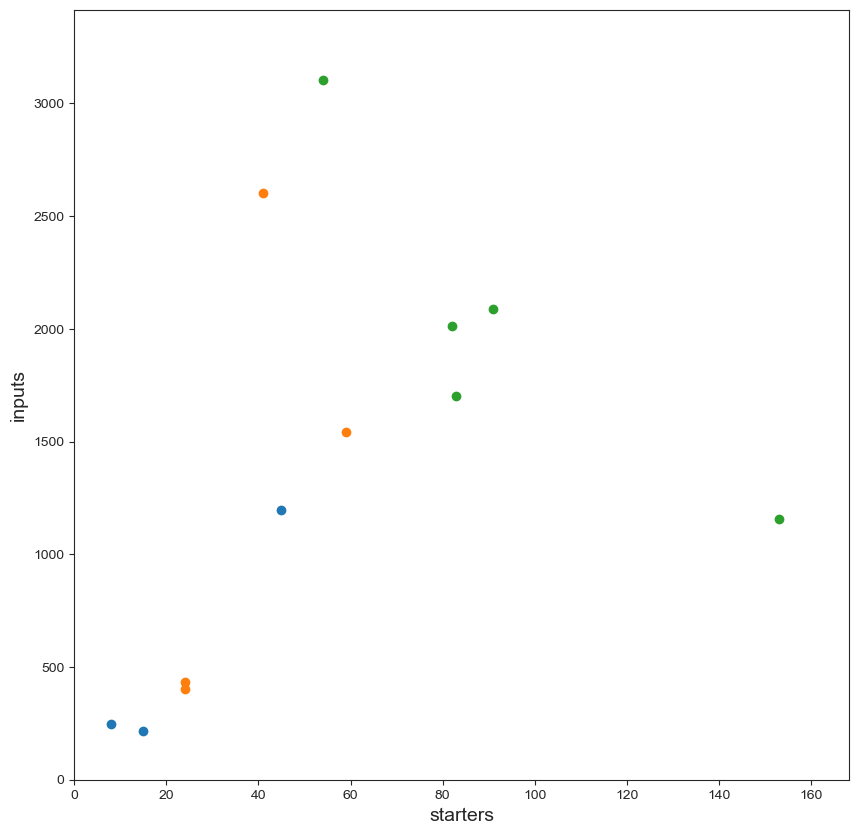

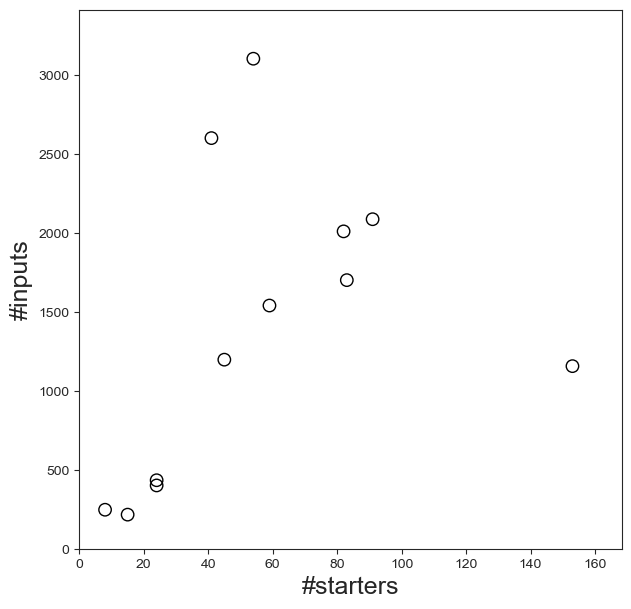

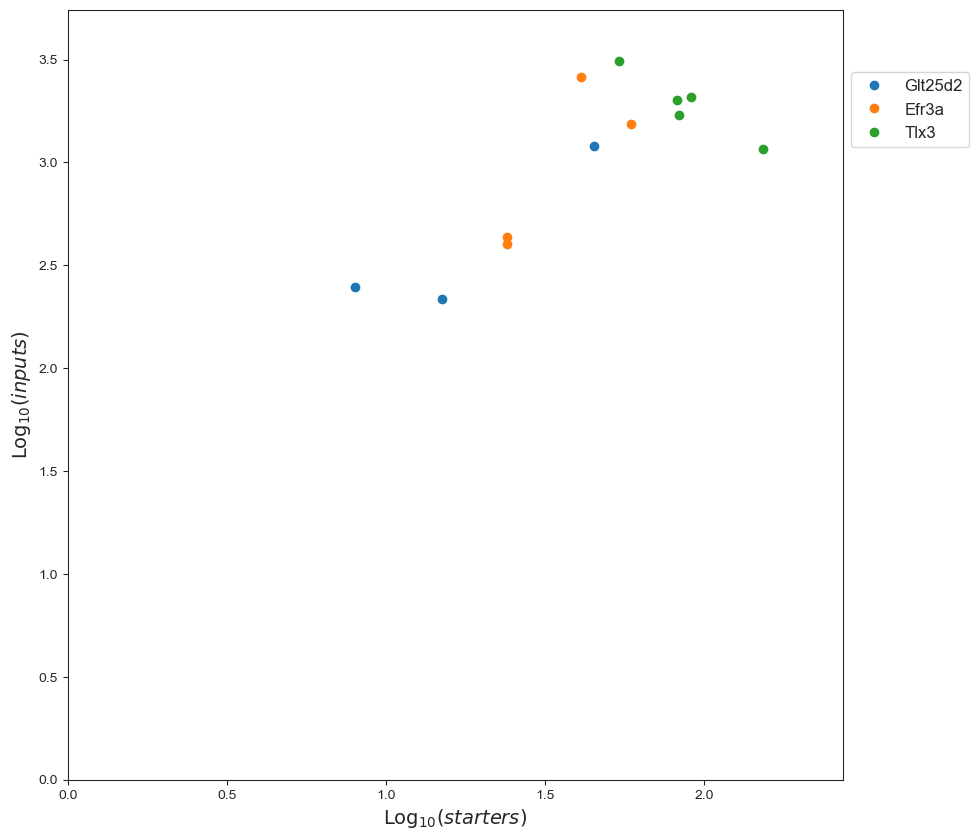

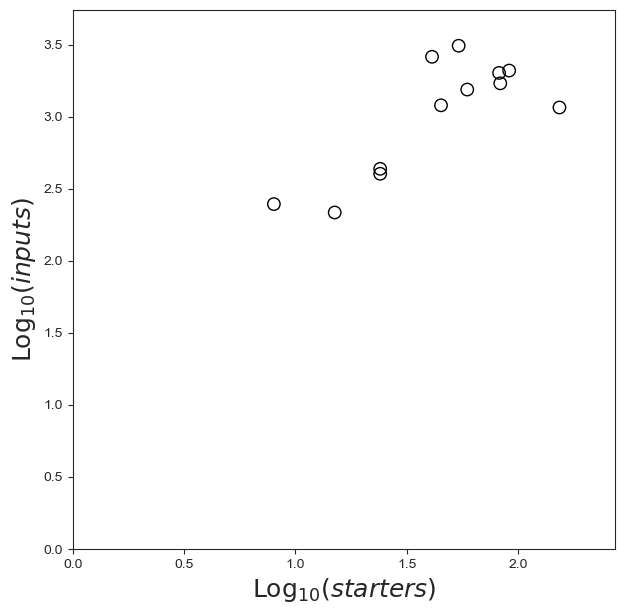

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


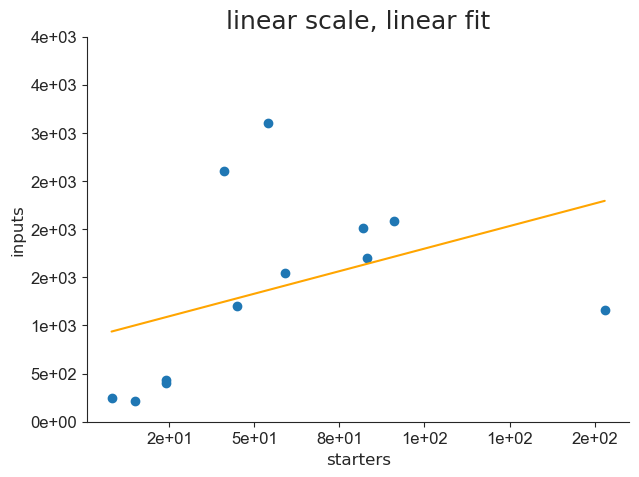

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


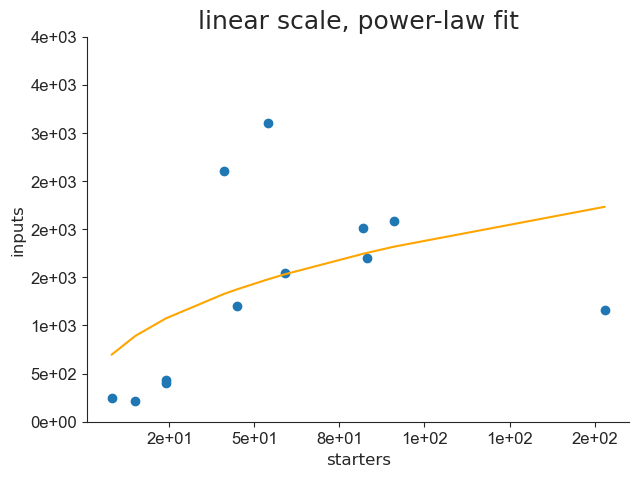

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


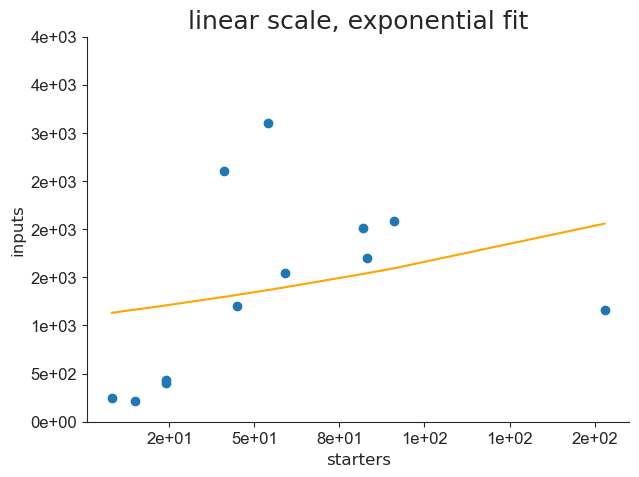

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


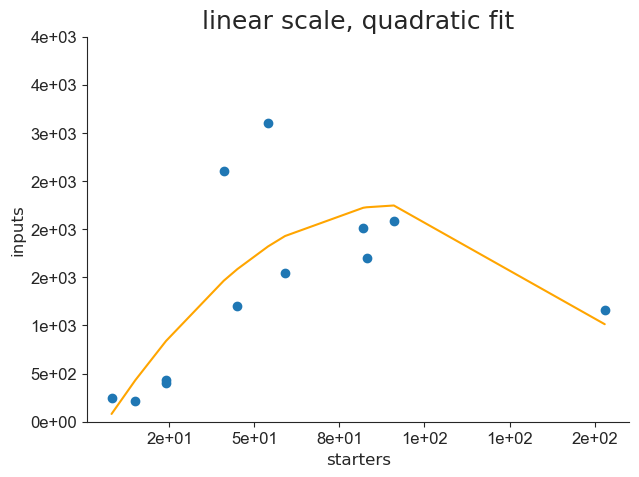

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


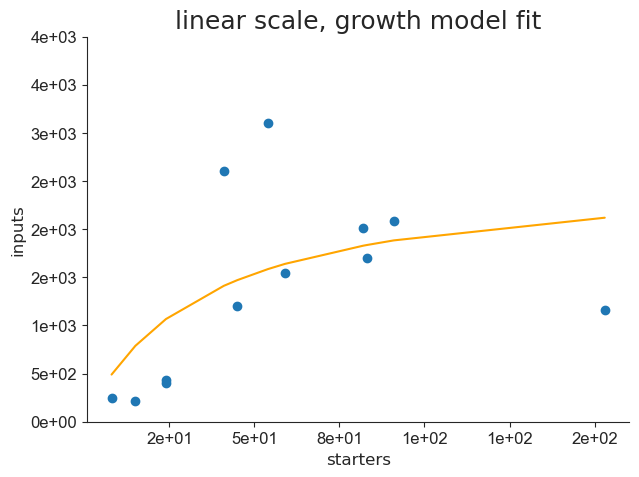

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


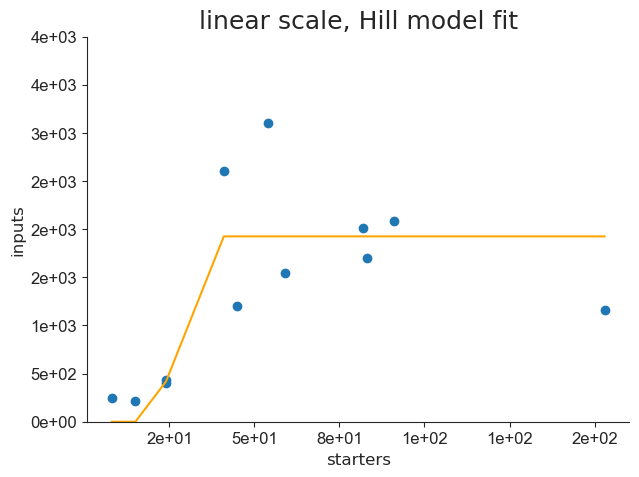

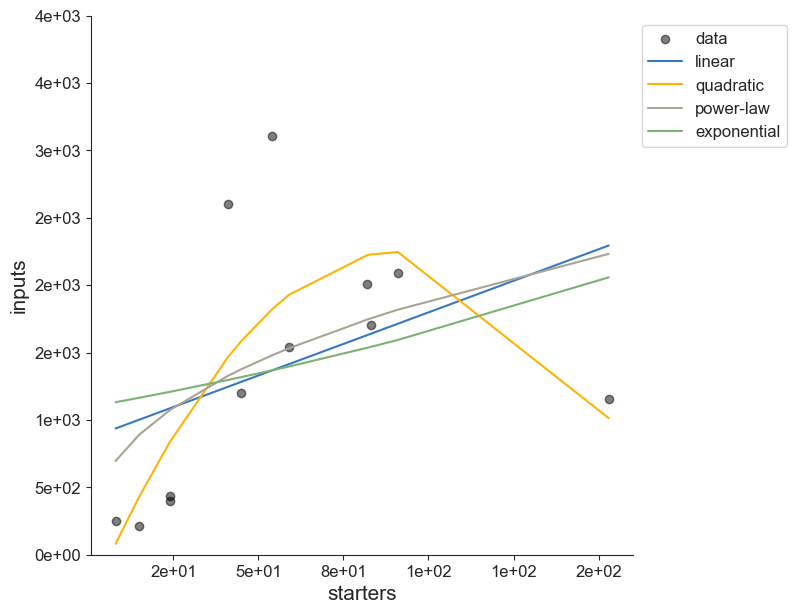

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


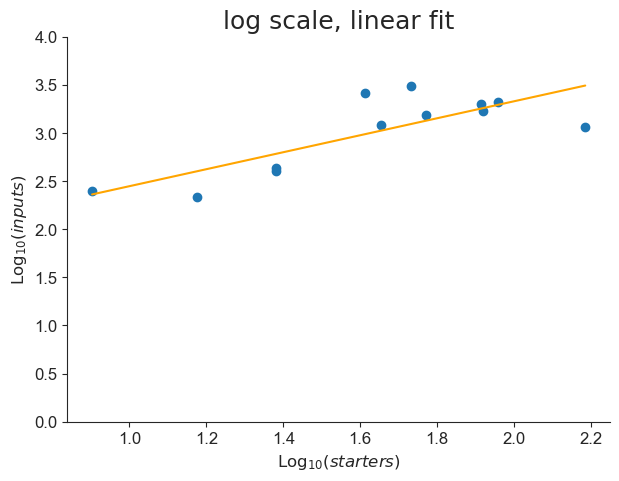

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


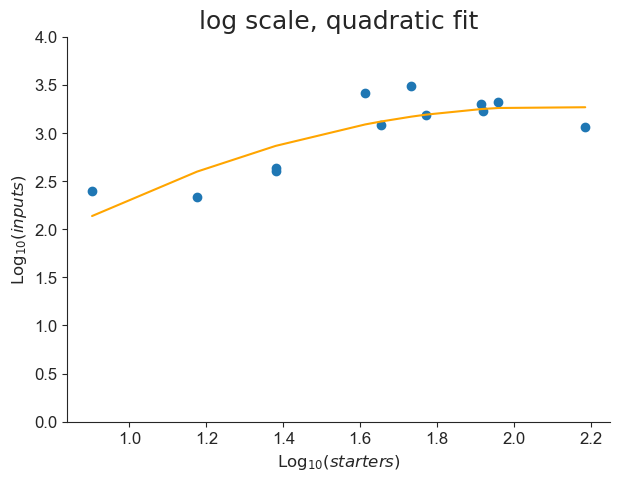

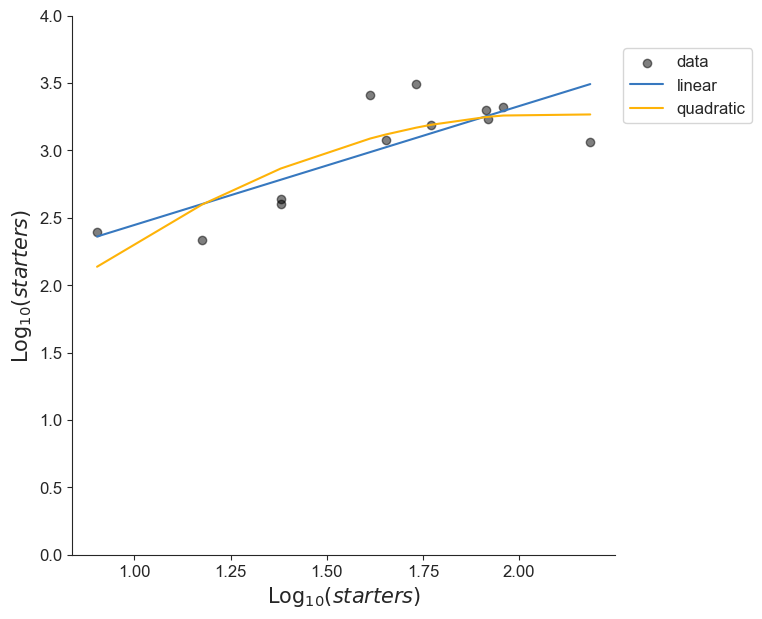

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


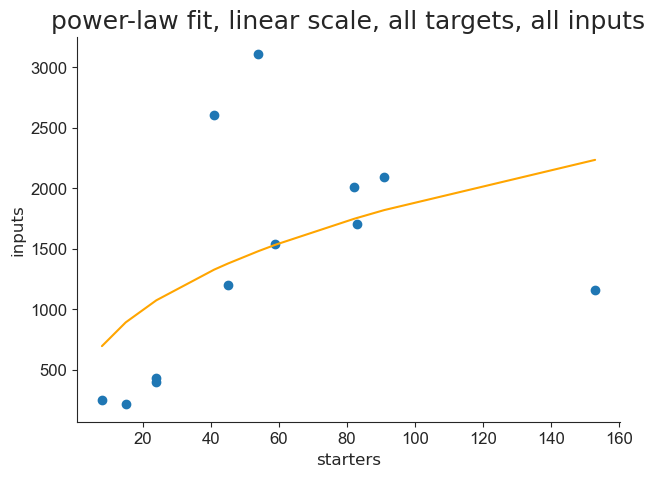

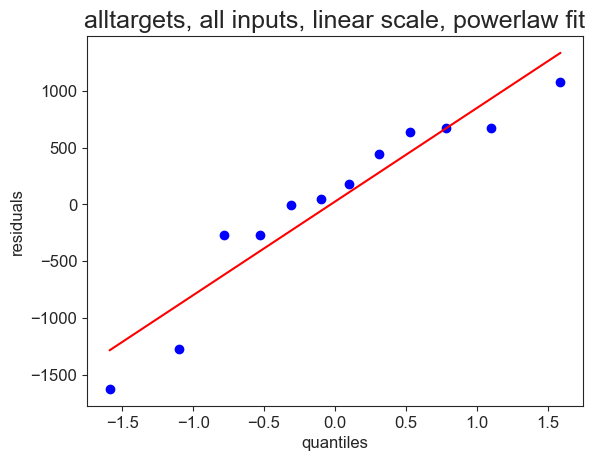

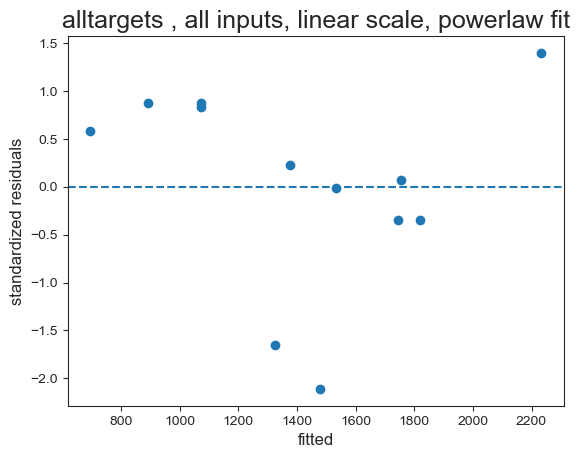

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


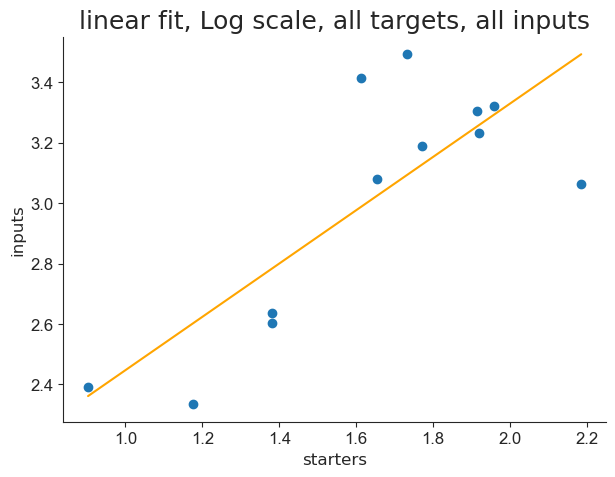

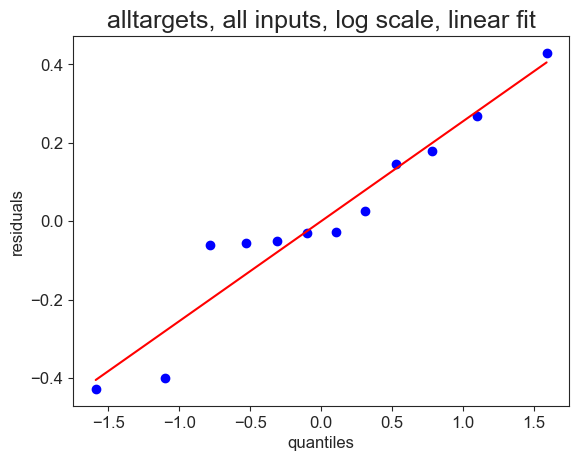

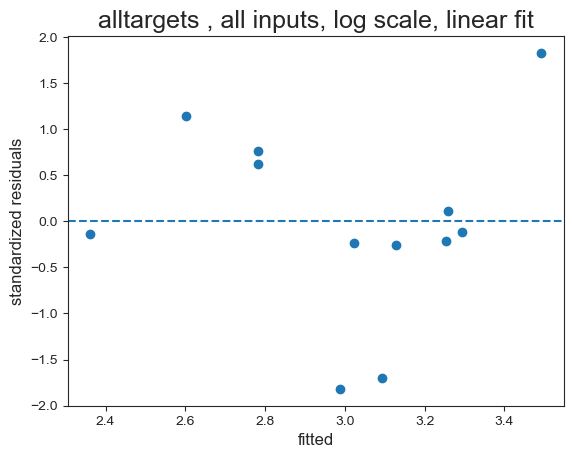

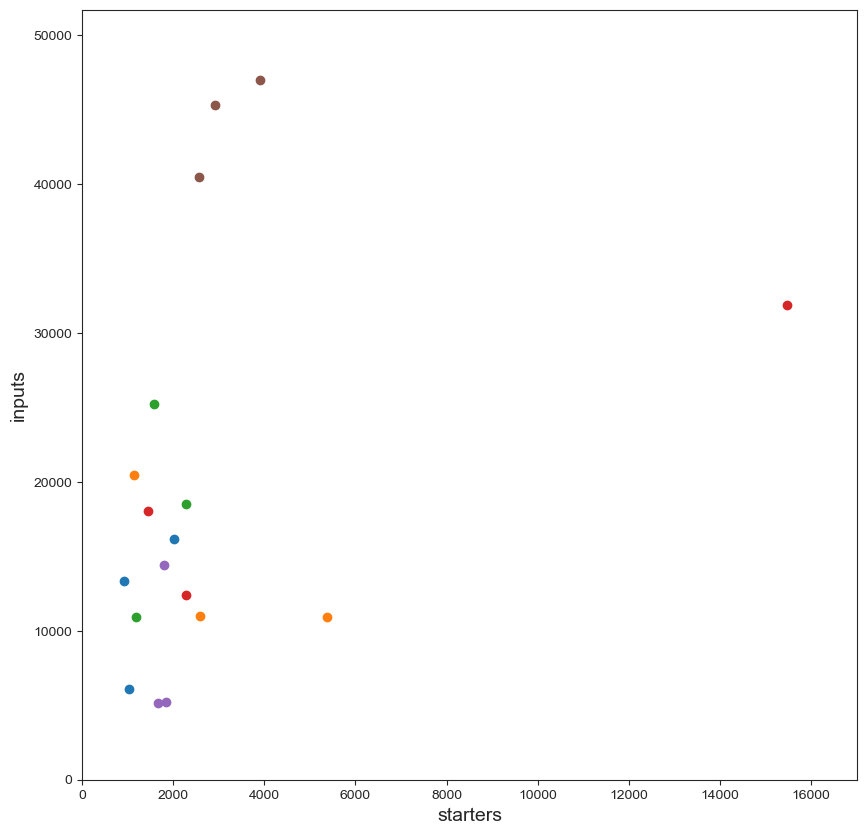

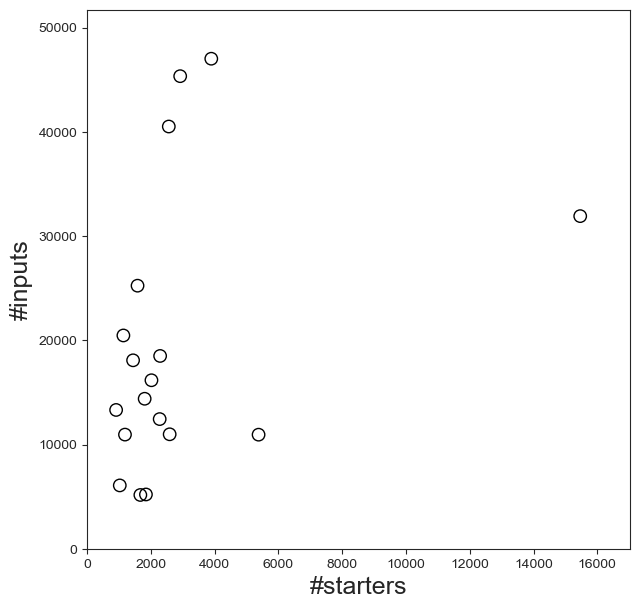

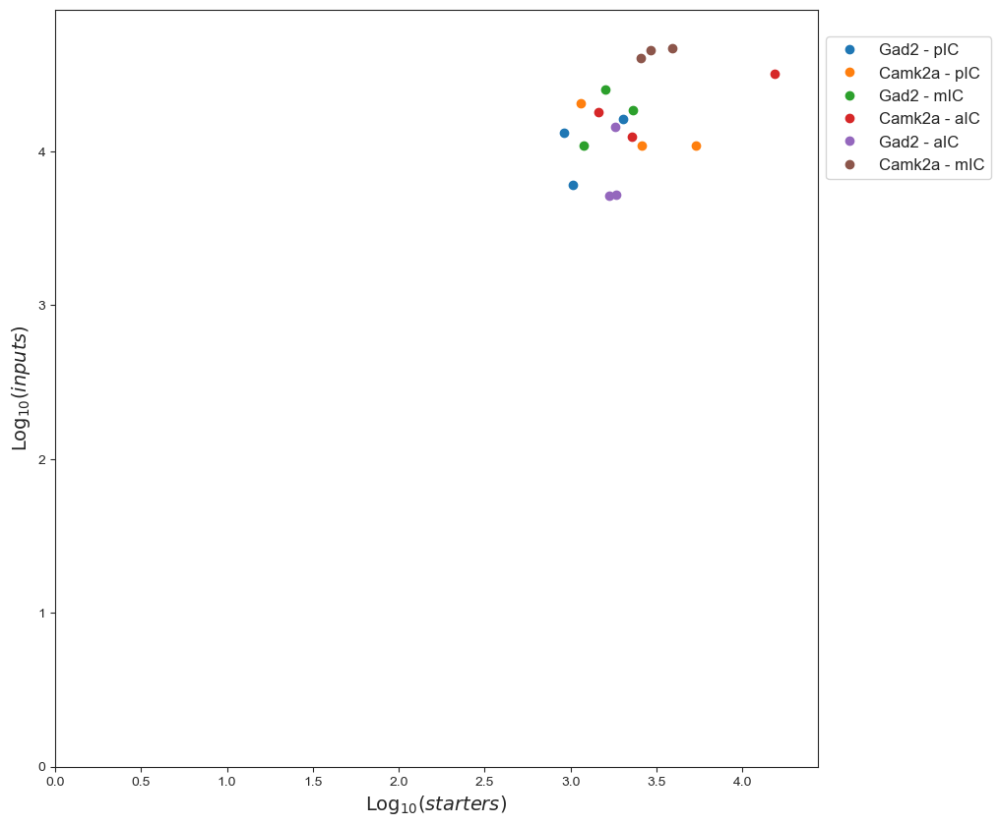

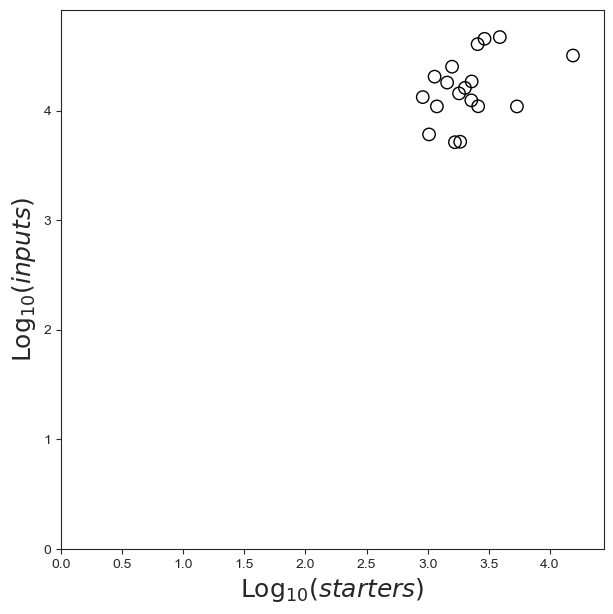

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


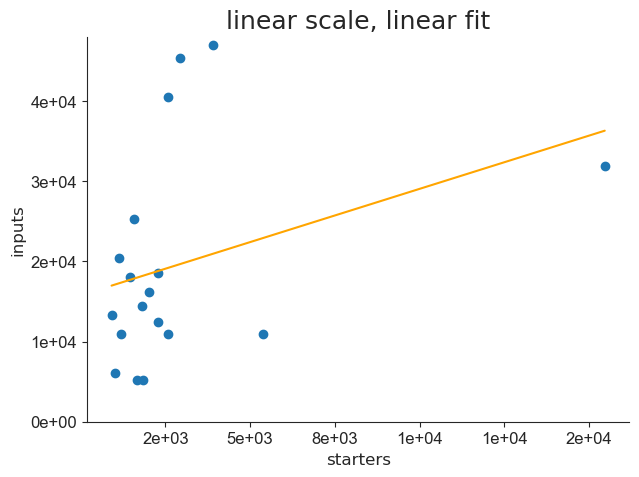

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


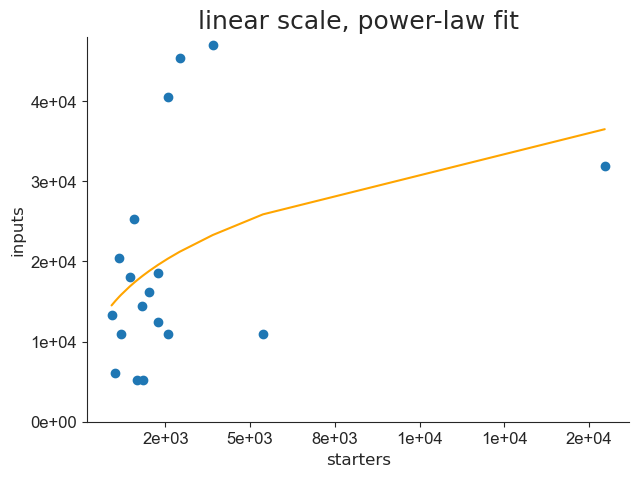

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


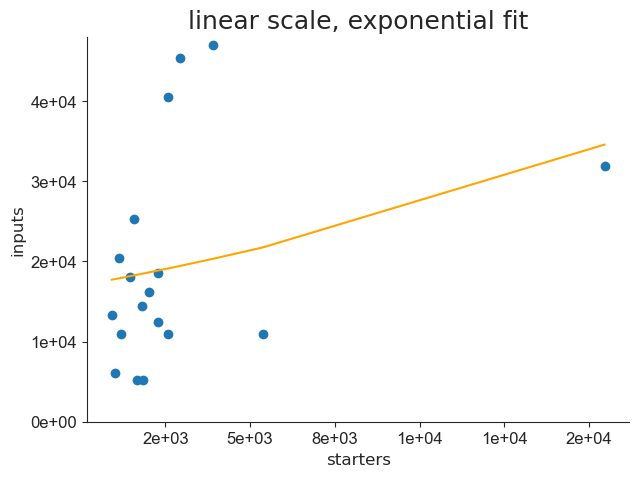

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


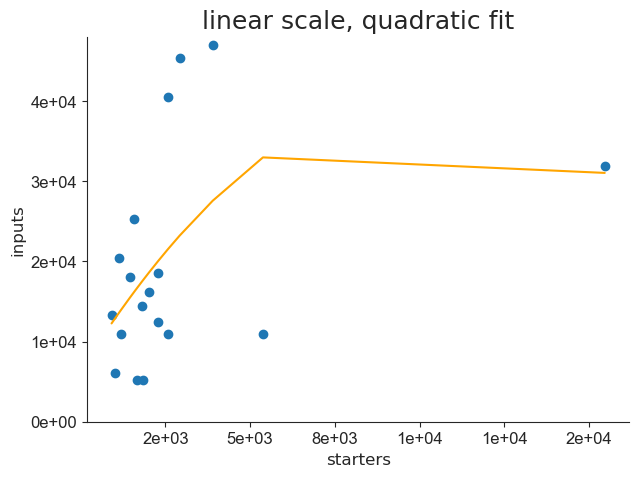

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


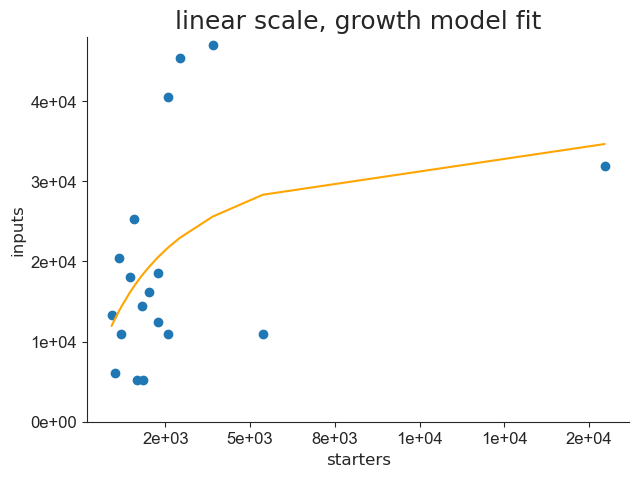

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


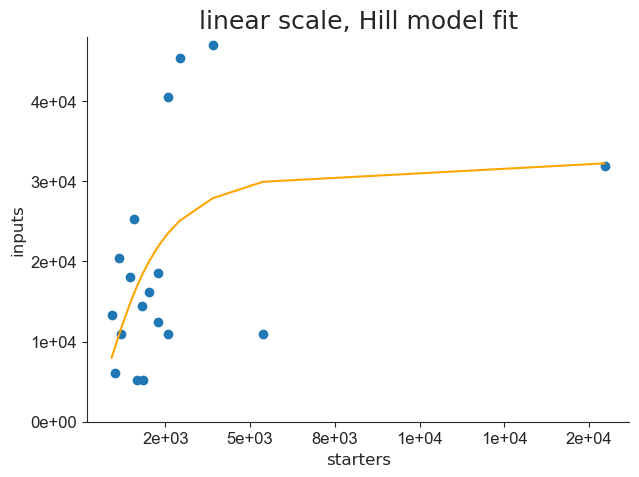

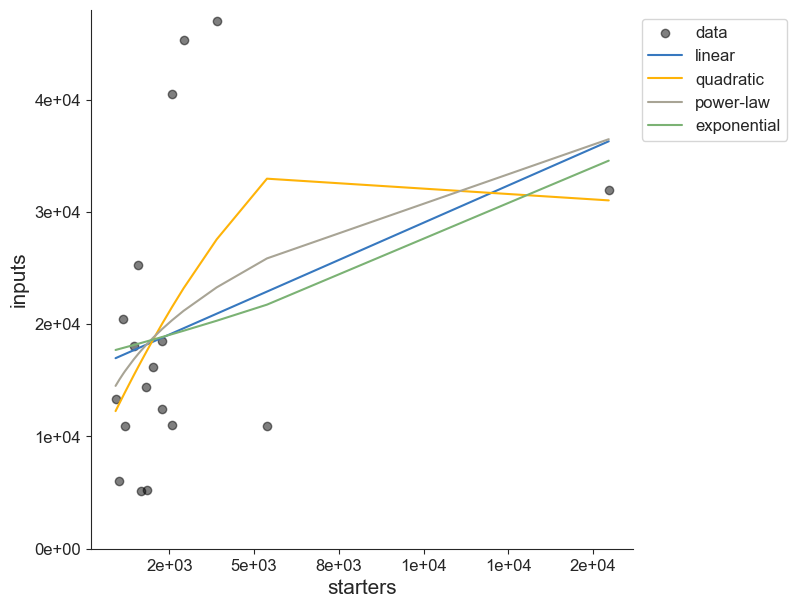

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


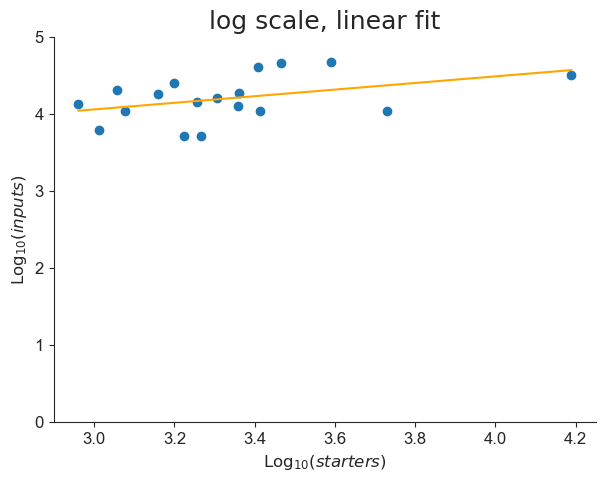

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


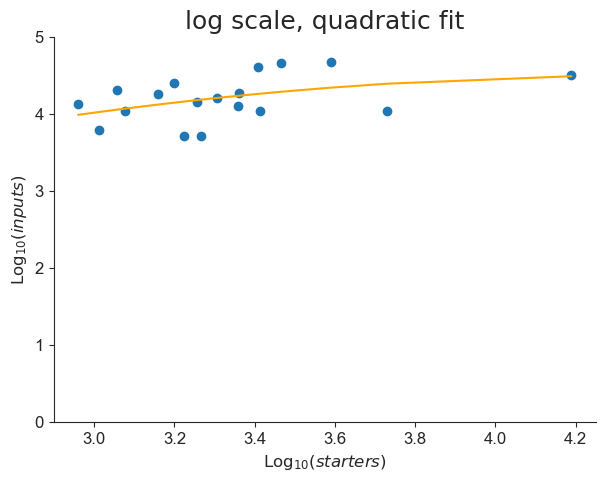

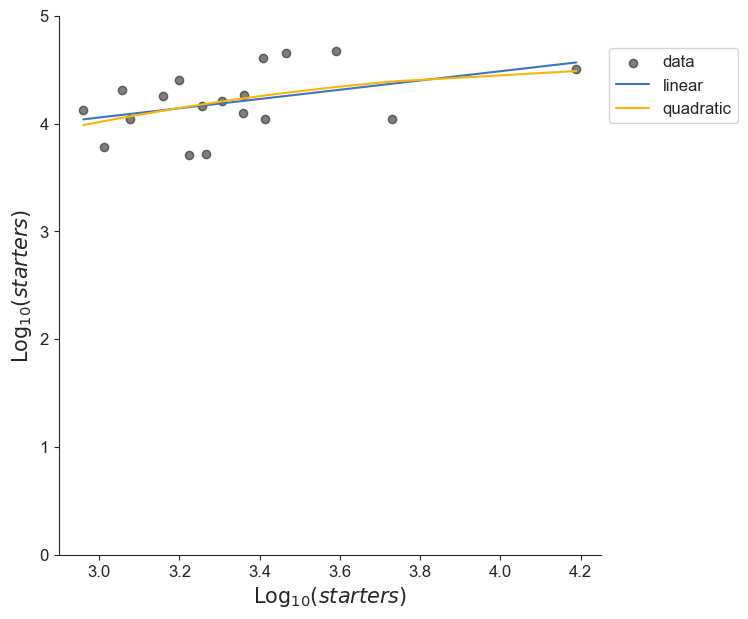

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


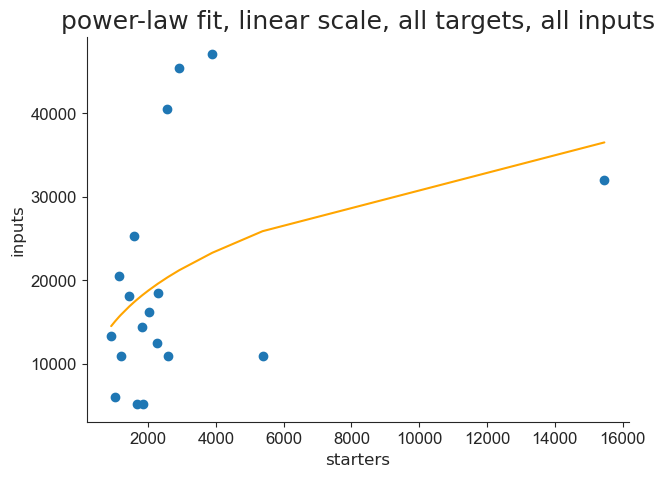

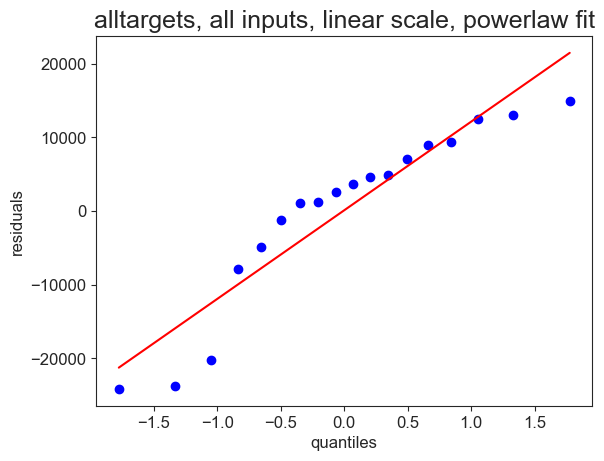

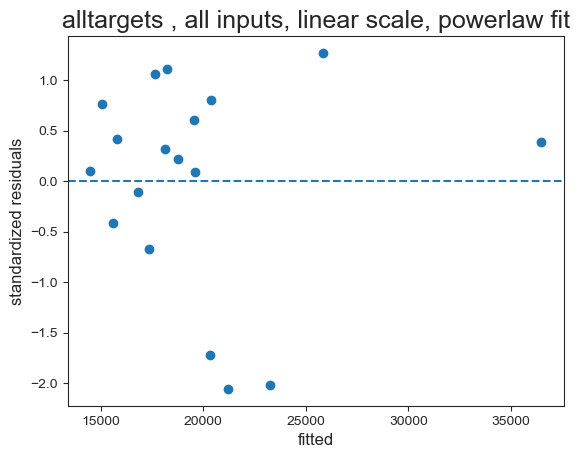

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


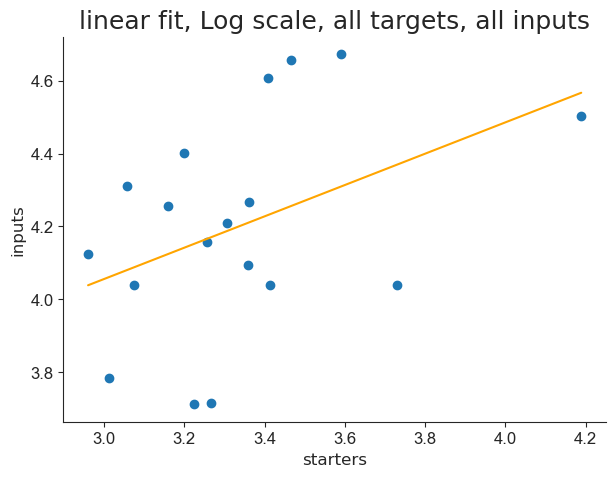

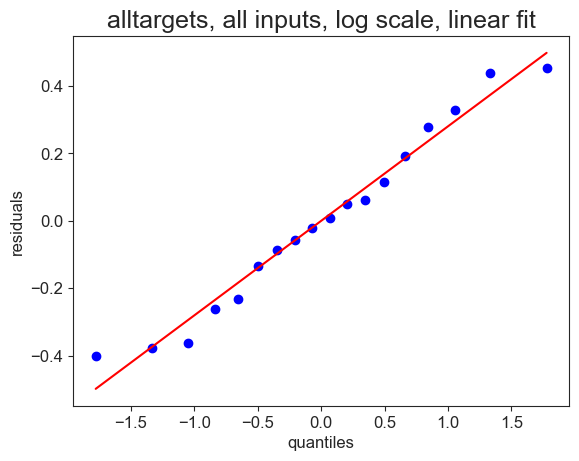

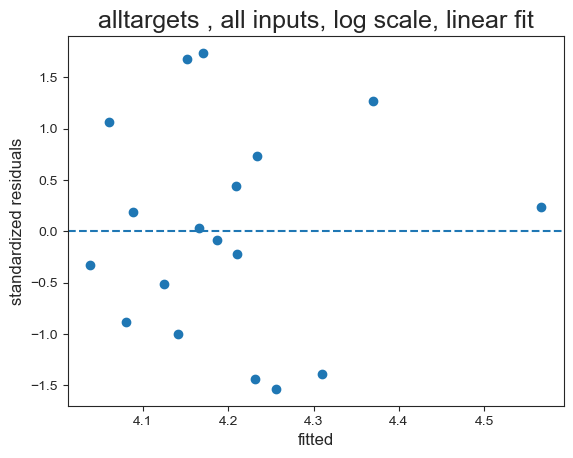

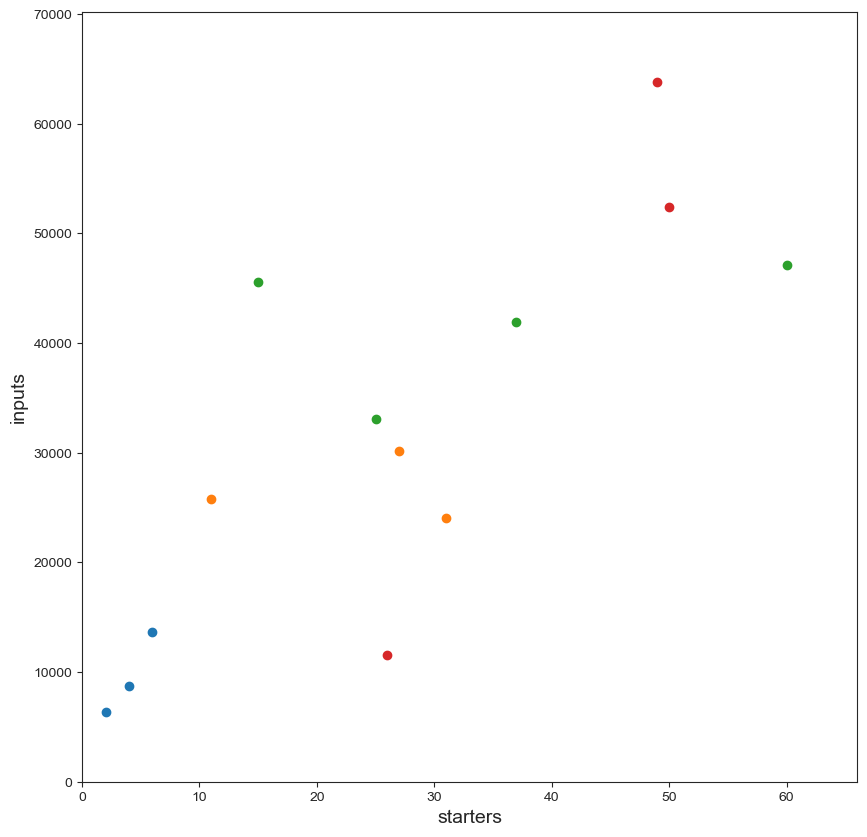

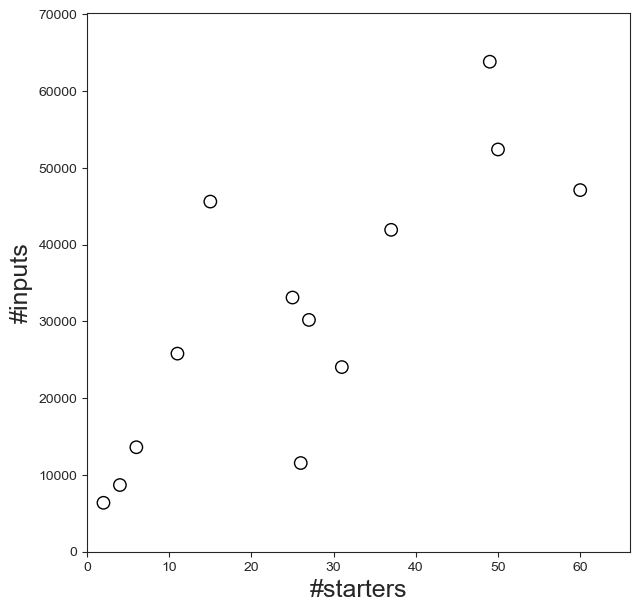

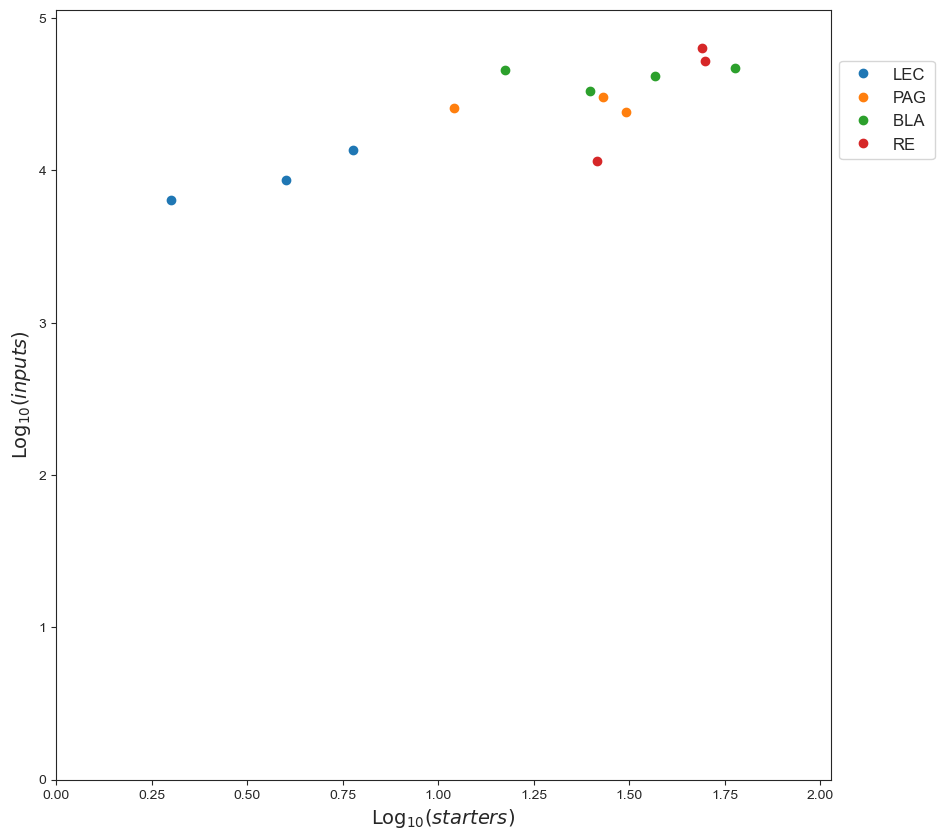

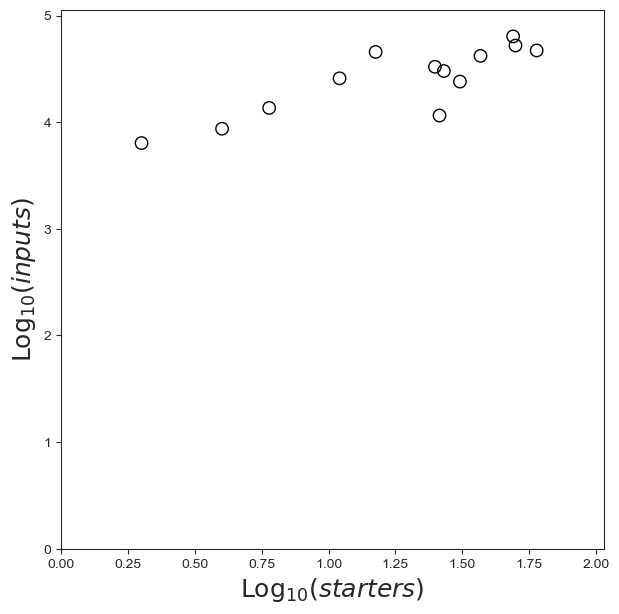

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


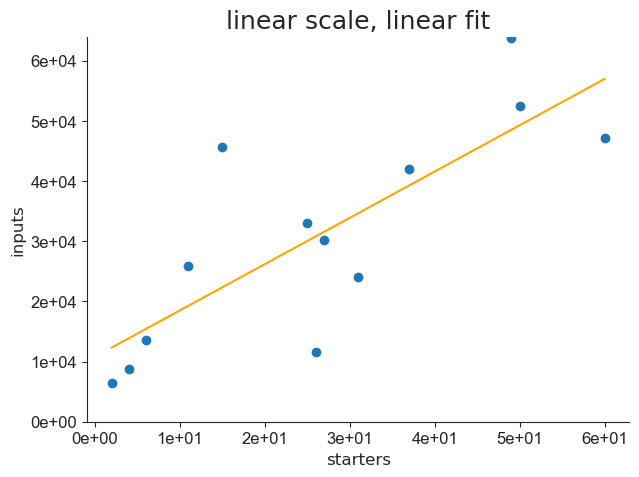

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


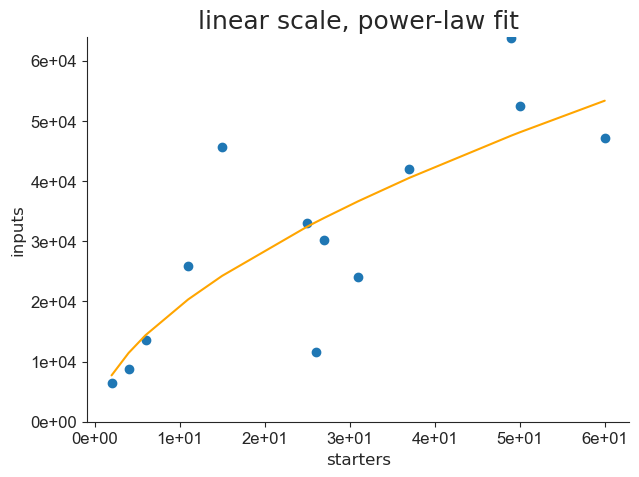

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


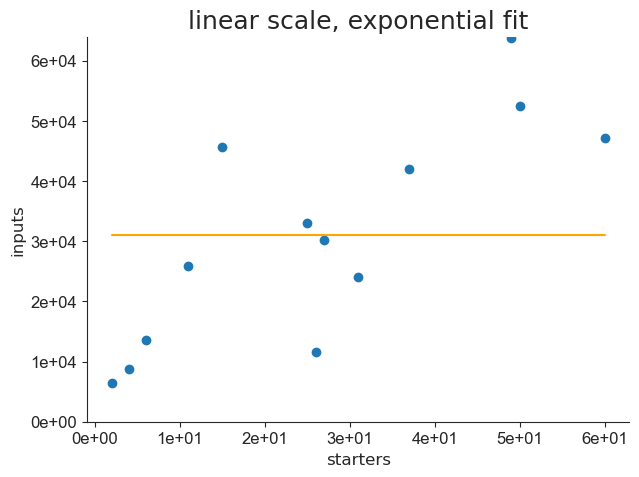

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


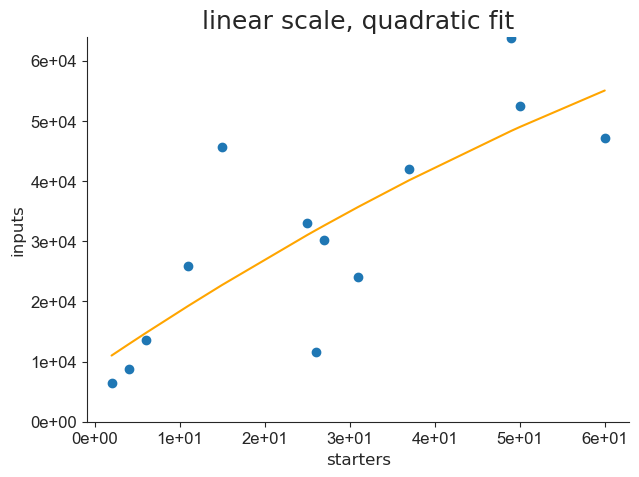

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


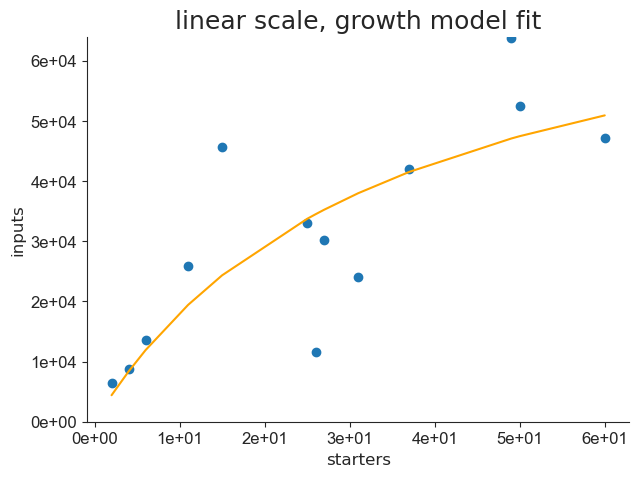

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


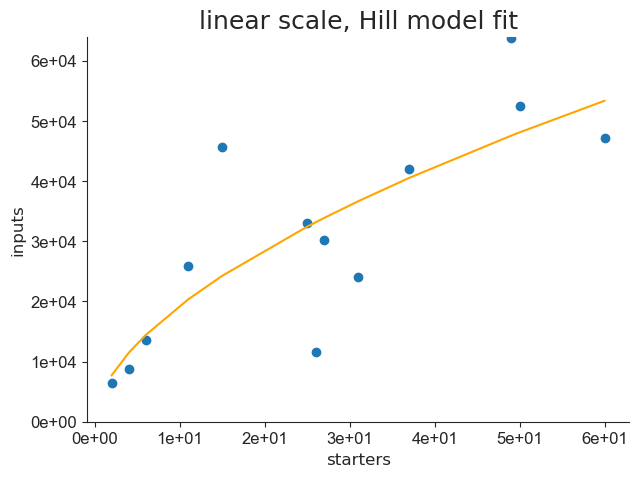

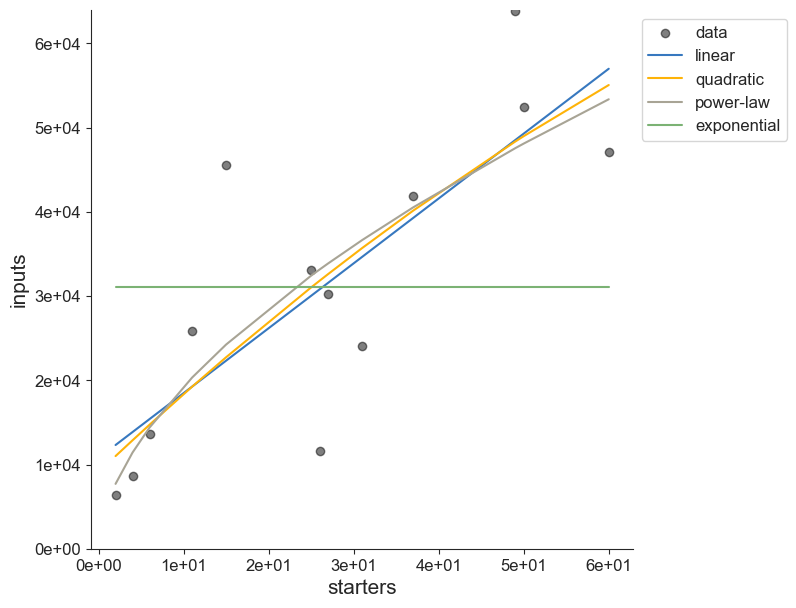

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


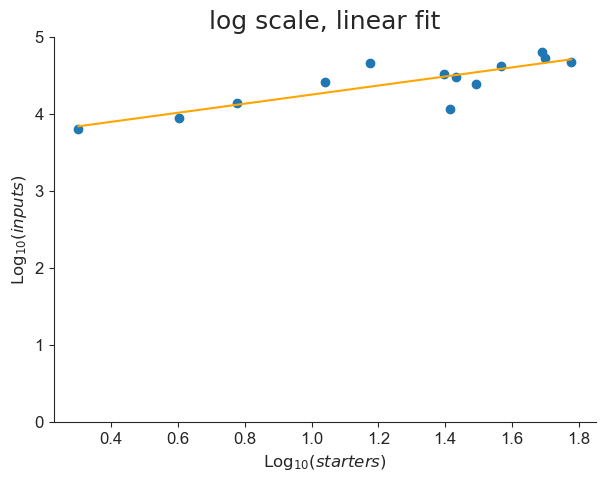

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


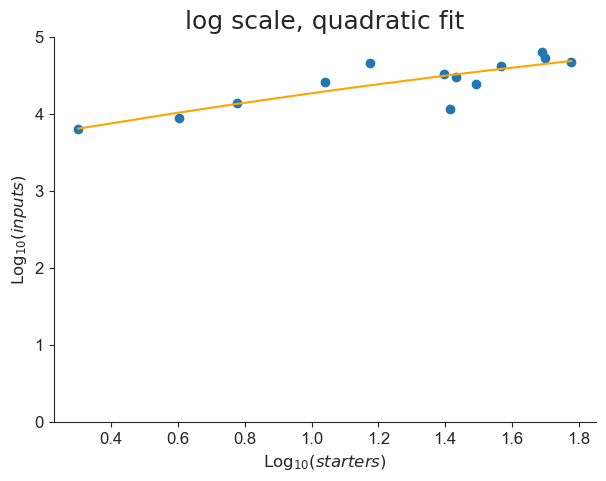

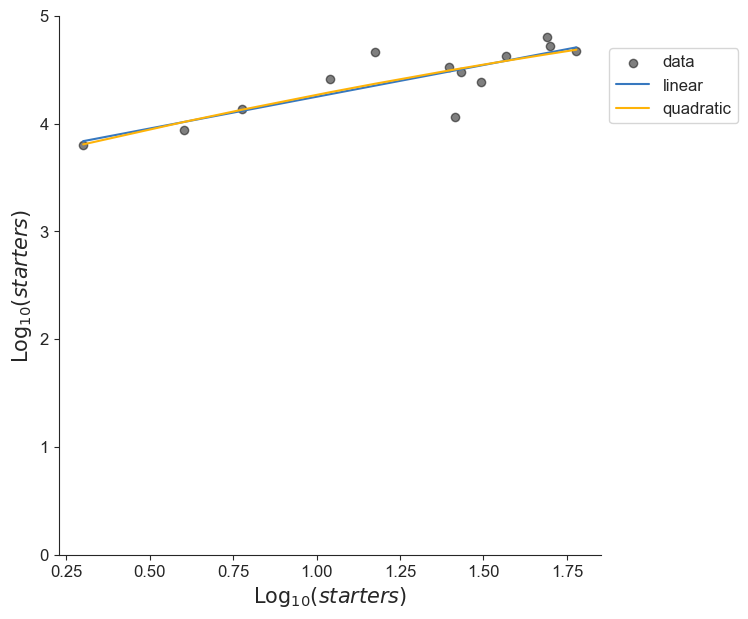

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


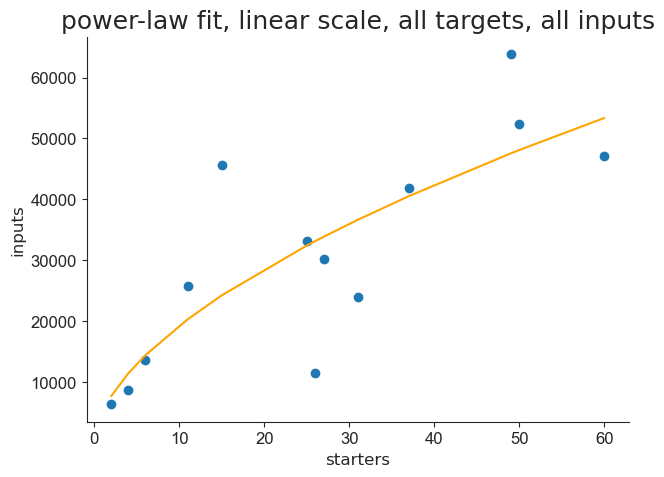

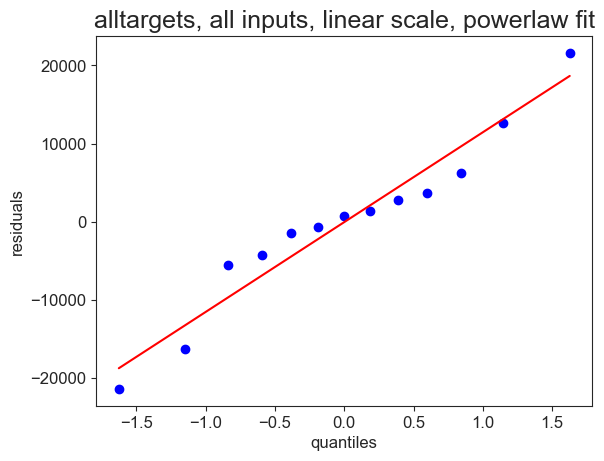

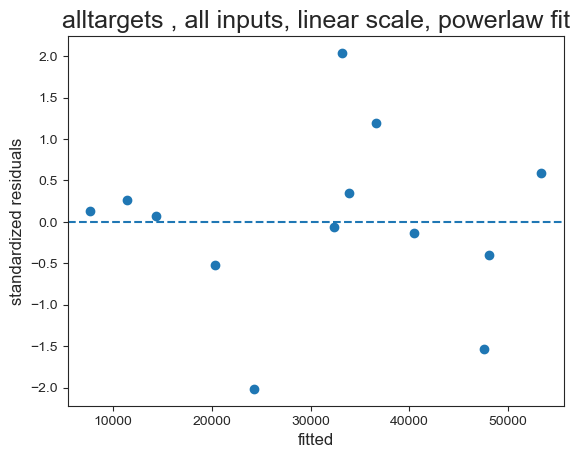

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


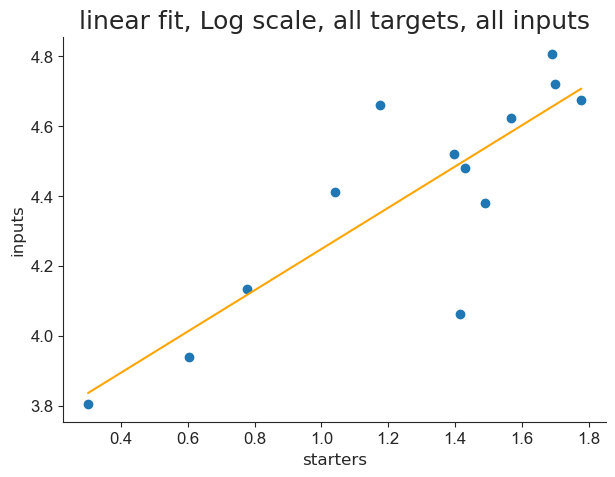

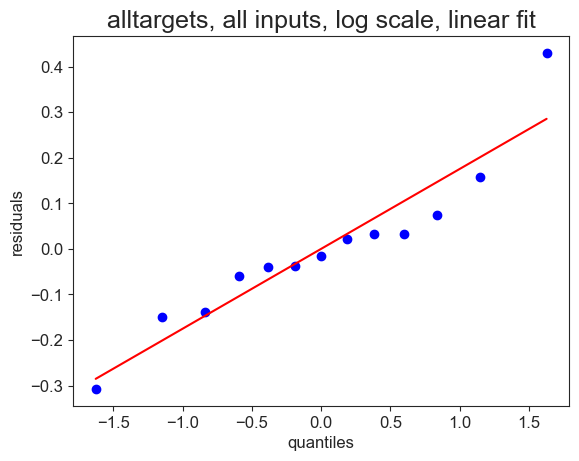

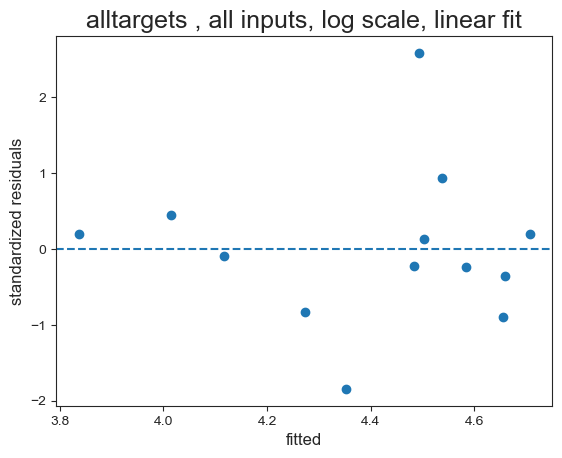

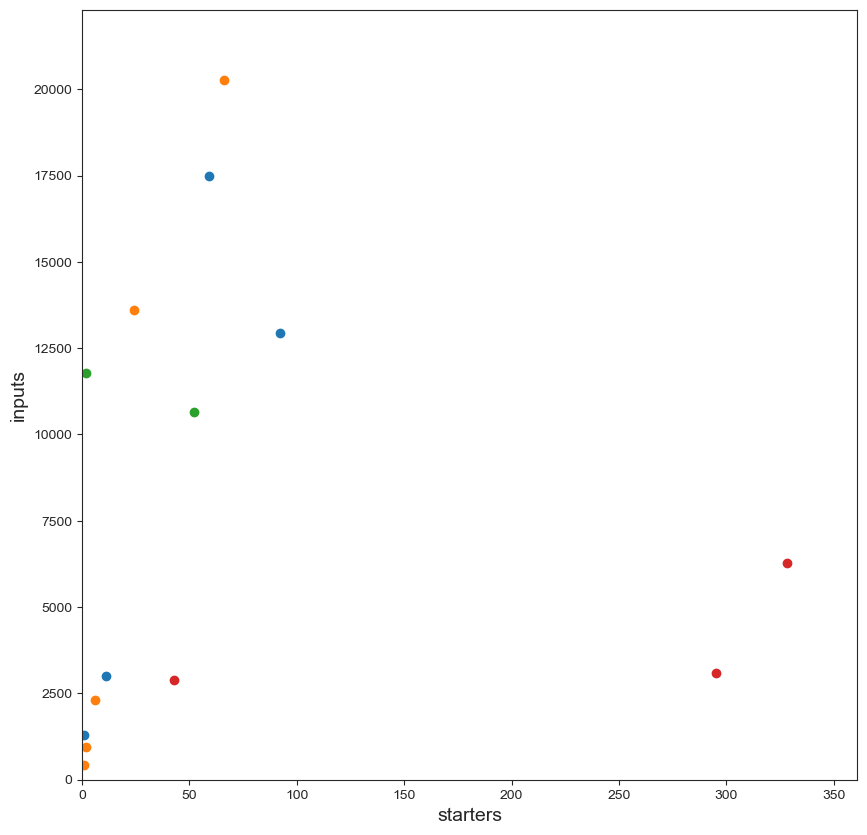

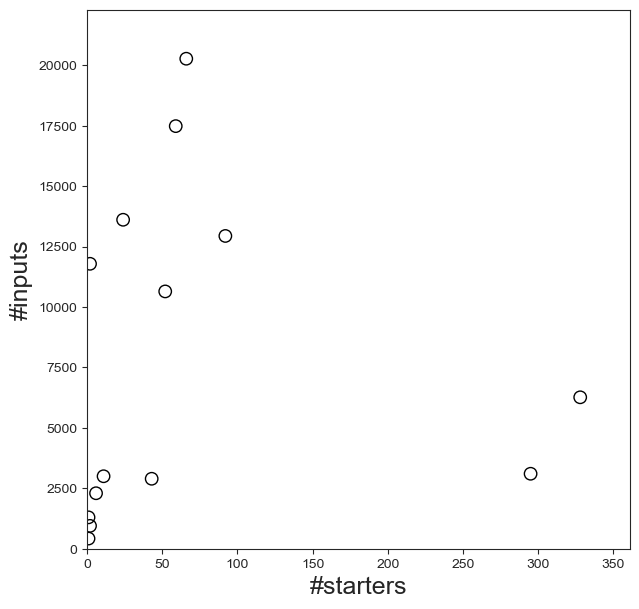

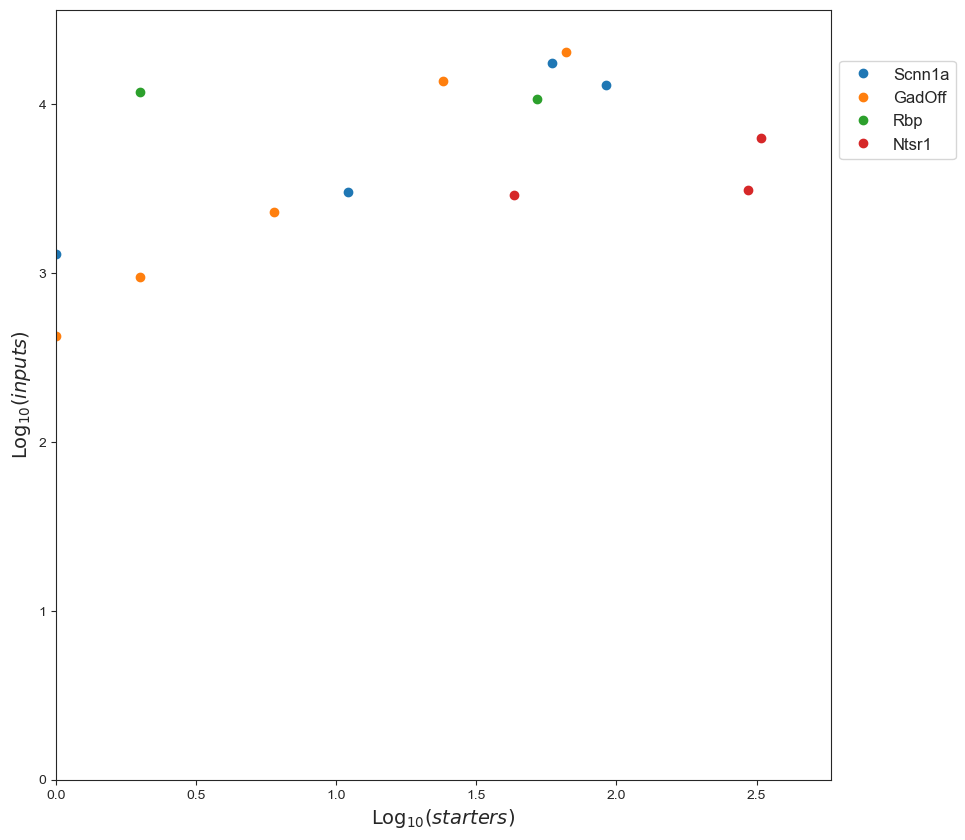

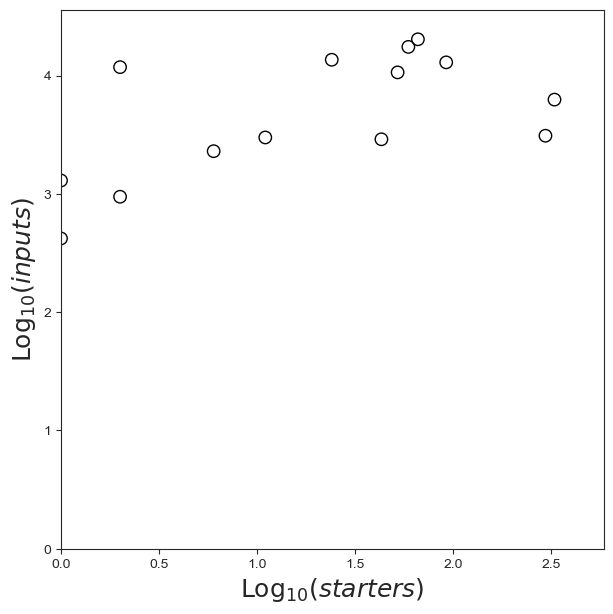

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


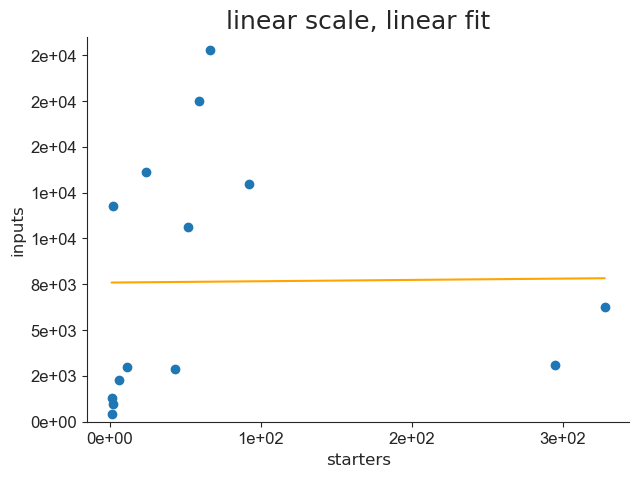

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


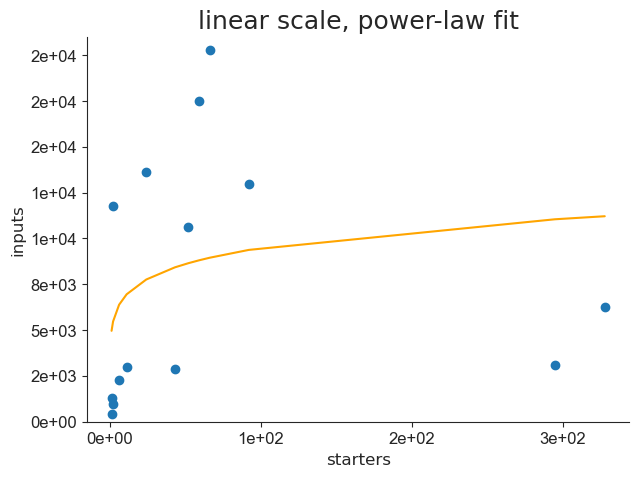

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


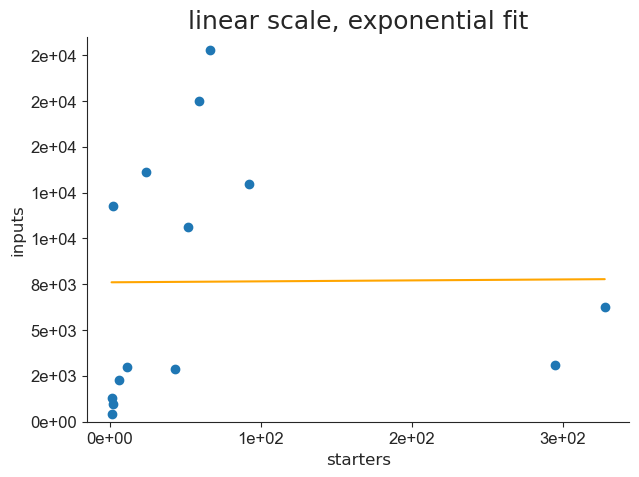

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


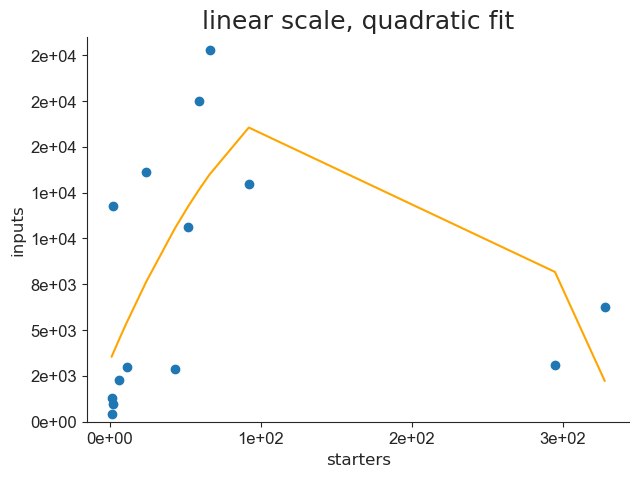

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


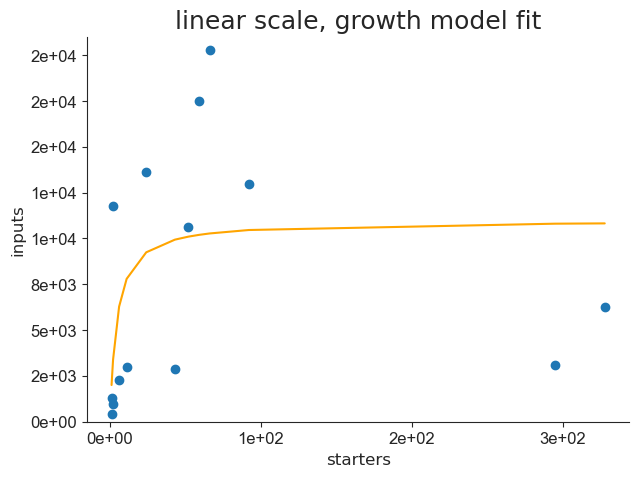

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


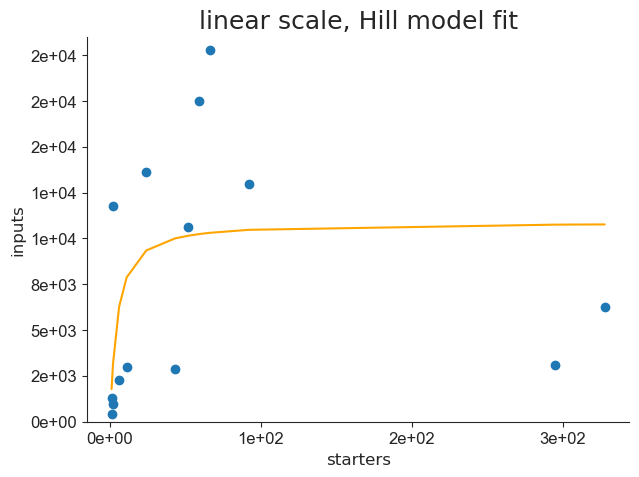

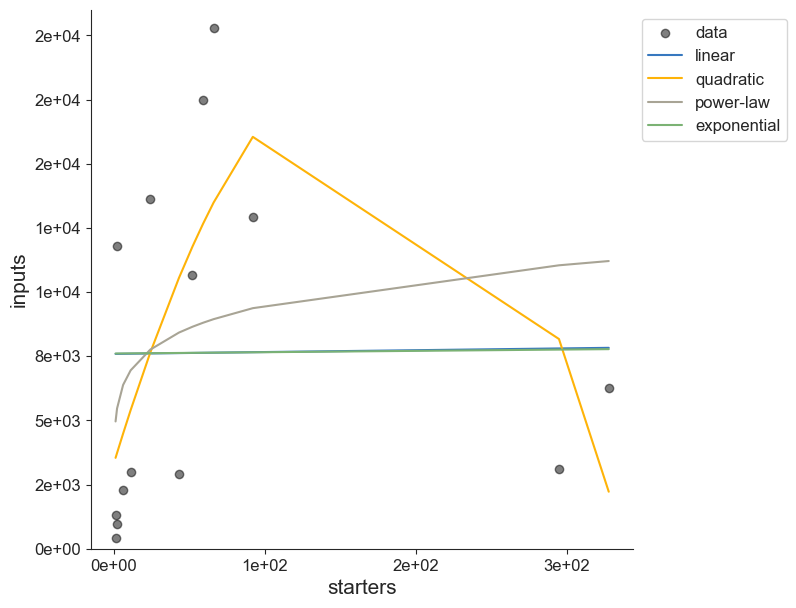

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


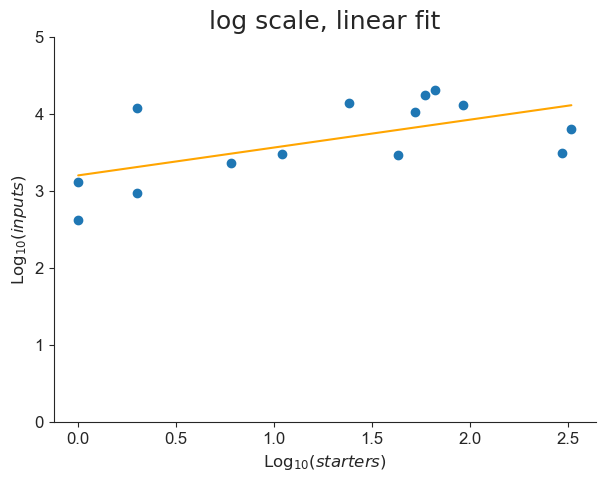

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


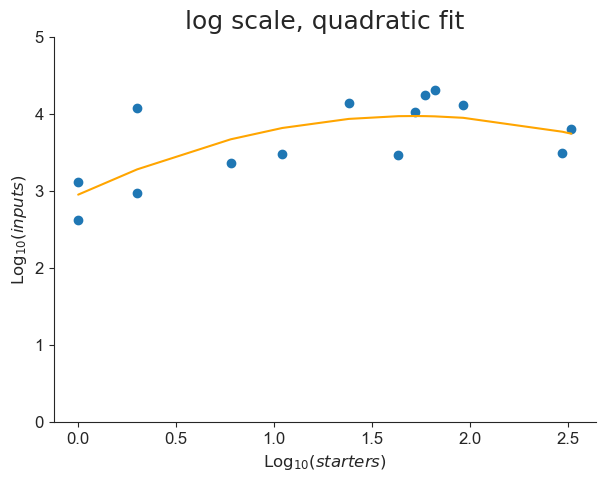

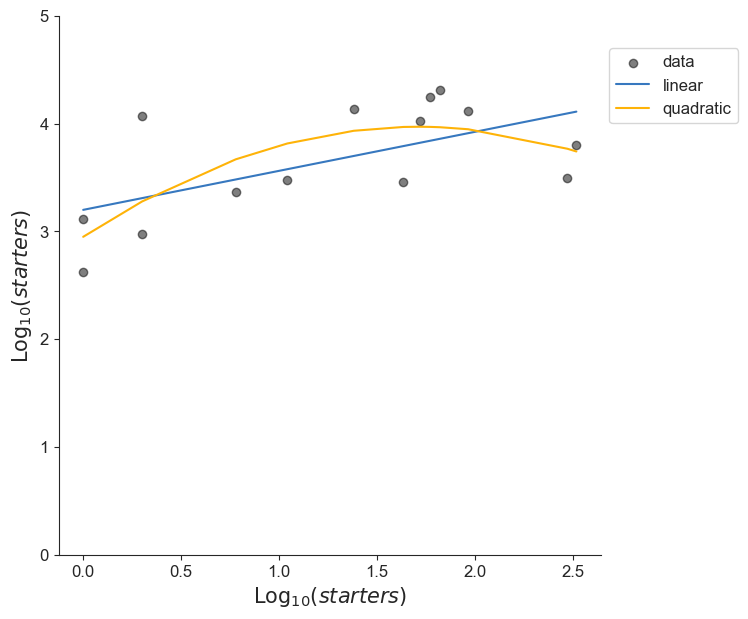

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


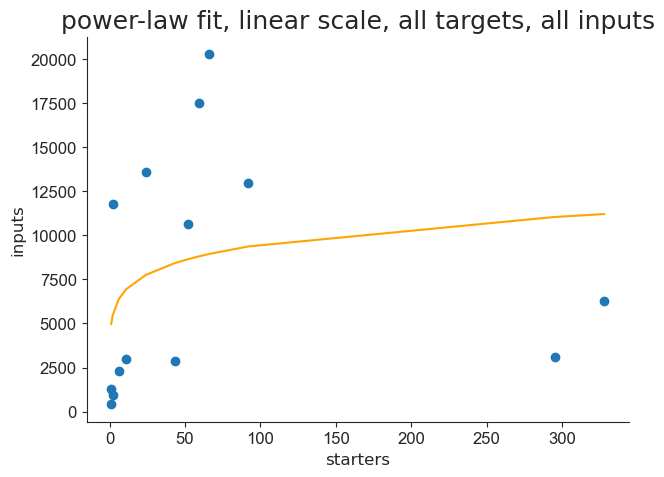

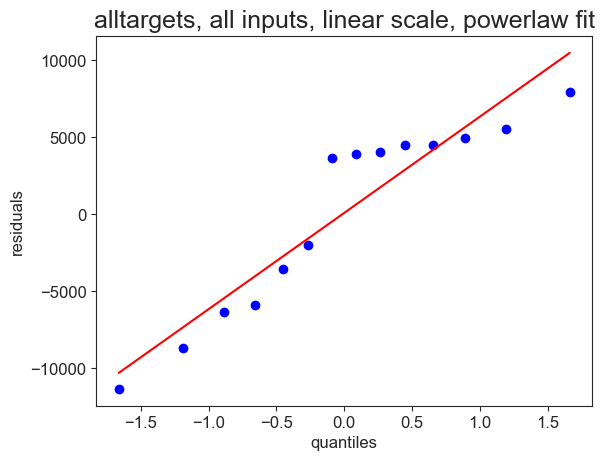

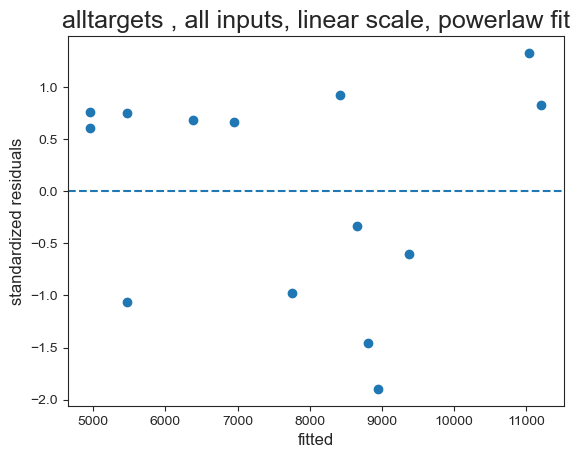

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


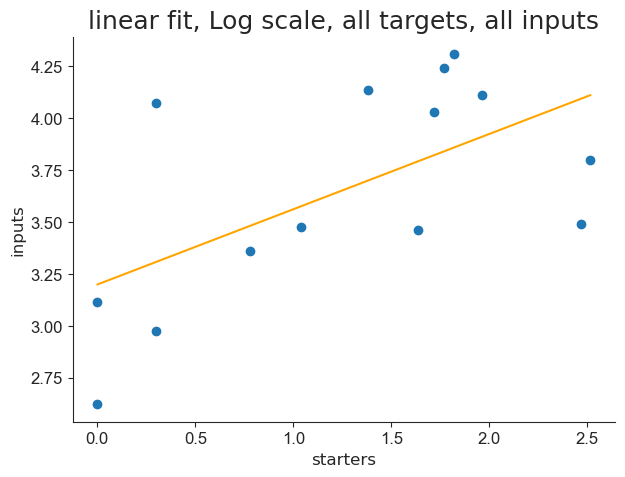

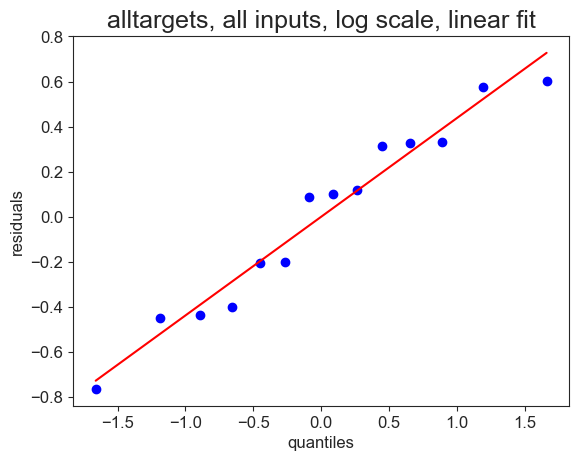

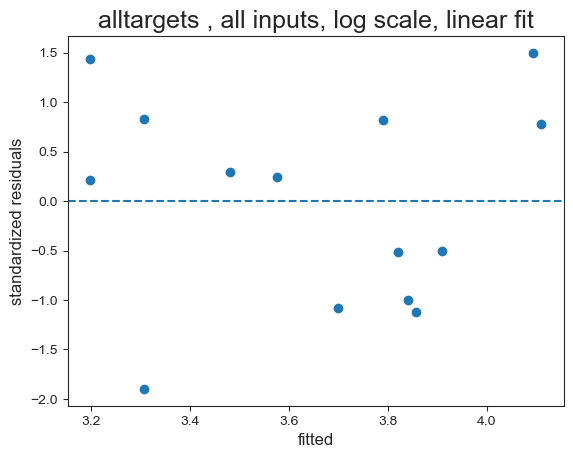

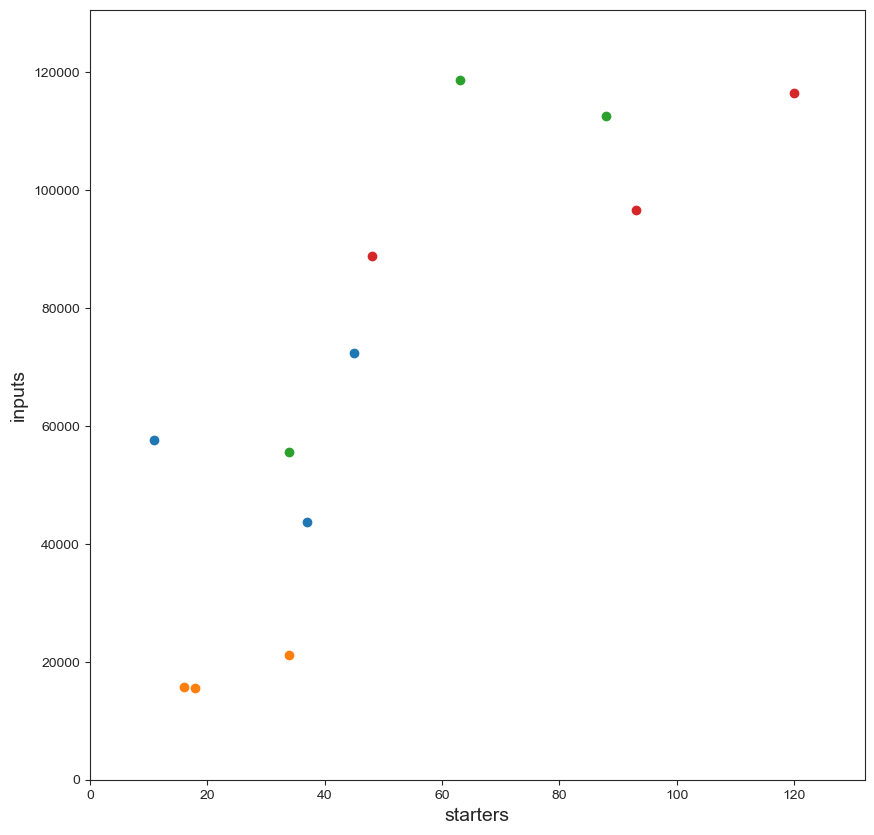

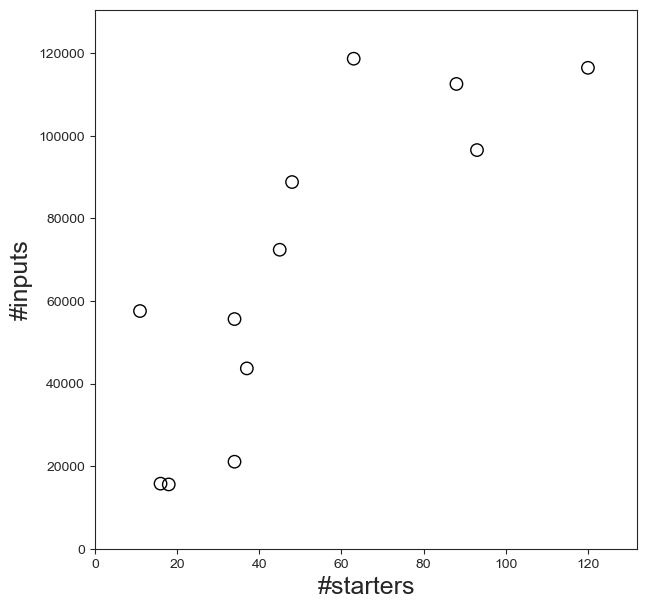

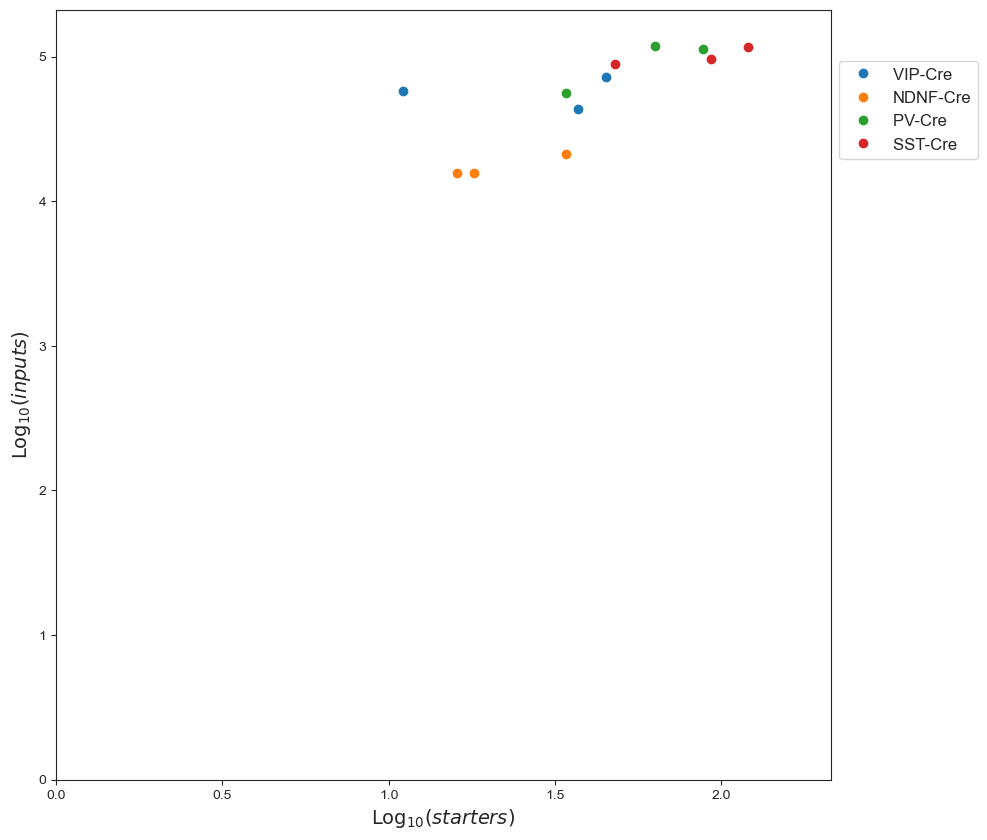

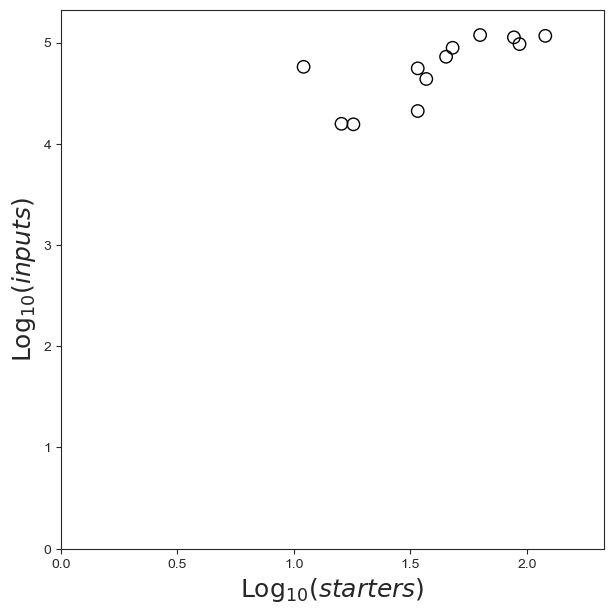

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


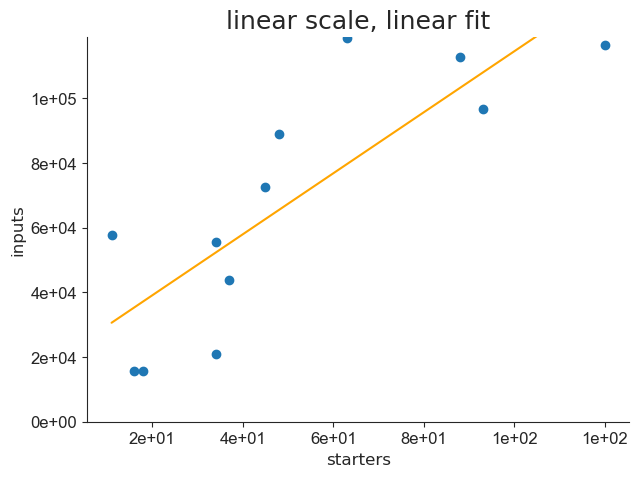

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


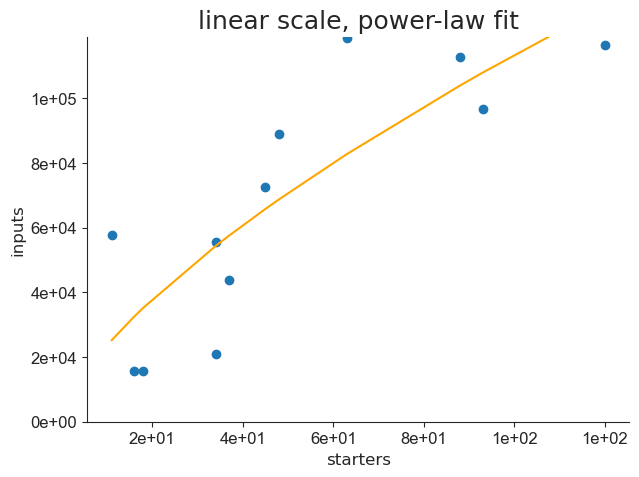

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


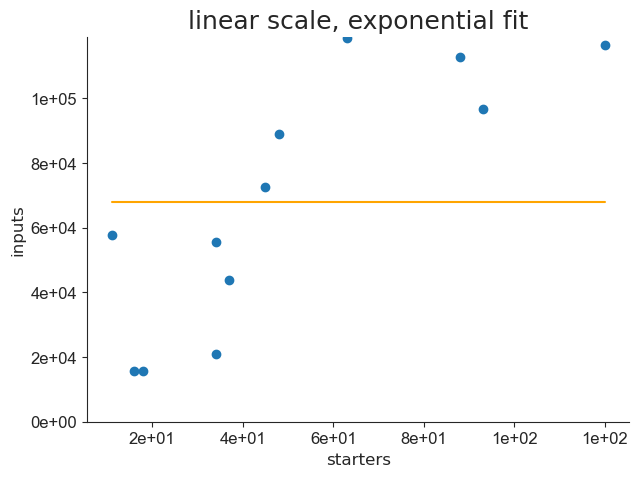

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


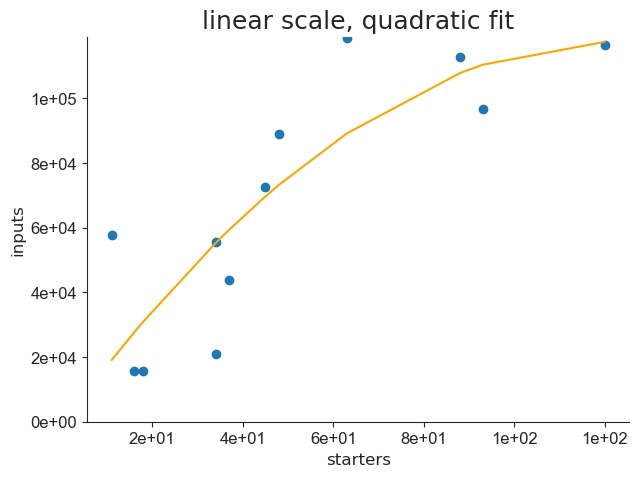

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


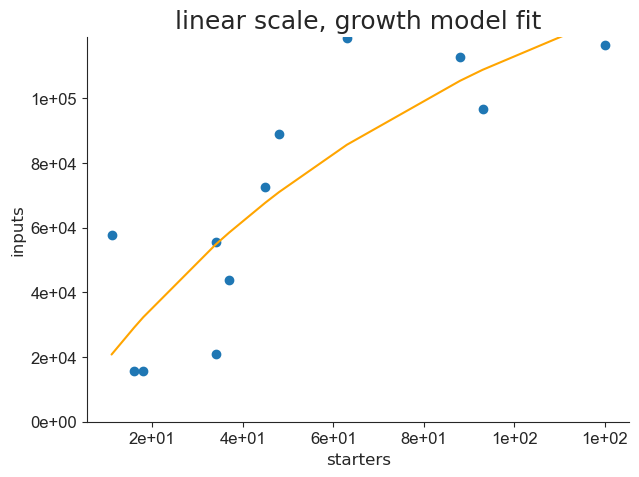

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


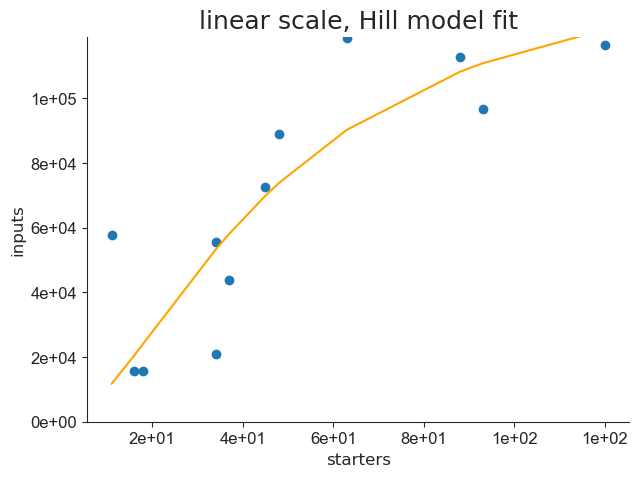

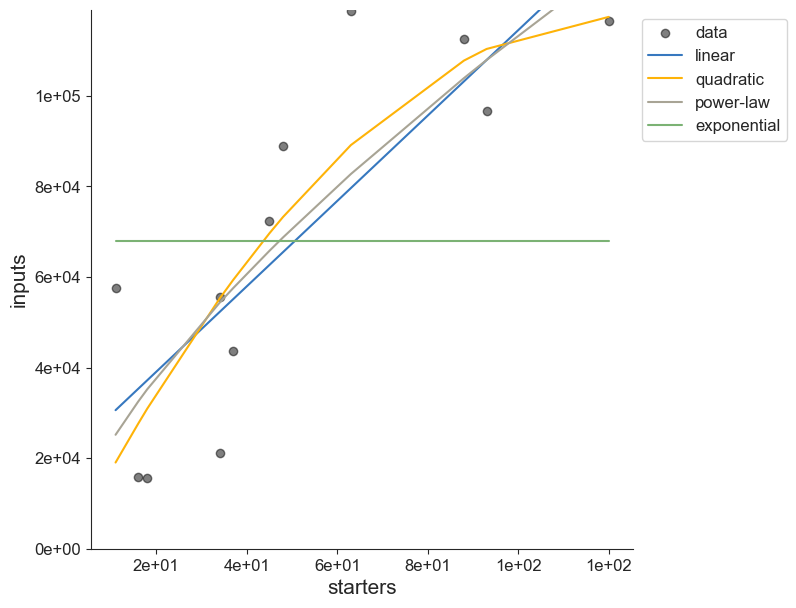

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


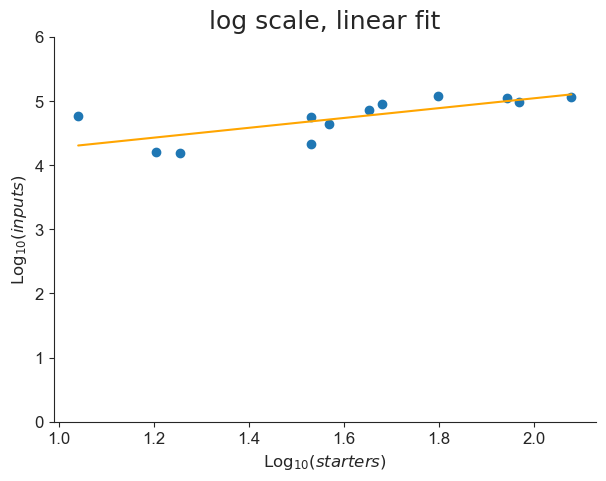

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


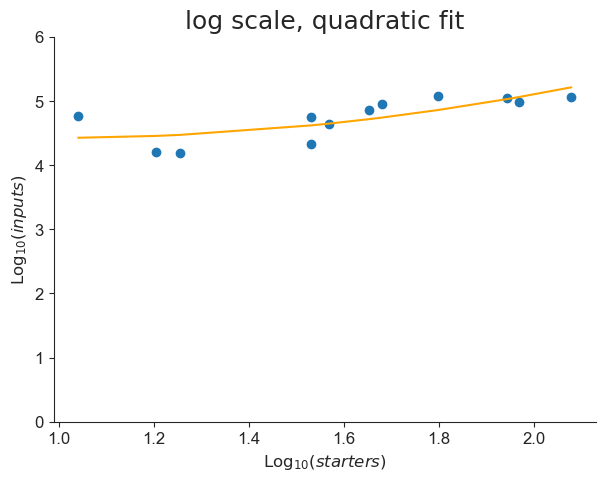

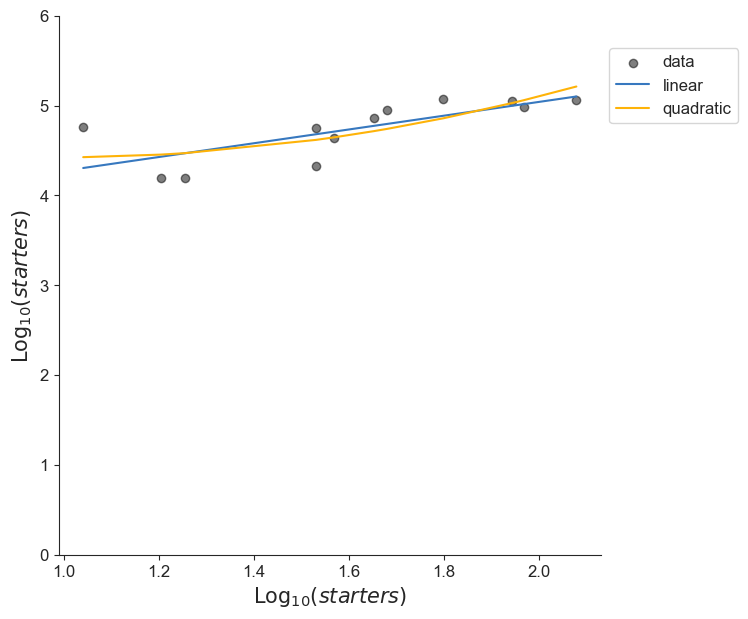

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


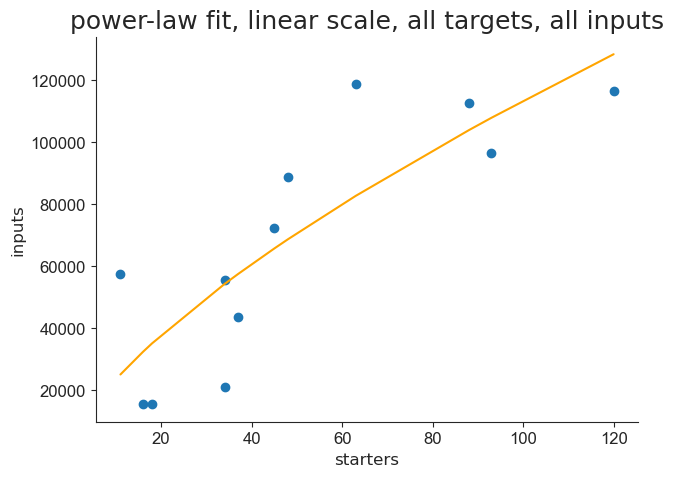

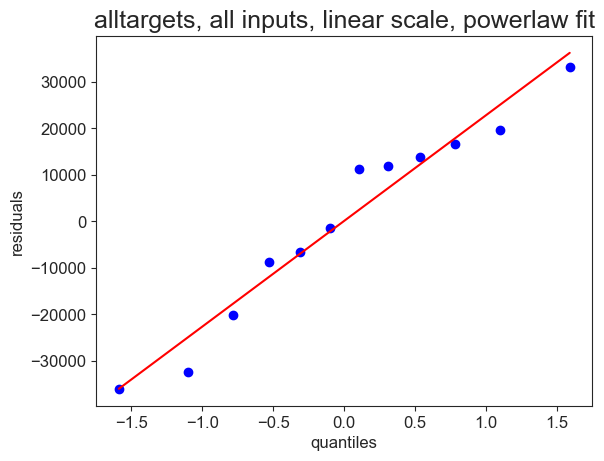

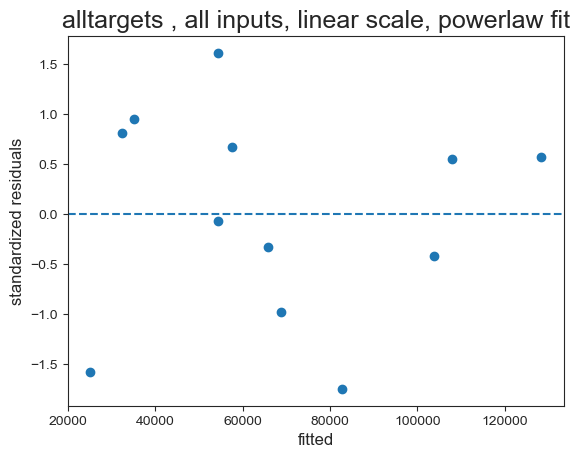

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


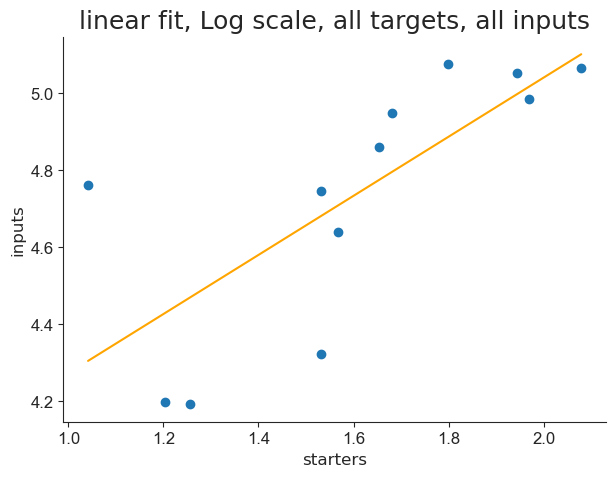

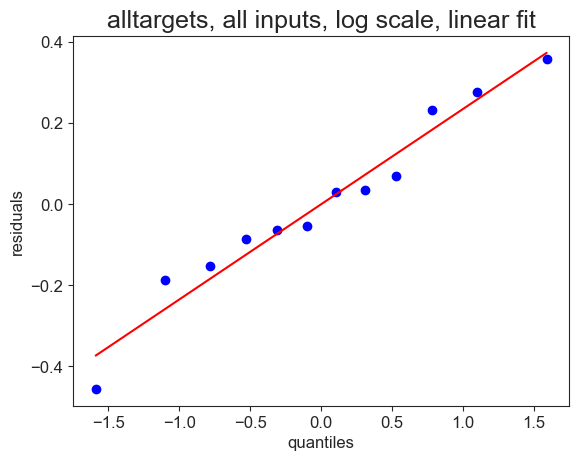

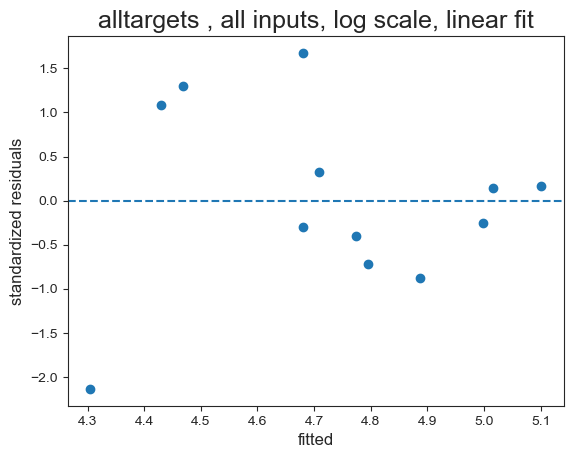

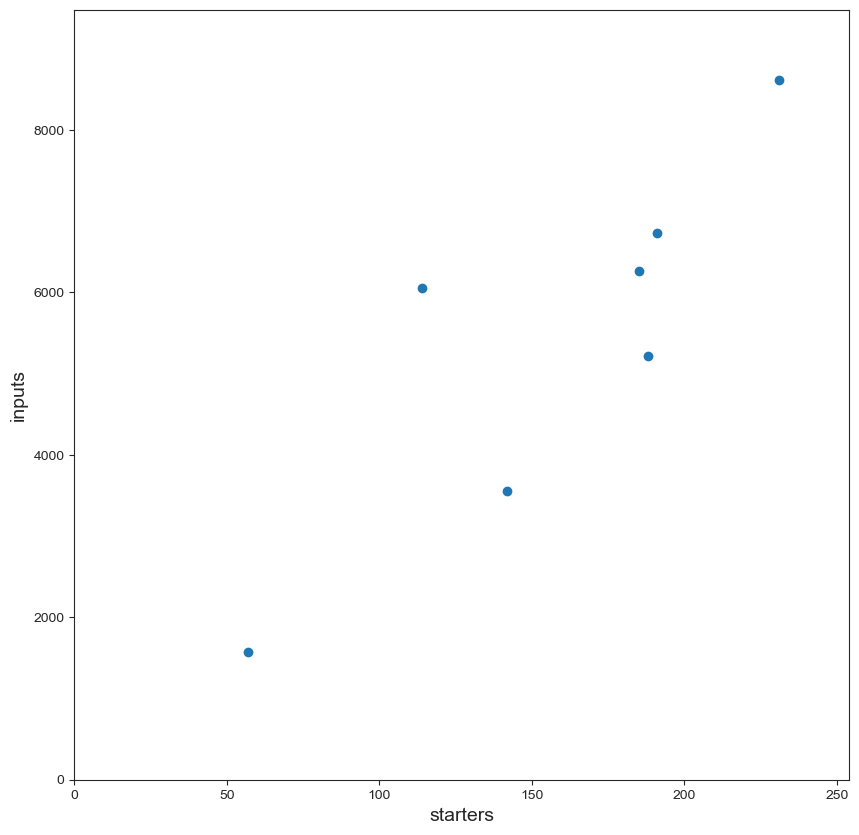

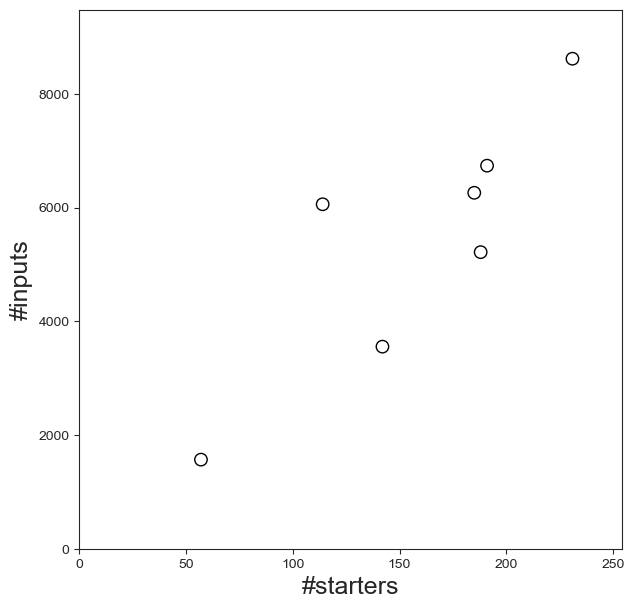

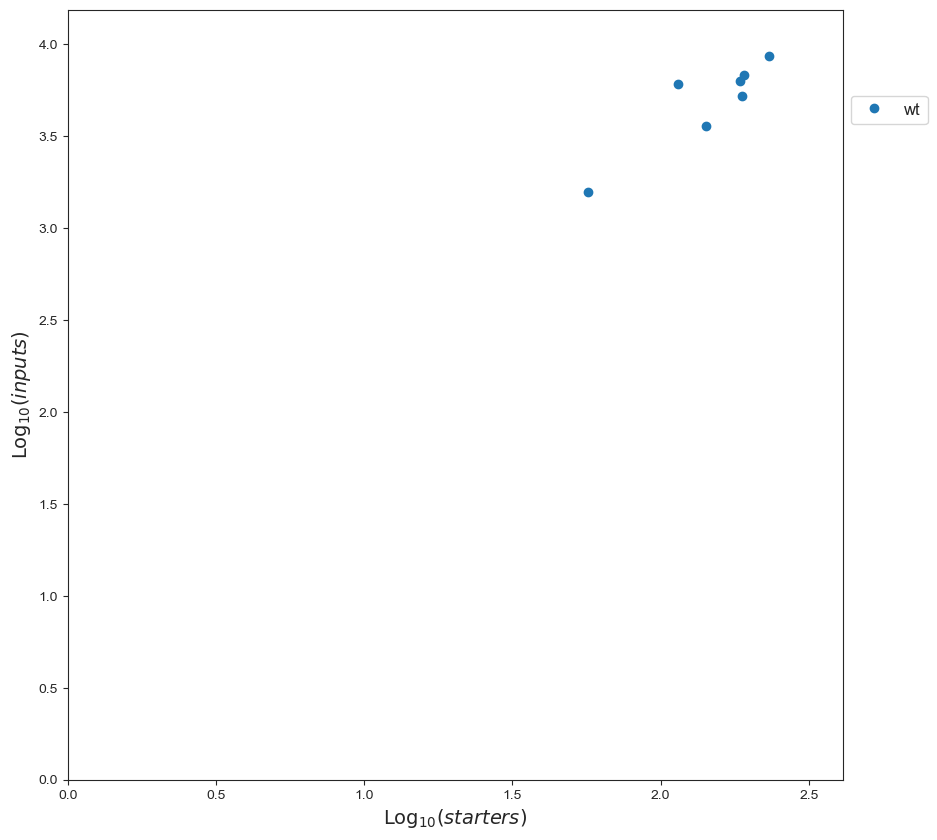

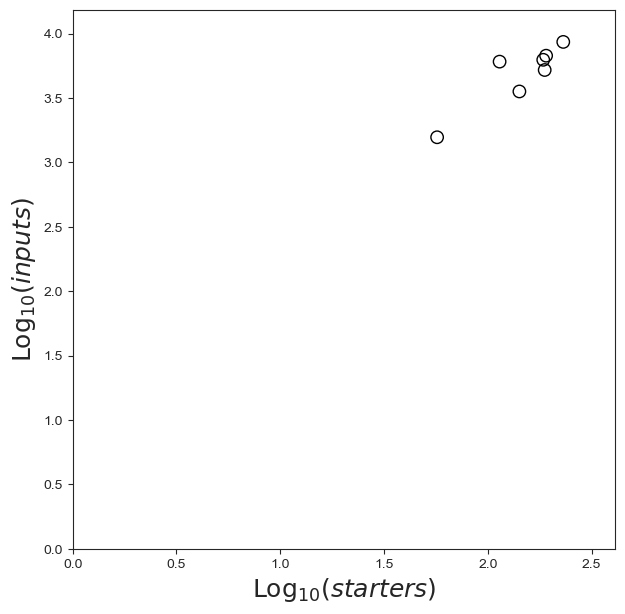

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


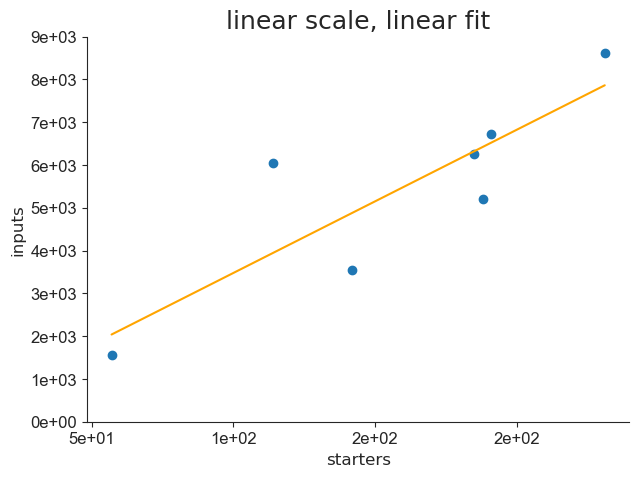

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


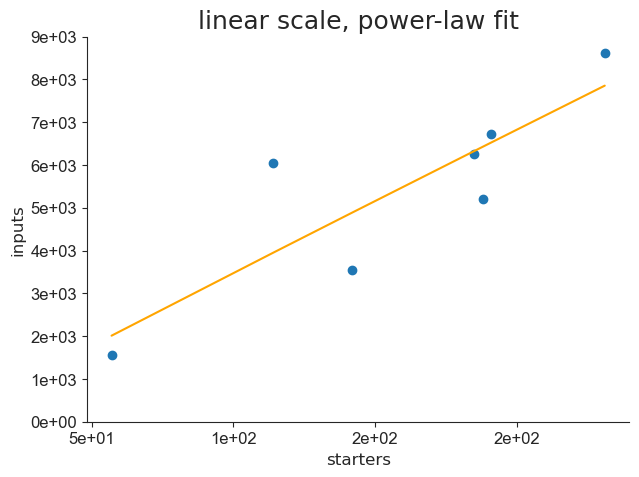

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


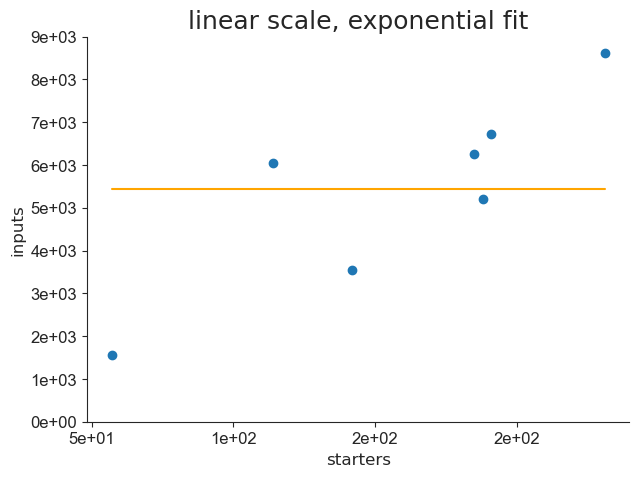

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


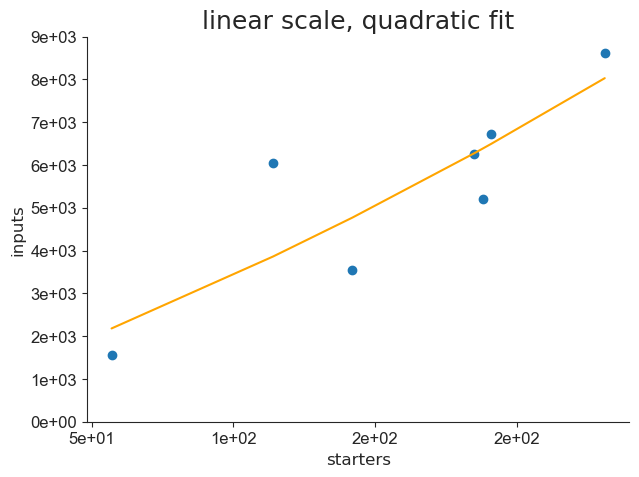

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


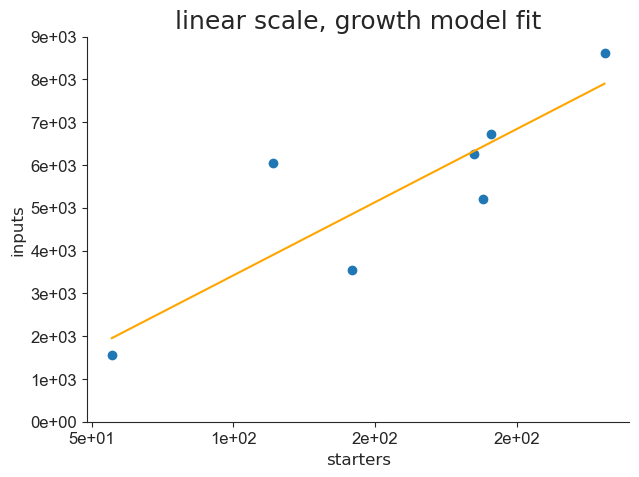

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


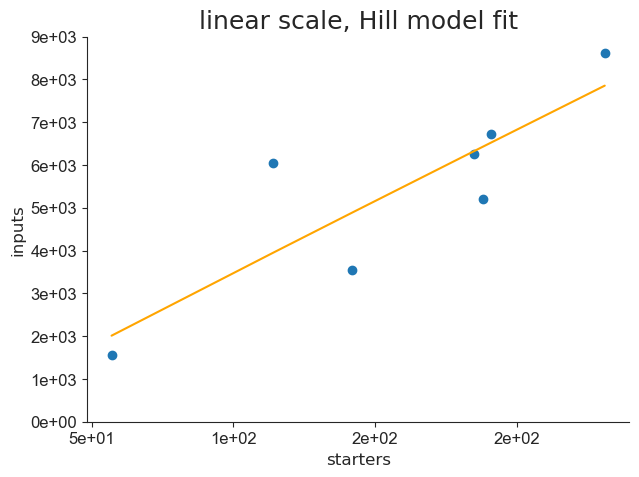

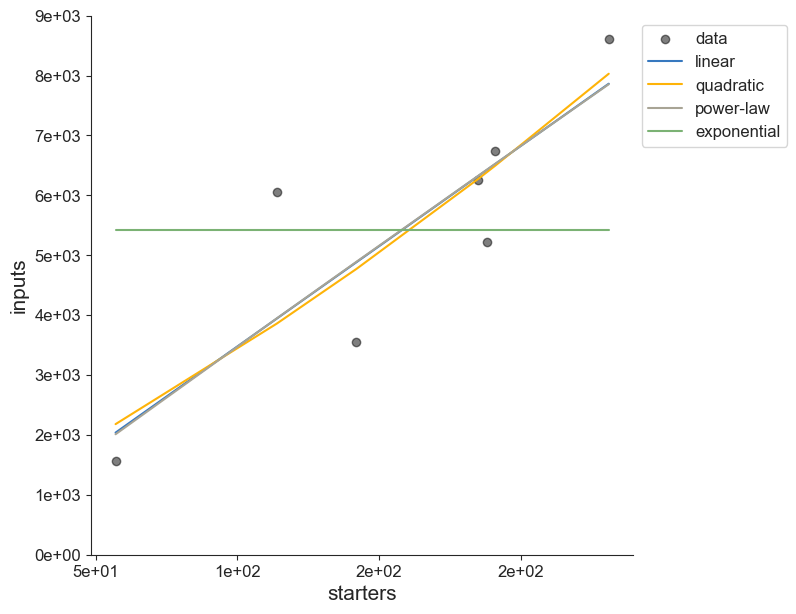

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


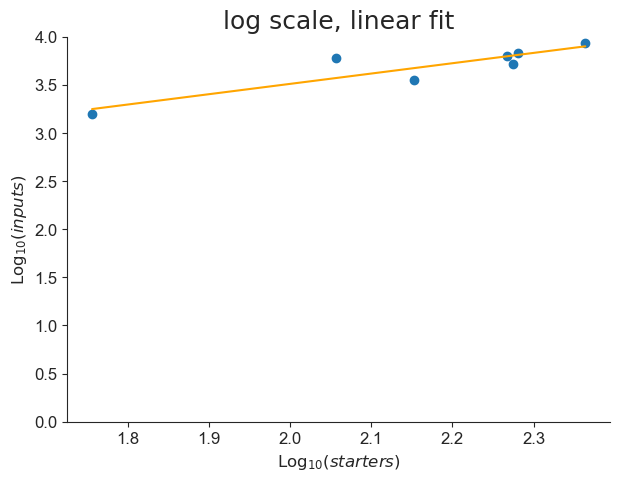

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


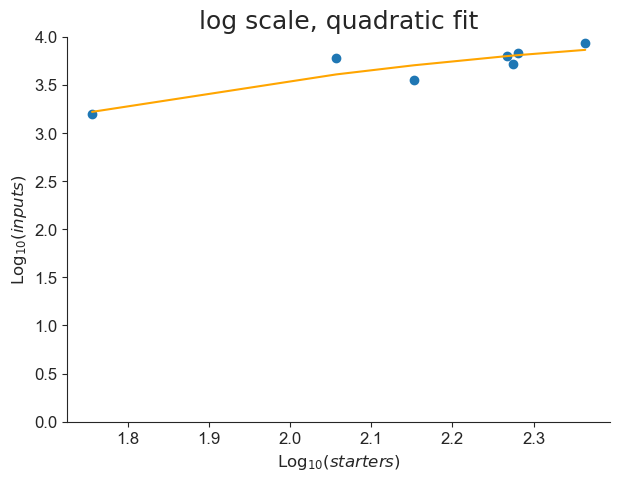

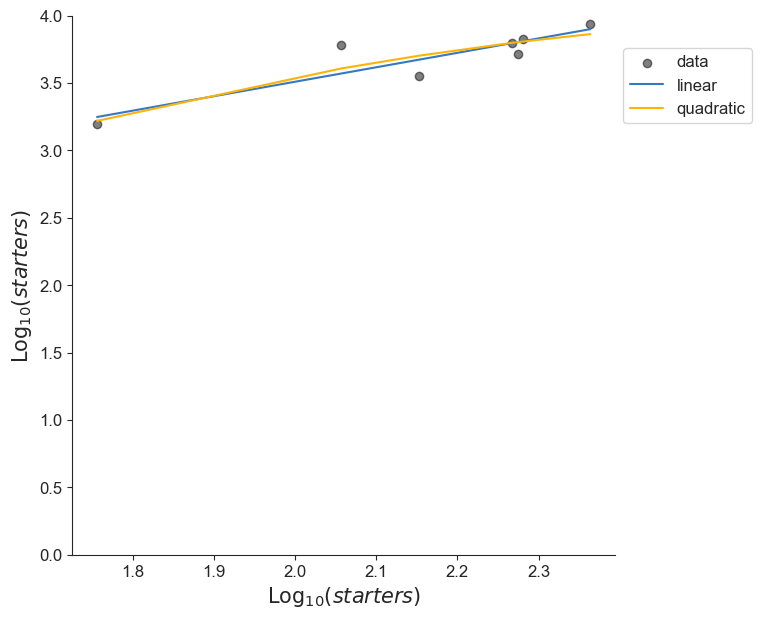

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


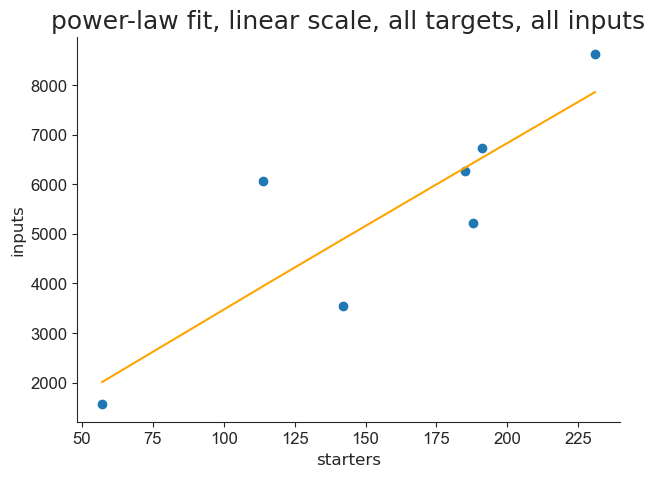

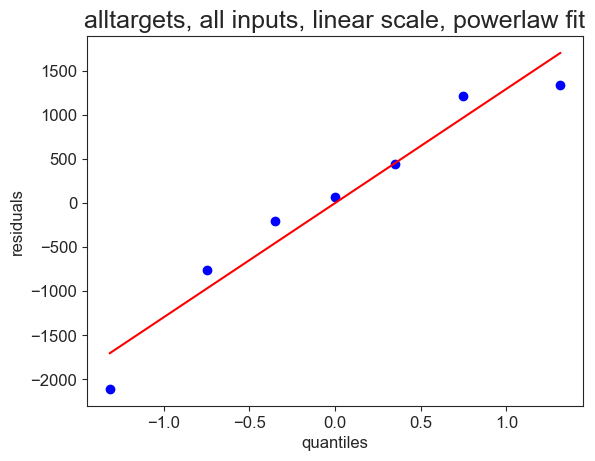

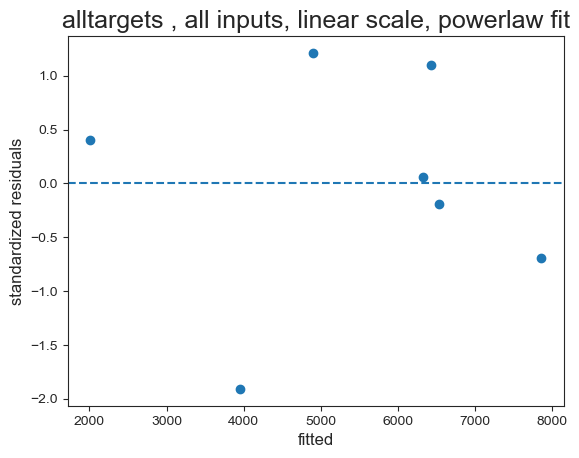

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


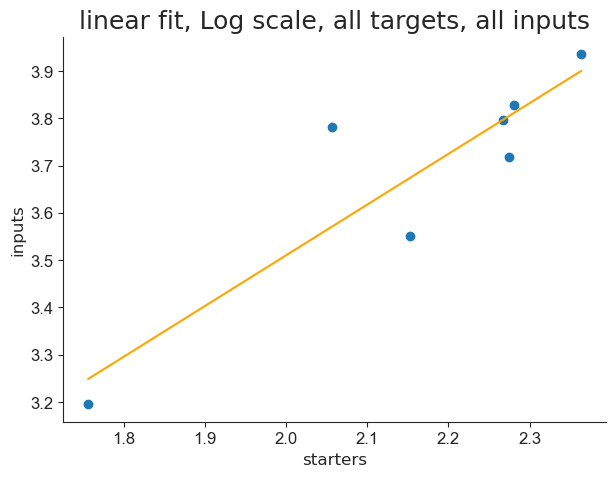

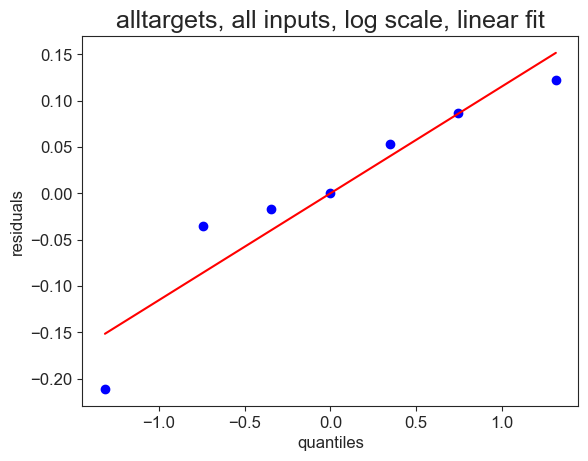

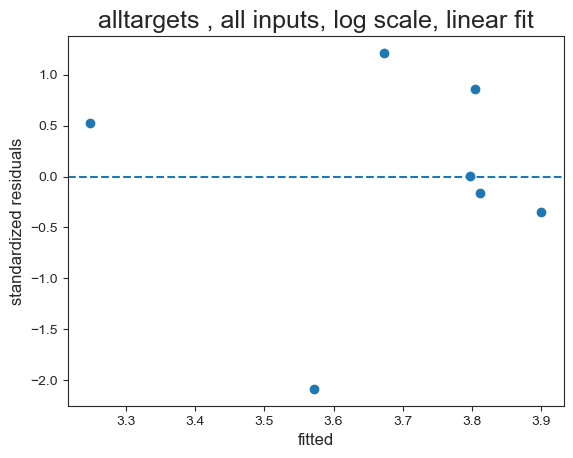

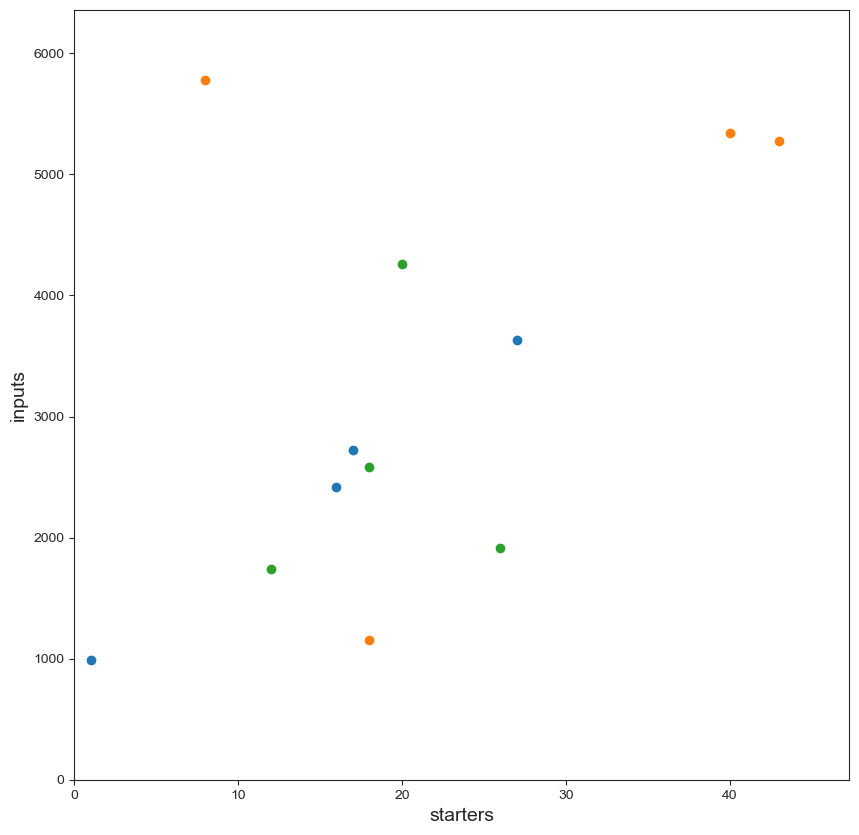

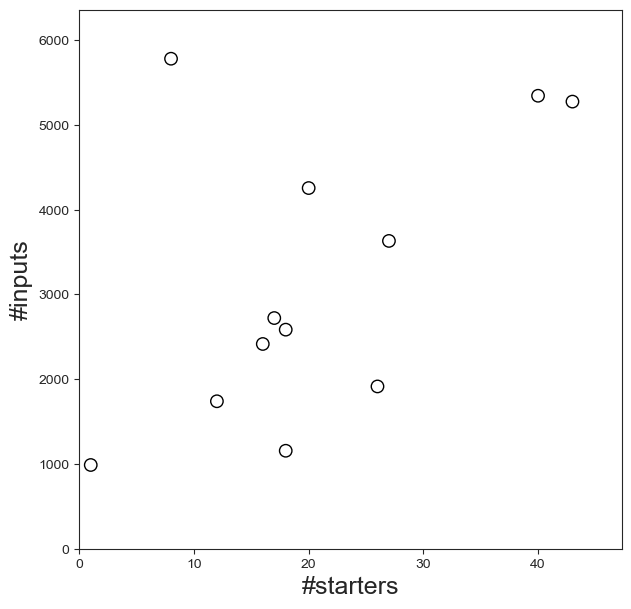

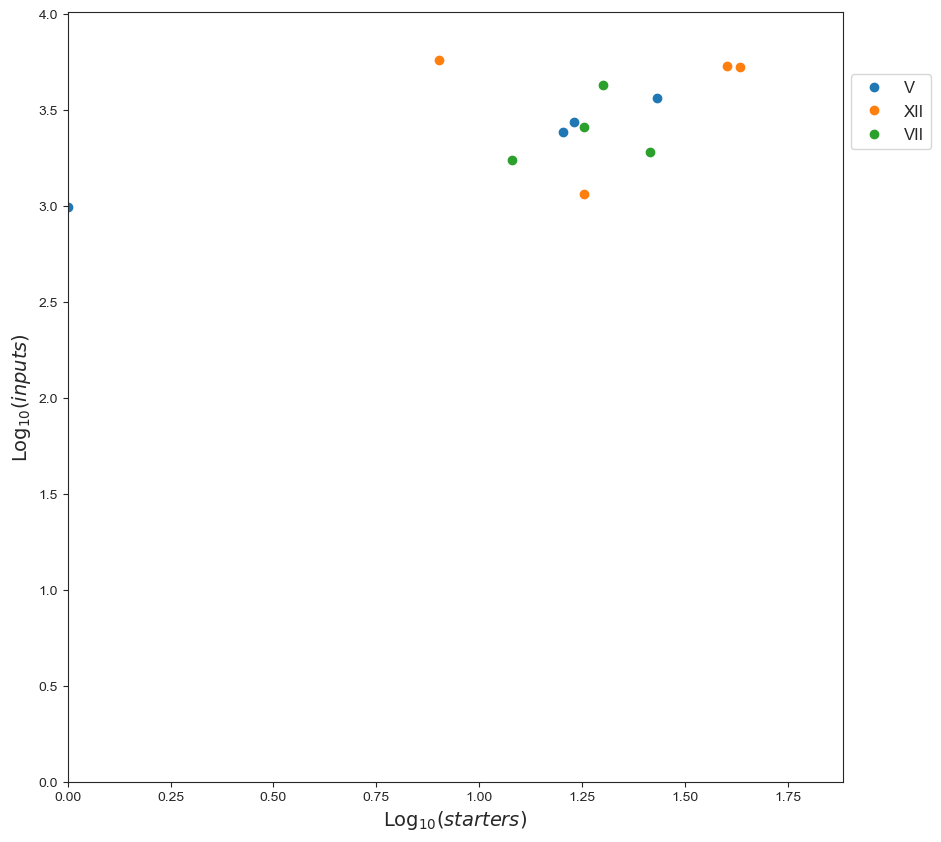

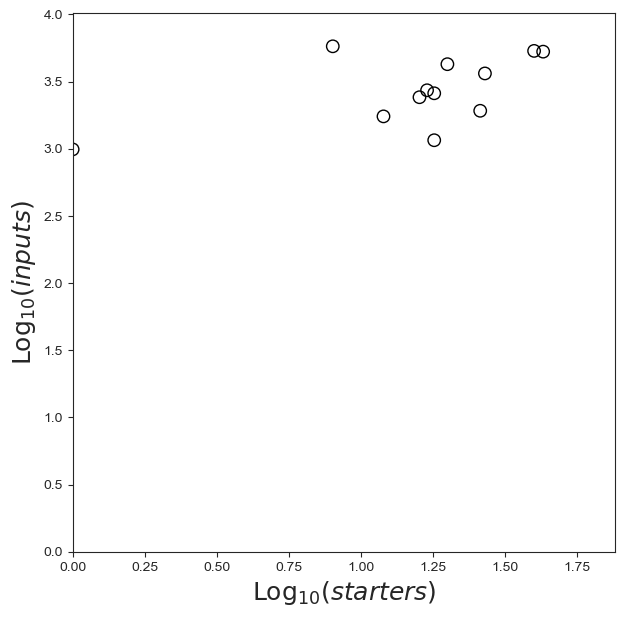

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


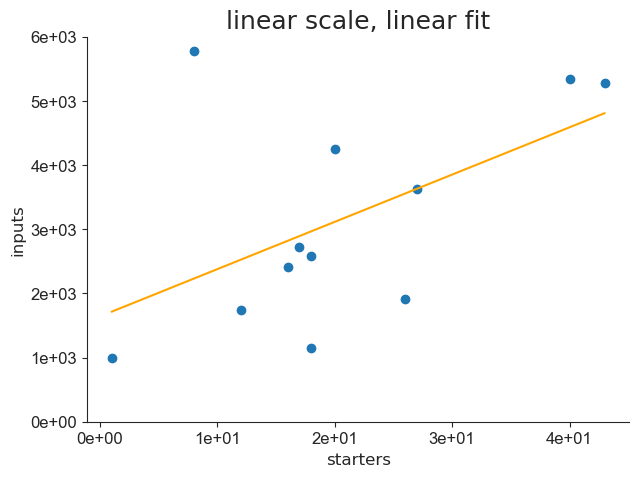

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


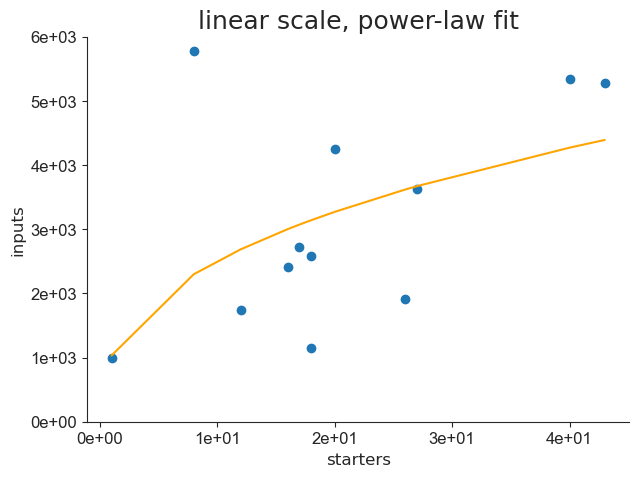

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


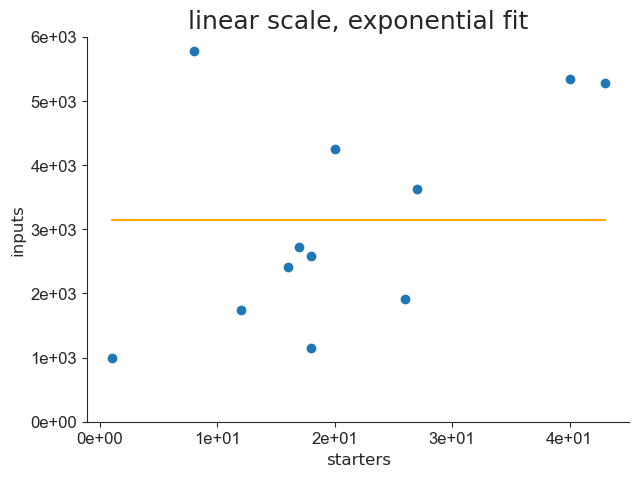

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


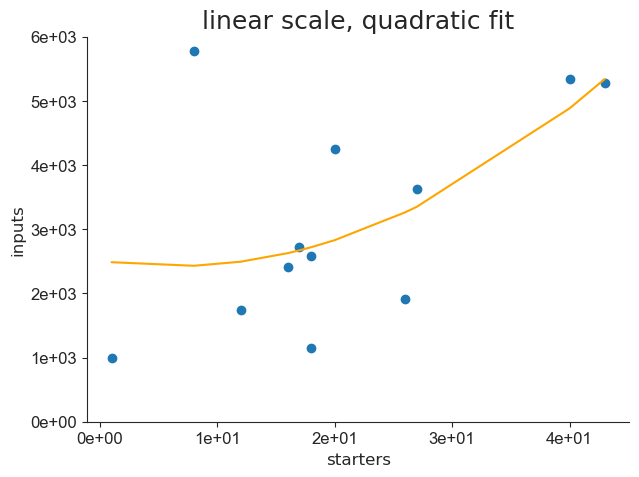

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


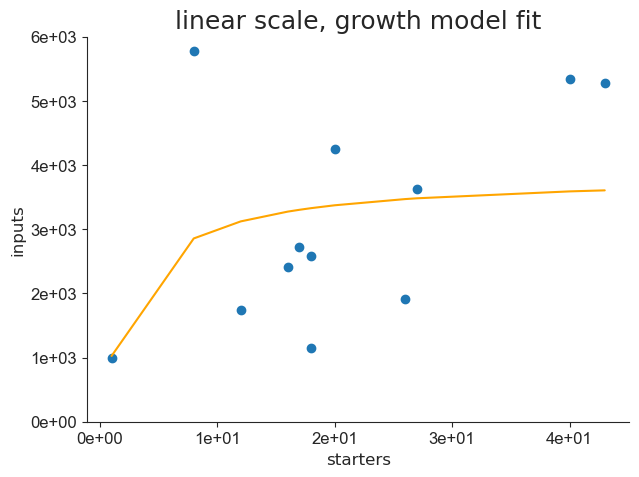

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


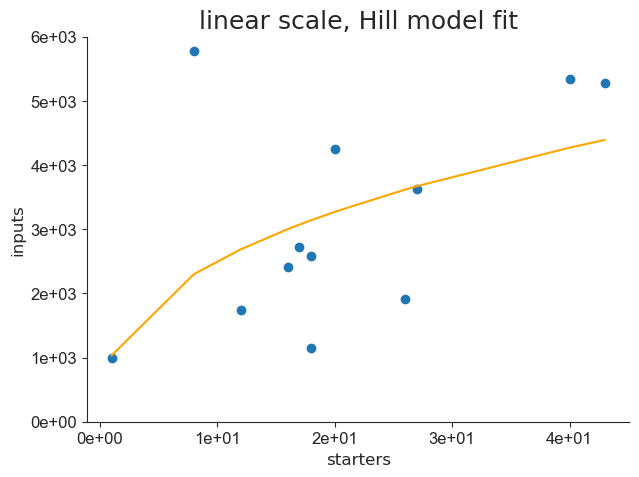

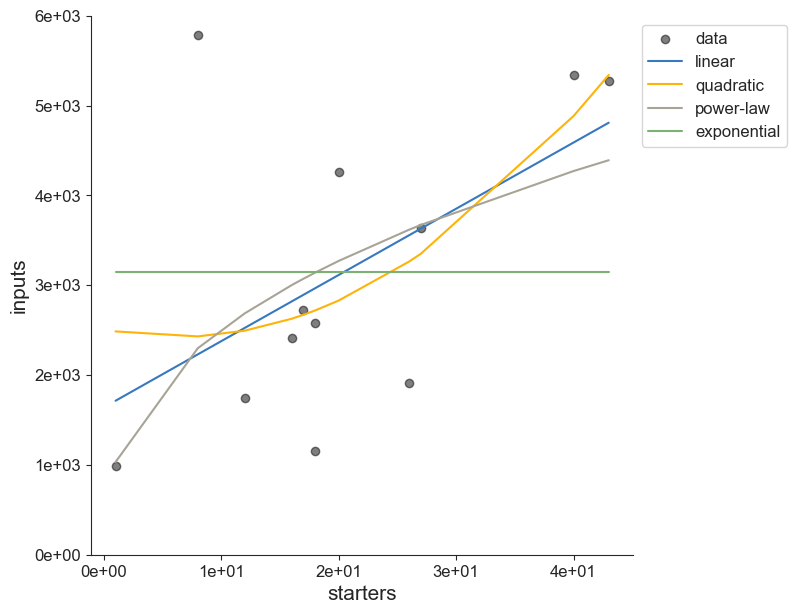

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


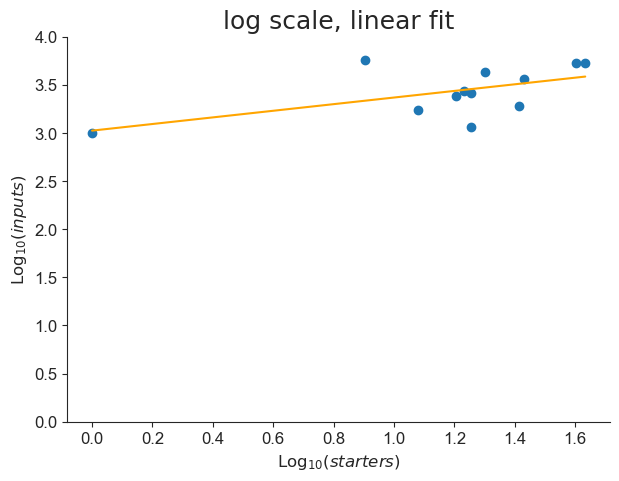

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


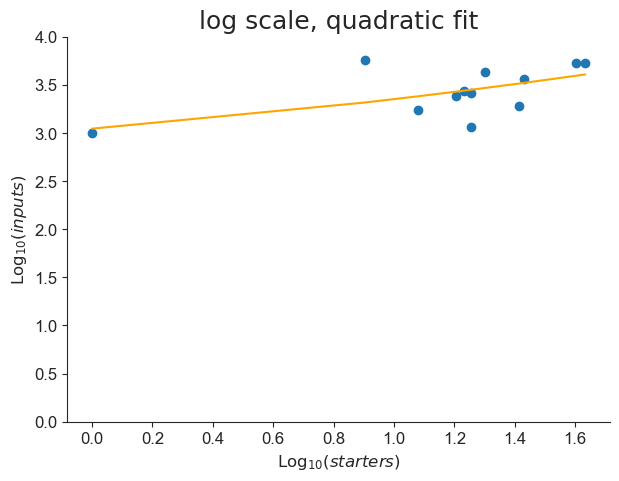

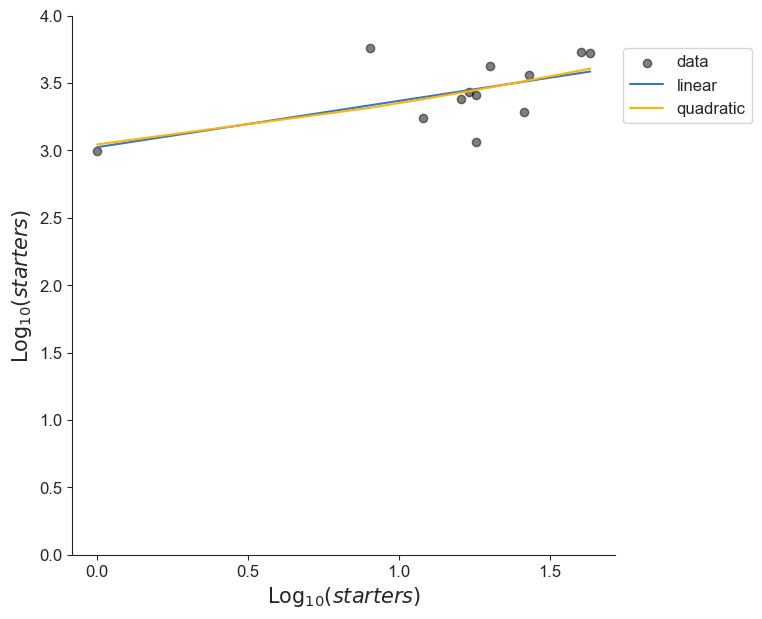

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


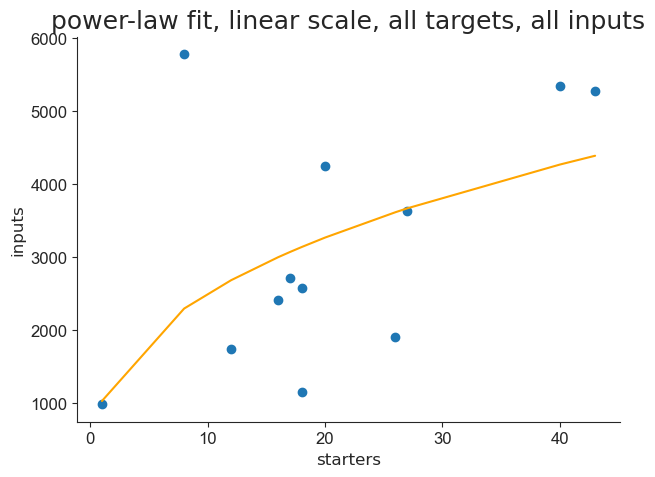

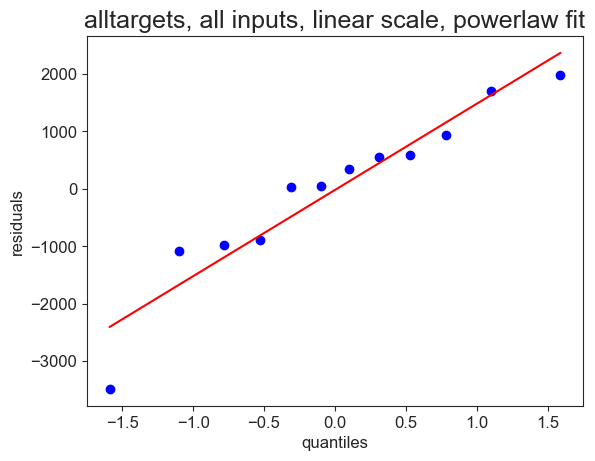

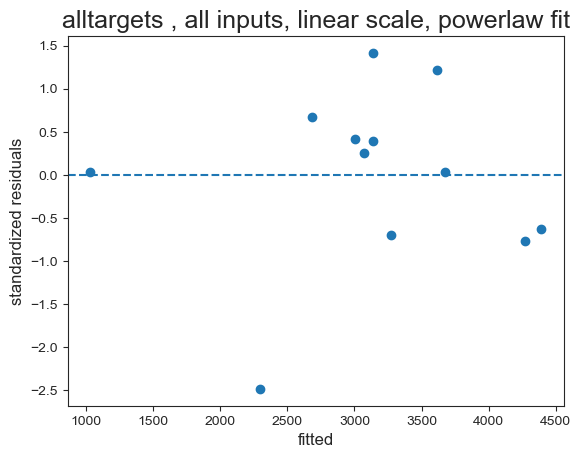

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


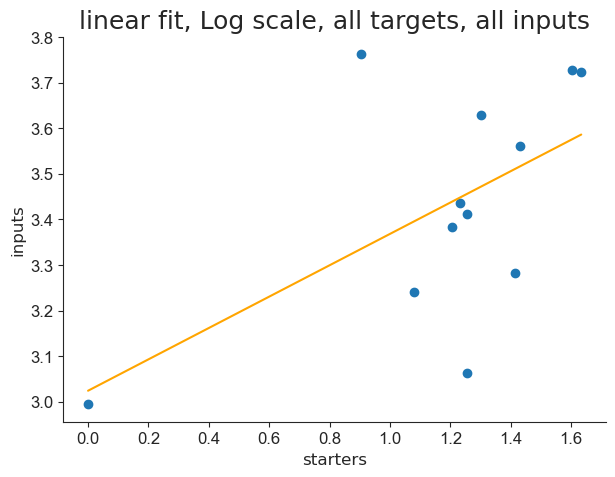

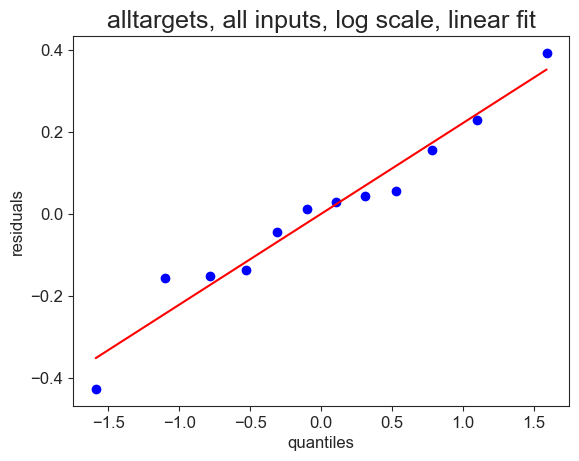

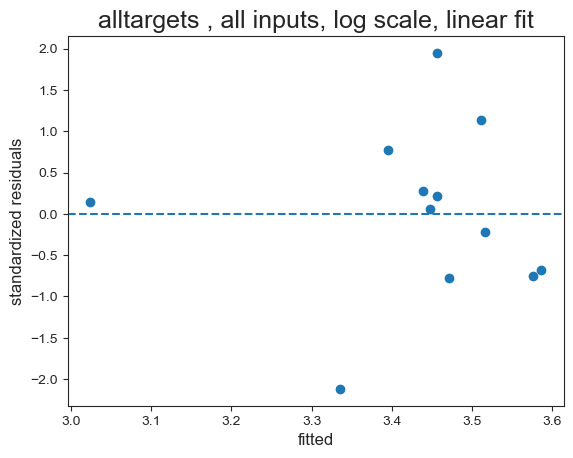

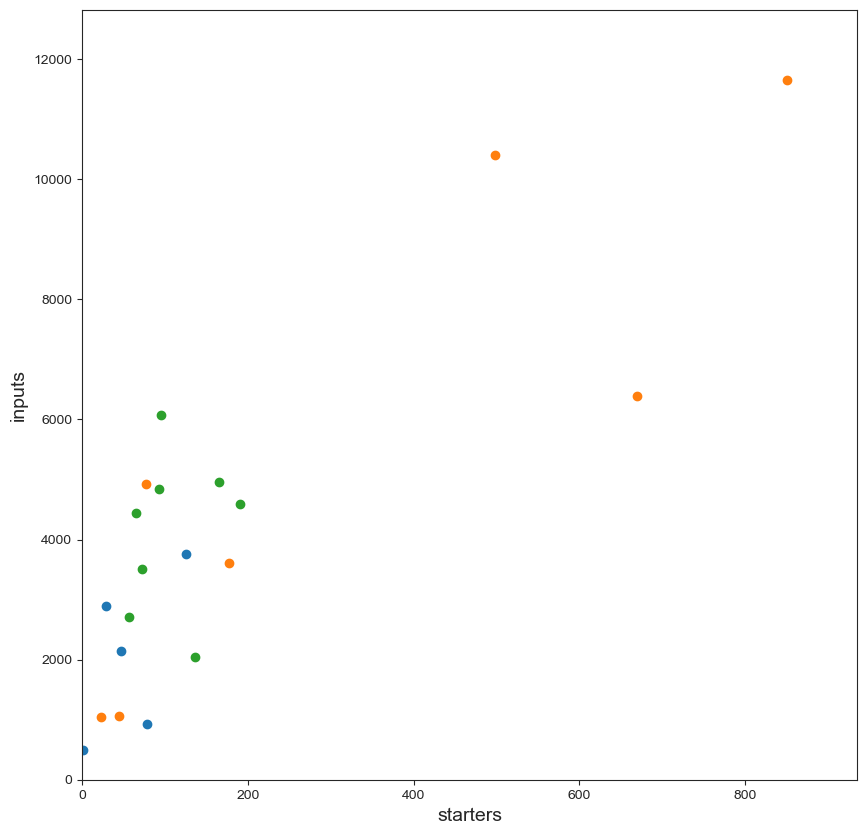

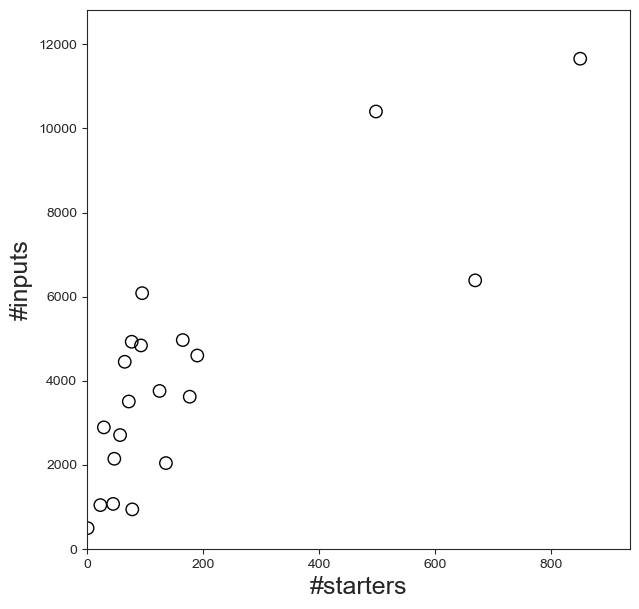

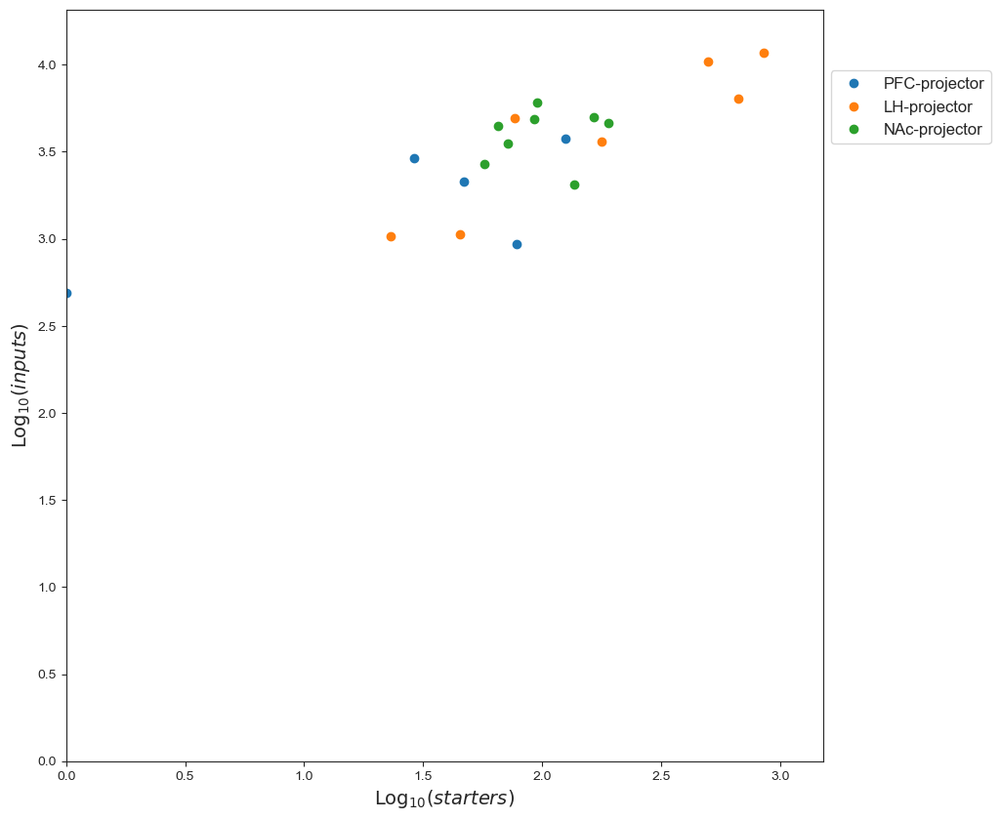

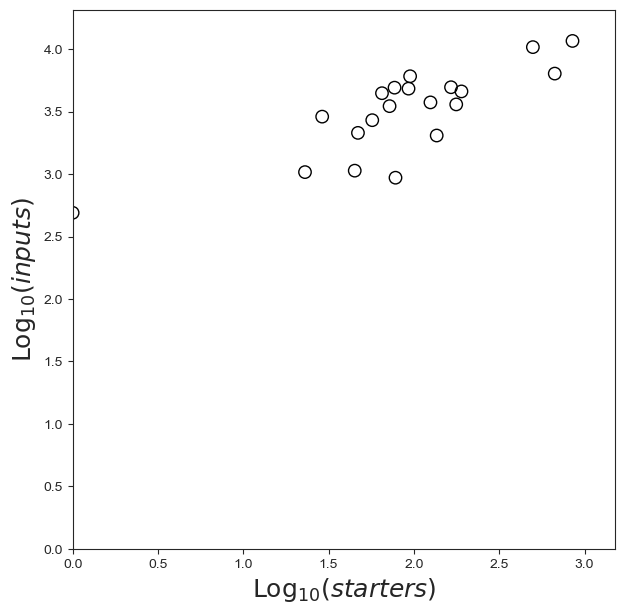

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


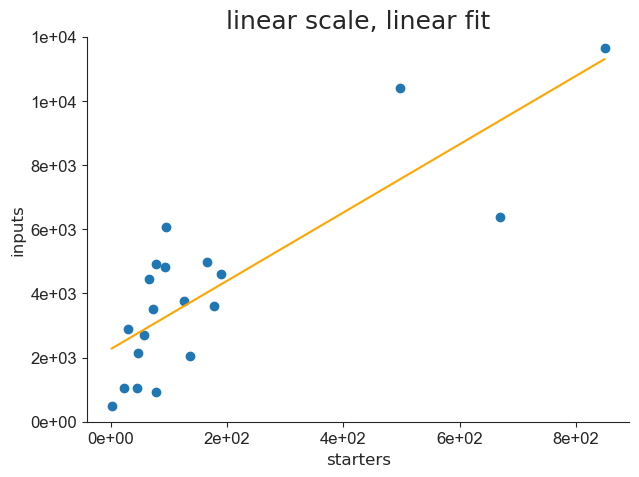

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


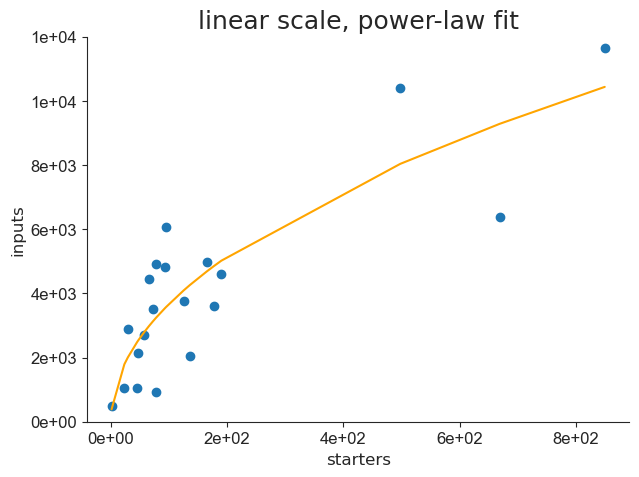

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


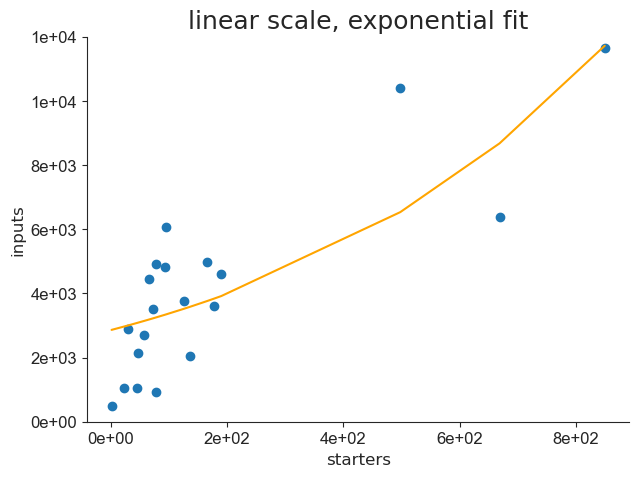

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


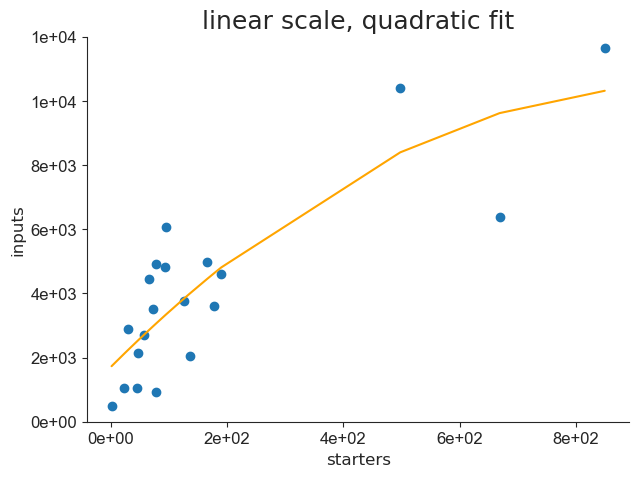

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


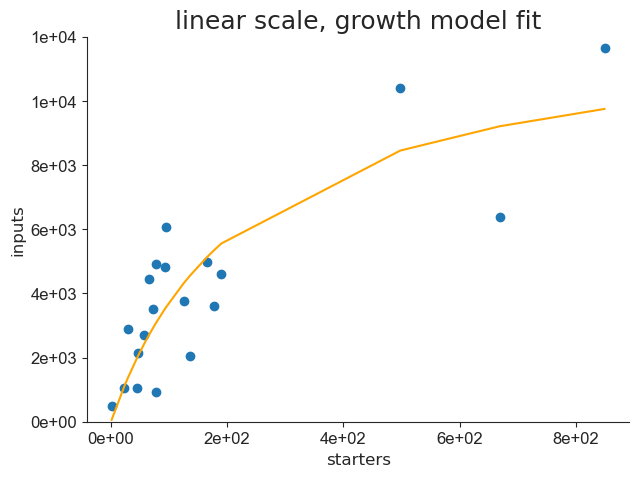

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


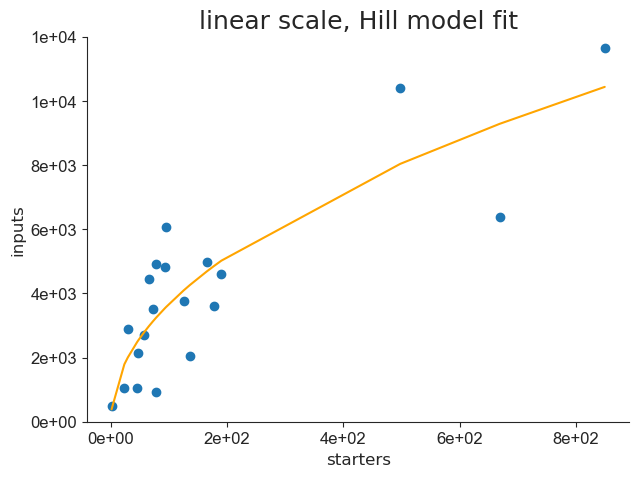

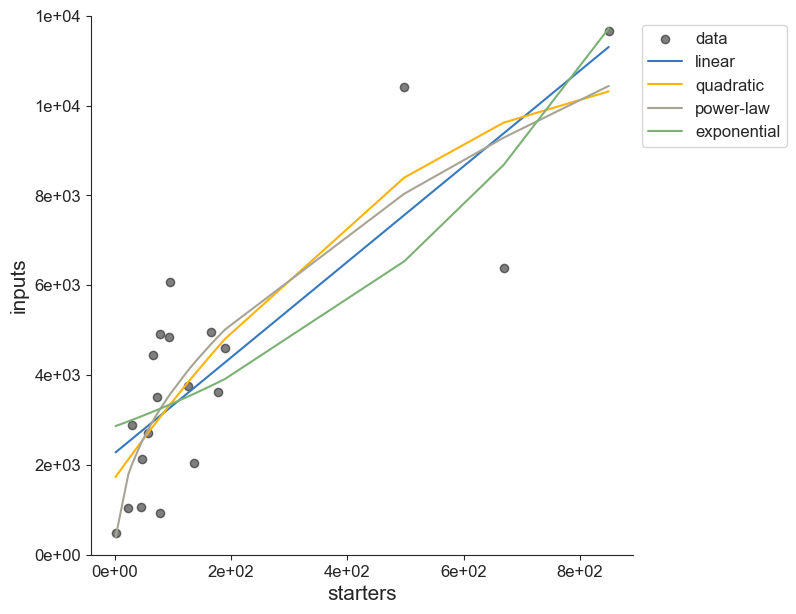

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


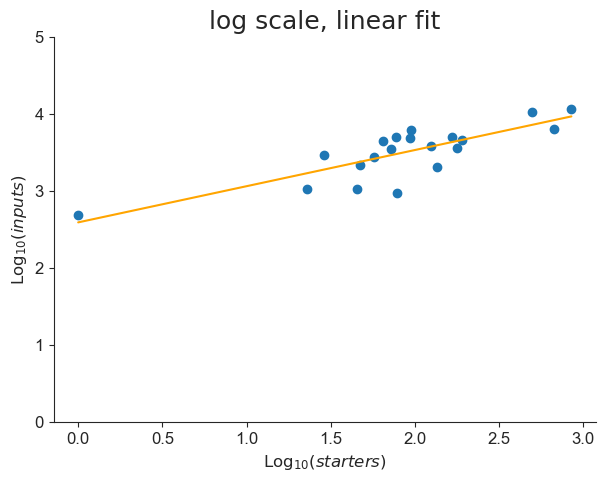

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


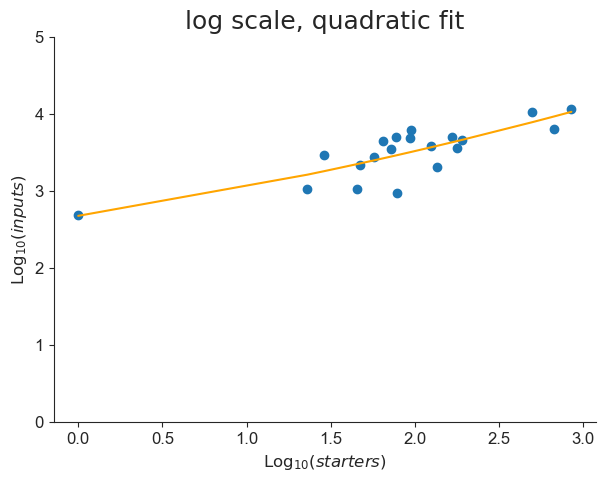

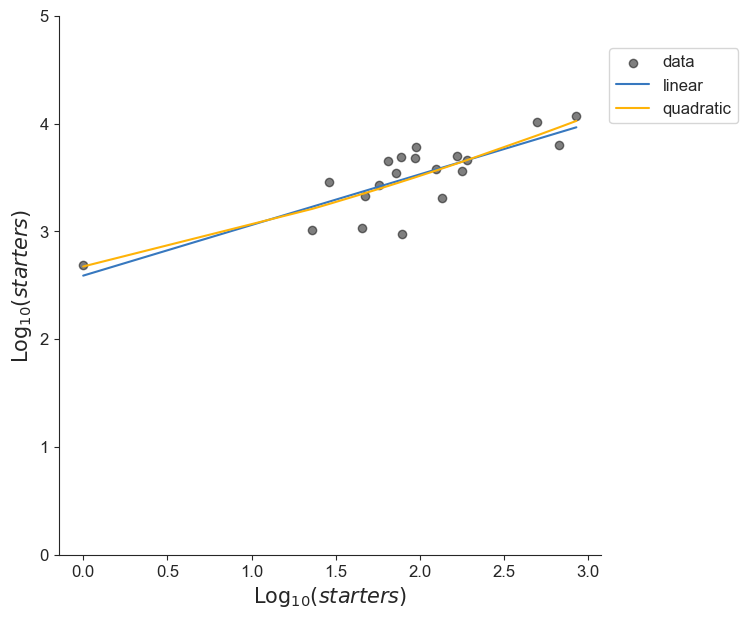

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


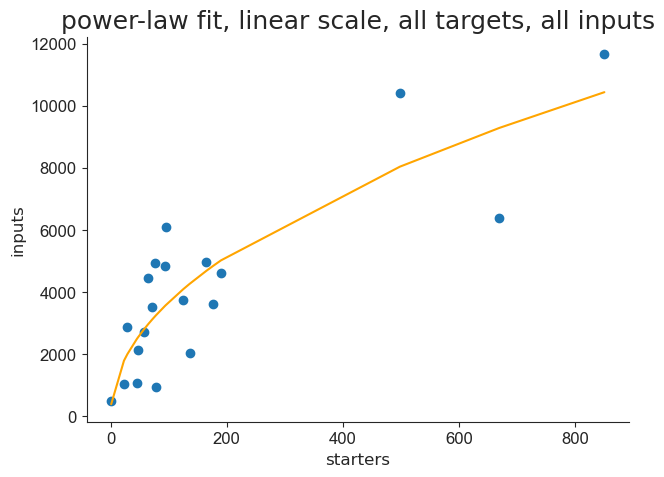

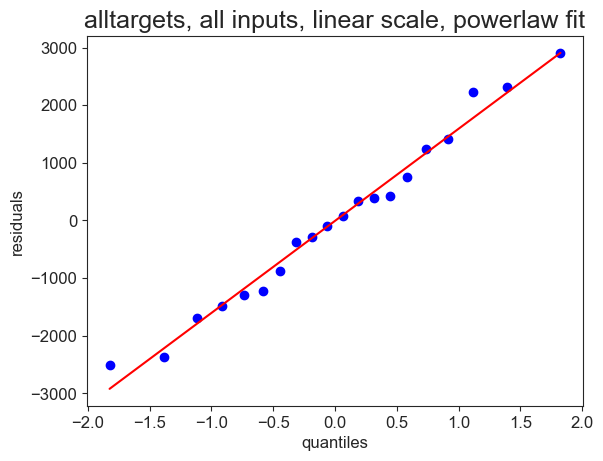

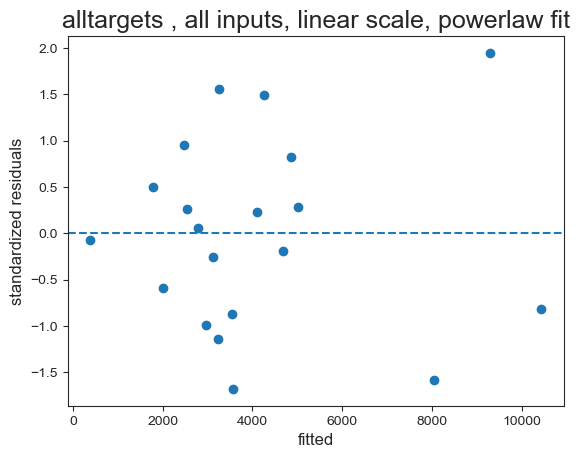

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


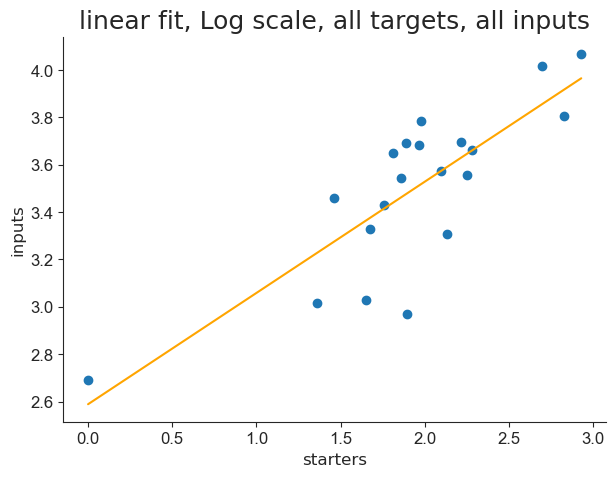

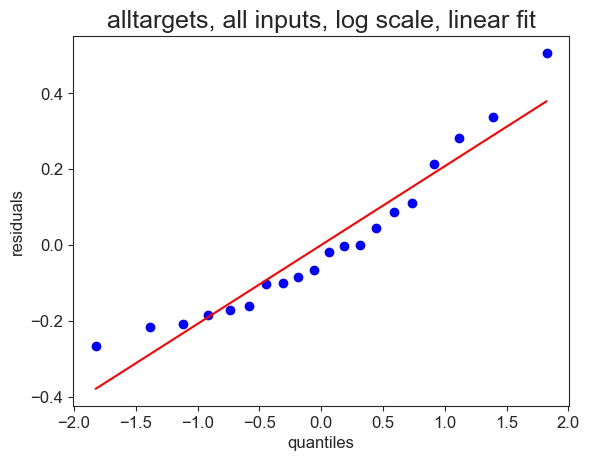

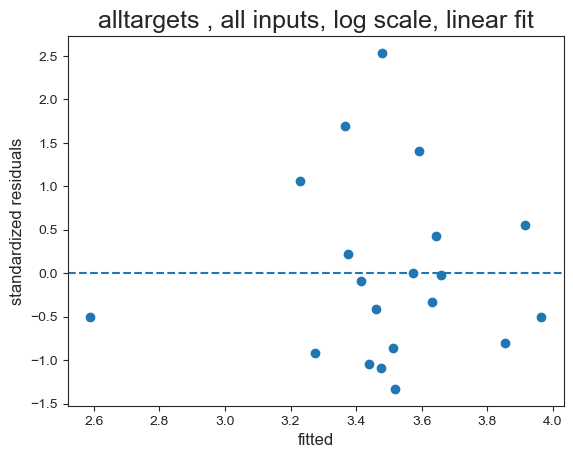

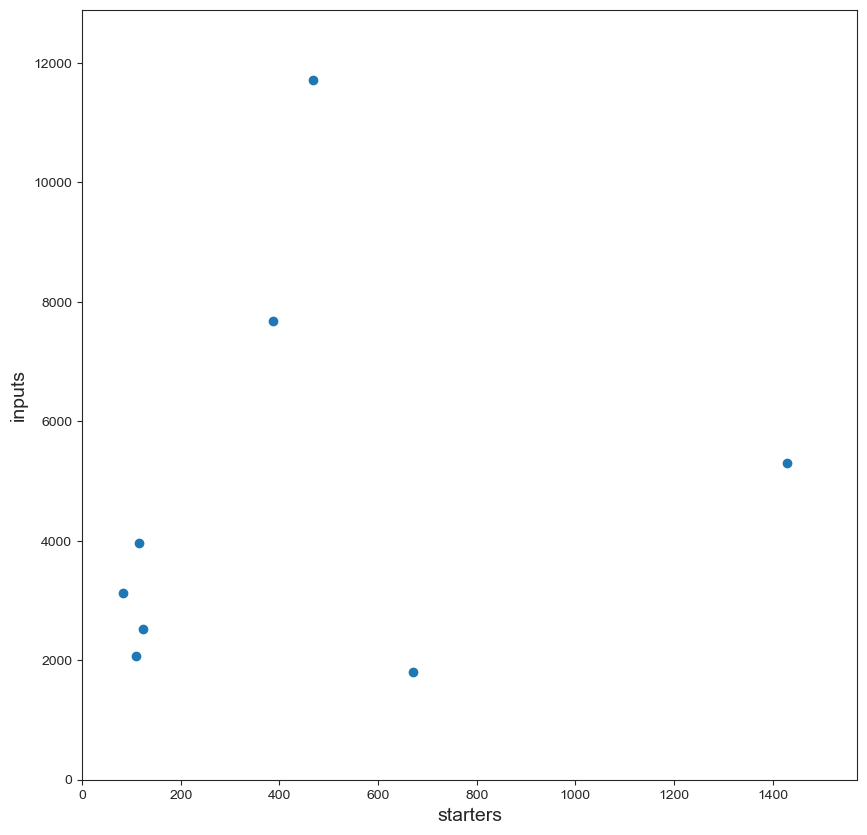

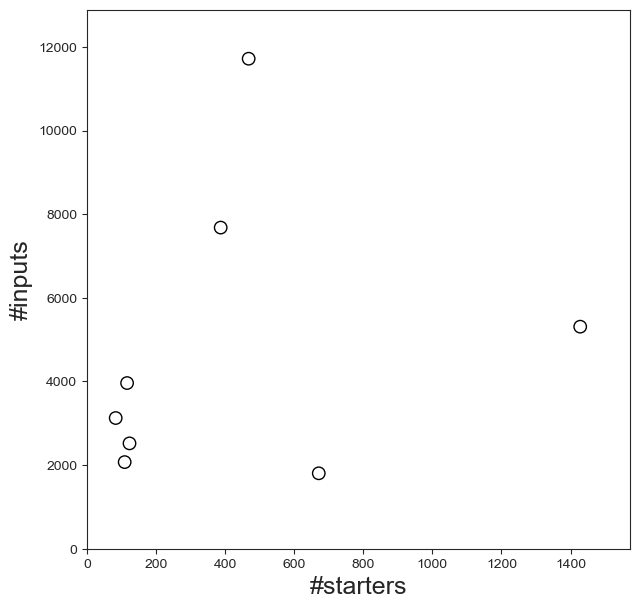

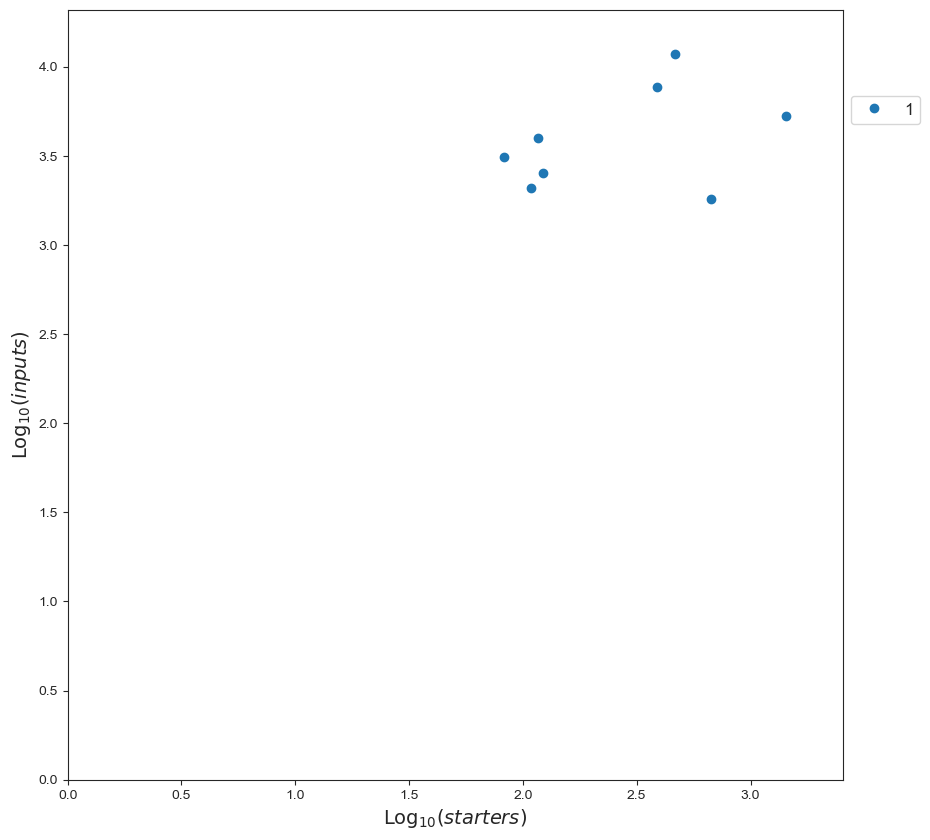

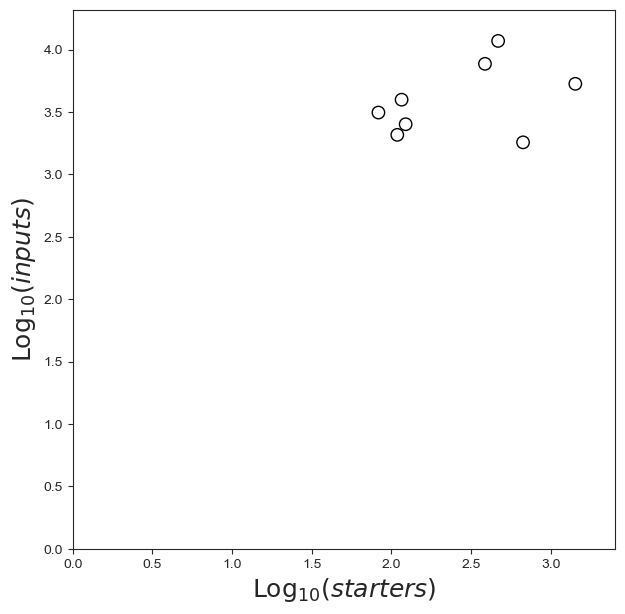

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


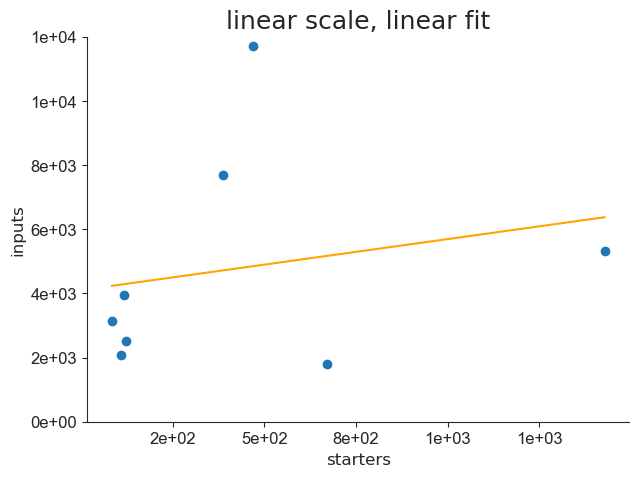

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


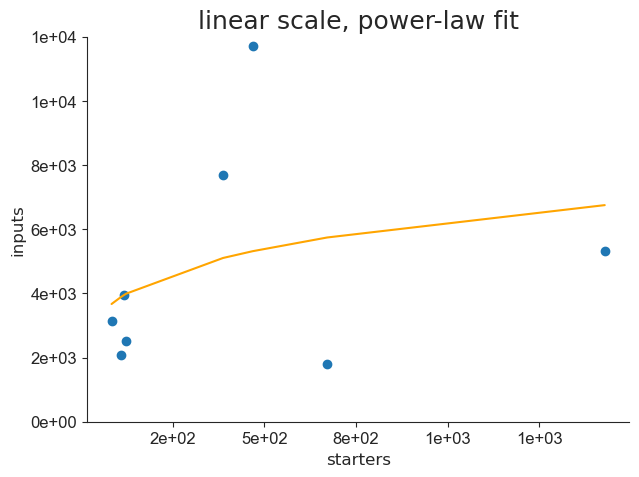

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


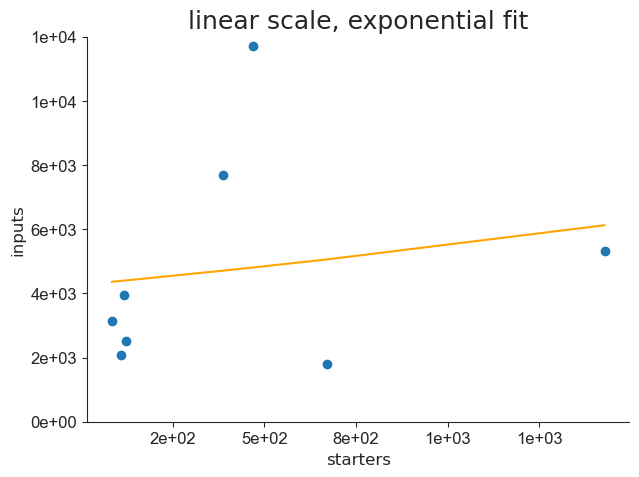

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


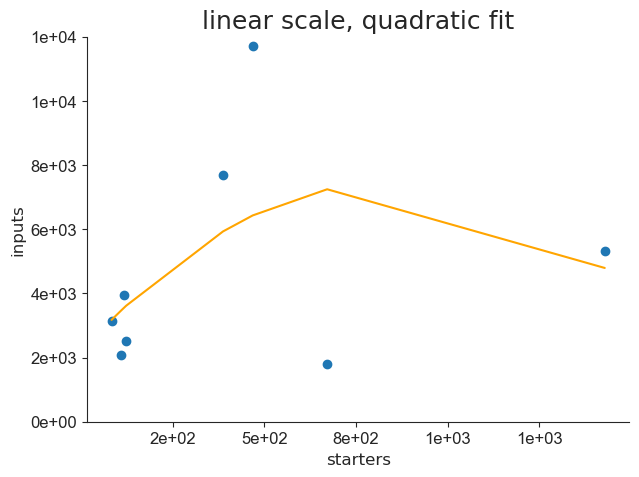

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


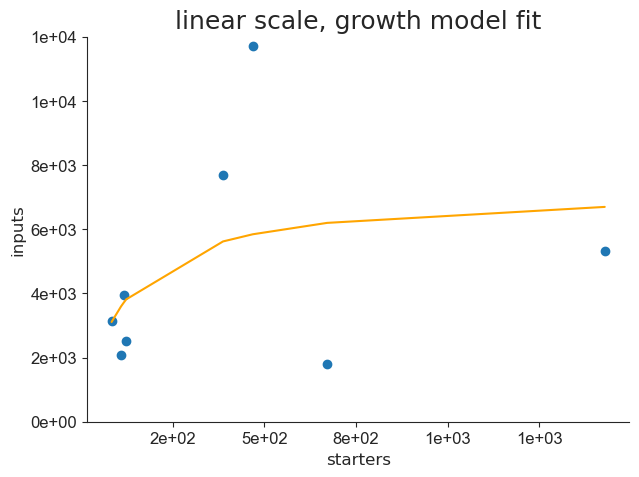

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


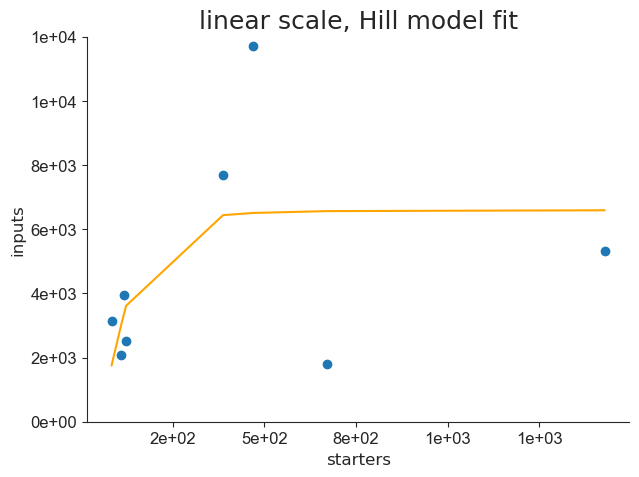

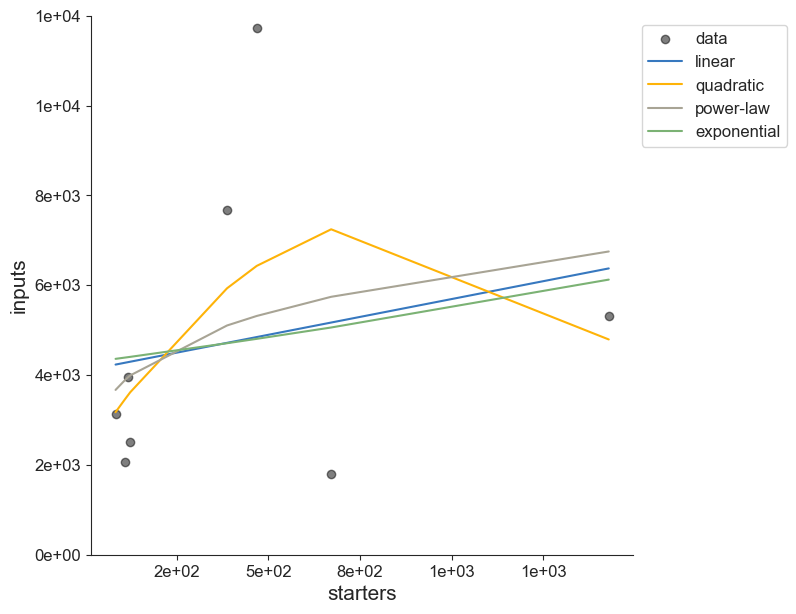

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


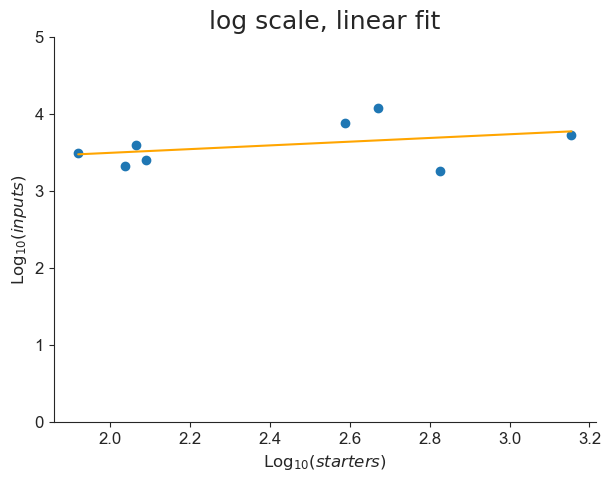

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


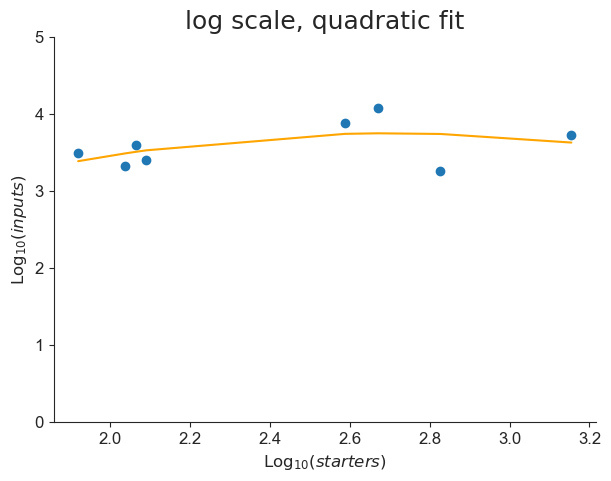

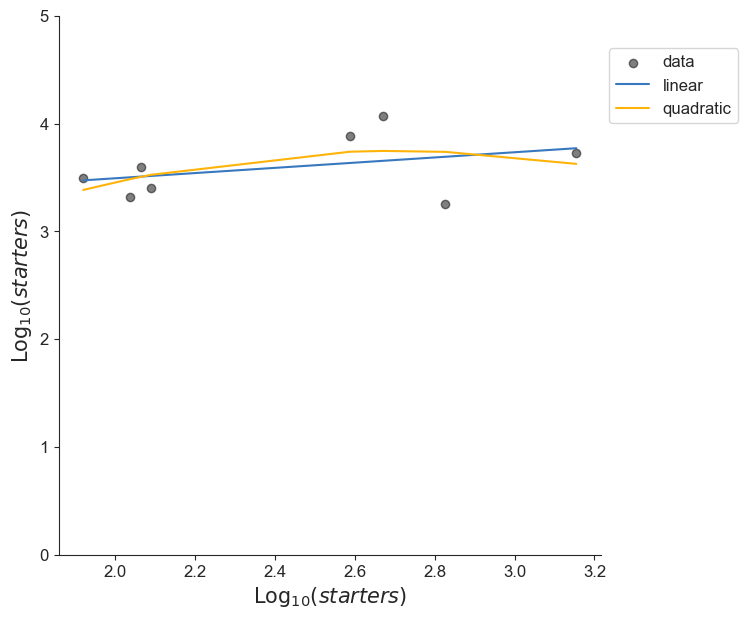

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


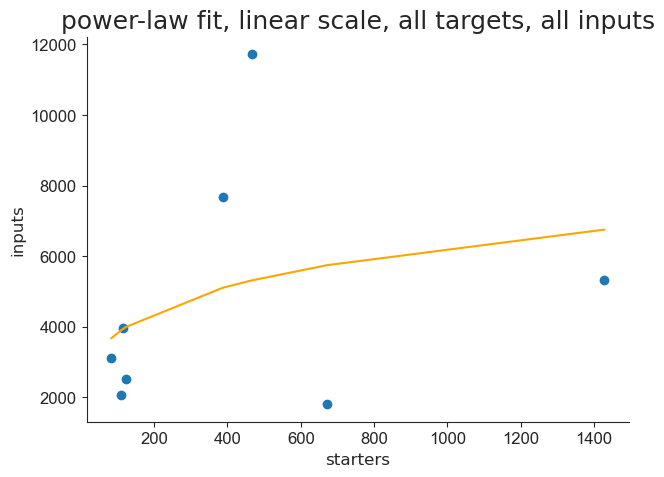

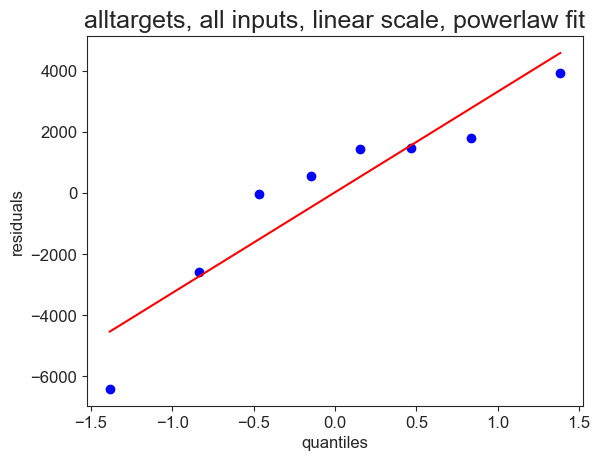

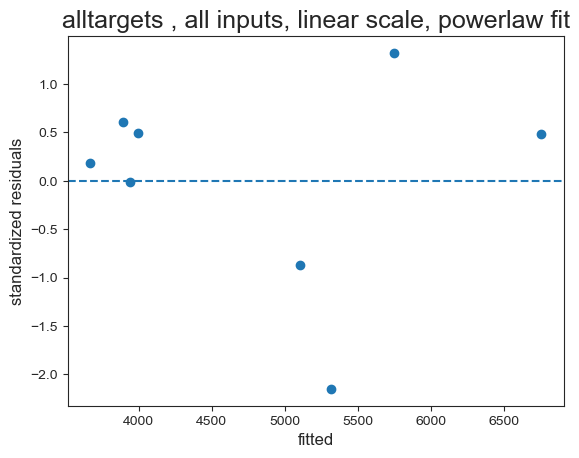

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


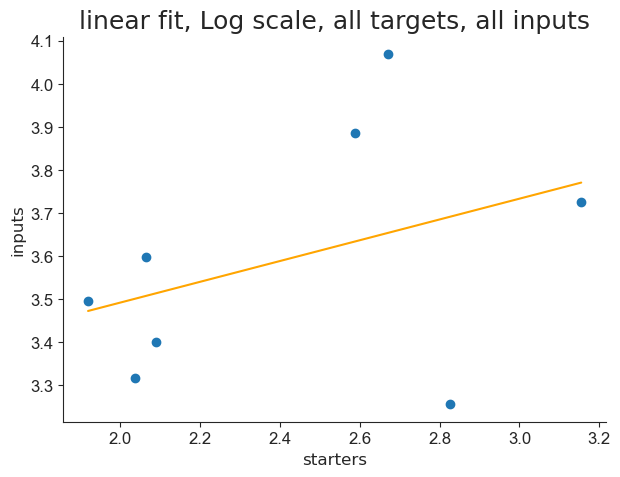

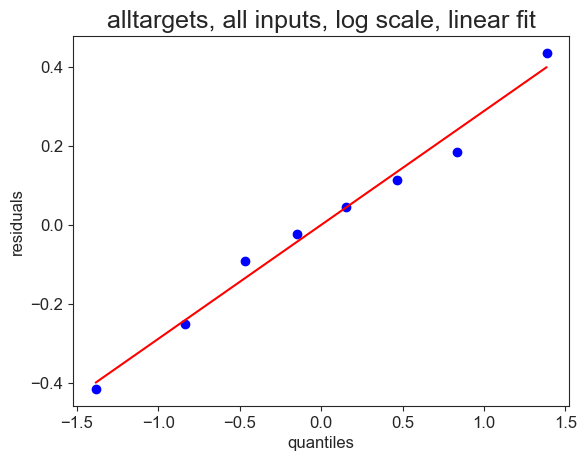

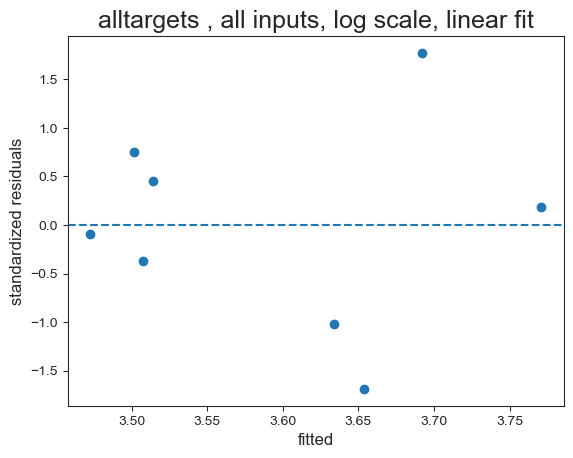

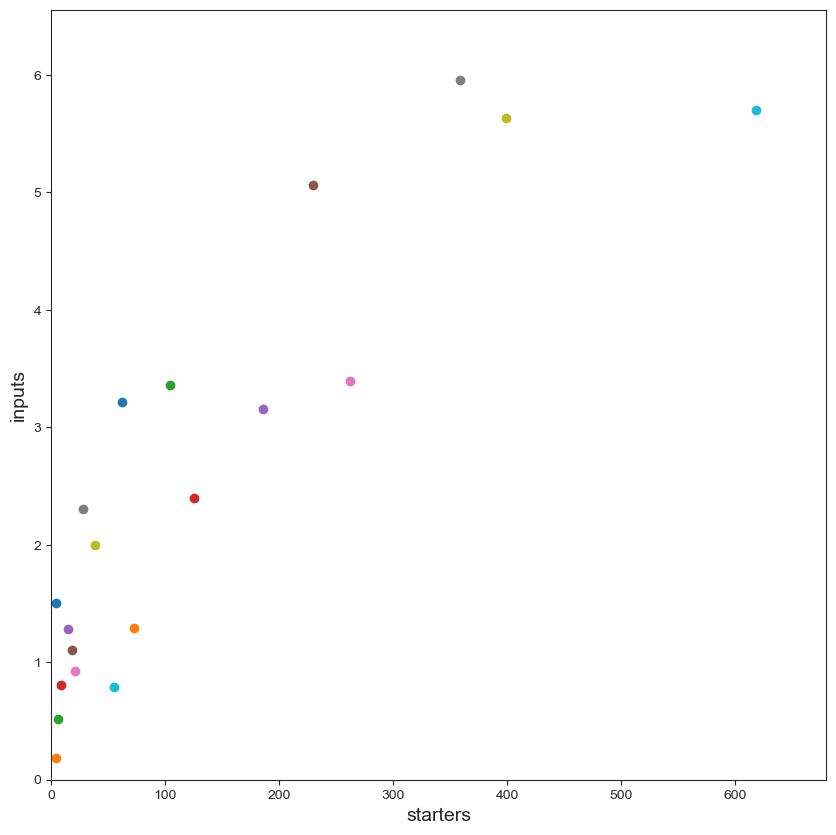

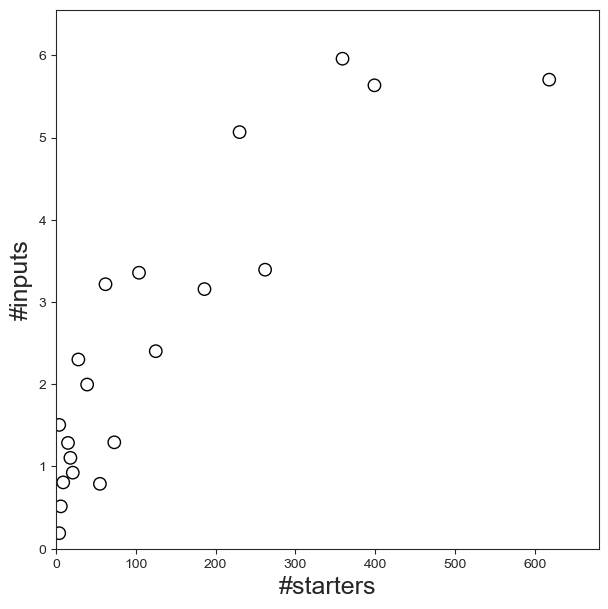

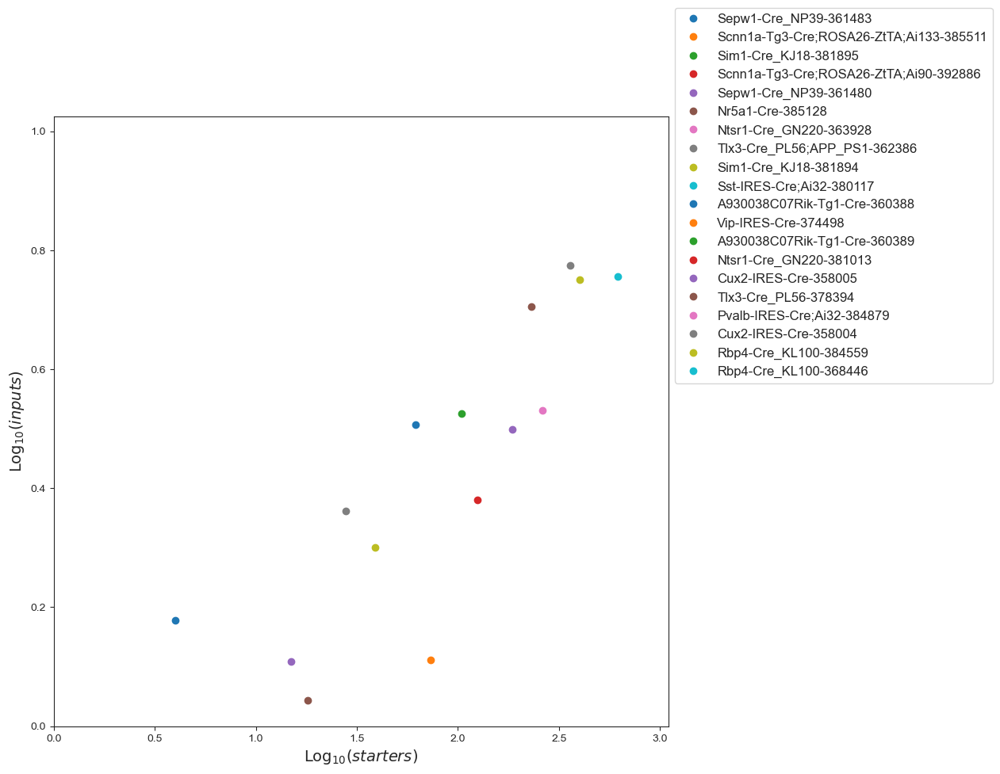

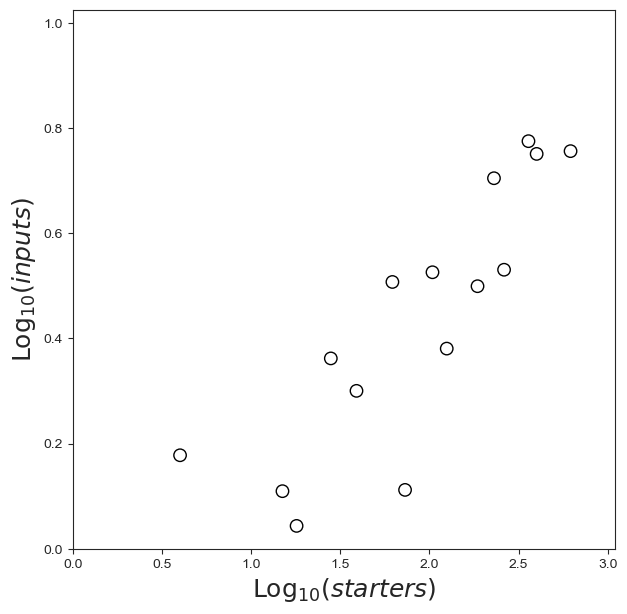

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


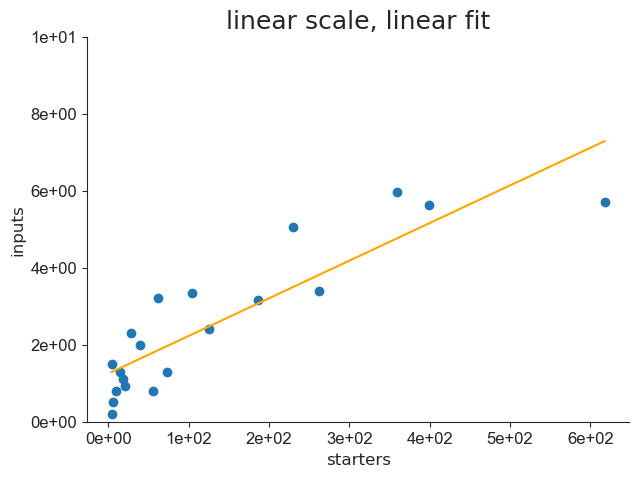

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


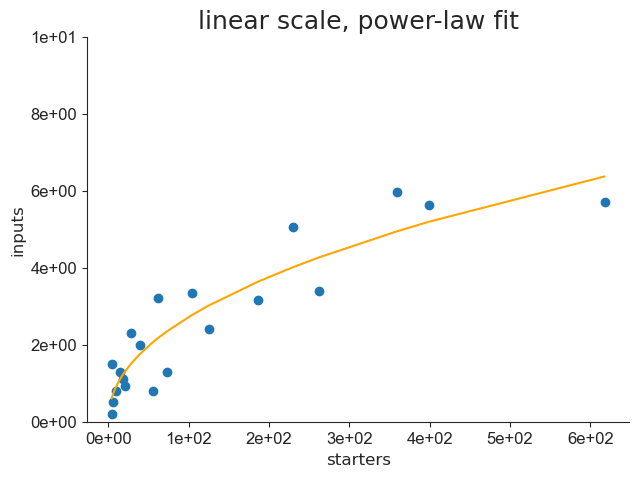

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


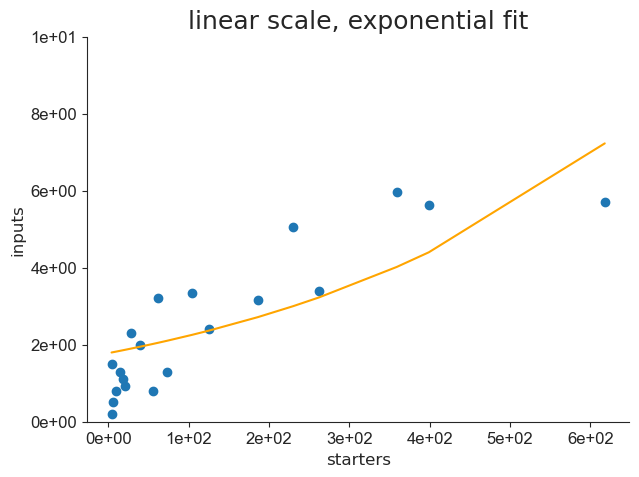

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


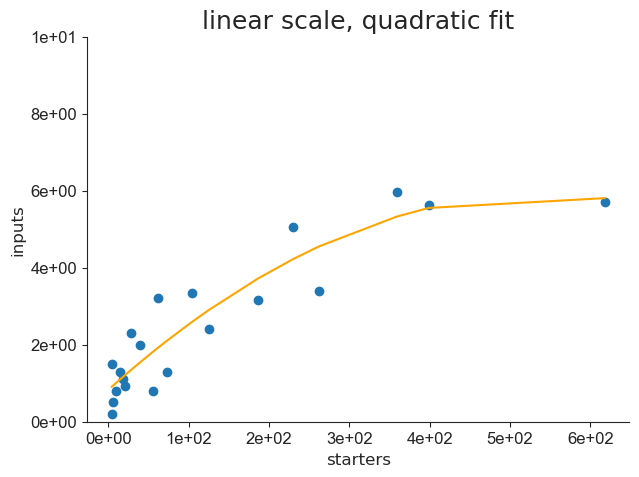

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


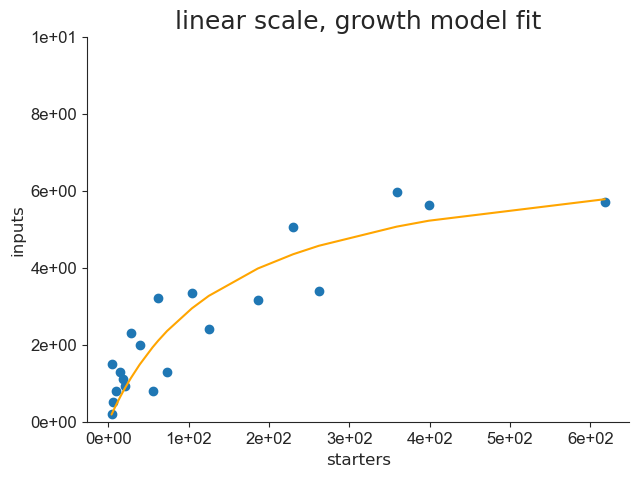

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


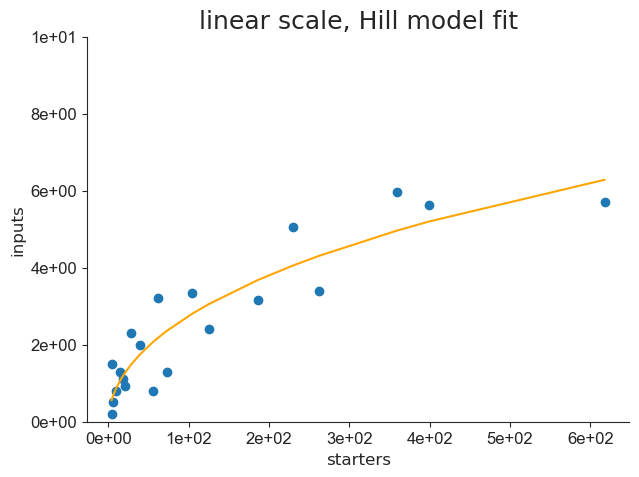

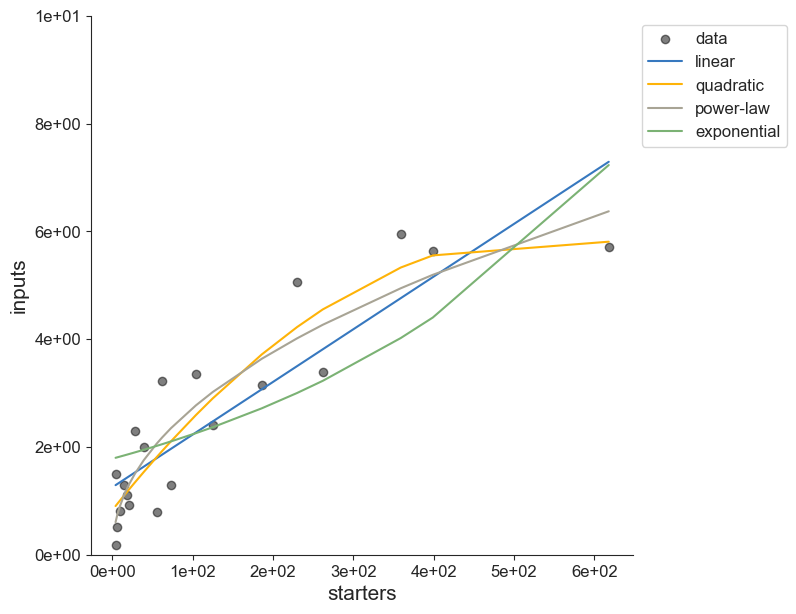

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


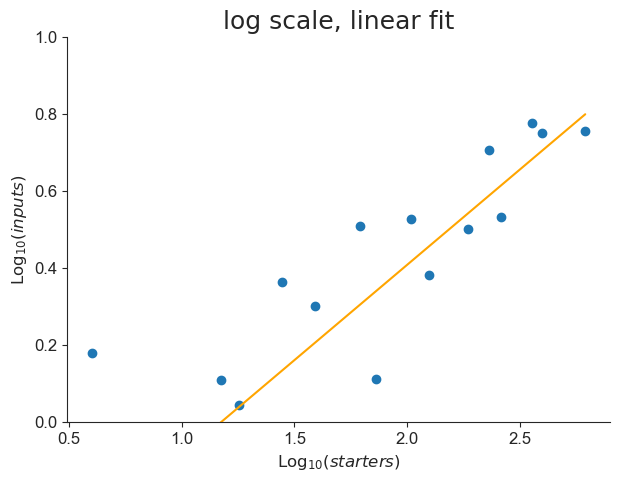

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


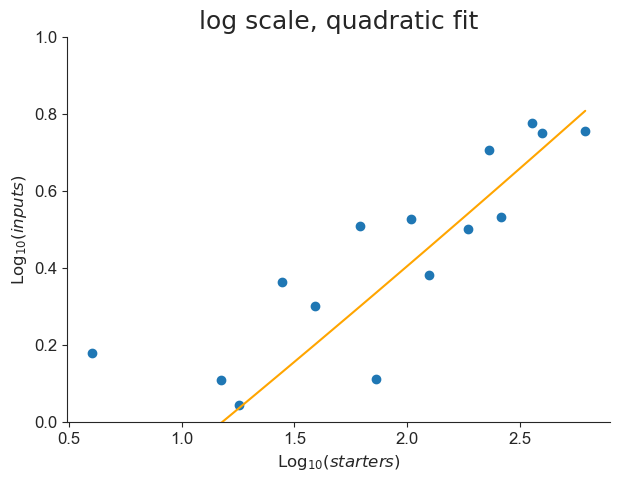

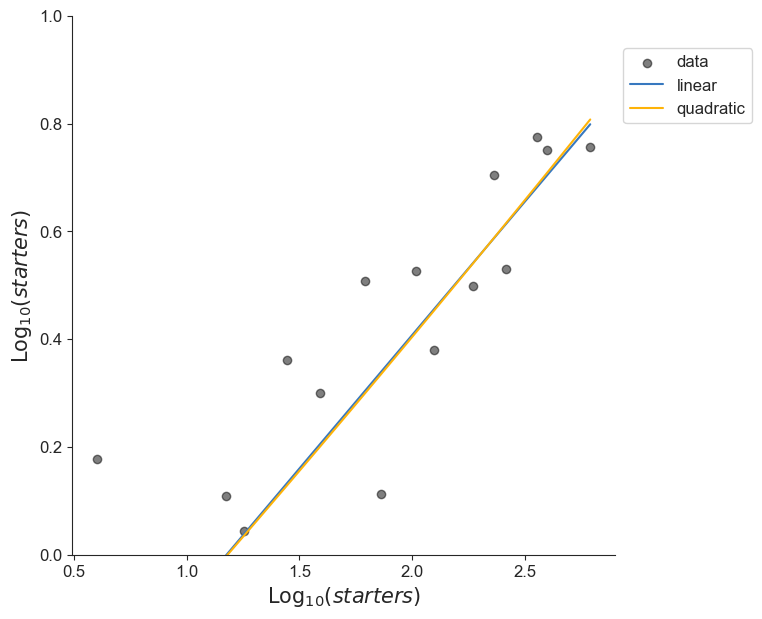

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


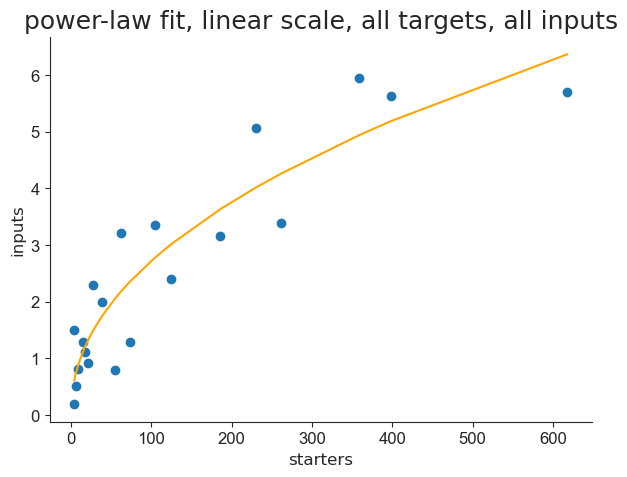

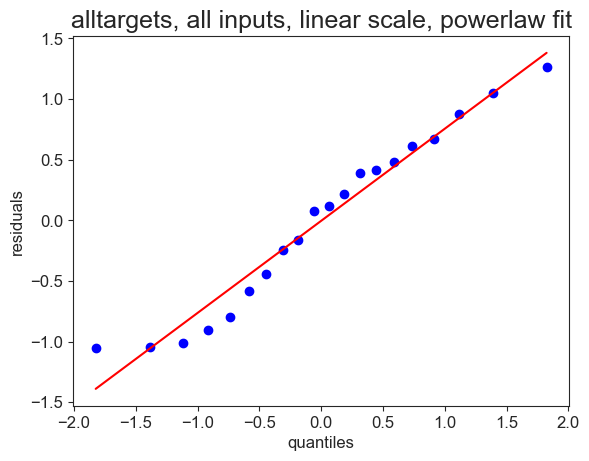

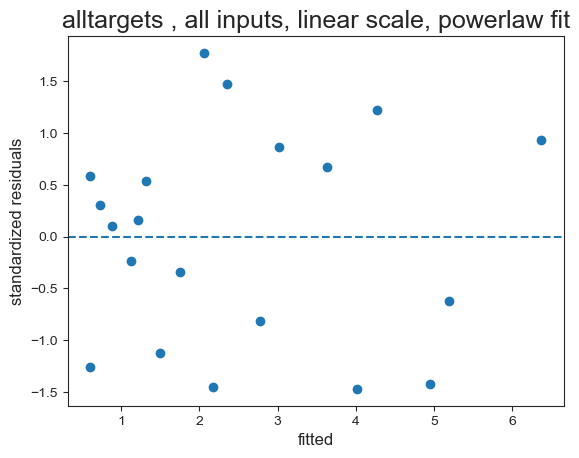

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


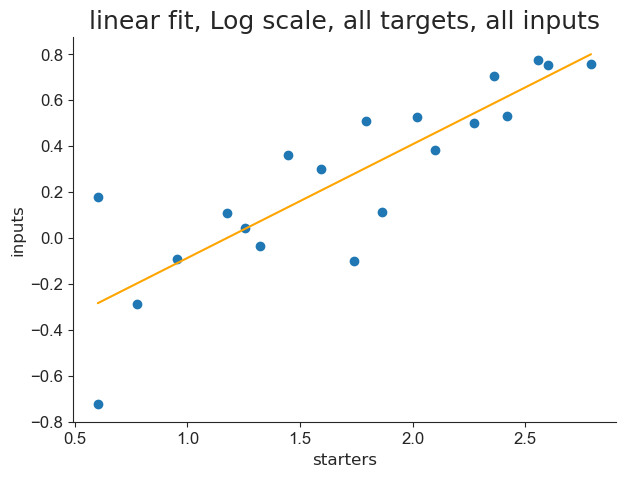

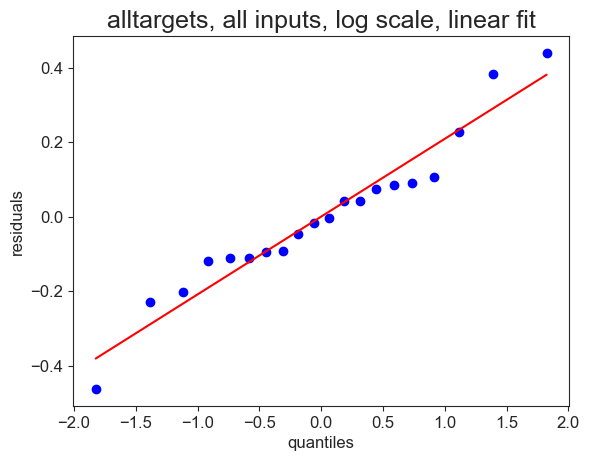

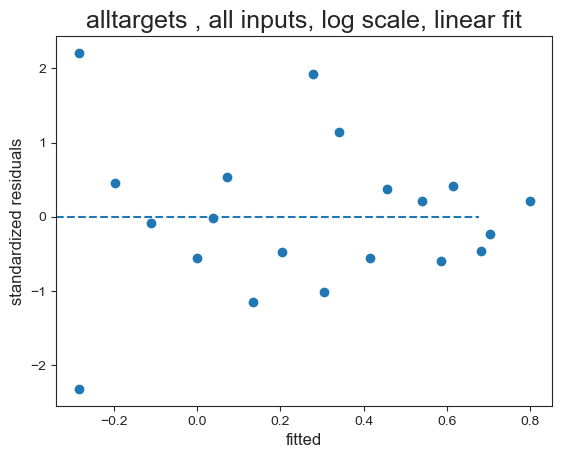

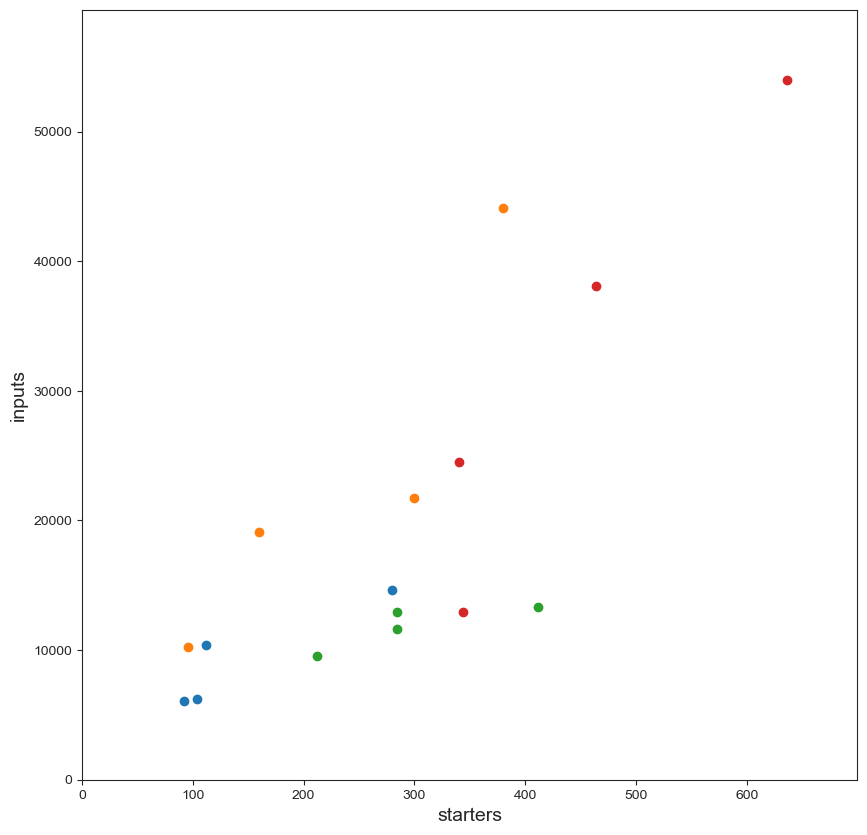

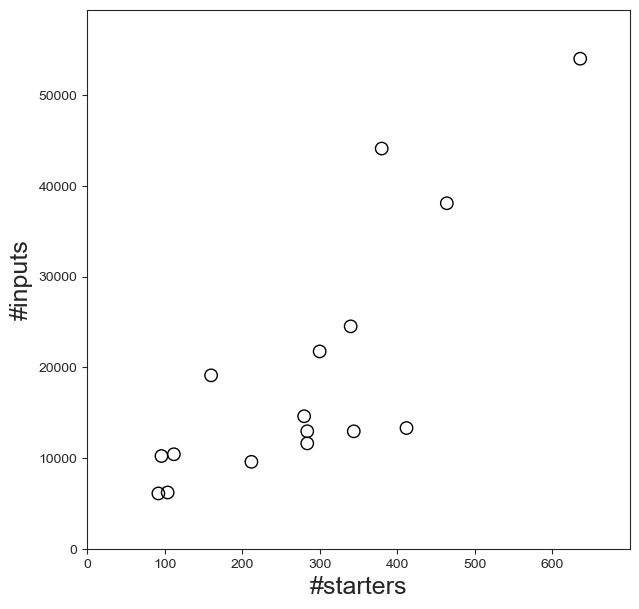

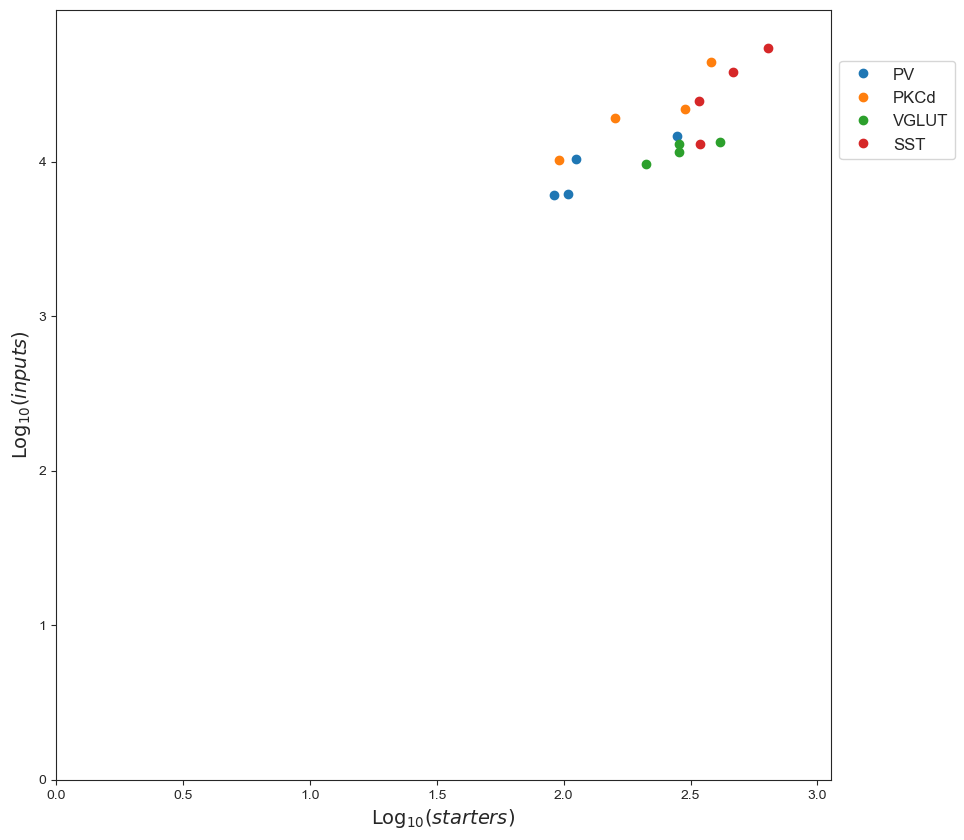

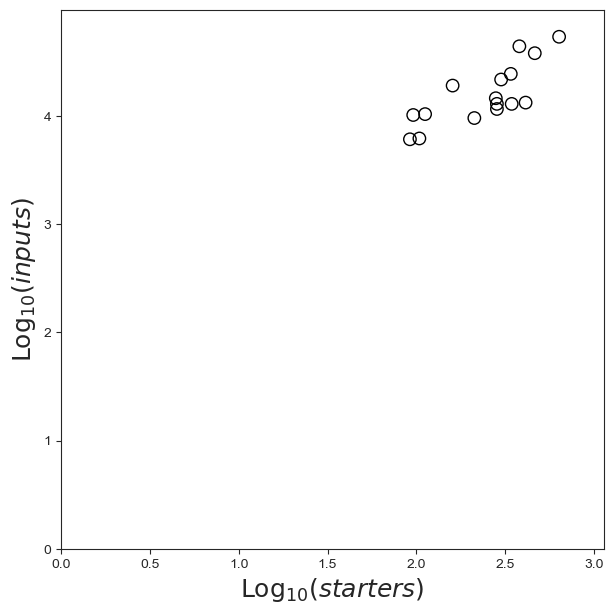

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


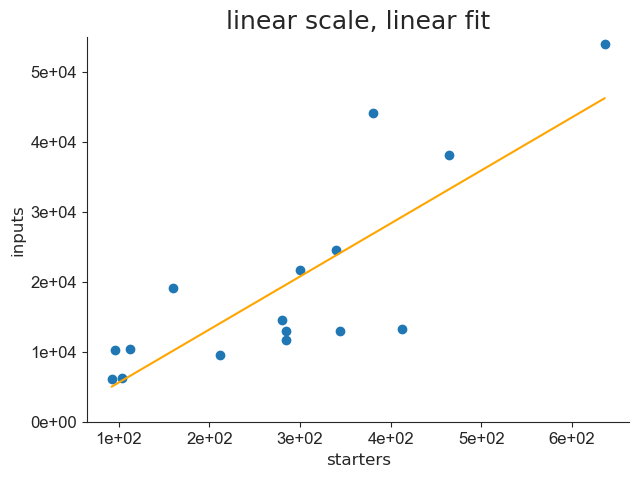

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


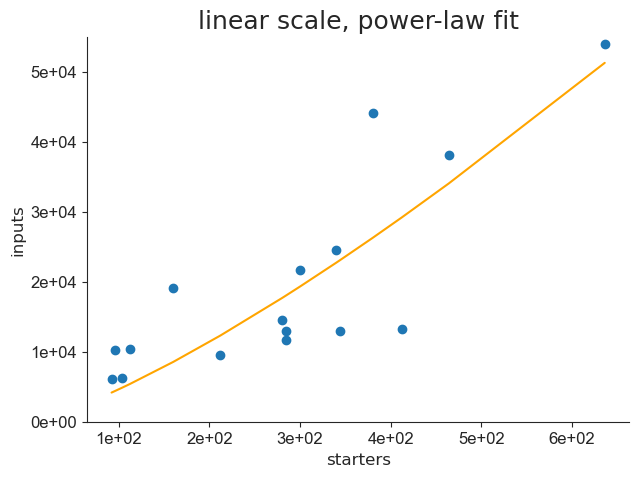

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


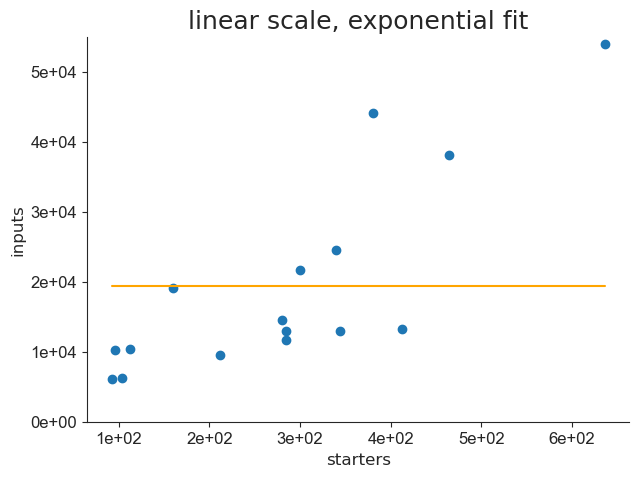

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


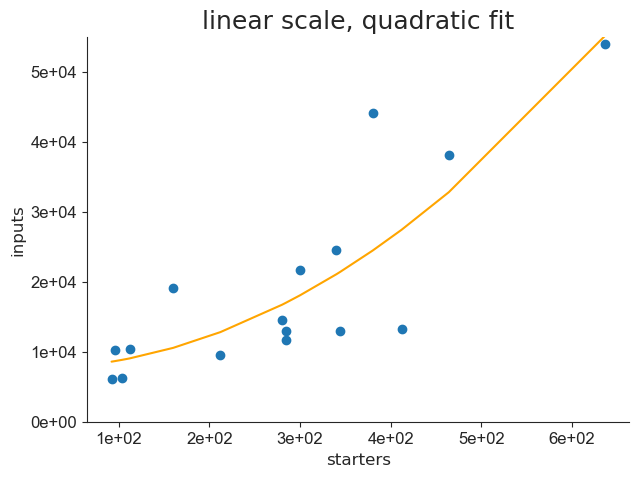

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


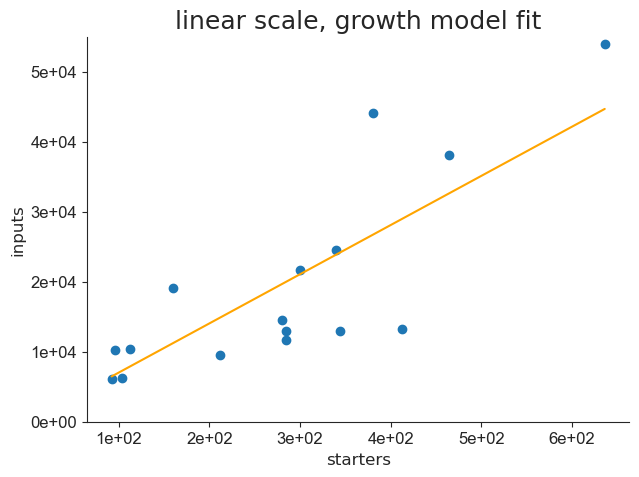

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


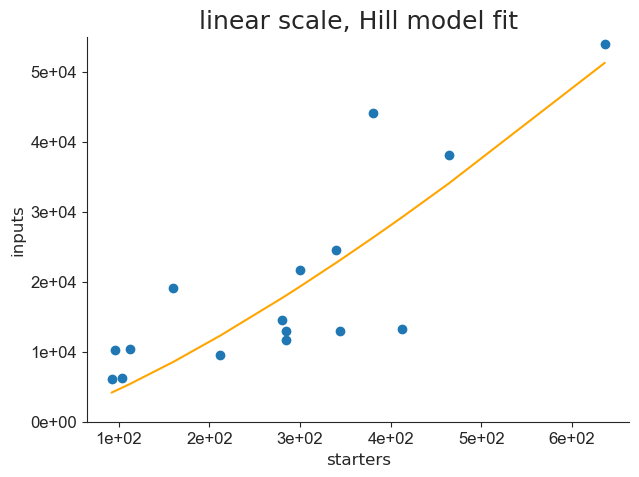

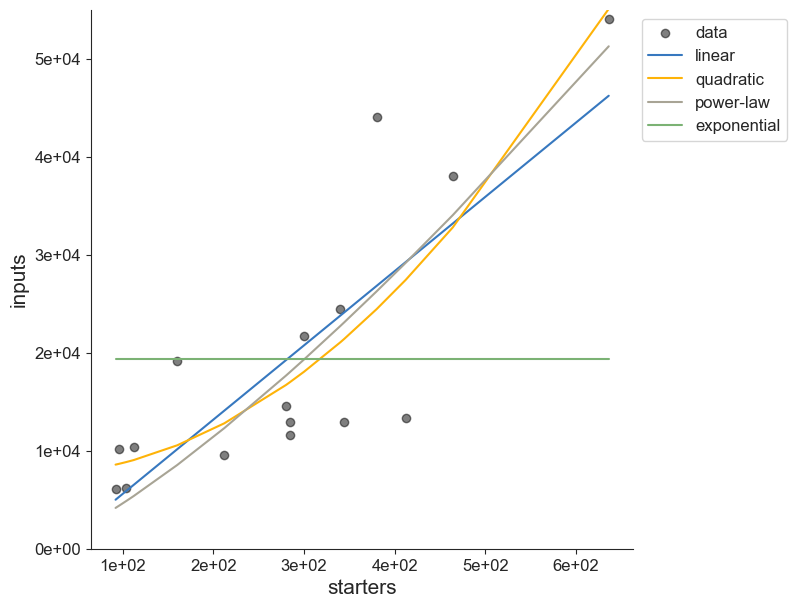

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


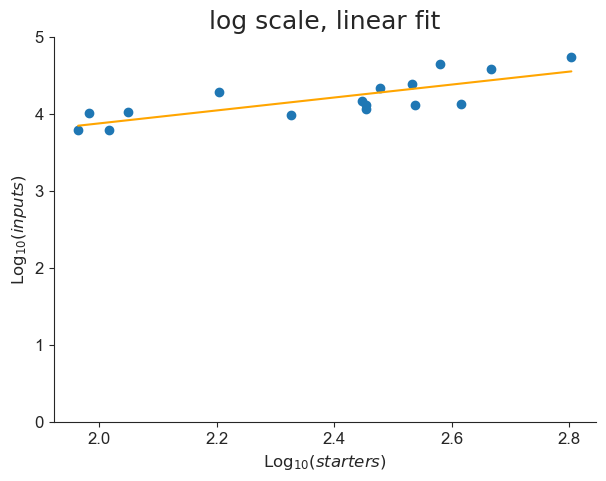

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


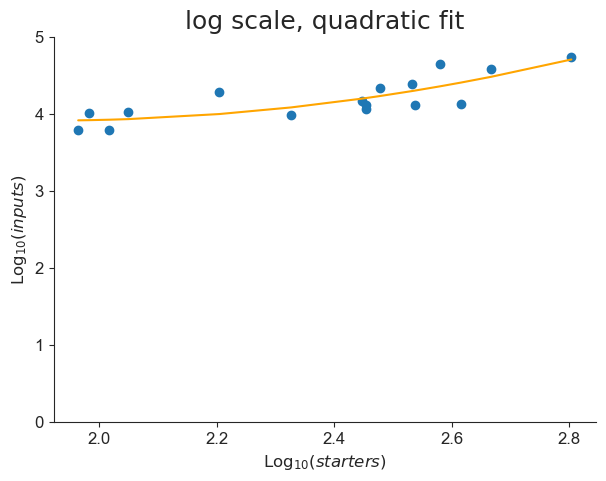

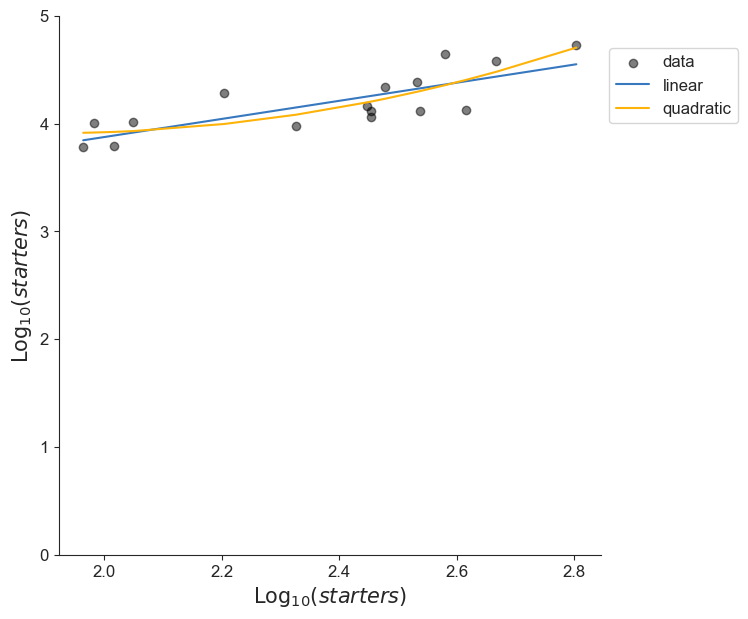

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


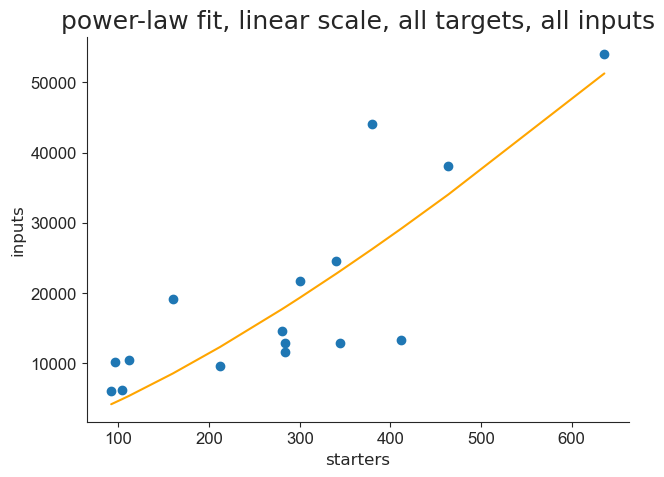

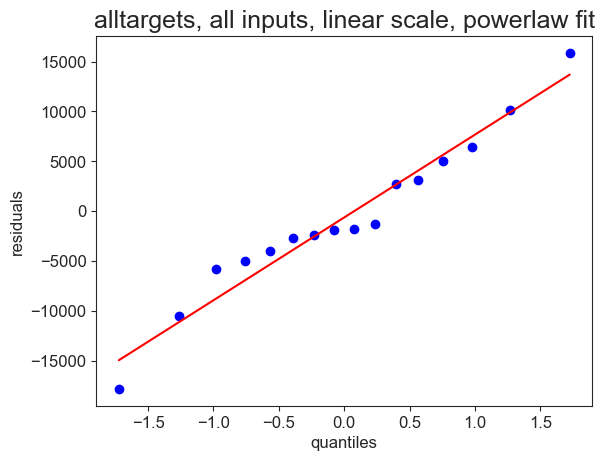

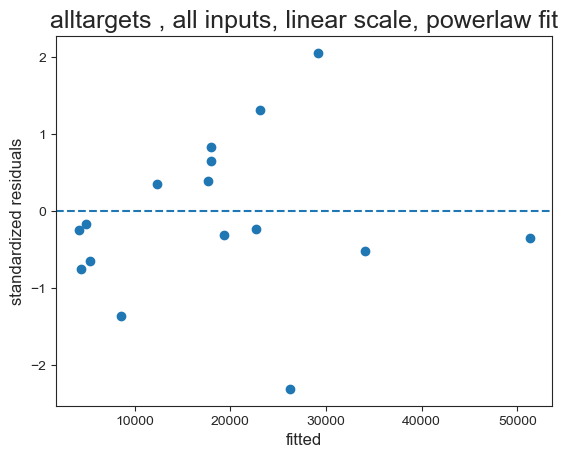

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


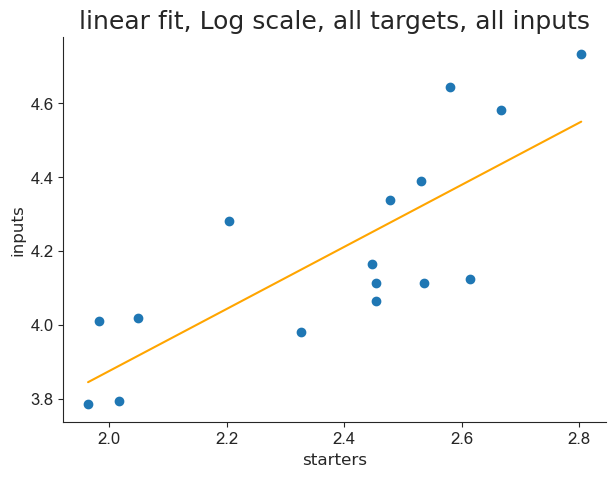

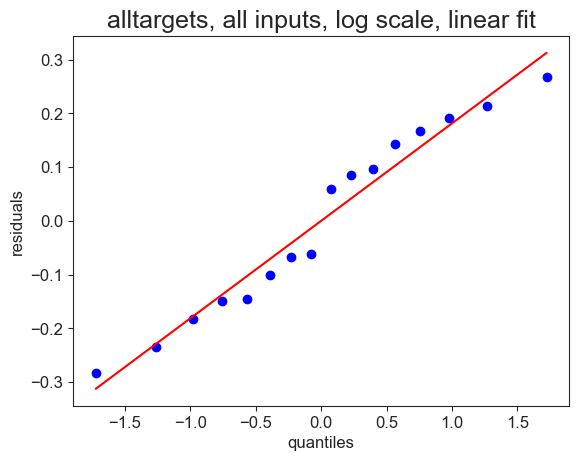

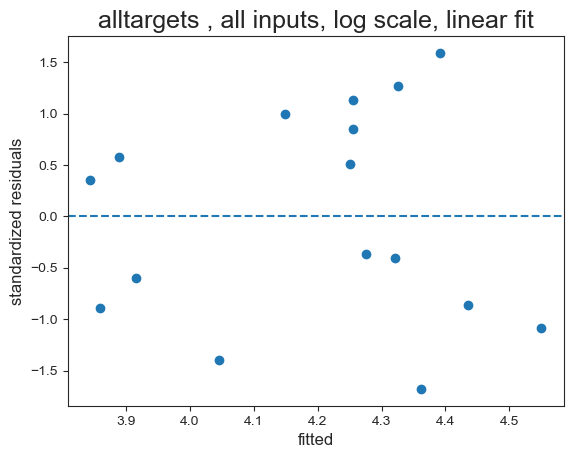

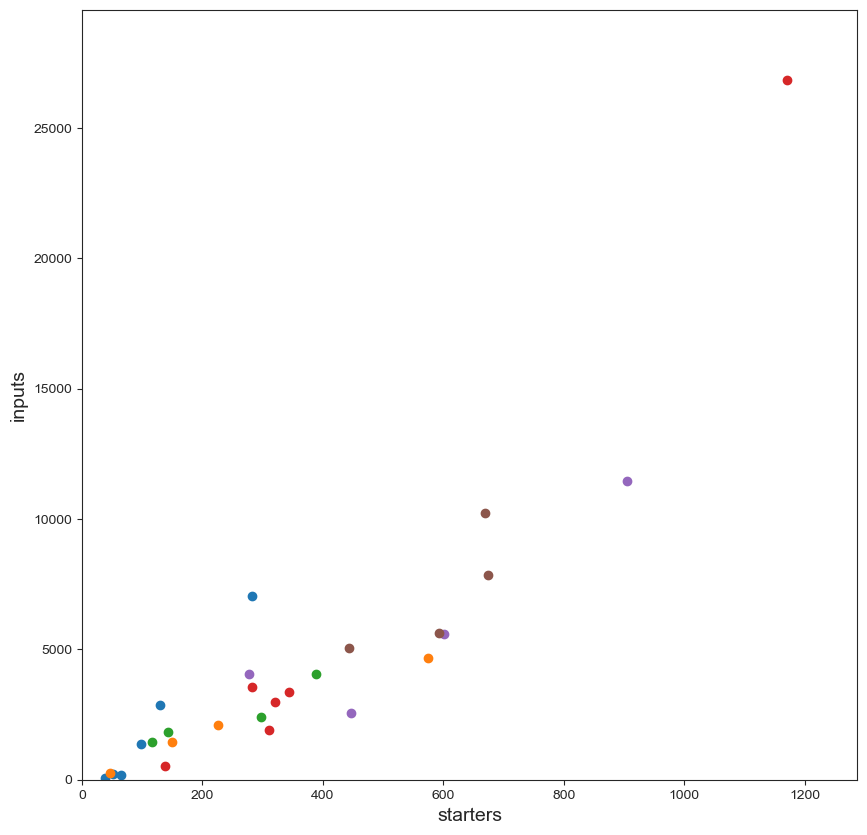

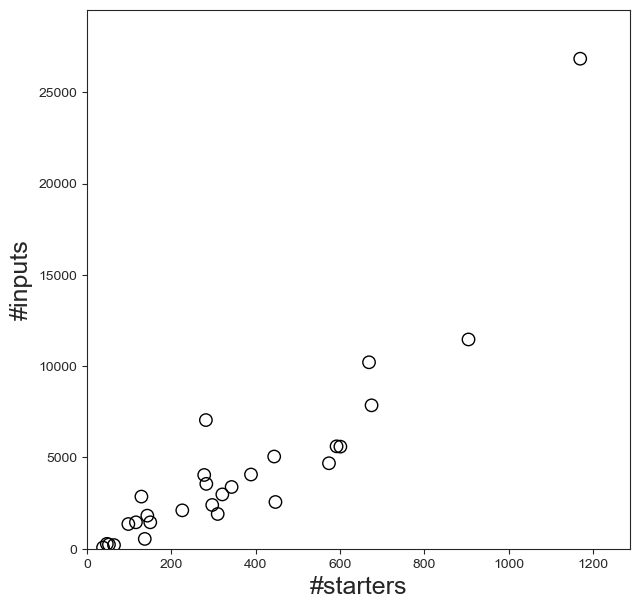

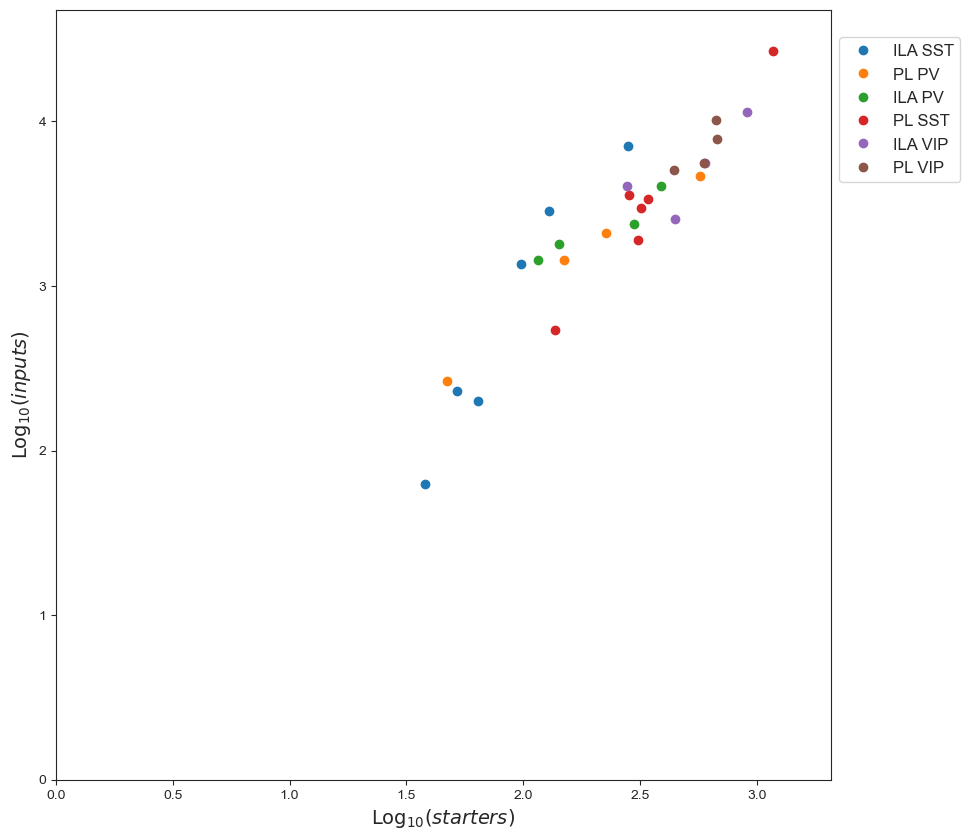

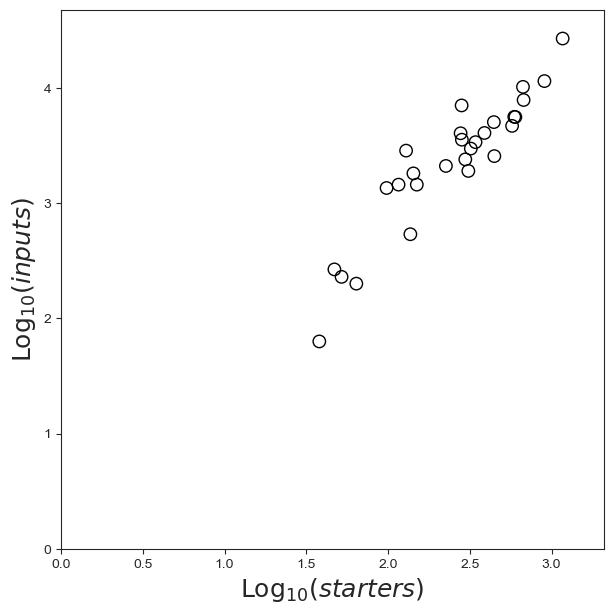

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


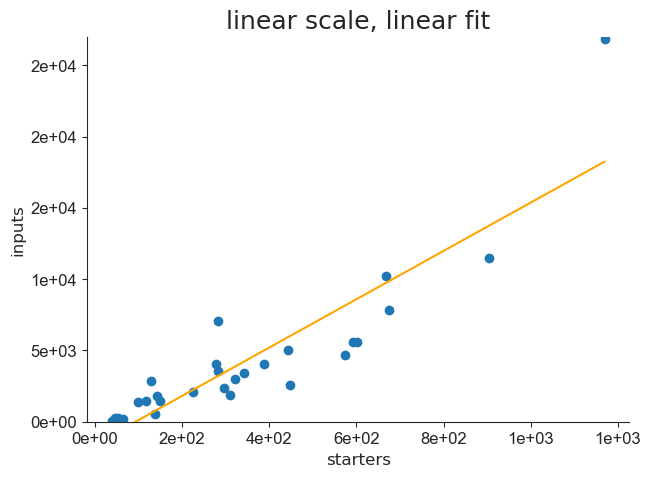

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


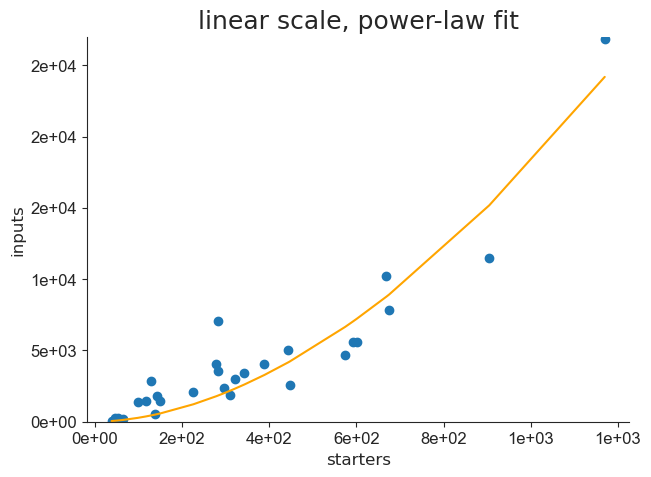

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


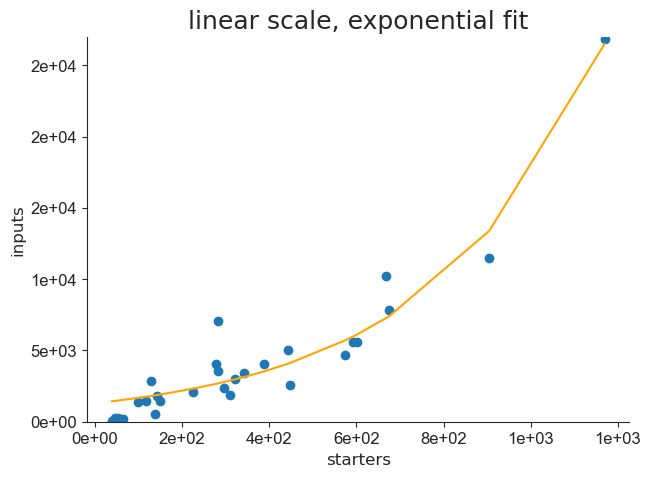

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


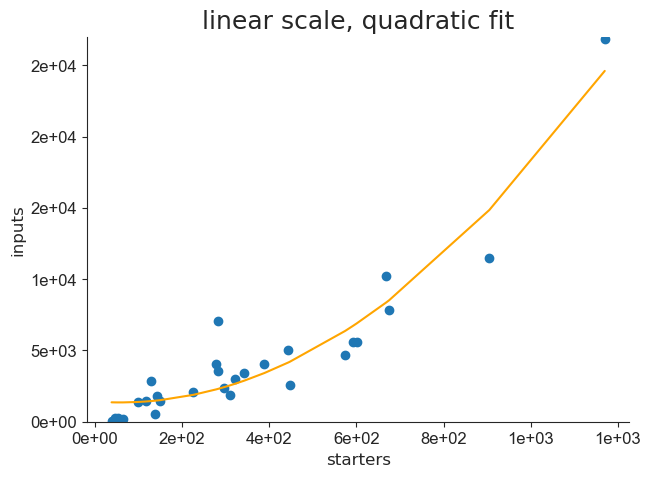

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


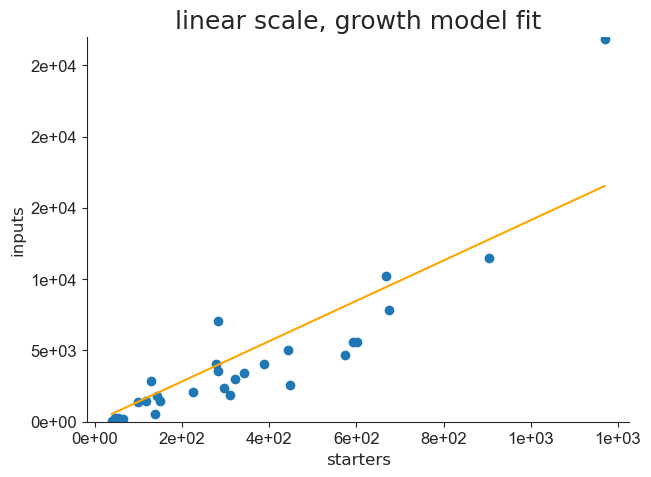

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


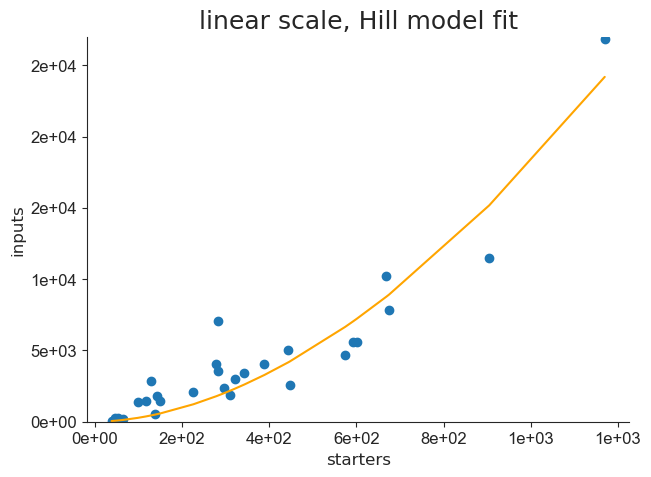

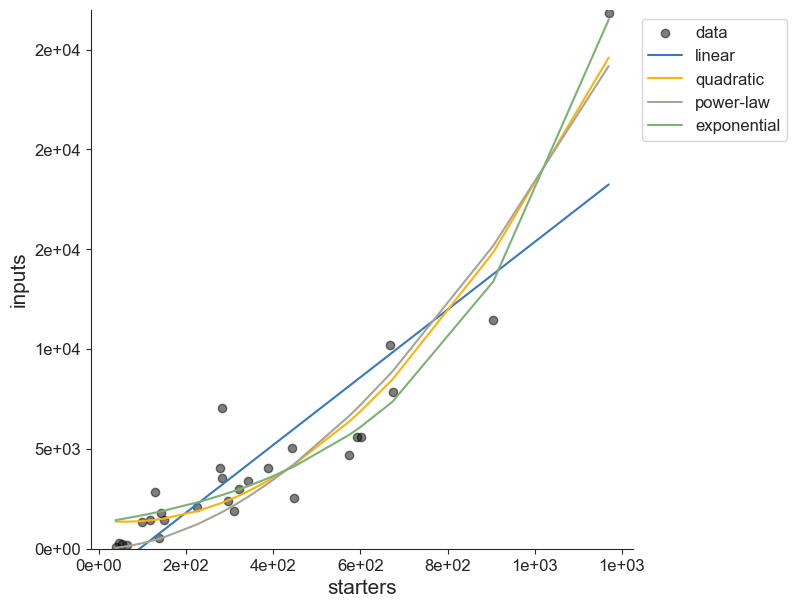

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


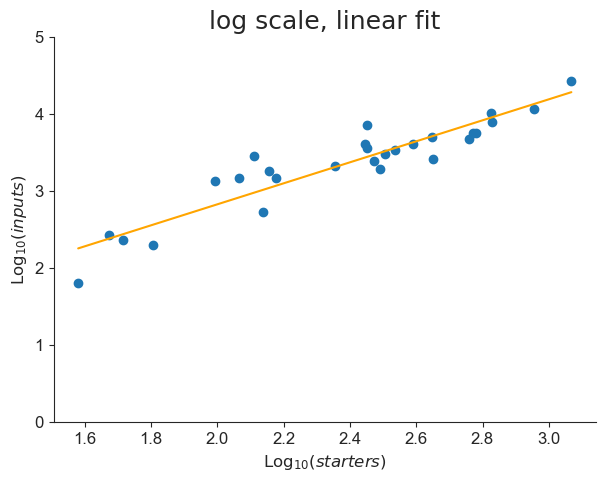

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


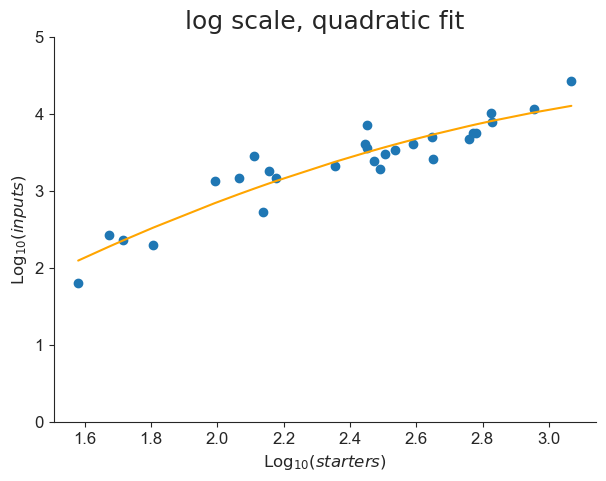

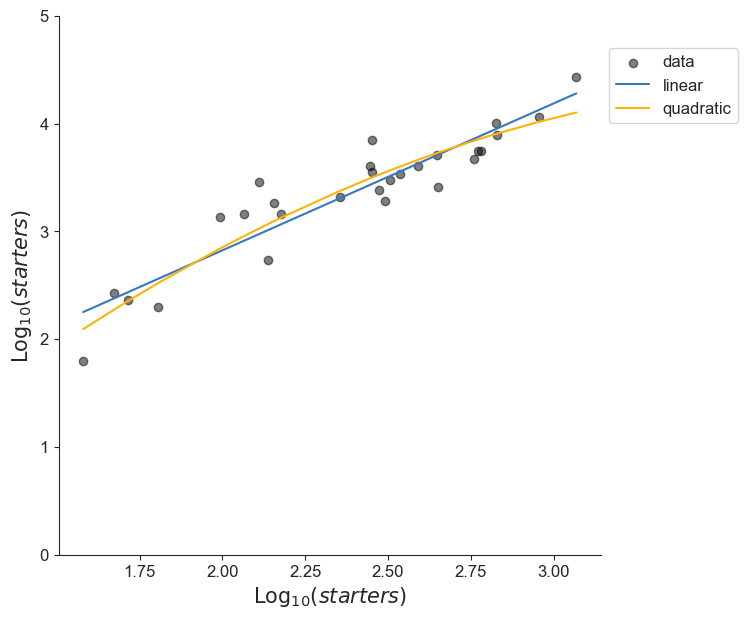

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


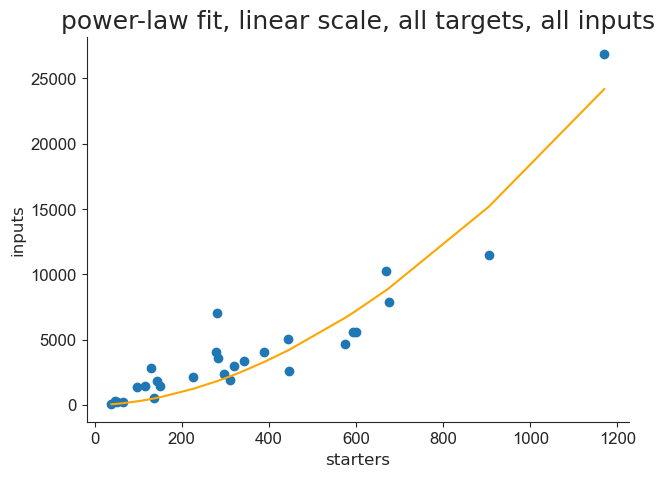

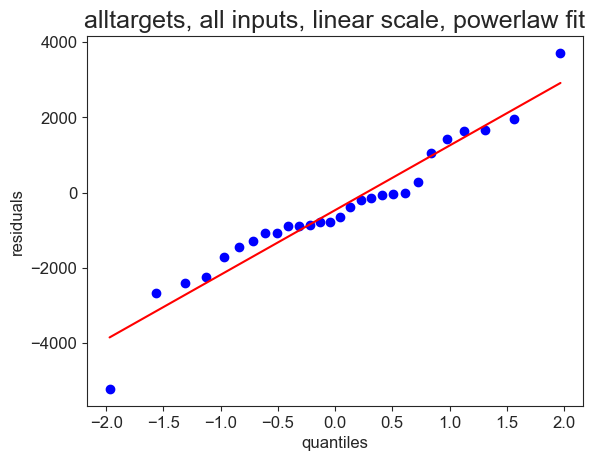

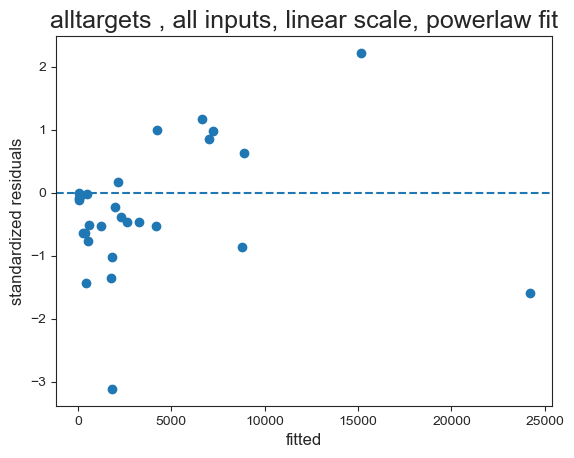

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


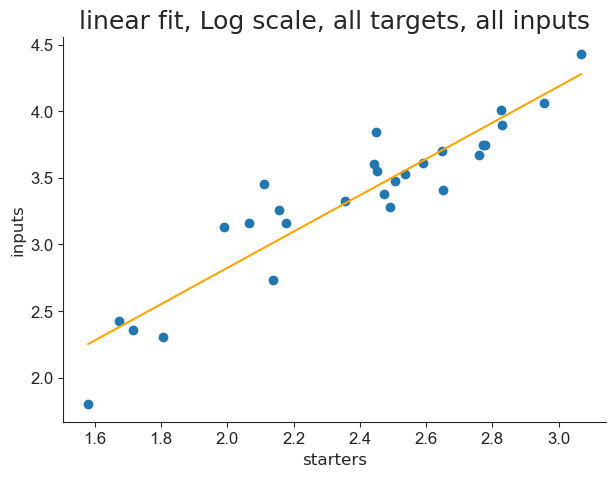

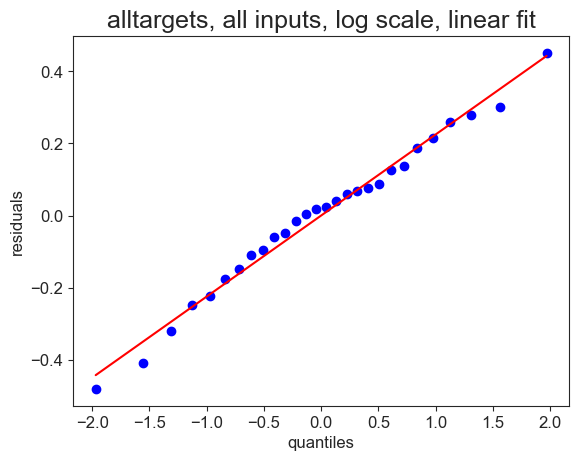

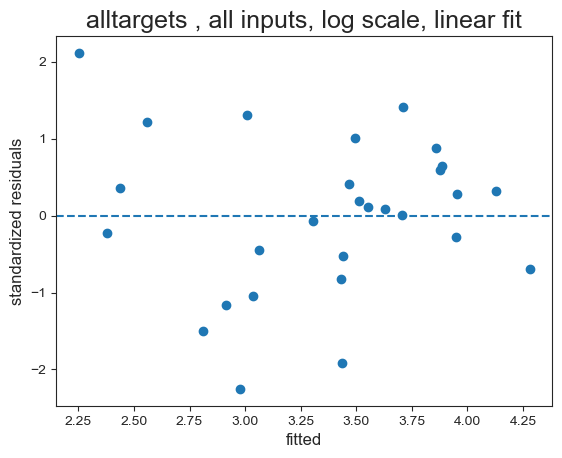

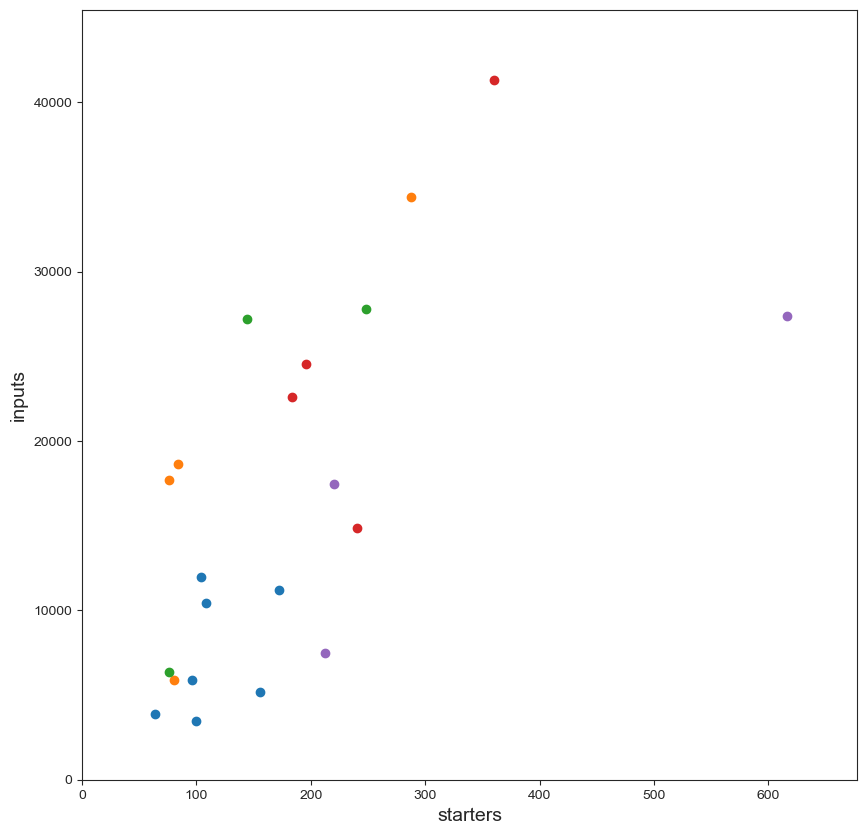

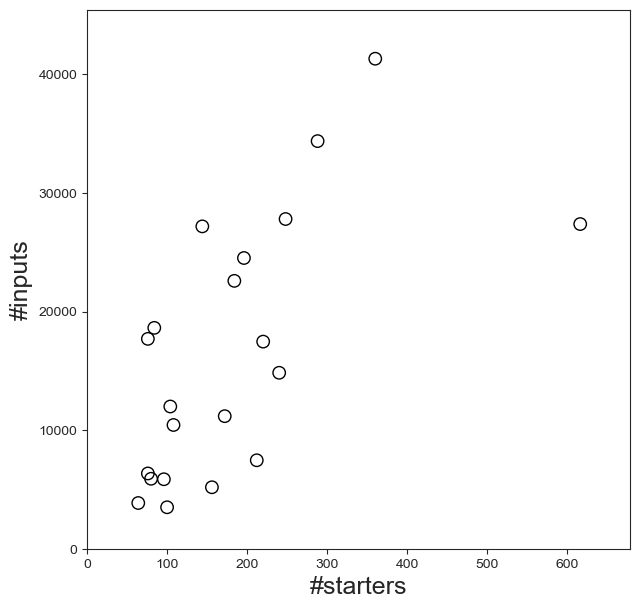

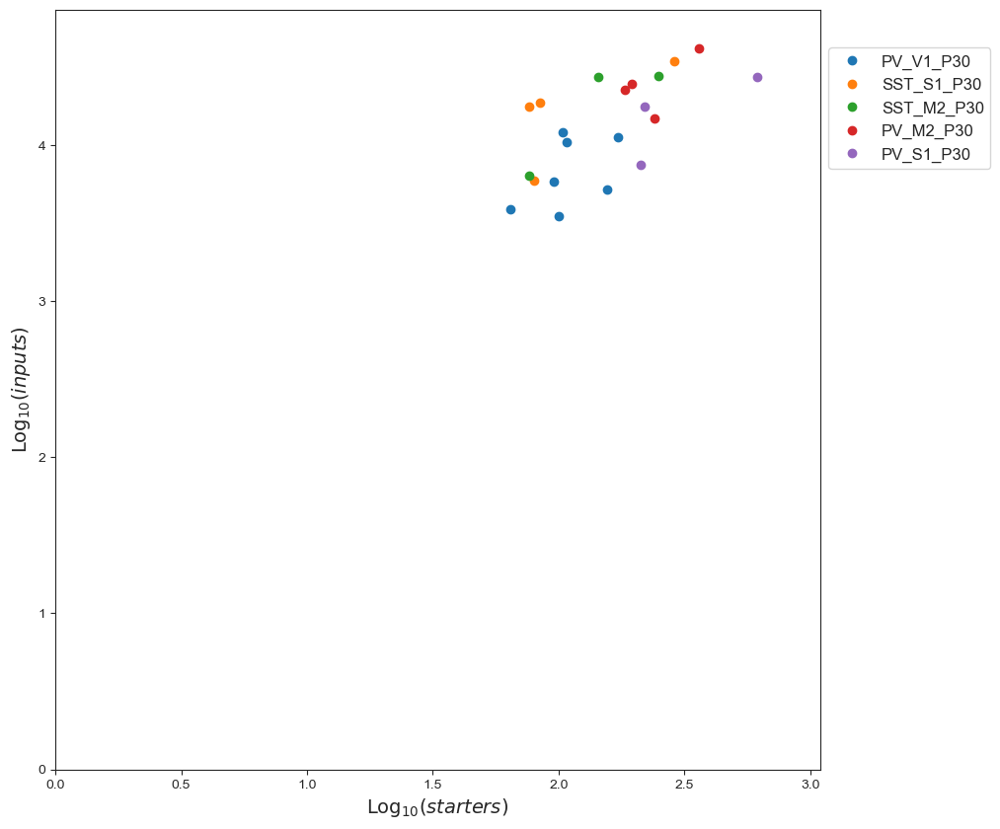

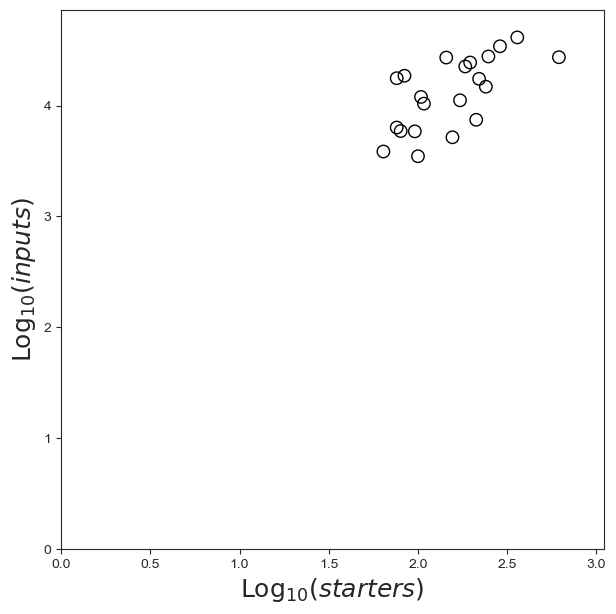

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


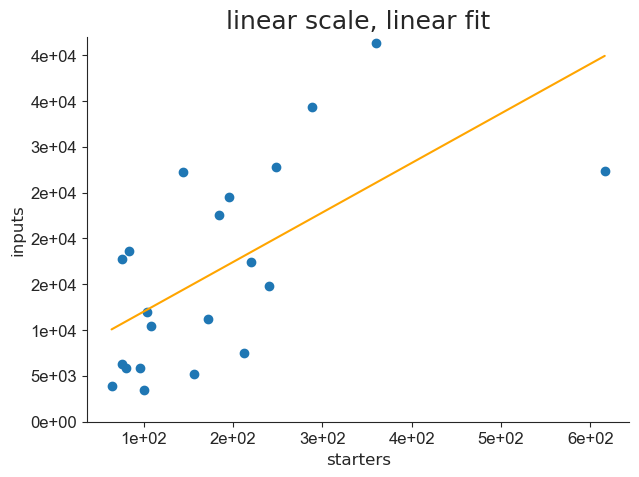

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


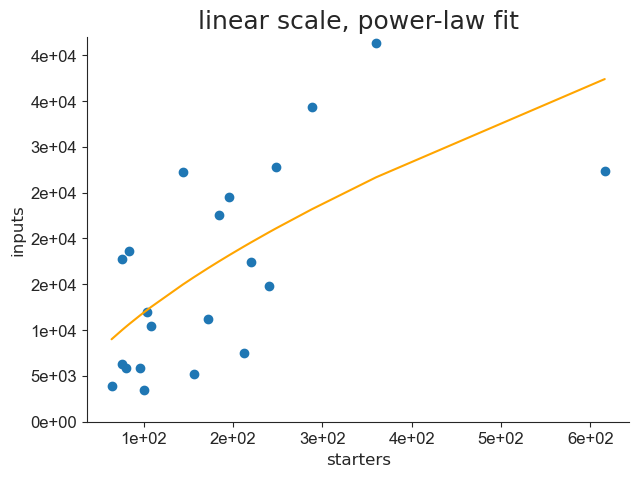

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


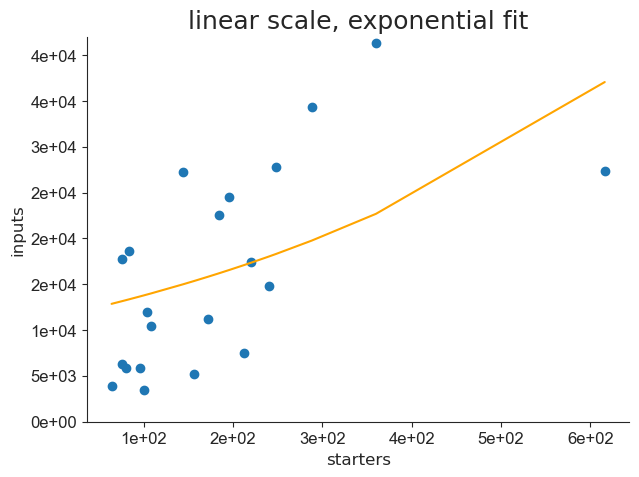

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


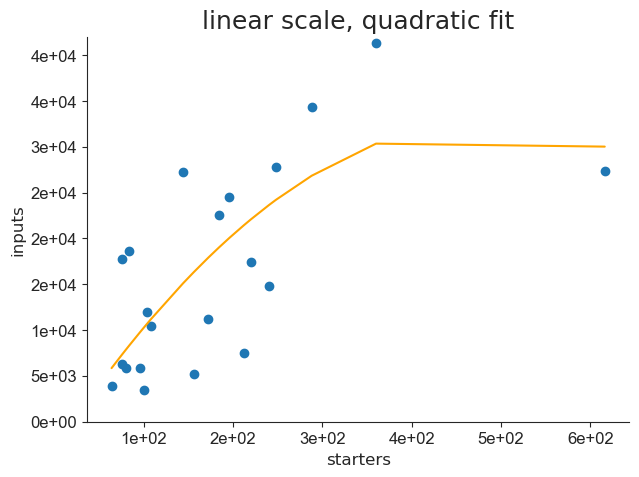

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


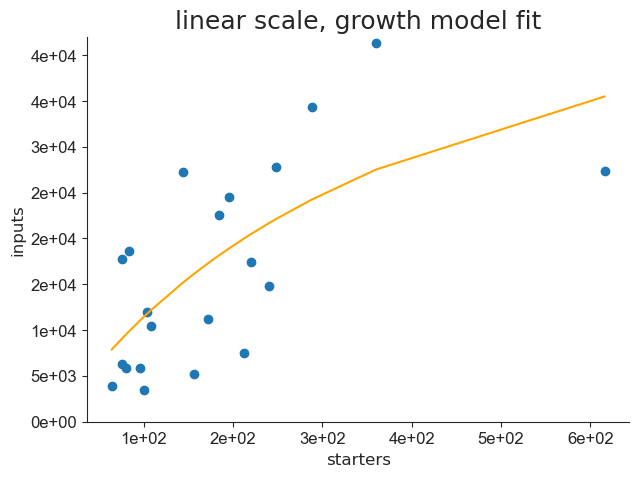

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


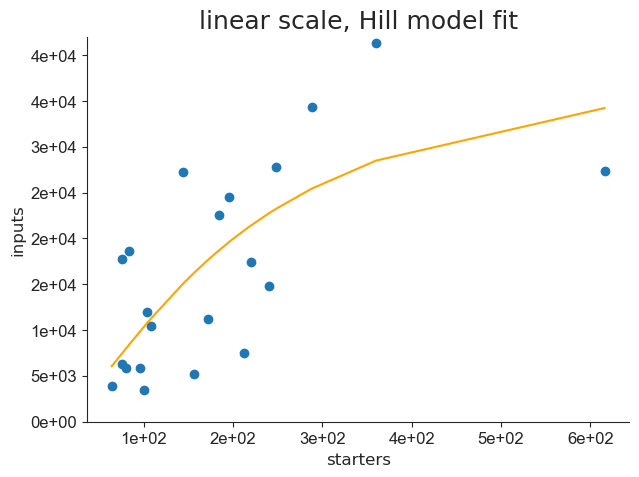

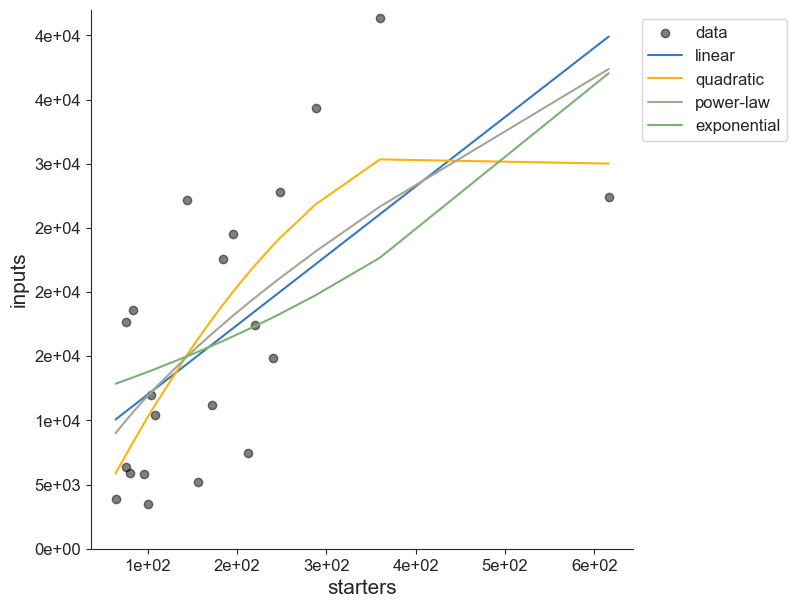

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


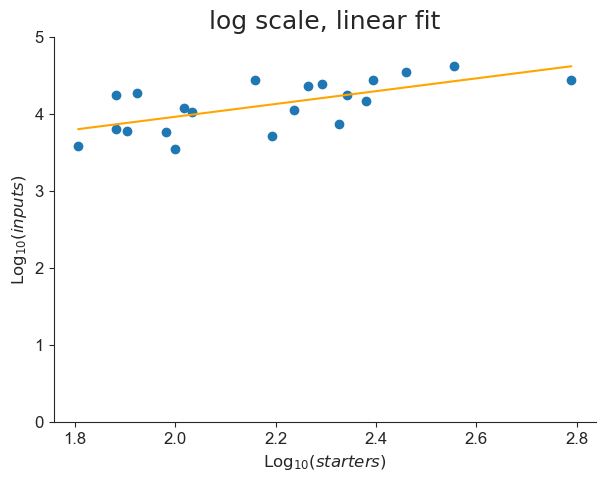

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


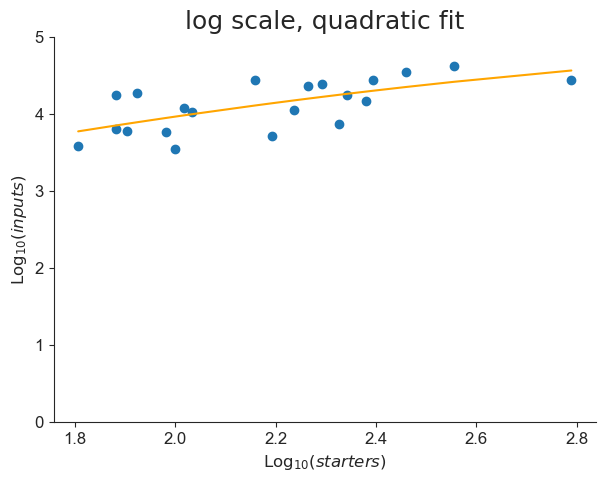

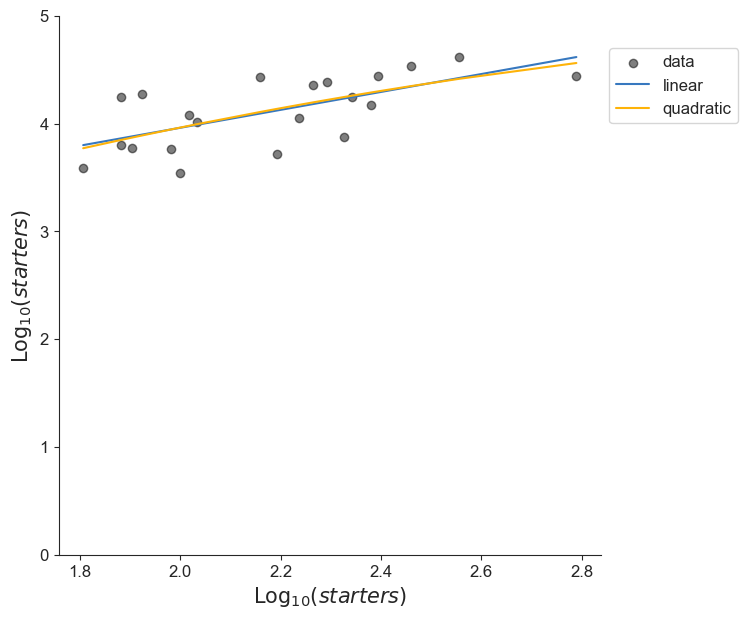

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


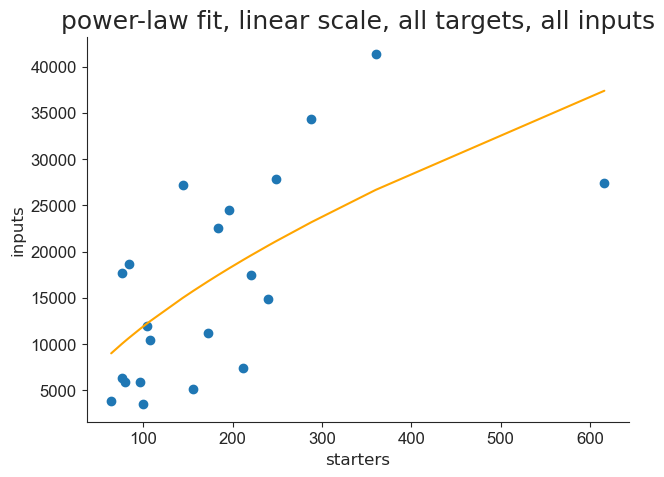

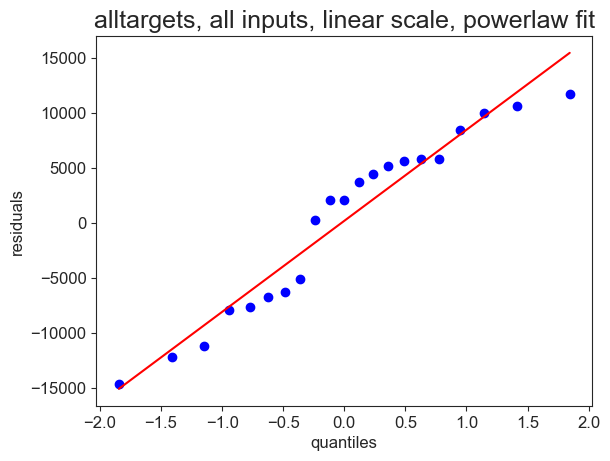

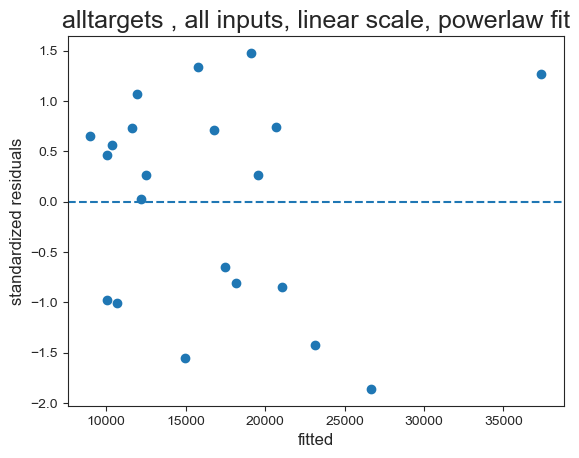

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


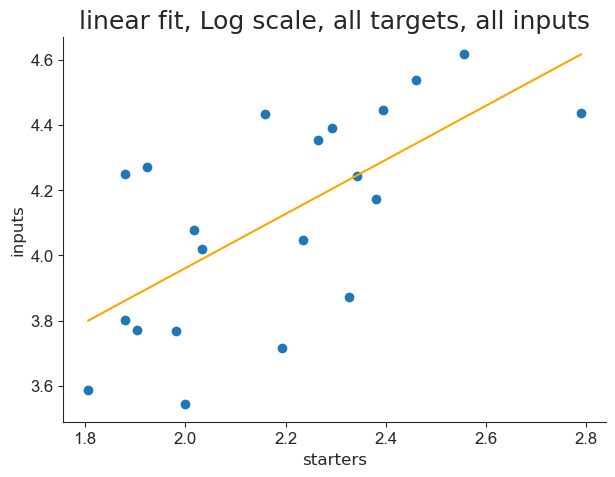

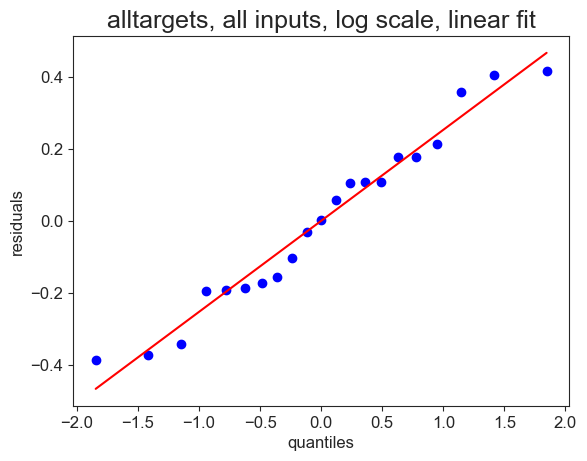

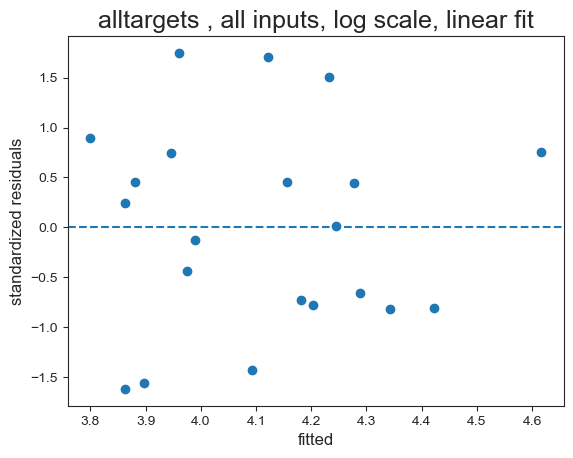

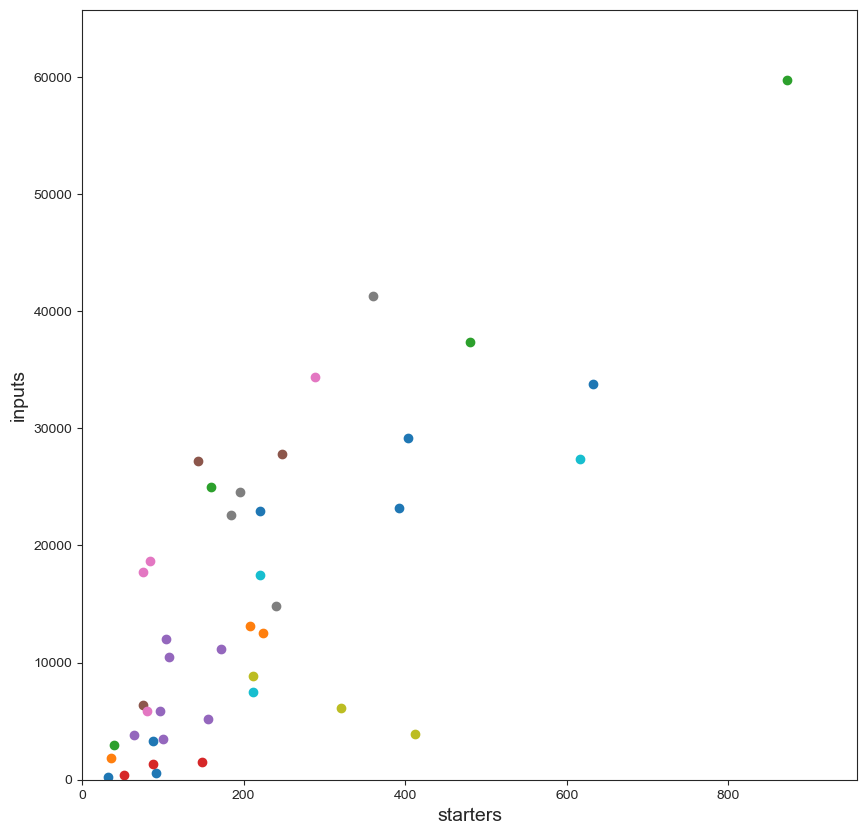

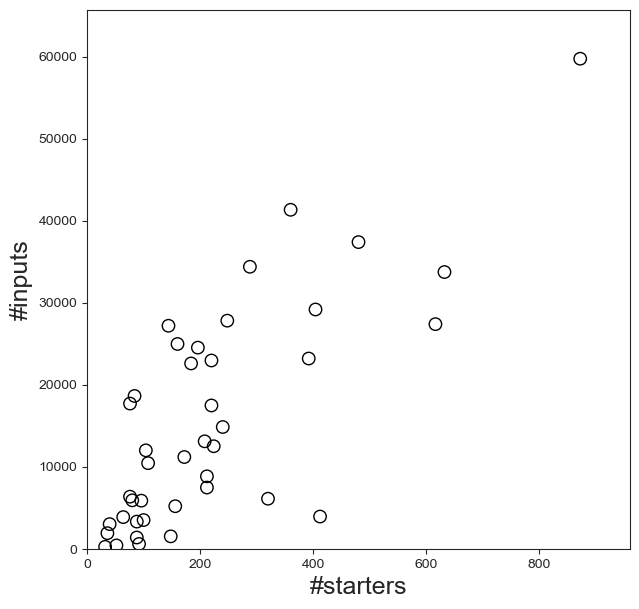

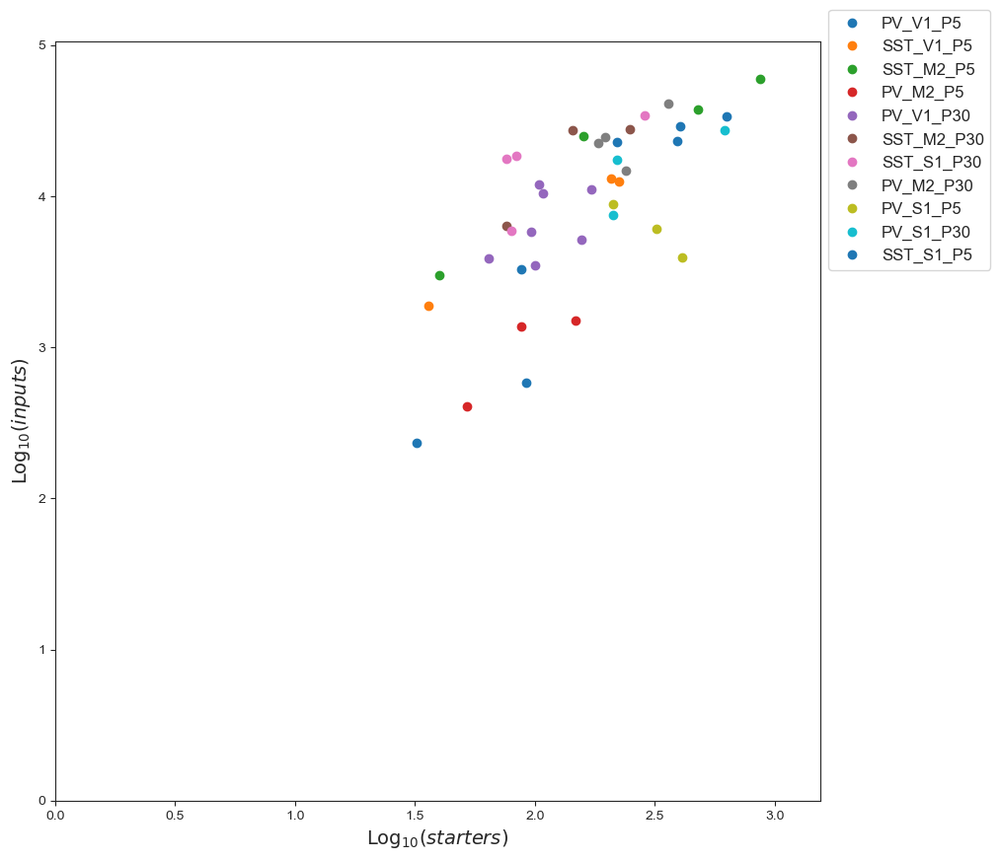

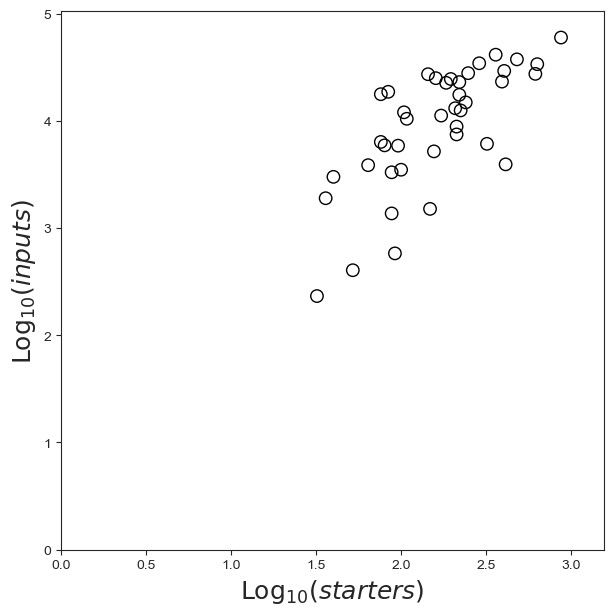

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


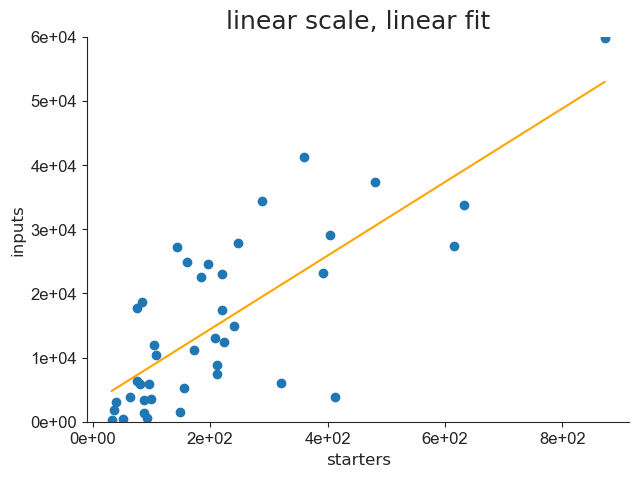

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


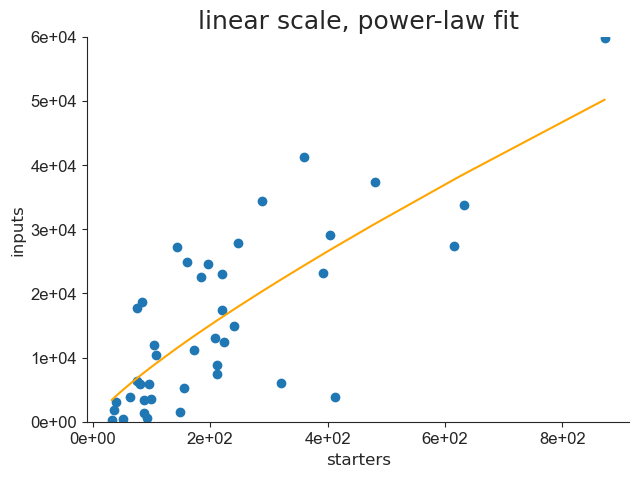

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


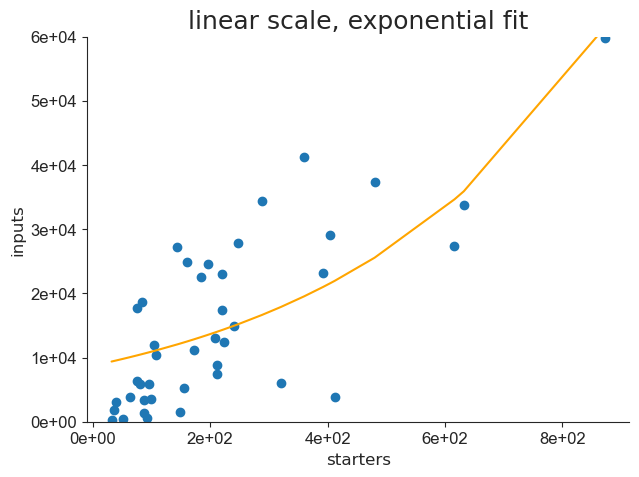

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


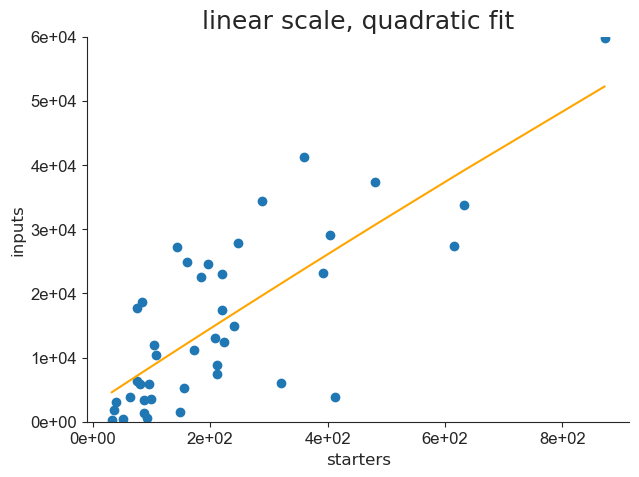

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


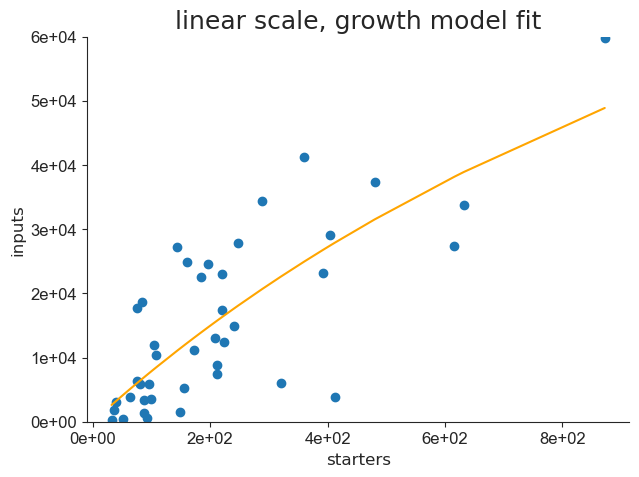

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


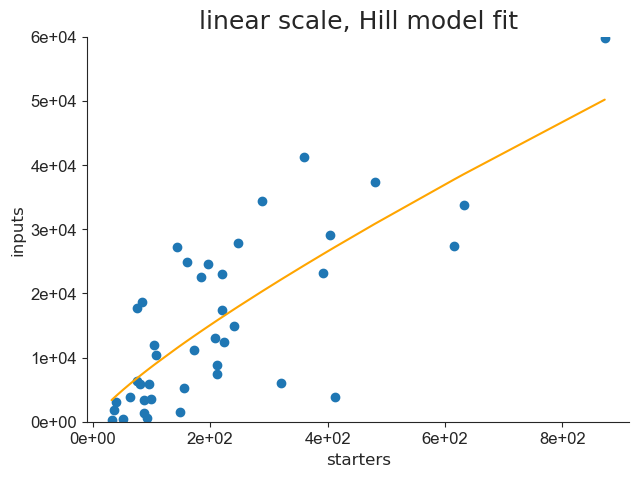

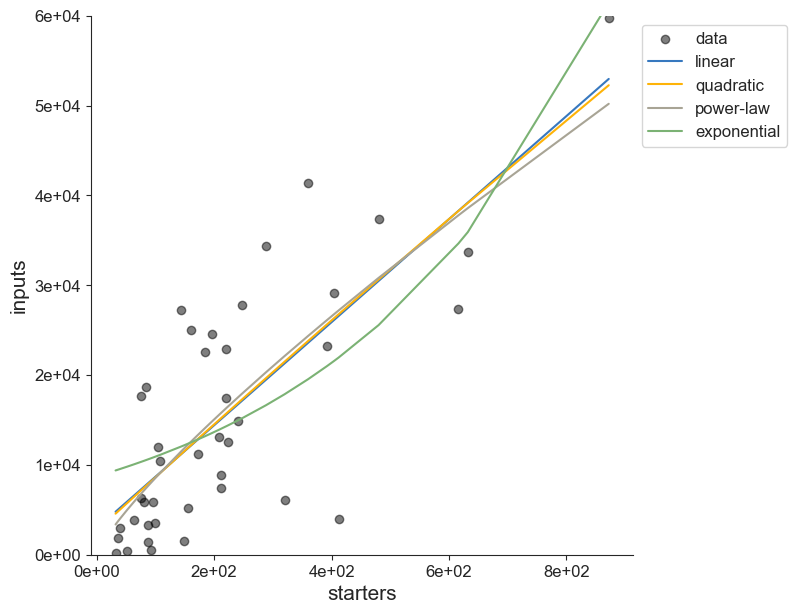

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


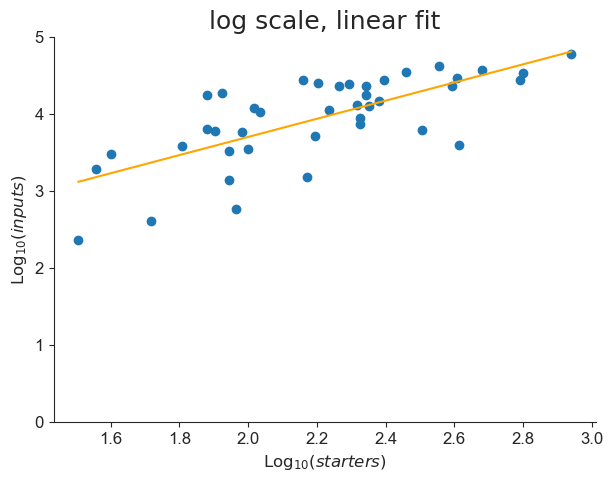

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


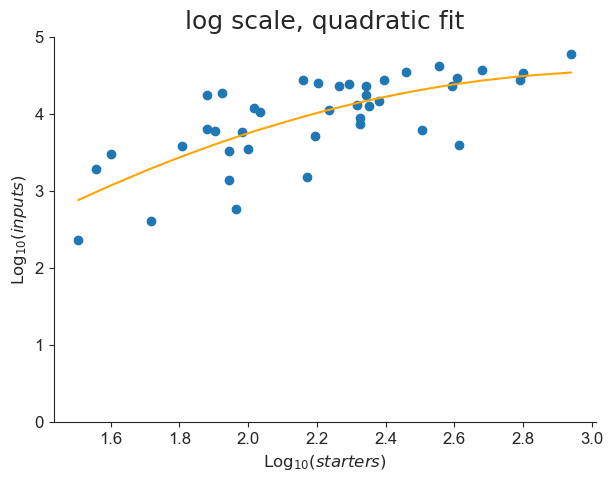

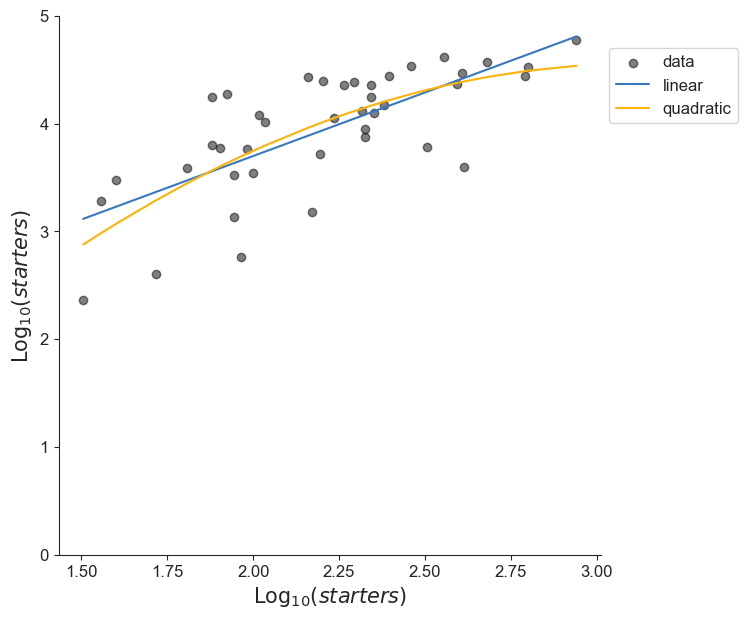

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


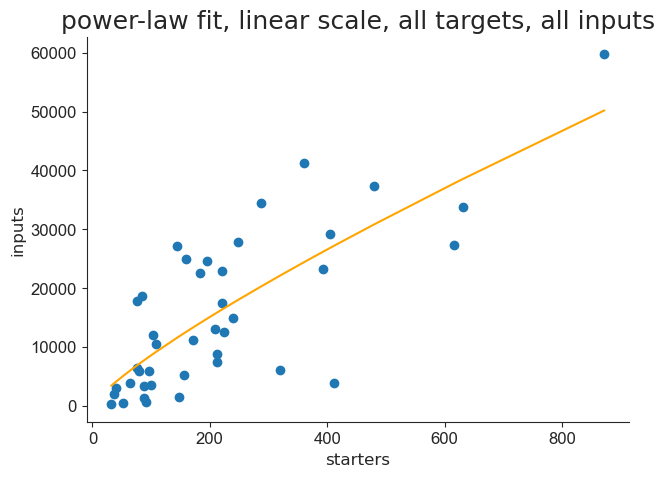

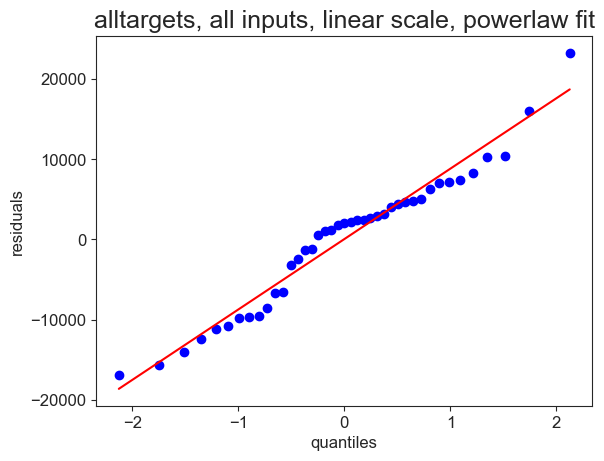

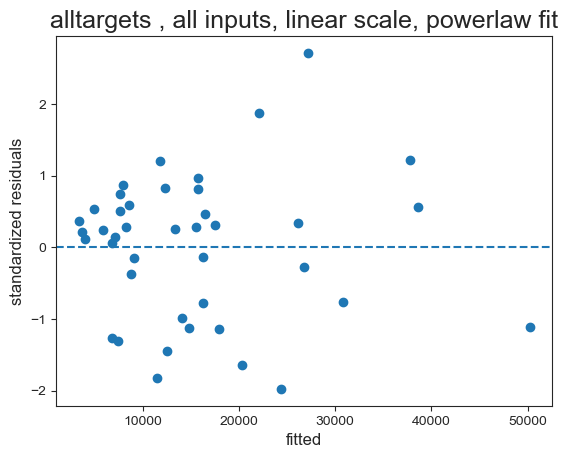

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


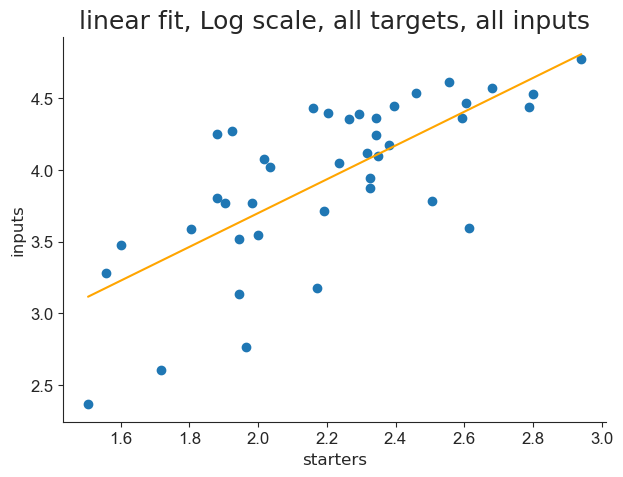

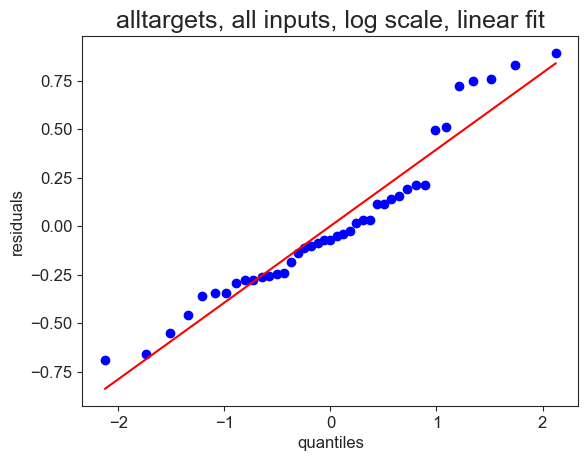

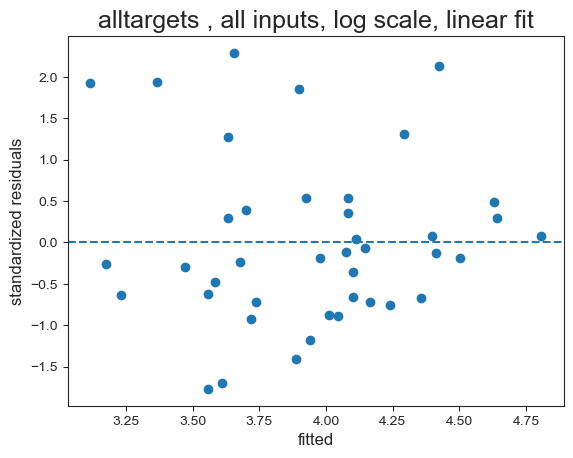

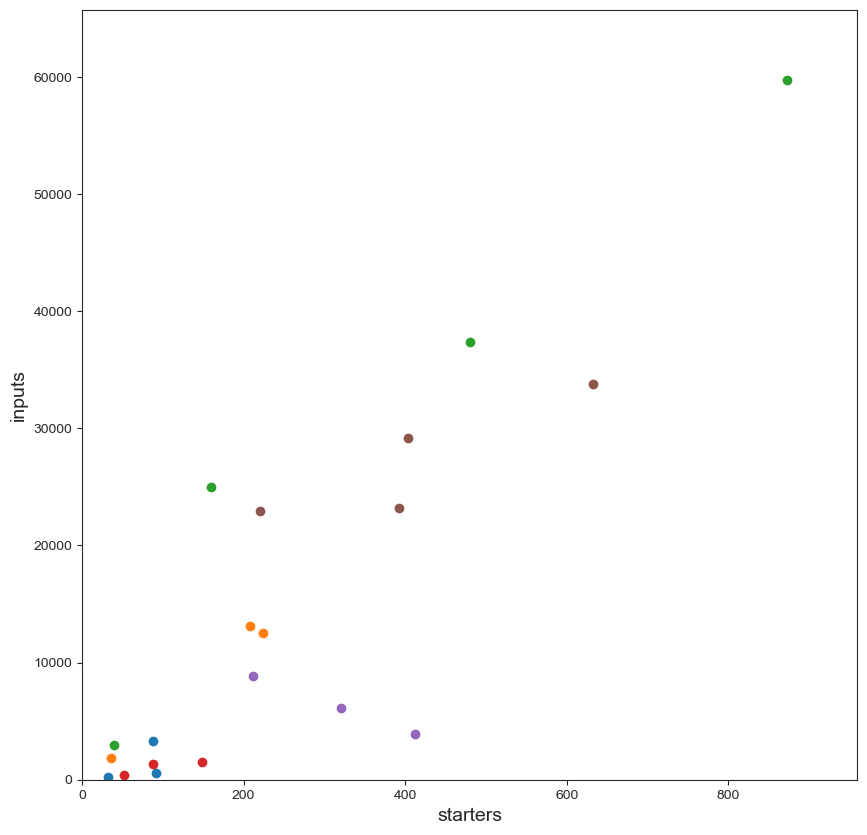

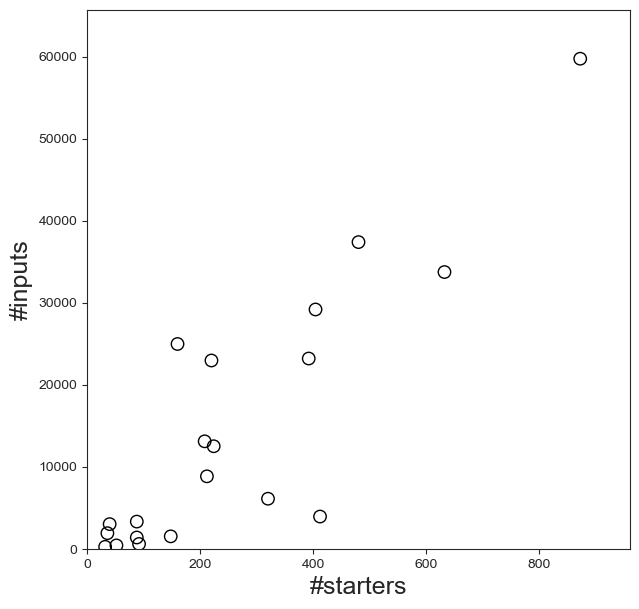

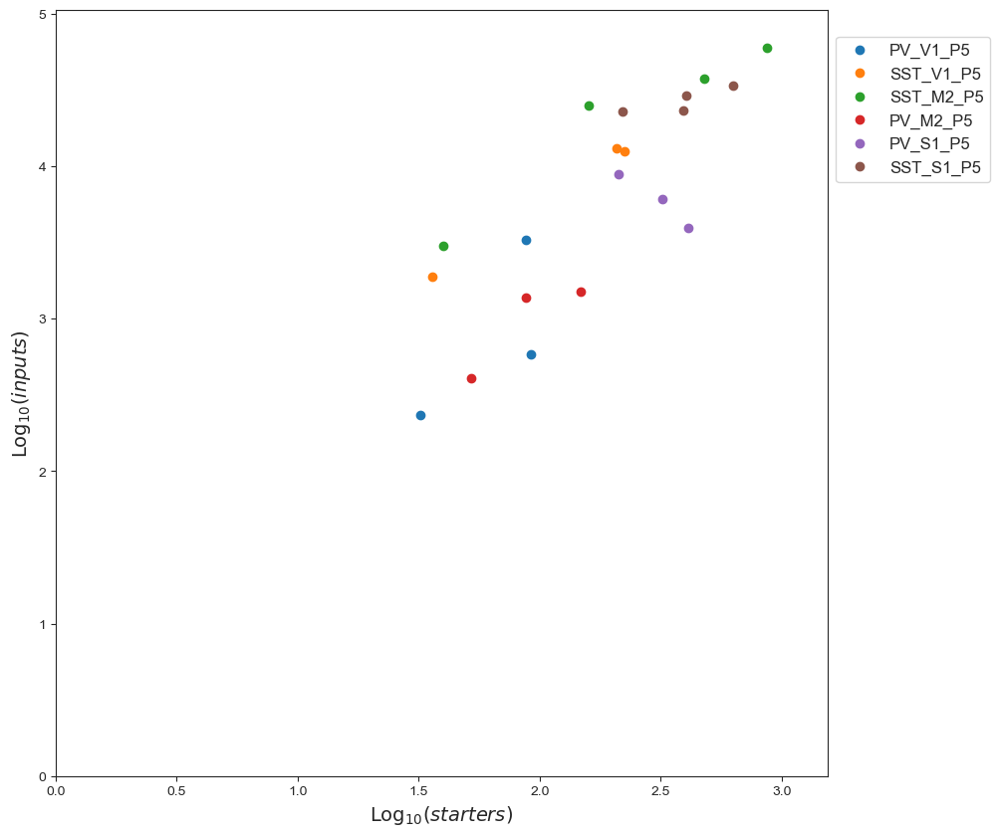

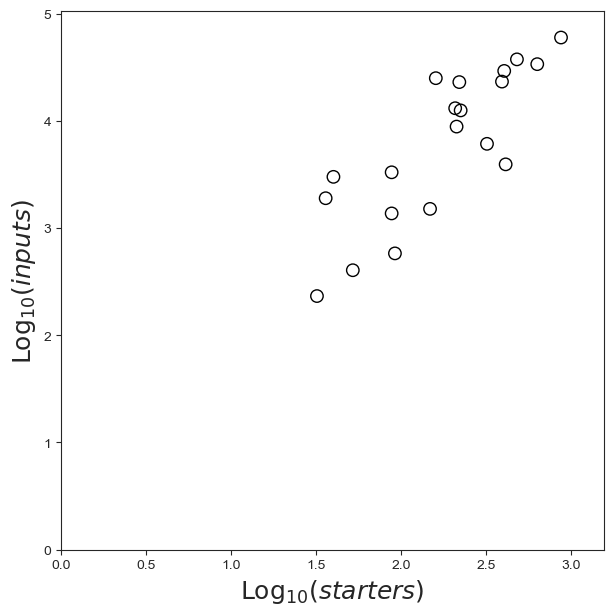

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


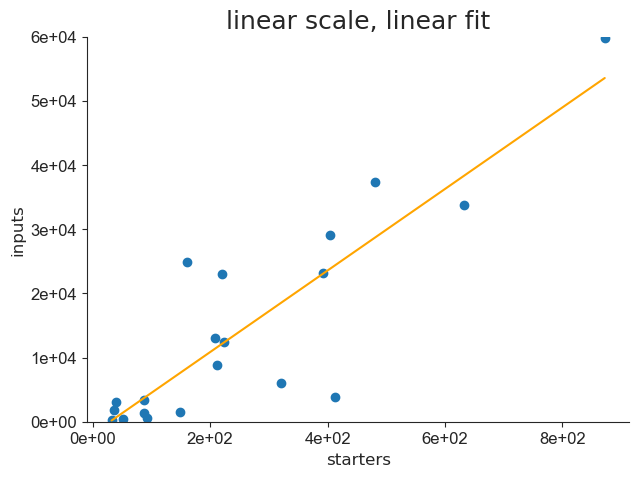

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


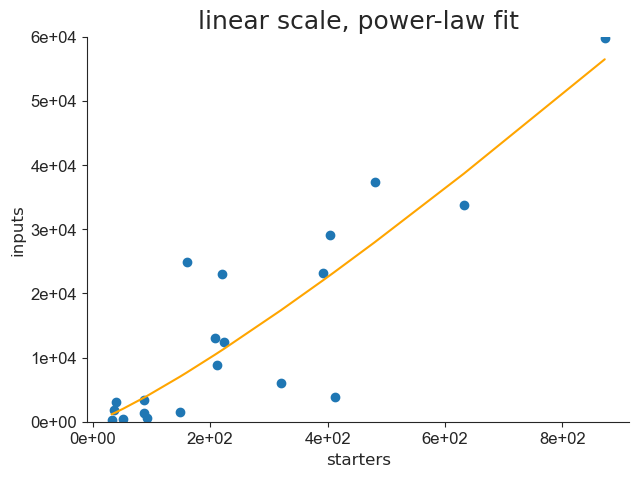

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


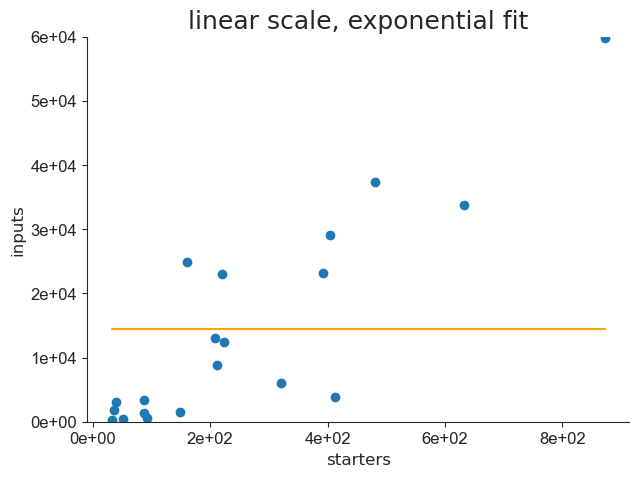

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


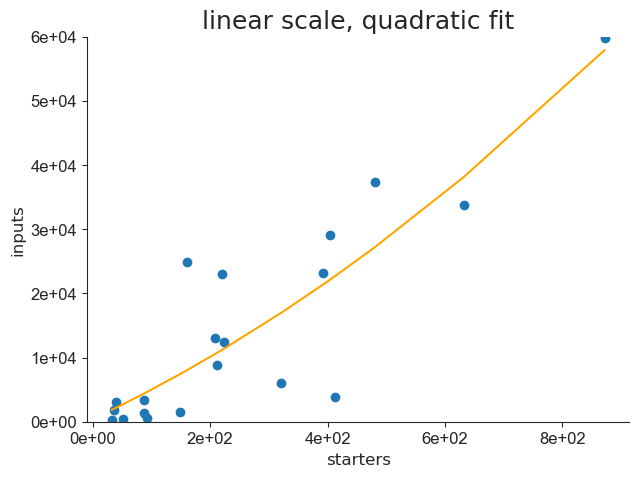

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


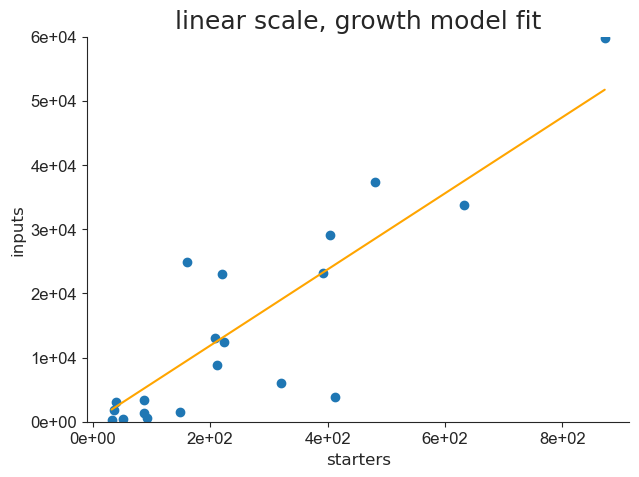

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


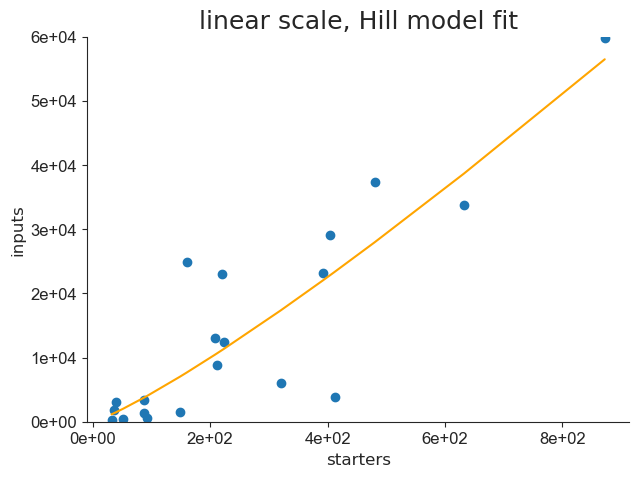

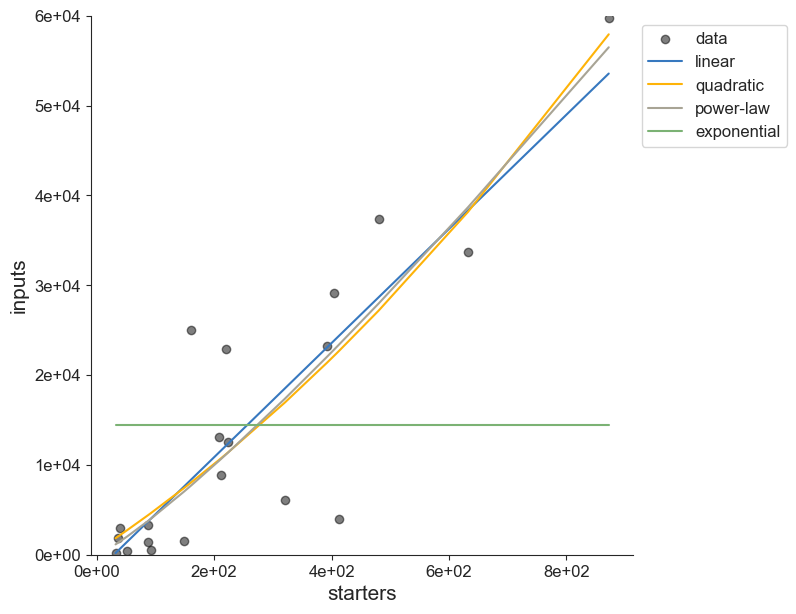

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


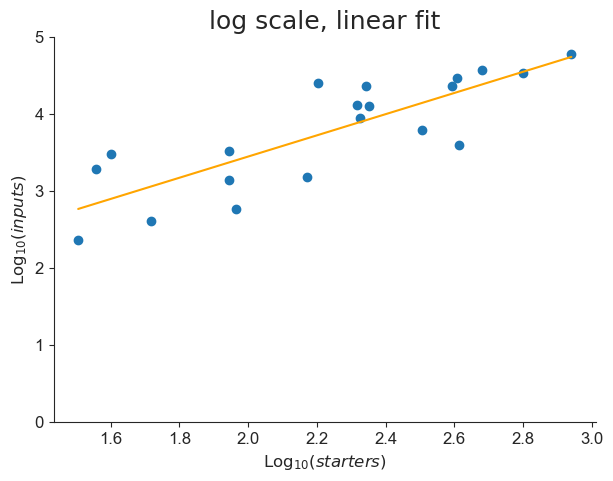

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


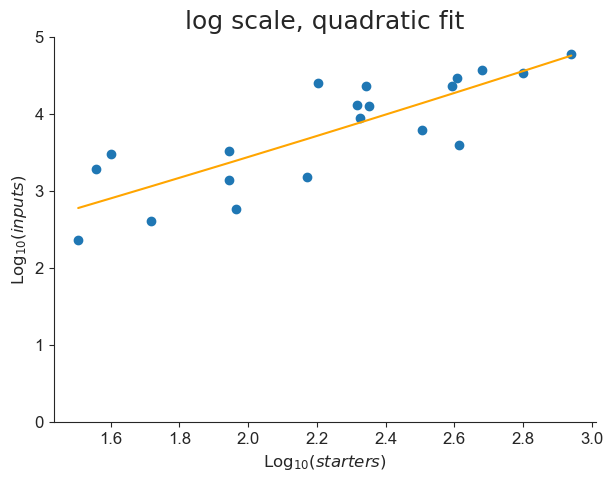

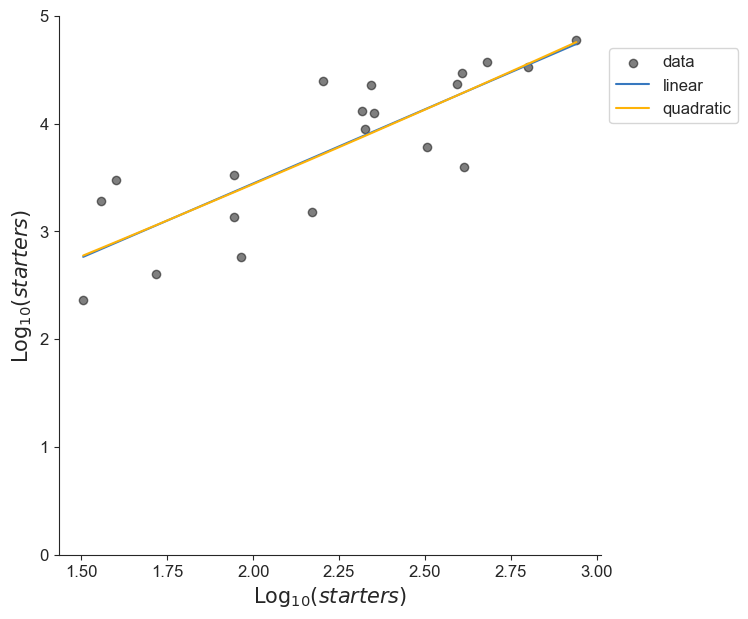

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


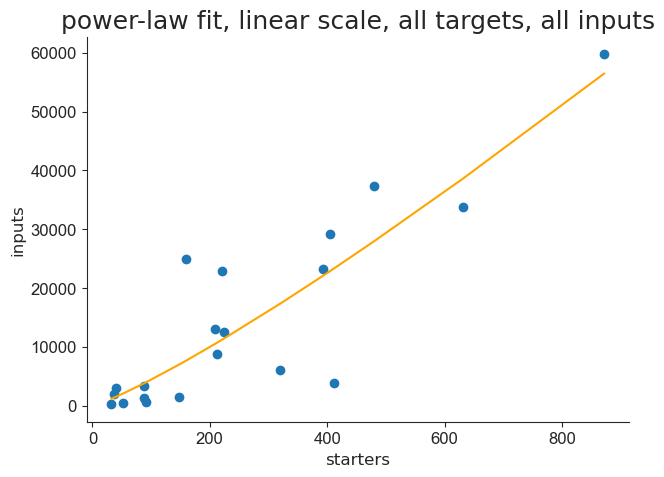

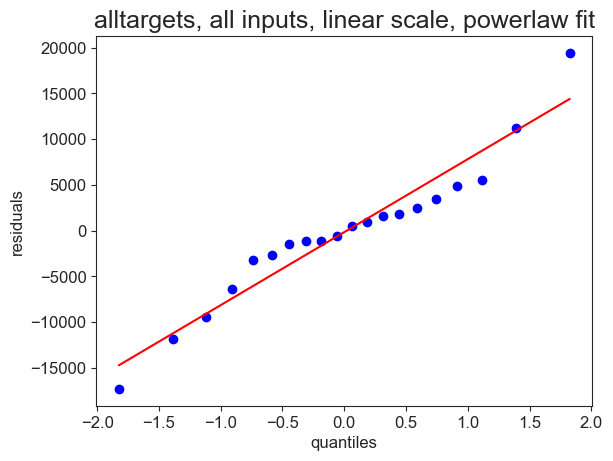

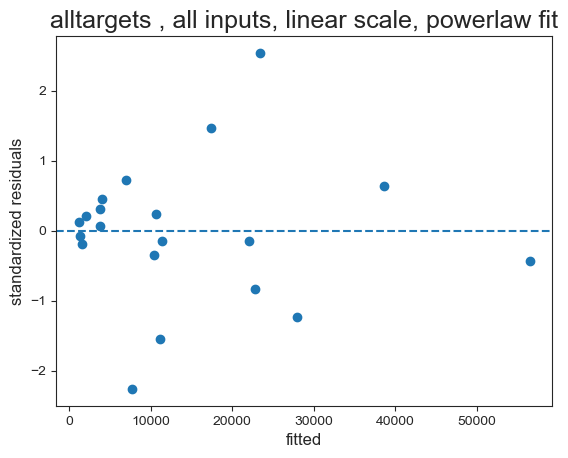

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


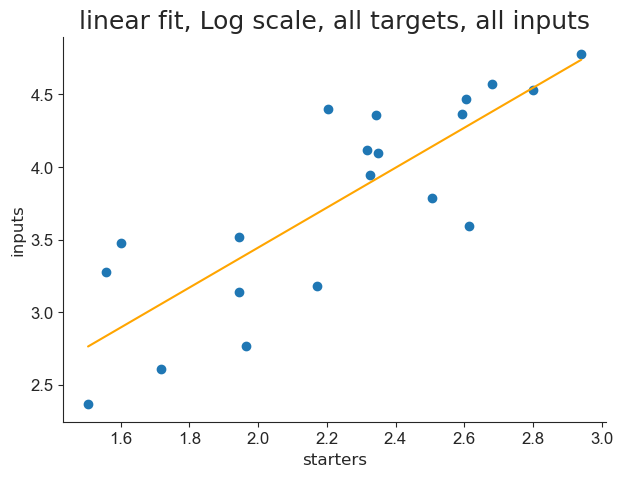

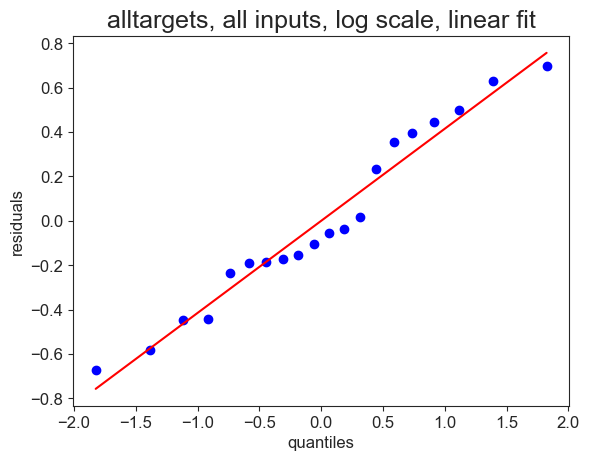

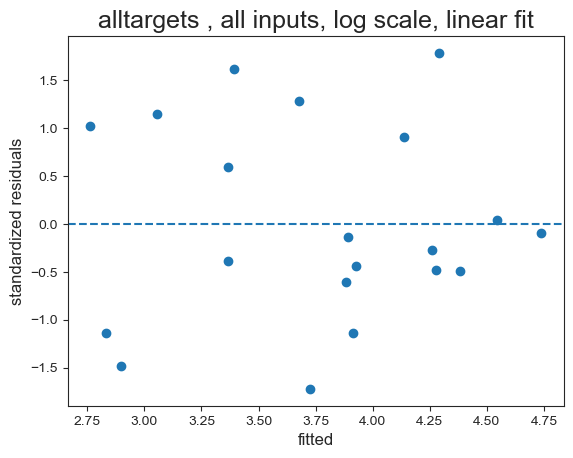

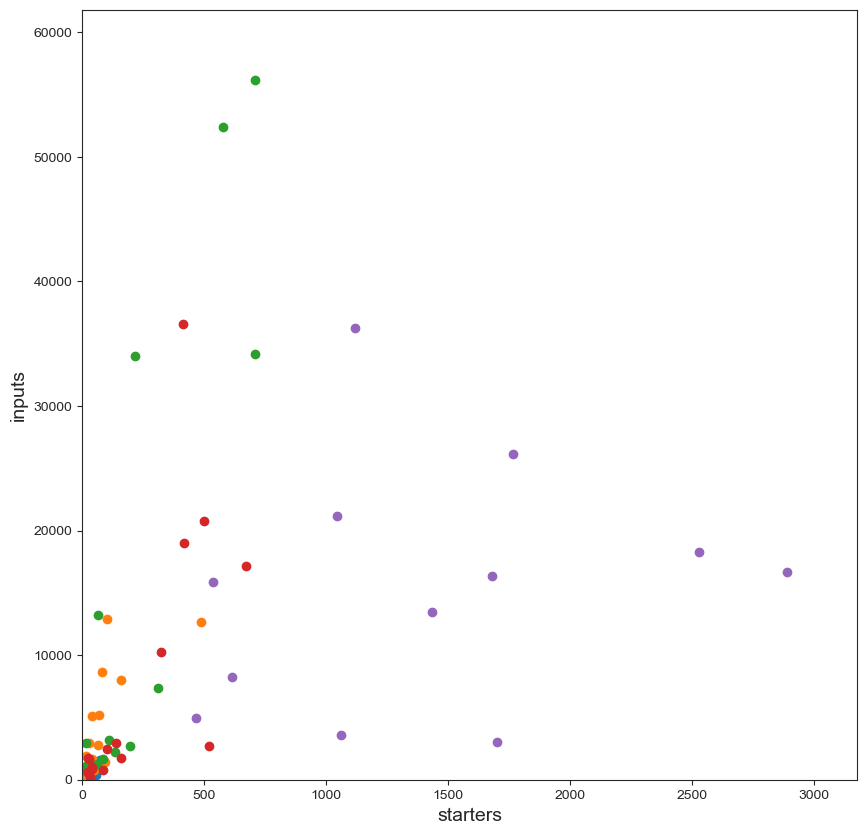

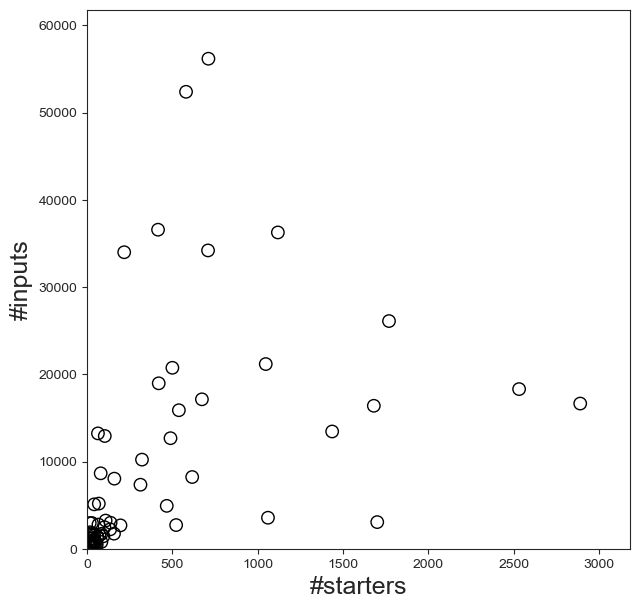

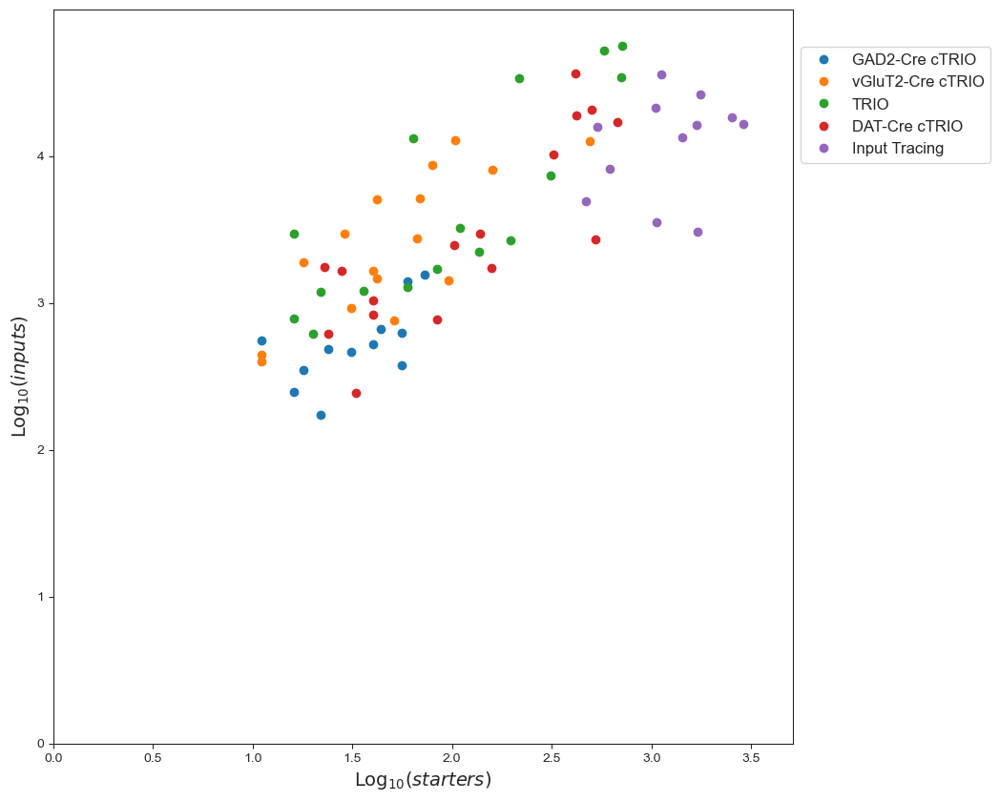

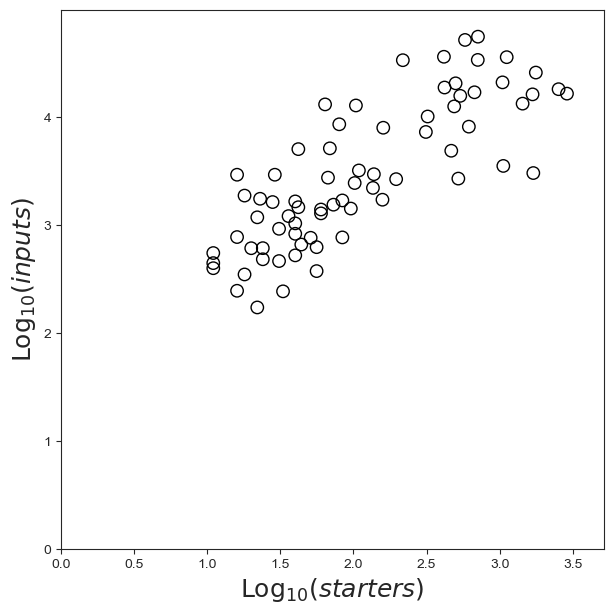

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


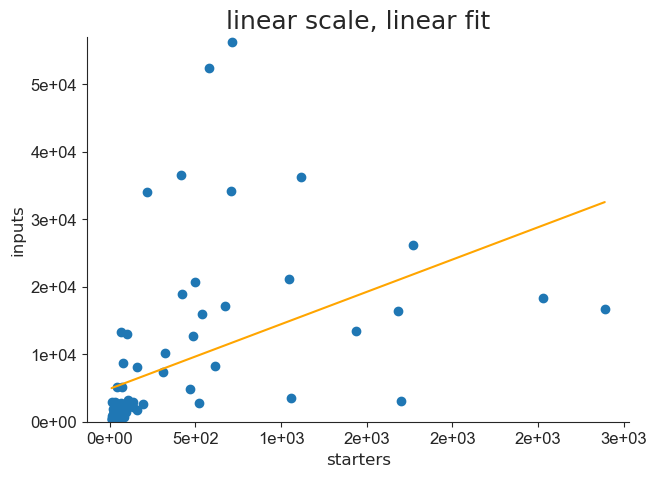

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


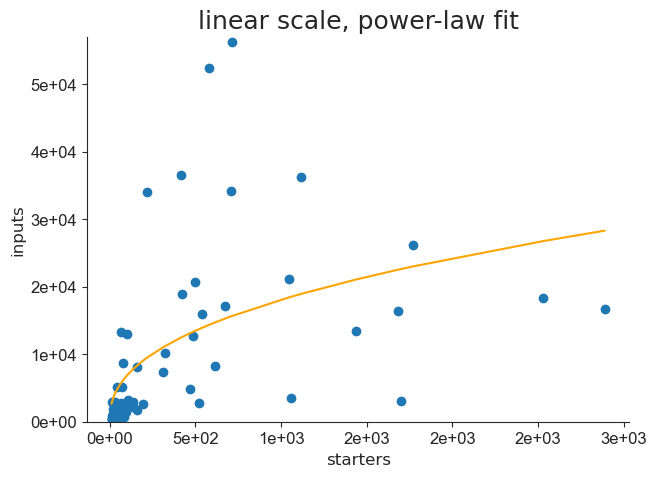

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


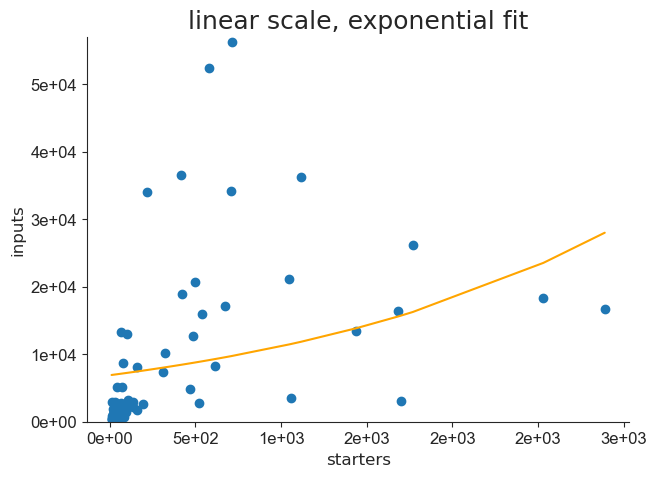

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


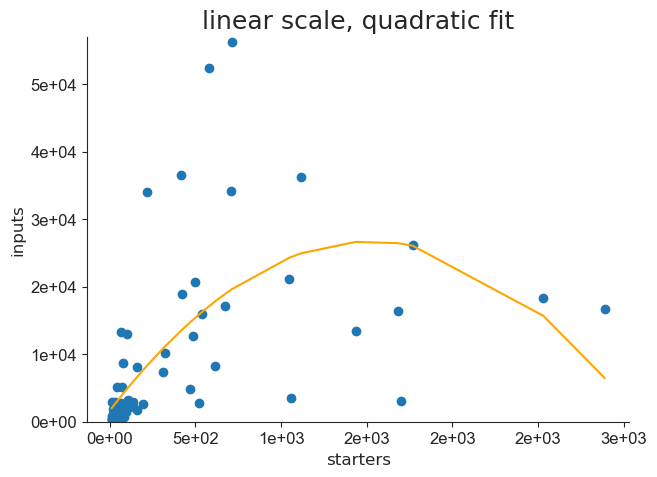

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


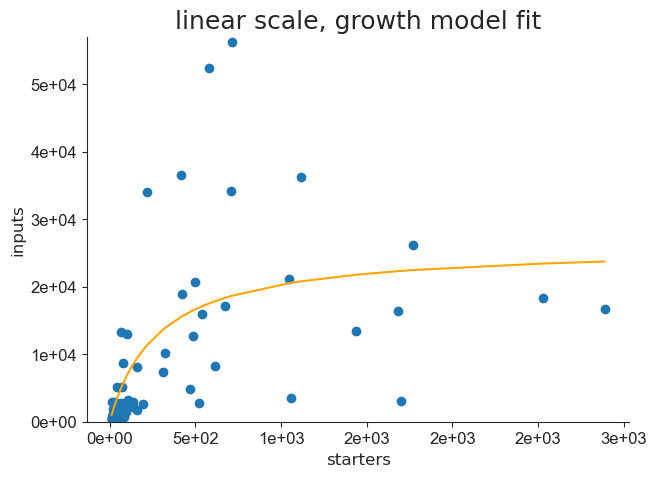

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


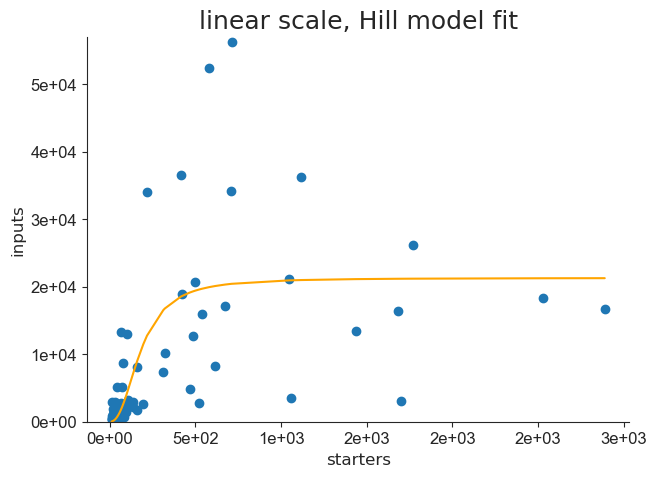

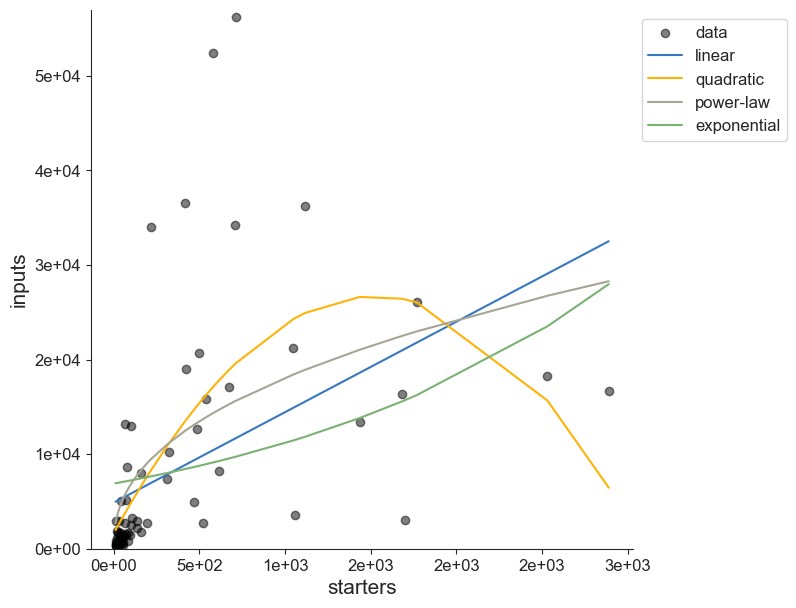

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


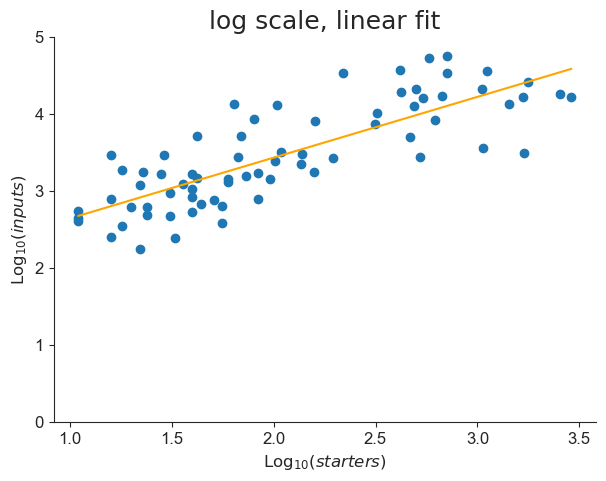

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


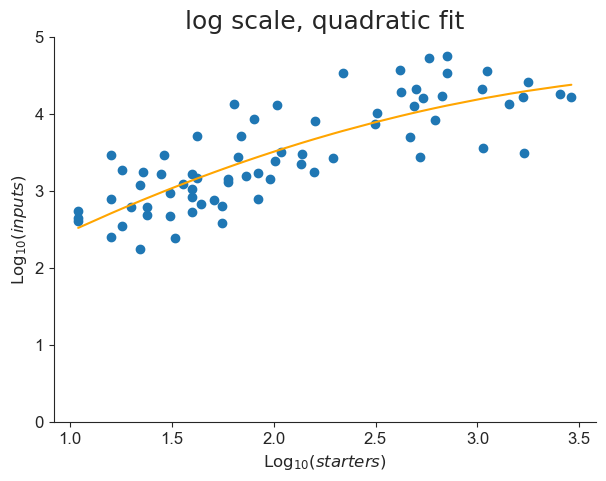

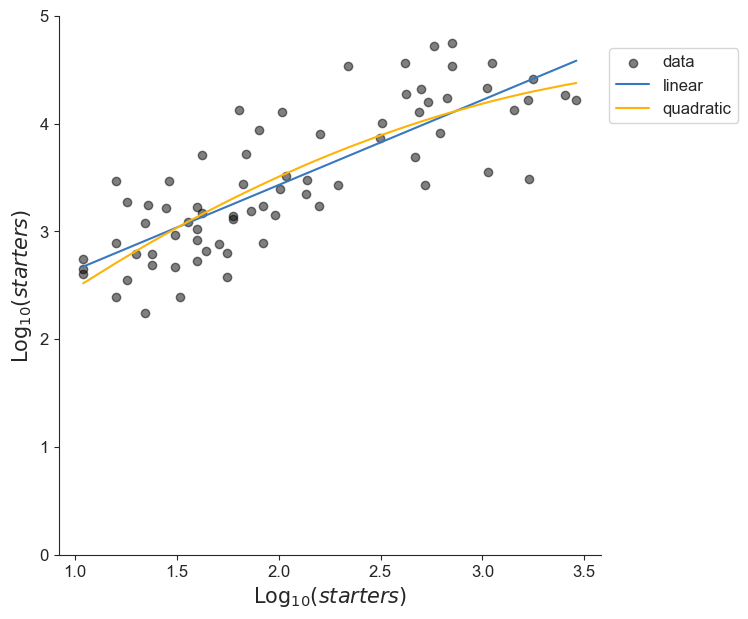

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


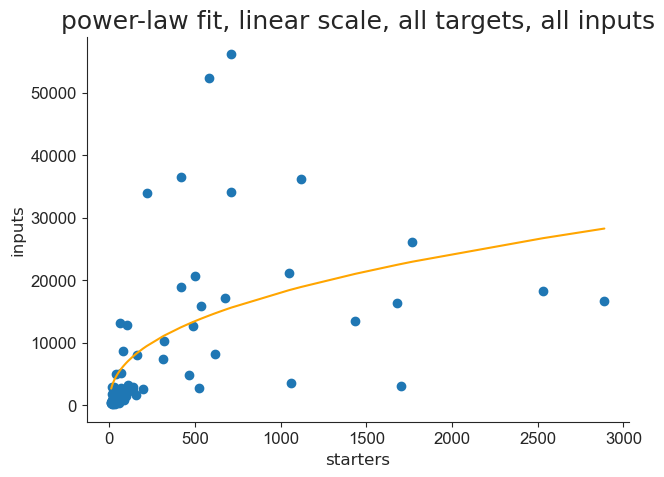

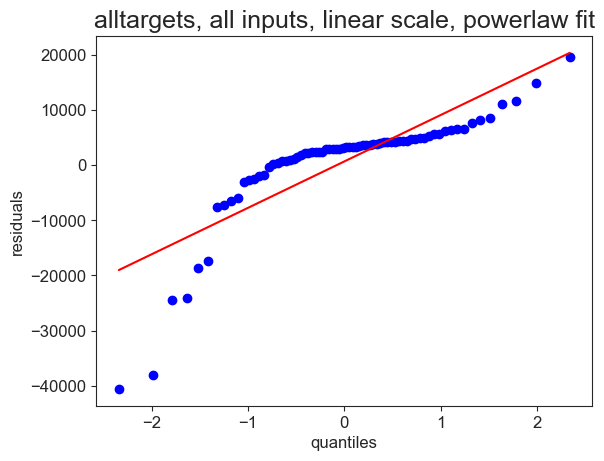

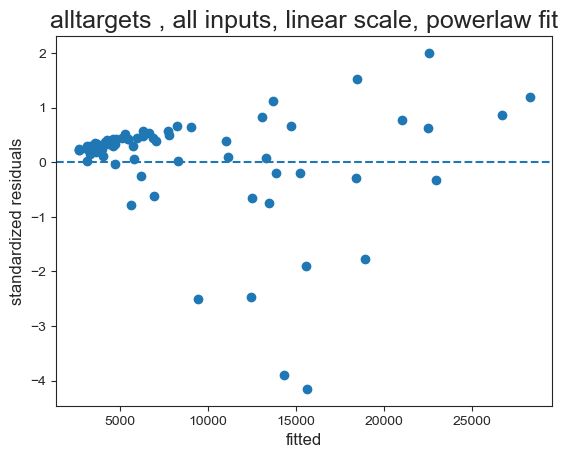

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


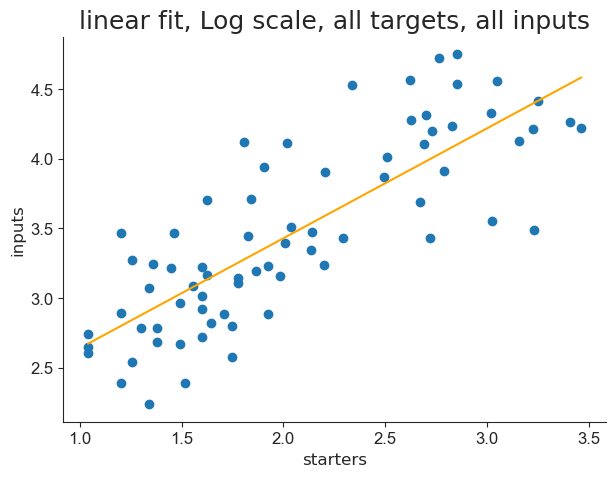

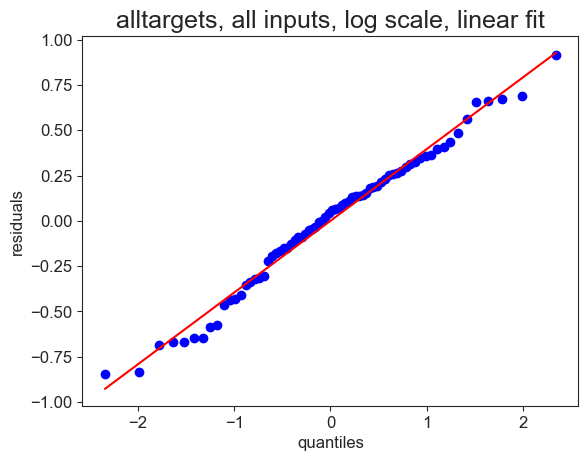

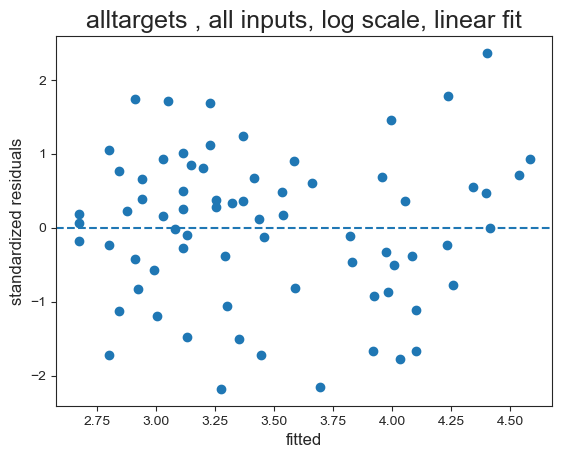

In [11]:
df_AICc = pd.DataFrame()
df_AICc_log = pd.DataFrame()
df_AICc_res = pd.DataFrame()
for thisdataset in datasets:
    print('Analyzing dataset : ', thisdataset)
    datapath = os.path.join(alldatapath, thisdataset)

    savepath = os.path.join(modelpath, thisdataset)
    hfn.dir_check(savepath)

    savepath_dataset = os.path.join(savepath, 'dataset')
    hfn.dir_check(savepath_dataset)

    savepath_lin_nls = os.path.join(savepath, 'lin_scale_nls_fit')
    hfn.dir_check(savepath_lin_nls)

    savepath_res_distr = os.path.join(savepath, 'residuals_distribution')
    hfn.dir_check(savepath_res_distr)

    savepath_log_lm = os.path.join(savepath, 'log_scale_fits')
    hfn.dir_check(savepath_log_lm)
    
    savepath_res_plots = os.path.join(savepath_res_distr, 'res_vs_fitted')
    hfn.dir_check(savepath_res_plots)

    savepath_res_qq = os.path.join(savepath_res_distr, 'qqplots')
    hfn.dir_check(savepath_res_qq)
    
    # Load data
    df_raw = aicfn.import_data(datapath).dropna()

    # log10 transform dataset
    df_log = hfn.make_log_df(df_raw)
    
    # Plot and save data
    plot_nls_cond(df_raw, savepath_lin_nls)
    plot_nls(df_raw, savepath_lin_nls)
    plot_ls_cond(df_log, savepath_log_lm)
    plot_ls(df_log, savepath_log_lm)
    
    # save datasets in csv format
    hfn.save_dflist_to_csv([df_raw, df_log], ['df_raw_all', 'df_log_all'], savepath_dataset)
    
    # do model selection analysis

    # first in linear scale
    save_lin_nls_all = os.path.join(savepath_lin_nls, 'all_exp')
    hfn.dir_check(save_lin_nls_all)
    if df_raw.input.max() >= 500:
        ymax_lin = math.ceil(df_raw.input.max() / 1000.0) * 1000.0
    elif df_raw.input.max() <= 10:
        ymax_lin = math.ceil(df_raw.input.max() / 10.0) * 10.0    
    else:
        ymax_lin = math.ceil(df_raw.input.max() / 100.0) * 100.0

    # Linear fit
    df_fit_lm_all, result_lm_all, pars_lm_all, AICc_lm_all, rsquare_lm_all = aicfn.fit_and_saveprms(df_raw['starter'].values, df_raw['input'].values, 'input', model_lm, 'linear scale, linear fit', 'linscale_lmfit', save_lin_nls_all, 0, ymax_lin, 0, 0)

    # Power-law fit
    df_fit_pl_all, result_pl_all, pars_pl_all, AICc_pl_all, rsquare_pl_all = aicfn.fit_and_saveprms(df_raw['starter'].values, df_raw['input'].values, 'input', model_pl, 'linear scale, power-law fit', 'linscale_plfit', save_lin_nls_all, 0, ymax_lin, 1, 0)

    # Exponential fit
    df_fit_exp_all,result_exp_all, pars_exp_all, AICc_exp_all, rsquare_exp_all = aicfn.fit_and_saveprms(df_raw['starter'].values, df_raw['input'].values, 'input', model_exp, 'linear scale, exponential fit', 'linscale_expfit', save_lin_nls_all, 0, ymax_lin, 1, 0)

    # Quadratic fit
    df_fit_quad_all,result_quad_all, pars_quad_all, AICc_quad_all, rsquare_quad_all = aicfn.fit_and_saveprms(df_raw['starter'].values, df_raw['input'].values, 'input', model_quad, 'linear scale, quadratic fit', 'linscale_quadfit', save_lin_nls_all, 0, ymax_lin, 0, 0)

    # Growth model
    df_fit_growth_all,result_growth_all, pars_growth_all, AICc_growth_all, rsquare_growth_all = aicfn.fit_and_saveprms(df_raw['starter'].values, df_raw['input'].values, 'input', gmodel, 'linear scale, growth model fit', 'linscale_growthfit', save_lin_nls_all, 0, ymax_lin, 0, 0)
    
    # Hill model
    df_fit_hill_all,result_hill_all, pars_hill_all, AICc_hill_all, rsquare_hill_all = aicfn.fit_and_saveprms(df_raw['starter'].values, df_raw['input'].values, 'input', hmodel, 'linear scale, Hill model fit', 'linscale_hillfit', save_lin_nls_all, 0, ymax_lin, 0, 0)

    
    # Make AICc summary dataframe
    df_AICc_all = pd.concat([df_fit_pl_all['area'], df_fit_lm_all['AICc'], df_fit_pl_all['AICc'], df_fit_exp_all['AICc'], df_fit_quad_all['AICc'], df_fit_growth_all['AICc'], df_fit_hill_all['AICc']], keys = ['area','linear', 'power-law', 'exponential', 'quadratic', 'growth', 'hill'], axis = 1)

    df_AICc_all.to_csv(os.path.join(save_lin_nls_all, 'AICc_models_linscale.csv'))
    df_AICc_all.to_hdf(os.path.join(save_lin_nls_all, 'AICc_models_linscale.h5'), key = 'df_AICc_all_linscale', mode ='w')
    
    df_AICc_all['dataset'] = thisdataset
    df_AICc = pd.concat([df_AICc_all, df_AICc], axis = 0)

    plot_models_ls(df_raw, result_lm_all, result_quad_all, result_pl_all, result_exp_all, save_lin_nls_all)

    # then in log scale
    save_log_lm_all = os.path.join(savepath_log_lm, 'all_exp')
    hfn.dir_check(save_log_lm_all)
    ymax_log = math.ceil(df_log.input.max())

    # linear fit
    df_fit_lm_log_all, result_lm_log_all, pars_lm_log_all, AICc_lm_log_all, rsquare_lm_log_all = aicfn.fit_and_saveprms(df_log['starter'].values, df_log['input'].values, 'input', model_lm, 'log scale, linear fit', 'logscale_lmfit', save_log_lm_all, 0, ymax_log, 0, 1)

    # quadratic fit
    df_fit_quad_log_all, result_quad_log_all, pars_quad_log_all, AICc_quad_log_all, rsquare_quad_log_all = aicfn.fit_and_saveprms(df_log['starter'].values, df_log['input'].values, 'input', model_quad, 'log scale, quadratic fit', 'logscale_quadfit', save_log_lm_all, 0, ymax_log, 0, 1)

    # Make AICc summary df
    df_AICc_log_all = pd.concat([df_fit_lm_log_all['area'], df_fit_lm_log_all['AICc'], df_fit_quad_log_all['AICc']], keys = ['area', 'linear', 'quadratic'], axis = 1)
    df_AICc_log_all.to_csv(os.path.join(save_log_lm_all,'AICc_models_logscale.csv'))
    df_AICc_log_all.to_hdf(os.path.join(save_log_lm_all, 'AICc_models_logscale.h5'), key = 'df_AICc_alltargets_logscale', mode ='w')
    df_AICc_log_all['dataset'] = thisdataset
    df_AICc_log = pd.concat([df_AICc_log_all, df_AICc_log], axis = 0)

    plot_models_nls(df_log, result_lm_log_all, result_quad_log_all, save_log_lm_all)    
    
    # Analyze residuals distribution
    df_results_all_pl = aicfn.analyze_residuals(df_raw, savepath_res_plots, savepath_res_qq, ['input'], 1, 0)
    df_results_all_lm = aicfn.analyze_residuals(df_raw, savepath_res_plots, savepath_res_qq, ['input'], 0, 0)
    # compare models
    df_AIC_res_all = pd.concat([df_results_all_lm['area'], df_results_all_lm['AICc'], df_results_all_pl['AICc']], keys = ['area', 'log-normal res', 'normal res'], axis = 1)
    df_AIC_res_all.set_index('area', inplace=True)
    df_AIC_res_all['deltaAICc'] = df_AIC_res_all['log-normal res'].sub(df_AIC_res_all['normal res'], axis = 0)    
    
    df_AIC_res_all.to_csv(os.path.join(savepath_res_distr, 'AICc_residual_distribution.csv'))
    df_AIC_res_all['dataset'] = thisdataset
    df_AICc_res = pd.concat([df_AIC_res_all, df_AICc_res], axis = 0)    
    

# Save concatenated AICc tables in one file

In [12]:
df_AICc = df_AICc.sort_values(by=['dataset'])

In [13]:
df_AICc.index = [x[5:] for x  in df_AICc['dataset']]

In [14]:
print(df_AICc[['linear', 'power-law', 'exponential', 'quadratic', 'growth','hill']].to_latex())

/var/folders/n7/dvksxsf55hxbzrrfm5gv88cwmxqfb7/T/ipykernel_34509/3067723605.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_AICc[['linear', 'power-law', 'exponential', 'quadratic', 'growth','hill']].to_latex())


\begin{tabular}{lrrrrrr}
\toprule
{} &       linear &    power-law &  exponential &    quadratic &       growth &         hill \\
\midrule
Allen              &    16.114338 &     8.955342 &    26.128915 &    23.272846 &    12.531131 &    25.047631 \\
Beier              &  1358.985496 &  1345.326071 &  1366.246750 &  1355.289074 &  1335.321701 &  1346.514396 \\
Brown              &   268.124917 &   266.062861 &   268.125434 &   275.877398 &   263.861725 &   280.137231 \\
Fu                 &   310.226366 &   309.144545 &   327.317616 &   323.567308 &   310.430980 &   325.371834 \\
Gehrlach           &   361.038548 &   359.764671 &   361.356435 &   375.269316 &   358.726539 &   374.314448 \\
Graham\_interneuron &   261.761358 &   261.165996 &   275.402864 &   276.352284 &   260.612376 &   276.649629 \\
Graham\_projection  &   263.938995 &   263.647182 &   276.724935 &   280.166333 &   264.559113 &   279.980544 \\
Hafner             &   122.089618 &   122.092150 &   131.224397 &   140.030

In [15]:
df_AICc_log.index = [x[5:] for x  in df_AICc_log['dataset']]

In [16]:
print(df_AICc_log[['linear', 'quadratic']].to_latex())

\begin{tabular}{lrr}
\toprule
{} &      linear &   quadratic \\
\midrule
Beier              & -114.373187 & -100.903414 \\
Pouchelon\_P5       &  -15.239958 &    0.911565 \\
Pouchelon          &  -55.030946 &  -41.239010 \\
Pouchelon\_P30      &  -37.818156 &  -21.783653 \\
Sunetal            &  -64.213833 &  -51.317324 \\
Fu                 &  -34.516675 &  -20.338976 \\
Allen              &  -42.216783 &  -26.068157 \\
Vinograd           &    1.035880 &   17.312906 \\
Wee                &  -42.017314 &  -26.318826 \\
Takatoh            &  -15.683305 &    0.657391 \\
Hafner             &   -8.081545 &    9.465050 \\
Graham\_interneuron &  -14.347322 &    0.902283 \\
Brown              &   -2.925455 &    9.042911 \\
Graham\_projection  &  -23.936116 &   -7.702440 \\
Gehrlach           &  -25.943468 &  -10.010015 \\
Kim\_2015           &  -12.008945 &    1.417439 \\
\bottomrule
\end{tabular}



/var/folders/n7/dvksxsf55hxbzrrfm5gv88cwmxqfb7/T/ipykernel_34509/1160562536.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_AICc_log[['linear', 'quadratic']].to_latex())


In [17]:
df_AICc_res.index = [x[5:] for x  in df_AICc_res['dataset']]
print(df_AICc_res[['log-normal res', 'normal res']].to_latex())

\begin{tabular}{lrr}
\toprule
{} &  log-normal res &   normal res \\
\midrule
Beier              &     1344.060347 &  1533.918617 \\
Pouchelon\_P5       &      406.930052 &   422.009726 \\
Pouchelon          &      858.760927 &   865.785113 \\
Pouchelon\_P30      &      439.539106 &   443.897464 \\
Sunetal            &      479.839960 &   504.336563 \\
Fu                 &      332.245345 &   340.050948 \\
Allen              &       57.428973 &    50.837884 \\
Vinograd           &      158.034475 &   162.694263 \\
Wee                &      355.482032 &   356.499863 \\
Takatoh            &      214.472050 &   216.934218 \\
Hafner             &      132.379668 &   131.957289 \\
Graham\_interneuron &      287.799067 &   281.470521 \\
Brown              &      281.756960 &   291.593140 \\
Graham\_projection  &      284.152096 &   286.539584 \\
Gehrlach           &      388.607535 &   396.132173 \\
Kim\_2015           &      194.413629 &   202.582805 \\
\bottomrule
\end{tabular}



/var/folders/n7/dvksxsf55hxbzrrfm5gv88cwmxqfb7/T/ipykernel_34509/2592082748.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_AICc_res[['log-normal res', 'normal res']].to_latex())


In [18]:
df_AICc.to_csv(os.path.join(modelpath, 'AICc_models_linscale.csv'))
df_AICc_log.to_csv(os.path.join(modelpath, 'AICc_models_logscale.csv'))
df_AICc_res.to_csv(os.path.join(modelpath, 'AICc_models_residuals.csv'))